# Построение регрессии для параметра gamma
# для клеточной линии S2
### Михаль Розенвальд
13.05.20

## Данные:

**Объекты** - bins - отрезки хромосомы длина 20 000

id: chrN_start_coordinate

8430

5950 - отобранных объектов с ненулевым значений целевой переменной.

**Признаки** - эпигенетика 

*исходный файл*: "S2-DRSC.merged.binned.txt"

5950 rows


**Целевая переменная** - гамма - значение параметра

*исходный файл*: "S2_20K.flG.foundG.txt"

Значения от 0 до 10 - не расбалансировано


В этом файле:

1. data - Данные о признаках объектов - ChipSeq
2. data_scaled - Нормализация признаков - вычитаем среднее и делим на дисперсию 
3. Визуализация признаков
4. target - целевая переменная
5. findEmptyChr(), cleanDataTarget() -- отчищение данных от нулевых хромосом с отсутствующим параметром гамма
6. data_scaled_clean, target_clean - обработанные данные
7. Линейная регрессия
8. Линейная регрессия с L2 регуляризацией - Rige
9. Линейная регрессия с L1 регуляризацией - Lasso
10. Решаюшие леса


Для оценки качества использовалась класс-валидация на 5 Folds.

Рассматриваются коэффиценты моделей для выделения "значимых" признаков.

In [13]:
! ls     ../../data/epigenetics/

s2_kc_bg_scaled_18_features.csv
s2_kc_bg_scaled_18_features_2901.csv
s2_kc_bg_scaled_34_overlap_features_2901.csv


In [14]:
bioset =  None  # take all data when bioset == None
# Selecting subset of features:
bioset = ['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac']

cell_line = 'is_kc' #'is_s2' #  'all' #  'is_bg' # 'all' # 'is_s2' # cell_line one of: 'is_s2', 'is_kc', 'is_bg',  or 'all'


data_features_path = '../../data/epigenetics/s2_kc_bg_scaled_18_features.csv'
target_path = "../../data/target/s2_kc_bg_clean_gamma_2901.csv"

In [15]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, KFold
from sklearn import linear_model, preprocessing, ensemble

In [16]:
results_pd = pd.DataFrame(columns=['model_name', 'wMSE_test_mean', 'wMSE_test_std', 
                                   'wMSE_train_mean', 'wMSE_train_std', 'comments', 'params',
                                   'MSE_test_mean', 'MSE_test_std', 'MSE_train_mean', 'MSE_train_std', 
                                   'r2_test', 'n_splits', 'model'])
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model


In [17]:
res_dict = {
    'model_name': 'test_model',
    'wMSE_test_mean': 160, 
    'wMSE_test_std': 1, 
    'wMSE_train_mean': 16, 
    'wMSE_train_std': 3,
    'comments': 'no coms', 
    'params': 'test_params = testtest',
}


# Data

In [18]:
su_drsc = pd.read_csv(data_features_path, index_col=0)
su_drsc.head()

,is_s2,is_kc,is_bg,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,...,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,1,0,0,chr2L,0,0.242773,-0.187138,-0.015891,0.059491,0.189992,...,0.050970,-0.001048,0.202823,-0.016338,0.054507,0.124710,-0.008189,0.596746,-0.206230,0.496281
1,1,0,0,chr2L,20000,0.048761,0.025261,-0.331142,-0.058042,0.410915,...,0.183057,0.392984,0.754869,-0.261296,-0.245977,0.597867,-0.241132,-0.201980,-0.373747,-0.075792
2,1,0,0,chr2L,40000,-0.180974,0.113429,-0.199996,-0.083374,0.109929,...,0.149762,-0.051553,-0.089343,-0.173464,-0.320367,0.580357,-0.245850,-0.311737,-0.349173,-0.012810
3,1,0,0,chr2L,60000,0.110472,0.124802,0.041301,0.246241,0.374247,...,0.447890,-0.199223,-0.114387,0.345721,0.238762,-0.400088,-0.134613,0.541448,0.261649,0.285790
4,1,0,0,chr2L,80000,0.085216,-0.114072,-0.317669,0.051119,-0.095739,...,-0.207146,-0.176570,-0.075462,0.183040,0.210215,-0.467417,0.338950,0.624765,0.140050,0.197589


In [19]:
su_drsc.shape

(17850, 23)

# Target data

In [20]:
gamma_S2 = pd.read_csv(target_path, header=0, index_col=0) #None,  names=["chrN","start_coord", "gamma" ]) 
print(gamma_S2.shape)
gamma_S2.head()

(17850, 6)


,is_s2,is_kc,is_bg,chrN,start_coord,gamma
0,1,0,0,chr2L,0,0.00
1,1,0,0,chr2L,20000,3.42
2,1,0,0,chr2L,40000,3.42
3,1,0,0,chr2L,60000,1.33
4,1,0,0,chr2L,80000,1.31


# Select cell line

In [21]:
if cell_line != 'all':
    su_drsc = su_drsc[su_drsc[cell_line] == 1]
    su_drsc = su_drsc.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    su_drsc.index = np.arange(su_drsc.shape[0])

    gamma_S2 = gamma_S2[gamma_S2[cell_line] == 1]
    gamma_S2 = gamma_S2.drop(['is_s2', 'is_kc', 'is_bg'], axis=1)
    gamma_S2.index = np.arange(gamma_S2.shape[0])

    
su_drsc.shape, gamma_S2.shape

((5950, 20), (5950, 3))

In [22]:
su_drsc.head()

,chrN,start_coord,Chriz,CTCF,Su(Hw),BEAF-32,CP190,GAF,H3K4me1,H3K4me2,H3K4me3,H3K9me2,H3K9me3,H3K27ac,H3K27me1,H3K27me3,H3K36me1,H3K36me3,H4K16ac,RNA-polymerase-II
0,chr2L,0,-0.019850,0.038032,-0.056595,0.298637,0.000000,-0.099482,0.004689,0.177677,0.050970,0.235358,0.637254,0.019221,0.036354,-0.073005,-0.103894,0.032595,-0.124902,0.109195
1,chr2L,20000,-0.236590,0.157963,0.054756,0.503653,0.000000,-0.001772,-0.063044,0.113414,0.183057,0.213256,0.756091,-0.015072,-0.102268,-0.062634,-0.337375,-0.012044,-0.294857,-0.029815
2,chr2L,40000,-0.151475,0.077399,-0.056118,0.396535,0.154223,-0.055430,-0.028262,0.134944,0.149762,0.151227,0.600573,-0.024660,-0.030891,-0.076149,-0.254632,-0.062465,-0.196305,-0.007934
3,chr2L,60000,0.116471,0.201770,0.032706,0.870563,8.552141,0.184890,0.410352,0.643001,0.447890,-0.008040,0.118202,0.073166,0.063865,-0.263155,0.171832,0.304503,0.308834,0.299604
4,chr2L,80000,0.144870,0.058860,-0.188161,-0.382789,0.035977,-0.075821,0.360726,-0.012117,-0.207146,0.007724,-0.158474,-0.049069,-0.001108,-0.183683,0.452140,0.300934,0.019428,0.106151


In [23]:
gamma_S2.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


# Select features from the bioset

In [24]:
if bioset:
    su_drsc = su_drsc[bioset]
su_drsc.shape

(5950, 7)

In [25]:
su_drsc

,chrN,start_coord,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,chr2L,0,-0.019850,0.038032,-0.056595,-0.073005,0.019221
1,chr2L,20000,-0.236590,0.157963,0.054756,-0.062634,-0.015072
2,chr2L,40000,-0.151475,0.077399,-0.056118,-0.076149,-0.024660
3,chr2L,60000,0.116471,0.201770,0.032706,-0.263155,0.073166
4,chr2L,80000,0.144870,0.058860,-0.188161,-0.183683,-0.049069
5,chr2L,100000,0.711212,0.437442,-0.145221,-0.596689,-0.044294
6,chr2L,120000,-0.026587,0.042538,0.009832,-0.405095,0.066934
7,chr2L,140000,0.502422,0.241890,-0.138030,-0.067535,-0.055981
8,chr2L,160000,0.000000,0.000000,0.000000,0.000000,0.000000
9,chr2L,180000,-0.097800,-0.003725,-0.166226,-0.456905,-0.085639


# Util Functions

In [26]:
def print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const):
    print('wMSE_train', np.round(np.mean(weighted_mse_train_all), 
                            decimals=2))
    print('wMSE_test', np.round(np.mean(weighted_mse_test_all), 
                          decimals=2))
    
    print('MSE_train', np.round(np.mean(MSE_train), decimals=2))
    print('MSE_test',np.round(np.mean(MSE_test), decimals=2))
    
    
    print('MAE_train', np.round(np.mean(mae_train), decimals=2))
    print('MAE_test',np.round(np.mean(mae_test), decimals=2))

    print('r2_test',np.round(np.mean(r2_test), decimals=2))

def plotData(data, ncols, nrows, method = 'hist', is_sharex=True, share_axes='y', bins=50, 
             plt_title='Histograms of data features', figsize=(20, 18), 
             cmin=None, cmax=None, min_val=None, max_val=None,
             verbose=False, fig=None, axes=None, alpha=0.6):
    if (min_val is None or  max_val is None):
        min_val, max_val = min(np.min(data)) - 3, max(np.max(data))
    if (fig is None or axes is None):
        if (share_axes == 'xy'):
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize, 
                                     sharex='all', sharey='all')
        else:
            fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=figsize,
                                     sharex=is_sharex)
    fig.set_figheight(24)
    i = 0
    for row in range(nrows):
        if i >= len(data.columns):
                break      
        for col in range(ncols):
            if i >= len(data.columns):
                break
            axes[row][col].set_title(data.columns[i], fontsize=22)       
            if method == "hist":
                if (cmin is not None and  cmax is not None):
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, range=(cmin, cmax), alpha=0.6, label=plt_title) # cmin=cmin, cmax=cmax)
                else:
                    axes[row][col].hist(data[[data.columns[i]]].values, bins=bins, alpha=alpha, label=plt_title) # cmin=cmin, cmax=cmax)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_xlim(min_val, max_val)
                
            elif method == "original":
                axes[row][col].scatter(np.arange(0, data.shape[0]), data[[data.columns[i]]].values,)
                if is_sharex or share_axes == 'xy':
                    axes[row][col].set_ylim(min_val, max_val)
                    
            if verbose:
                print(i)   
                print(data[[data.columns[i]]].mean(), data[[data.columns[i]]].std(), data[[data.columns[i]]].min(), data[[data.columns[i]]].max())
            i += 1
    plt.suptitle(plt_title, fontsize=30, y=0.92)
    # return fig, axes   



In [27]:
# find empty chromosoms: 
def findEmptyChr(data, print_info=True):
    print(data.head())

    chr_names = np.unique(data['chrN'])
    empty_chr_names = []
    num_empty_bins = 0

    for chr_i in chr_names:
        gamma_sum = sum(data[data.chrN == chr_i].gamma)
        if (print_info):
            print("---\nChr name =", chr_i)
            print("Sum of gamma values =", gamma_sum)
            print("Number of bins =", len(data[data.chrN == chr_i]))

        if (gamma_sum == 0):
            empty_chr_names.append(chr_i)
            num_empty_bins += len(data[data.chrN == chr_i])
        
    print("===")
    print("Total num of chr =", len(chr_names), "\n", chr_names)

    print("Num of empty chr =", len(empty_chr_names), "\n", empty_chr_names)

    print("Total num of chr =", len(data.index))
    print("Num of empty bins =", num_empty_bins)
    
    return(empty_chr_names, num_empty_bins)

def cleanDataTarget(data, target, print_info=True):
    ''' Remove empty (zeros) chromosomes from data and target '''
    
    empty_chr_names, num_empty_bins = findEmptyChr(target, print_info)
    return (data[~target.chrN.isin(empty_chr_names)], target[~target.chrN.isin(empty_chr_names)], empty_chr_names, num_empty_bins)


# print(sum(target[target.chrN.isin(empty_chr_names)].gamma))  # selected zero chr sum
# print(sum(target[~target.chrN.isin(empty_chr_names)].gamma))  # total sum

# target[~target.chrN.isin(empty_chr_names)]


# K-fold cross Validation

In [28]:
def train_test_KFold(X, y, model, model_name, results_pd, n_splits=10, random_state=16, shuffle=True):
    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []
    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Train the model using the training sets
        model.fit(X_train, y_train)

        # Make predictions using the train set
        y_pred_train = model.predict(X_train)

        # Make predictions using the testing set
        y_pred = model.predict(X_test)

        MSE_train.append(mean_squared_error(y_train, y_pred_train))
        MSE_test.append(mean_squared_error(y_test, y_pred))
        r2_test.append(r2_score(y_test, y_pred))

        coefs.append(model.coef_)
        coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train, 
                                                                          y_test, 
                                                                          model)
            
        weighted_mse_test_all.append(weighted_mse_test)
        weighted_mse_train_all.append(weighted_mse_train)

    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)

    coefs = np.array(coefs)
    coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all),
          "\n MSE mean train:", np.mean(MSE_train), "\n")

    # The mean squared error
    print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), 
          "\n MSE mean test: " , np.mean(MSE_test), "\n")

    # The mean squared error
    print("Root of MSE on Test: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), 
          "\n", np.sqrt(np.mean(MSE_test)), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), 
          "\n r2_test:" , np.mean(r2_test), "\n")
    
    print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

    coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
    print(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]])
    
    res_dict = {
        'model_name': model_name,
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

    results_pd = results_pd.append(res_dict, ignore_index=True)
    results_pd
    
    return model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, results_pd

# wieghted MSE

In [29]:
def cout_errors_lin(X_train,  X_test, y_train, y_test, model):
    x_train,  x_test = X_train,  X_test
    # y_train, y_test = y_train.values, y_test.values

    # ------------PREDICTION-------------------------------------------------------------

    y_pred_test = model.predict(x_test)
    y_pred_train = model.predict(x_train)
    # y_pred_val = model.predict(x_val)

    # -------------------------------------------------------------------------

    #          TEST PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TEST PREDICTION Error")
    weighted_mse_test = weighted_mse_cout(y_true = y_test, y_pred = y_pred_test)
    rmse_test = rmse_cout(y_true = y_test, y_pred = y_pred_test)
    mae_test = mae_cout(y_true = y_test, y_pred = y_pred_test)
    print("weighted_mse_test:", weighted_mse_test, "\n\n")

    # -------------------------------------------------------------------------

    #          TRAIN PREDICTION Error
    # -------------------------------------------------------------------------

    # ! Count Error !
    print(" TRAIN PREDICTION Error")
    weighted_mse_train = weighted_mse_cout(y_true = y_train, y_pred = y_pred_train)
    rmse_train = rmse_cout(y_true = y_train, y_pred = y_pred_train)
    mae_train = mae_cout(y_true = y_train, y_pred = y_pred_train)

    print("weighted_mse_train:", weighted_mse_train, "\n\n")

    # -------------------------------------------------------------------------

    #          VAL PREDICTION Error
    # -------------------------------------------------------------------------

    # # ! Count Error !
    # print(" VAL PREDICTION Error" )

    # rmse_val = rmse_cout(y_true = y_val, y_pred = y_pred_val)
    # weighted_mse_val = weighted_mse_cout(y_true = y_val, y_pred = y_pred_val)
    # mae_val = mae_cout(y_true = y_val, y_pred = y_pred_val)

    # print("rmse_val_preds:", rmse_val, "\n\n")

    # -------------------------------------------------------------------------

    # TEST Const Error

    # -------------------------------------------------------------------------


    print(" CONSTANT pred Error:" )
    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )

    weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)
    rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
    mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)
    print("weighted_mse_test_const: ", weighted_mse_test_const )


    # -------------------------------------------------------------------------
    # -------------------------------------------------------------------------

    #     ERROR by TARGET value :  

    # -------------------------------------------------------------------------


    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_plot_test_errors(model, x_test, y_test)


    mae_errors_by_grid_const, rmse_errors_by_grid_const, \
        weig_mse_errors_by_grid_const, \
            objs_by_grid_const = count_errors_by_target_grid(y_pred=const_pred_test, y_true=y_test)

    #     print(mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, objs_by_grid_const)


    return weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const
        # , \
#                 sequenc_len, overlop_len, num_epochs, BATCH_SIZE_original, \
#                 num_lstm_units, output_size, cell, \
#                 duration, \
#                 mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, \
#                 mae_errors_by_grid_const, rmse_errors_by_grid_const, weig_mse_errors_by_grid_const, \
#                 objs_by_grid_const, \
#                 history, loss_train, losss_val, mse_train_hist, mse_val_hist
        
    

In [30]:
def weighted_mse(y_true, y_pred):   
    
    diff = ( (y_true - y_pred)**2 ) * (11 - y_true)  / 11
    return  K.mean(diff)  # K.mean(K.sum(diff, axis = -1)) # 

def count_errors_by_target_grid(y_true, y_pred):
    
    if (len(y_true) != len(y_pred)) :
         return "ERROR of prediction and true size"
    
    mae_errors_by_grid = np.array([0]*11, dtype=float)
    mae_errors_by_grid
    
    rmse_errors_by_grid = np.array([0]*11, dtype=float)
    rmse_errors_by_grid
    
    weig_mse_errors_by_grid = np.array([0]*11, dtype=float)
    weig_mse_errors_by_grid
    
    objs_by_grid = np.array([0]*11, dtype=float)
    objs_by_grid

    for i in range(len(y_true)): # K.int_shape(y_true)):

    #     print(y_true[i], int(y_true[i]), np.abs(y_true[i] - y_pred[i]), errors_by_diaposone[int(y_true[i])] )
        mae_errors_by_grid[int(y_true[i])] += np.abs(y_true[i] - y_pred[i]) # (y_true[i] - y_pred[i])**2 # mse

        rmse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 # mse
        
        weig_mse_errors_by_grid[int(y_true[i])] += (y_true[i] - y_pred[i])**2 * (11 - y_true[i]) 
       
        objs_by_grid[int(y_true[i])] += 1
      
    mae_errors_by_grid /= objs_by_grid

    rmse_errors_by_grid /= objs_by_grid
    rmse_errors_by_grid = np.sqrt(rmse_errors_by_grid)
    
    weig_mse_errors_by_grid /= objs_by_grid
        
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

def mae_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.mean(np.abs( y_true - y_pred ) )

def rmse_cout(y_true, y_pred):
    y_pred = np.hstack(y_pred)
    
    return np.sqrt(np.mean( (y_true - y_pred)**2 ) )

def weighted_mse_cout(y_true, y_pred):
#     if ((y_pred).shape !=  y_true.shape ):
    y_pred = np.hstack(y_pred)
        
#     print(y_true, y_pred)
#     print("(y_true - y_pred) = ", (y_true - y_pred), "\n")
#     print("(y_true - y_pred)**2 = ", (y_true - y_pred)**2, "\n")
#     print("(11 - y_true) = ",(11 - y_true), "\n")
#     print("(y_true - y_pred)**2 * (11 - y_true) =  ", ((y_true - y_pred)**2) * (11 - y_true), "\n")
    
    return np.mean( ((y_true - y_pred)**2) * (11 - y_true) ) / 11 




def plot_train_res(history):
    # list all data in history
    print(history.history.keys())
    # summarize history for loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss - weighted mse')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    # summarize history for MSE
    plt.plot(history.history['mean_squared_error'])
    plt.plot(history.history['val_mean_squared_error'])
    plt.title('model mean squared error')
    plt.ylabel('mse')
    plt.xlabel('epoch')
    plt.legend(['train', 'val'], loc='upper left')
    plt.show()
    
    

# y_range =t = np.arange(0.01, 5.0, 0.01)
# s1 = np.sin(2 * np.pi * t)
# s2 = np.exp(-t)
# s3 = np.sin(4 * np.pi * t)

def count_plot_test_errors(model, x_test, y_test):
    
    y_pred_test = model.predict(x_test)
   
    print("test sizes = ", len(y_test), len(x_test), len(y_pred_test))
#     print(count_errors_by_target_grid(y_test, y_pred_test))
#     print(mae_errors_by_grid, rmse_errors_by_grid, \
#         weig_mse_errors_by_grid, objs_by_grid )

    mae_errors_by_grid, rmse_errors_by_grid, \
        weig_mse_errors_by_grid, objs_by_grid = count_errors_by_target_grid(y_test, y_pred_test)
        
        
    y_range = np.arange(0, 11)

    # figsize=(15,15)
    f, axs = plt.subplots(figsize=(7,10))
    axs.set_ylabel('error')


    ax1 = plt.subplot(311) #, sharex=ax1)
    plt.bar(y_range, mae_errors_by_grid)
    # plt.setp(ax1.get_xticklabels(), fontsize=6)
    ax1.set_title('MAE error by target value')

    # share x only
    ax2 = plt.subplot(312)#, sharex=ax1)
    plt.bar(y_range, rmse_errors_by_grid)
    # make these tick labels invisible
    # plt.setp(ax2.get_xticklabels(), visible=False)
    ax2.set_title('RMSE error by target value')

    # share x and y
    ax3 = plt.subplot(313)#, sharex=ax1, sharey=ax1)
    plt.bar(y_range, weig_mse_errors_by_grid)

    ax3.set_title('Weighted MSE (custom) error by target value')

    # plt.xlim(0.01, 5.0)
    plt.show()
    
    return mae_errors_by_grid, rmse_errors_by_grid, weig_mse_errors_by_grid, objs_by_grid

# Data standartization

In [31]:
data = su_drsc.copy()
data.shape

(5950, 7)

In [32]:
data.drop(["chrN" , "start_coord"], axis=1, inplace=True)
data.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,-0.019850,0.038032,-0.056595,-0.073005,0.019221
1,-0.236590,0.157963,0.054756,-0.062634,-0.015072
2,-0.151475,0.077399,-0.056118,-0.076149,-0.024660
3,0.116471,0.201770,0.032706,-0.263155,0.073166
4,0.144870,0.058860,-0.188161,-0.183683,-0.049069


In [33]:
data_scaled = preprocessing.scale(data, axis=0, with_mean=True, with_std=True)
data_scaled.shape, data_scaled

((5950, 5),
 array([[-0.05526516,  0.17623647, -0.3827252 , -0.27304942,  0.28961633],
        [-0.88648345,  0.97782948,  0.25623235, -0.24352024, -0.21070221],
        [-0.56006128,  0.43935737, -0.37998832, -0.28200194, -0.35059295],
        ...,
        [-0.40312441, -0.38283939, -0.18166177, -0.20156447, -0.22485724],
        [-0.3406396 , -0.19082234, -0.32369045, -0.16129031, -0.46601794],
        [ 1.49338312,  2.35525213, -0.66212296, -0.63589231, -0.4686957 ]]))

In [34]:
data_scaled = pd.DataFrame(data_scaled)
data_scaled.head()

,0,1,2,3,4
0,-0.055265,0.176236,-0.382725,-0.273049,0.289616
1,-0.886483,0.977829,0.256232,-0.243520,-0.210702
2,-0.560061,0.439357,-0.379988,-0.282002,-0.350593
3,0.467538,1.270631,0.129706,-0.814469,1.076657
4,0.576448,0.315444,-1.137679,-0.588185,-0.706711


In [35]:
data_scaled.columns = su_drsc.columns[2:]
data_scaled.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,-0.055265,0.176236,-0.382725,-0.273049,0.289616
1,-0.886483,0.977829,0.256232,-0.243520,-0.210702
2,-0.560061,0.439357,-0.379988,-0.282002,-0.350593
3,0.467538,1.270631,0.129706,-0.814469,1.076657
4,0.576448,0.315444,-1.137679,-0.588185,-0.706711


## Explore features distribution

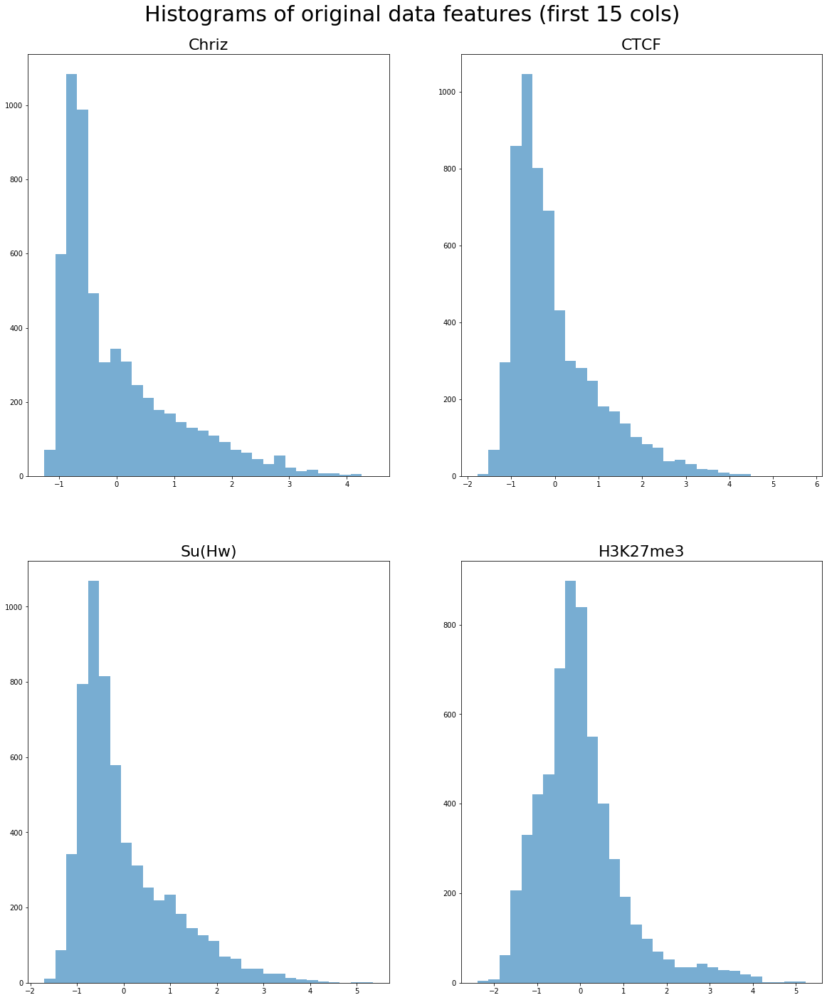

In [36]:
ncols = 2
nrows = 2
plotData(pd.DataFrame(data_scaled), ncols, nrows, bins=30, method = 'hist', is_sharex=False, plt_title='Histograms of original data features (first 15 cols)')

# target - gamma

# Explore target

In [37]:
target = gamma_S2.copy()
target.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


In [38]:
# np.unique(target.gamma)

Text(0.5, 1.0, 'gamma values for all bins')

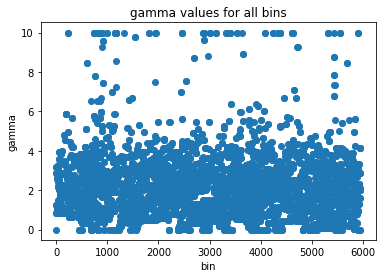

In [39]:
plt.scatter(np.arange(len(target.gamma)), target.gamma) # target
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('gamma values for all bins')

Text(0.5, 1.0, 'Distribution of gamma values for all bins')

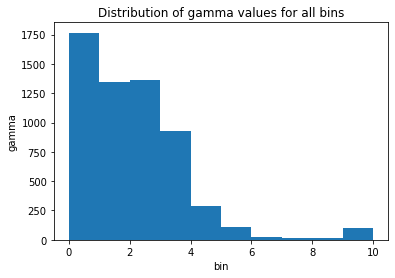

In [40]:
plt.hist(target.gamma)
plt.xlabel('bin')
plt.ylabel('gamma')
plt.title('Distribution of gamma values for all bins')

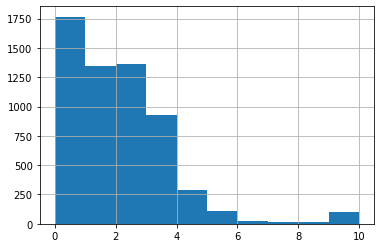

In [41]:
target.gamma.hist()

Log scale

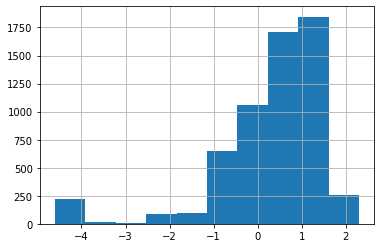

In [42]:
(np.log(0.01+target.gamma)).hist()

# Clean Data  from empty chromosomes

In [43]:
data_scaled_clean, target_clean, empty_chr_names, num_empty_bins = data_scaled, target, [], []
# cleanDataTarget(data_scaled, target)

data_scaled_clean.shape, target_clean.shape

((5950, 5), (5950, 3))

In [44]:
data_scaled_clean.head()

,Chriz,CTCF,Su(Hw),H3K27me3,H3K27ac
0,-0.055265,0.176236,-0.382725,-0.273049,0.289616
1,-0.886483,0.977829,0.256232,-0.243520,-0.210702
2,-0.560061,0.439357,-0.379988,-0.282002,-0.350593
3,0.467538,1.270631,0.129706,-0.814469,1.076657
4,0.576448,0.315444,-1.137679,-0.588185,-0.706711


In [45]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


Target distribution

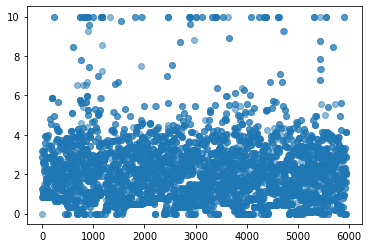

In [46]:
plt.scatter(np.arange(len(target_clean)),  target_clean.gamma, alpha=0.5)

(array([1766., 1347., 1362.,  927.,  291.,  106.,   27.,   14.,   12.,
          98.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

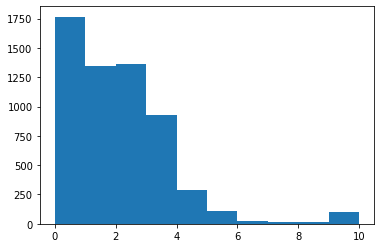

In [47]:
plt.hist(target_clean.gamma)

Log scale

(array([ 222.,    0.,   11.,    5.,   44.,  127.,  679., 1516., 2793.,
         553.]),
 array([-6.90775528, -5.98671124, -5.06566721, -4.14462317, -3.22357913,
        -2.3025351 , -1.38149106, -0.46044702,  0.46059701,  1.38164105,
         2.30268509]),
 <a list of 10 Patch objects>)

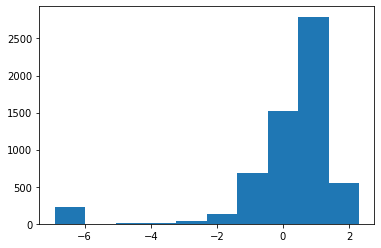

In [48]:
plt.hist(np.log(0.001 + target_clean.gamma))

In [49]:
target.shape, target.head()

((5950, 3),     chrN  start_coord  gamma
 0  chr2L            0   0.00
 1  chr2L        20000   2.85
 2  chr2L        40000   2.85
 3  chr2L        60000   0.83
 4  chr2L        80000   0.83)

# data_scaled_clean, target_clean - prossesed data

# Train Test Split

In [50]:
data = data_scaled_clean 
target = target_clean['gamma']

In [51]:
X, y = data_scaled_clean, target_clean['gamma']
X.shape, y.shape

((5950, 5), (5950,))

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=16)

X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((4165, 5), (1785, 5), (4165,), (1785,))

# Linear Regression

In [53]:
%time

# Create linear regression object
lin_reg = linear_model.LinearRegression() 

# Train the model using the training sets
lin_reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg.predict(X_test)

model = lin_reg

CPU times: user 2 µs, sys: 1e+03 ns, total: 3 µs
Wall time: 5.01 µs


 TEST PREDICTION Error
weighted_mse_test: 1.1029067445624081 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1735964978002849 


 CONSTANT pred Error:
weighted_mse_test_const:  1.529260633960329
test sizes =  1785 1785 1785


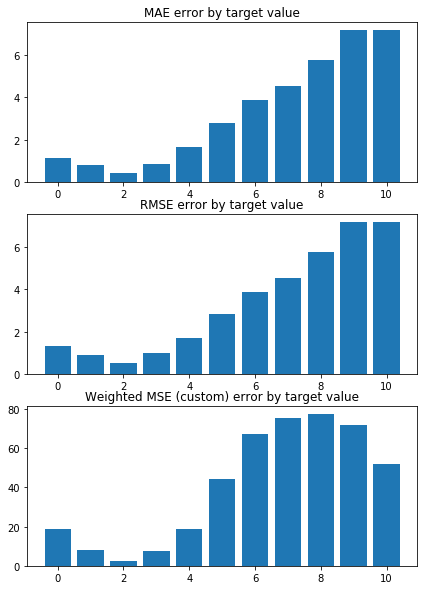

In [54]:
# Make predictions using the testing set
y_pred_train = lin_reg.predict(X_train)

weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  
                                                                          X_test,
                                                                          y_train.values, 
                                                                          y_test.values, 
                                                                          model)

In [55]:
# The coefficients
print('Coefficients: \n', lin_reg.coef_[:20])

Coefficients: 
 [-0.36906735 -0.47153267  0.05574333 -0.12908645  0.01377677]


In [56]:
coef = lin_reg.coef_

(array([1., 1., 0., 0., 0., 0., 1., 0., 0., 2.]),
 array([-0.47153267, -0.41880507, -0.36607747, -0.31334987, -0.26062227,
        -0.20789467, -0.15516707, -0.10243947, -0.04971187,  0.00301573,
         0.05574333]),
 <a list of 10 Patch objects>)

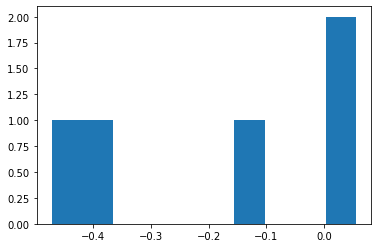

In [57]:
plt.hist(lin_reg.coef_)

Посмотрим на распределения остатков и на нормальное распределение.

(array([  4.,   0.,   2.,   5.,   7.,   1.,  19.,  14.,  25.,  42.,  38.,
         66.,  83., 101., 135., 124., 170., 196., 202., 228., 232., 223.,
        223., 290., 256., 214., 189., 173., 154., 138., 100.,  88.,  64.,
         63.,  40.,  28.,  19.,  19.,  11.,   5.,   3.,   4.,   0.,   0.,
          0.,   0.,   1.,   0.,   0.,   1.]),
 array([-3.49382272, -3.33651731, -3.1792119 , -3.02190649, -2.86460108,
        -2.70729567, -2.54999026, -2.39268485, -2.23537944, -2.07807403,
        -1.92076862, -1.7634632 , -1.60615779, -1.44885238, -1.29154697,
        -1.13424156, -0.97693615, -0.81963074, -0.66232533, -0.50501992,
        -0.34771451, -0.1904091 , -0.03310369,  0.12420172,  0.28150713,
         0.43881254,  0.59611795,  0.75342336,  0.91072877,  1.06803418,
         1.22533959,  1.382645  ,  1.53995041,  1.69725582,  1.85456123,
         2.01186664,  2.16917205,  2.32647746,  2.48378287,  2.64108828,
         2.7983937 ,  2.95569911,  3.11300452,  3.27030993,  3.42761534,
 

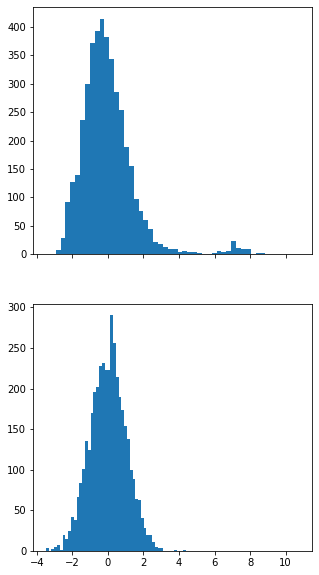

In [58]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train).values, bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

Следовательно ошибка на train имеет нормальное распределение -> модель обучается описывать данные

Значения, на которых модель возвращает наибольшую ошибку:

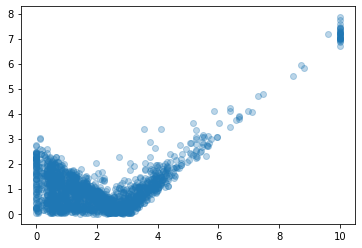

In [59]:
plt.scatter(y_test,  np.abs(y_test - y_pred) , alpha=0.3)

# Remove outlires
Посмотрим на результаты удаления объектов, для которых значение целевой переменной больше 9.

In [60]:
target_clean.head()

,chrN,start_coord,gamma
0,chr2L,0,0.00
1,chr2L,20000,2.85
2,chr2L,40000,2.85
3,chr2L,60000,0.83
4,chr2L,80000,0.83


In [61]:
data_scaled_clean[target < 9].values

target[target < 9].values

array([0.  , 2.85, 2.85, ..., 2.03, 0.  , 0.  ])

KFold(n_splits=5, random_state=3, shuffle=True)
train_index= [   1    2    3 ... 5848 5849 5851]
 TEST PREDICTION Error
weighted_mse_test: 1.0574384765925182 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0085615896298128 


 CONSTANT pred Error:
weighted_mse_test_const:  1.451074897361999
test sizes =  1171 1171 1171


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


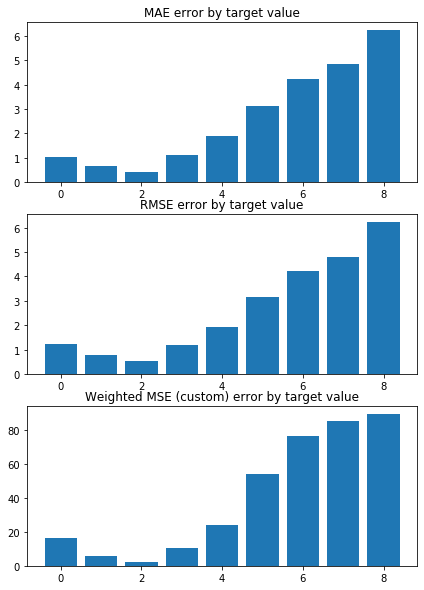

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 1.018024745604257 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0217601973965447 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3540046096107365
test sizes =  1171 1171 1171


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


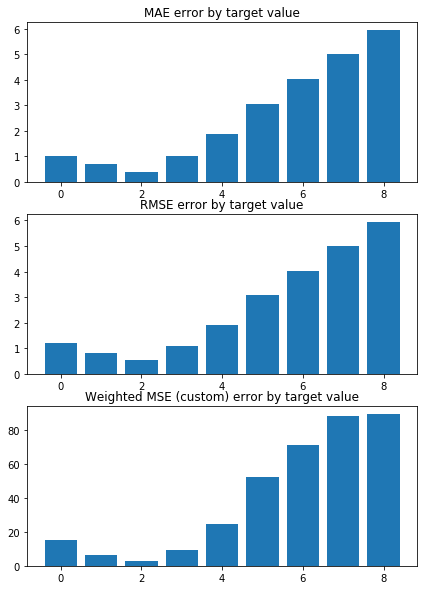

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 1.05645725339177 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0131083592489603 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4065885595837528
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


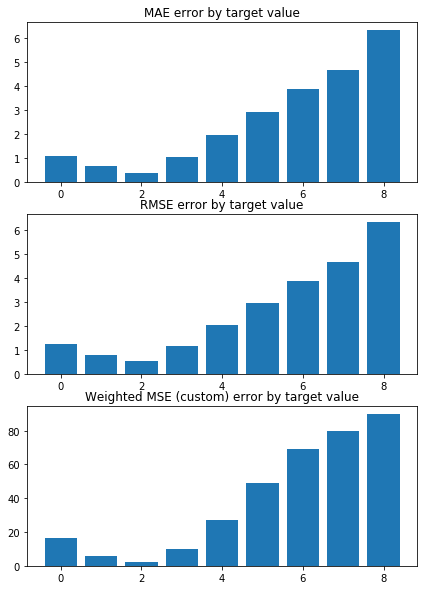

train_index= [   0    3    4 ... 5847 5848 5850]
 TEST PREDICTION Error
weighted_mse_test: 0.9399530446606525 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0467816917388022 


 CONSTANT pred Error:
weighted_mse_test_const:  1.3523979792411716
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


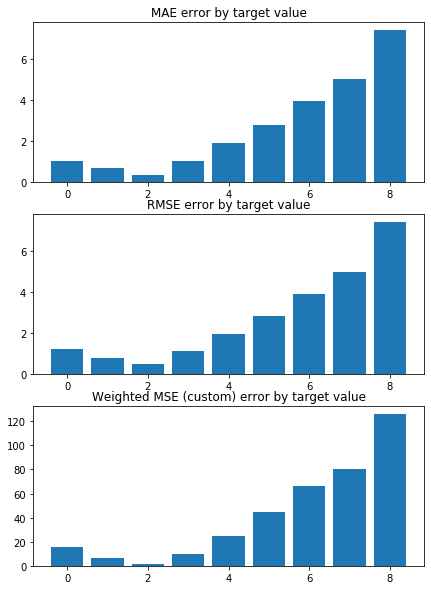

train_index= [   0    1    2 ... 5849 5850 5851]
 TEST PREDICTION Error
weighted_mse_test: 1.0453451839954577 


 TRAIN PREDICTION Error
weighted_mse_train: 1.0160832966361604 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4243478556596576
test sizes =  1170 1170 1170


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


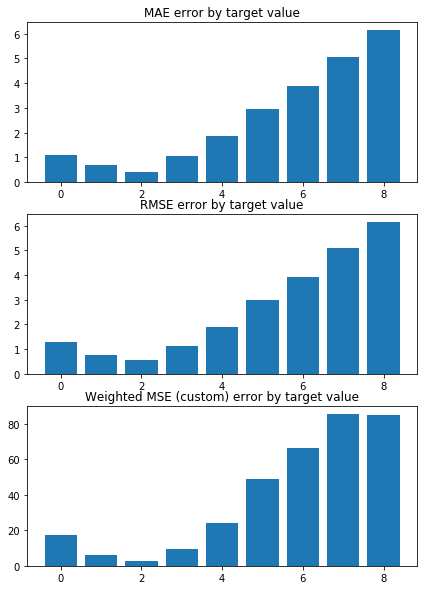

Weighted Mean squared error on Train: 1.02 
 MSE mean train: 1.446166850506081 

Mean squared error on Test: 1.02 
 MSE mean test:  1.4493518793299032 

Root of MSE on Test: 1.01 
 1.203890310339735 

Variance score on Test: 0.04 
 r2_test: 0.26175873275581923 

wMSE_train 1.02
wMSE_test 1.02
MSE_train 1.45
MSE_test 1.45
MAE_train 0.92
MAE_test 0.94
r2_test 0.26
      Chriz      CTCF    Su(Hw)  H3K27me3   H3K27ac
0 -0.361785 -0.344086  0.108647 -0.019683  0.001279
1 -0.399949 -0.330891  0.089416 -0.026789  0.007856
2 -0.390002 -0.351141  0.085706 -0.046354  0.010167
3 -0.387074 -0.346881  0.083280 -0.029842  0.012674
4 -0.376211 -0.344162  0.081744 -0.040731  0.025925


In [62]:
X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 
model_name = 'LR+L1_no_outliers'


lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=5, random_state=3, shuffle=True)


In [63]:
results_pd 

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1504294394020174 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1474530001881726 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


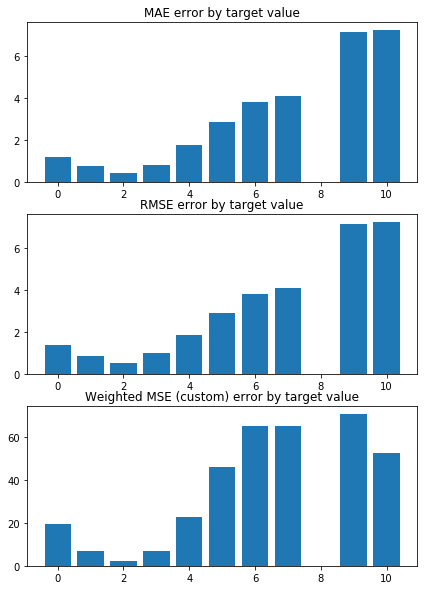

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0782543118183805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1611155407329028 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


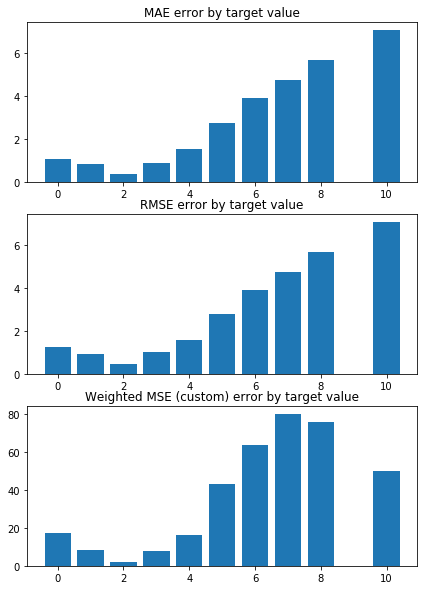

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0677171462739654 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584859794774696 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


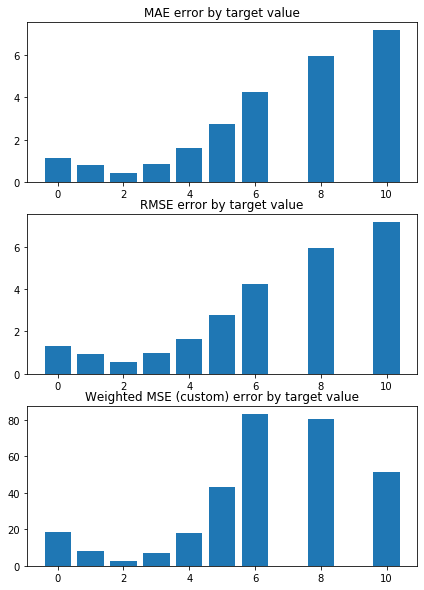

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731761631271282 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437958887539699 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


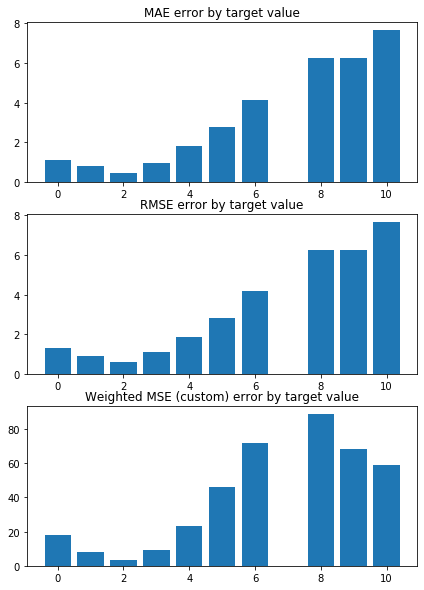

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169229129661831 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491770167028732 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


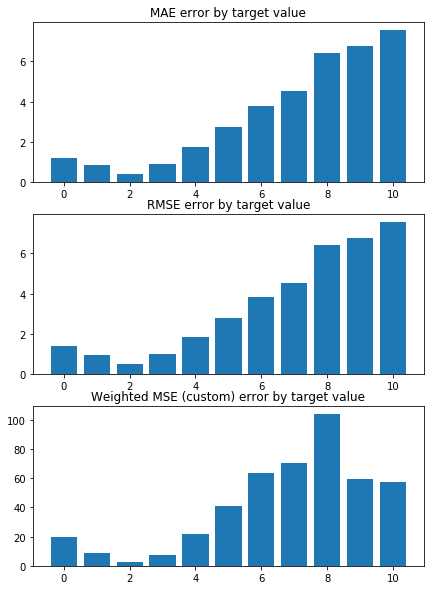

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897700170464067 


 TRAIN PREDICTION Error
weighted_mse_train: 1.144002229673775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


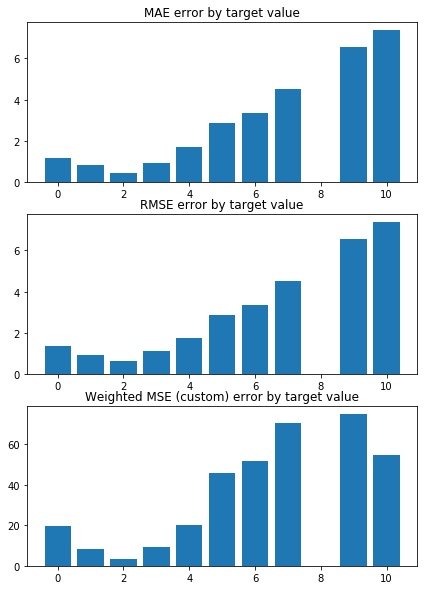

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.102058191568401 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1559393528280035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


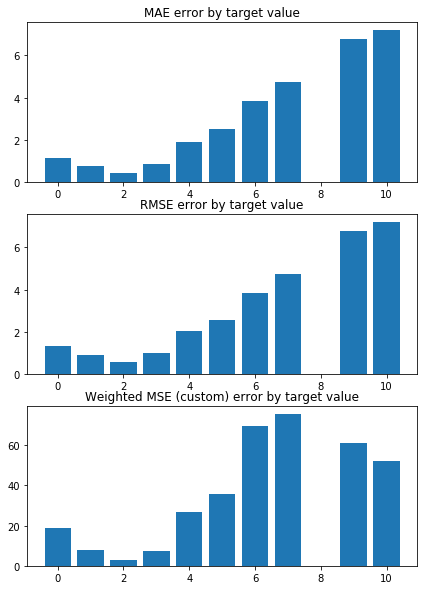

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364696945192495 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409774712552483 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


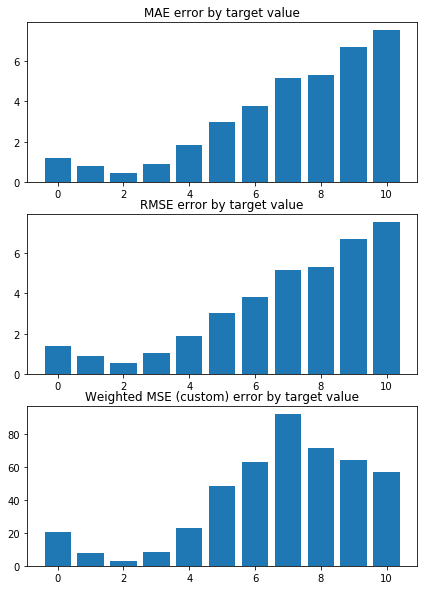

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778973501249657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1335948974906913 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


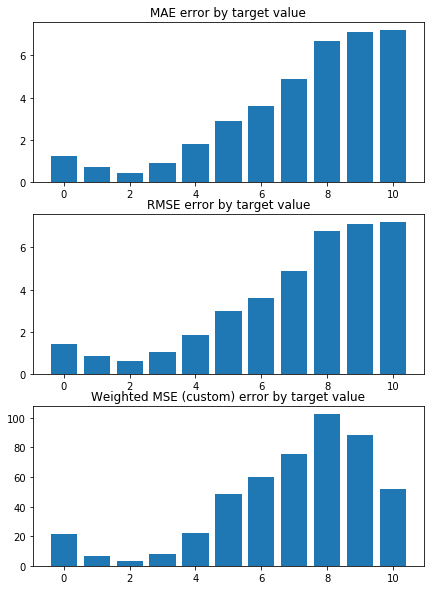

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695651766089531 


 TRAIN PREDICTION Error
weighted_mse_train: 1.159413956900689 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


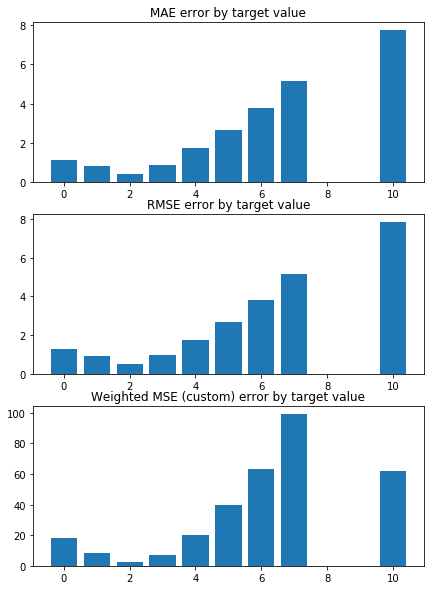

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897107771123 

Mean squared error on Test: 1.15 
 MSE mean test:  2.341046326583189 

Root of MSE on Test: 1.07 
 1.5300478183975783 

Variance score on Test: 0.07 
 r2_test: 0.21002153096464132 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450243 -0.378528 -0.120351  0.104176  0.010957
1 -0.482286 -0.351931 -0.125640  0.094882  0.014683
2 -0.454280 -0.381915 -0.125185  0.081891  0.018755
3 -0.463124 -0.366355 -0.123296  0.111936  0.025166
4 -0.449125 -0.379371 -0.125621  0.103758  0.020455
5 -0.449878 -0.373745 -0.112968  0.119382  0.018721
6 -0.473549 -0.356155 -0.118064  0.113101  0.009478
7 -0.459020 -0.364279 -0.112133  0.118205  0.015006
8 -0.454382 -0.379319 -0.125261  0.106479  0.011607
9 -0.452735 -0.382000 -0.128770  0.116150  0.004668


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [64]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression() 

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

In [65]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [66]:
coefs_argsort, coefs

(array([[1, 0, 3, 2, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 3, 2, 4],
        [1, 0, 3, 2, 4]]),
 array([[-0.37852811, -0.45024319,  0.1041758 , -0.12035102,  0.01095743],
        [-0.3519309 , -0.48228599,  0.09488217, -0.12564002,  0.01468274],
        [-0.38191471, -0.45428022,  0.08189125, -0.12518544,  0.01875496],
        [-0.36635523, -0.46312401,  0.11193562, -0.12329593,  0.02516598],
        [-0.37937066, -0.44912518,  0.10375798, -0.12562116,  0.02045534],
        [-0.37374517, -0.44987796,  0.11938228, -0.11296827,  0.01872114],
        [-0.35615458, -0.47354941,  0.11310147, -0.1180638 ,  0.00947819],
        [-0.36427851, -0.45901971,  0.11820455, -0.11213257,  0.01500618],
        [-0.37931935, -0.45438191,  0.10647881, -0.12526085,  0.01160749],
        [-0.38200007, -0.45273465,  0.11615035, -0.12876996,  0.00466796]

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

(array([  5.,   1.,   2.,   2.,   4.,  14.,   7.,  13.,  17.,  14.,  32.,
         50.,  55.,  74.,  72.,  94., 121., 134., 135., 162., 165., 188.,
        193., 212., 216., 206., 222., 210., 203., 184., 168., 145., 107.,
        112.,  81.,  59.,  80.,  69.,  48.,  32.,  18.,  28.,  16.,   4.,
         11.,   5.,   4.,   3.,   2.,   1.]),
 array([-3.34964856, -3.21627995, -3.08291134, -2.94954272, -2.81617411,
        -2.6828055 , -2.54943689, -2.41606828, -2.28269967, -2.14933106,
        -2.01596245, -1.88259384, -1.74922522, -1.61585661, -1.482488  ,
        -1.34911939, -1.21575078, -1.08238217, -0.94901356, -0.81564495,
        -0.68227634, -0.54890772, -0.41553911, -0.2821705 , -0.14880189,
        -0.01543328,  0.11793533,  0.25130394,  0.38467255,  0.51804116,
         0.65140978,  0.78477839,  0.918147  ,  1.05151561,  1.18488422,
         1.31825283,  1.45162144,  1.58499005,  1.71835866,  1.85172728,
         1.98509589,  2.1184645 ,  2.25183311,  2.38520172,  2.51857033,
 

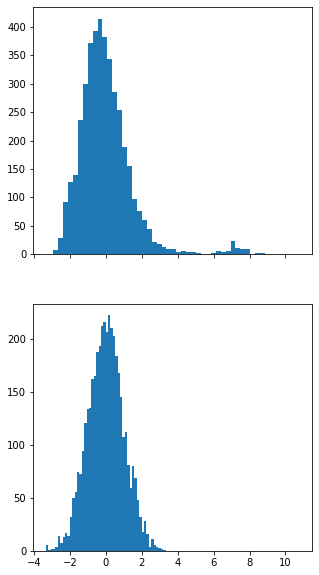

In [67]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

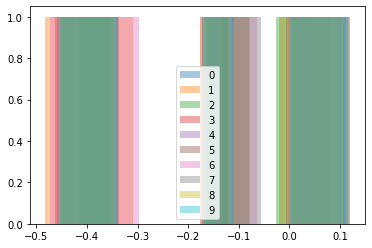

In [68]:
for i, coef_i in enumerate(coefs):
    plt.hist(coef_i, label=str(i), alpha=0.4, bins=10)
plt.legend()

(array([1., 1., 0., 0., 0., 1., 0., 0., 1., 1.]),
 array([-0.45024319, -0.39480129, -0.33935939, -0.28391749, -0.22847559,
        -0.1730337 , -0.1175918 , -0.0621499 , -0.006708  ,  0.0487339 ,
         0.1041758 ]),
 <a list of 10 Patch objects>)

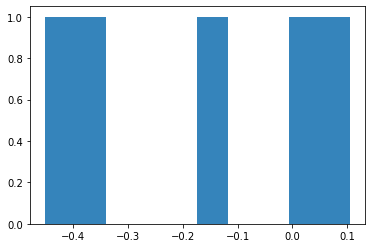

In [69]:
plt.hist(coefs[0], label=str(i), alpha=0.9, bins=10)

### Отсортированные номера выделенных признаков обычной линейной модели

In [70]:
su_drsc.columns

Index(['chrN', 'start_coord', 'Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3',
       'H3K27ac'],
      dtype='object')

In [71]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'H3K27me3', 'Su(Hw)', 'H3K27ac'], dtype='object')

In [72]:
coefs_argsort

array([[1, 0, 3, 2, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 3, 2, 4],
       [1, 0, 3, 2, 4]])

In [73]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,1,0,3,2,4
1,1,0,3,2,4
2,1,0,3,2,4
3,1,0,3,2,4
4,1,0,3,2,4
5,1,0,2,3,4
6,1,0,3,2,4
7,1,0,2,3,4
8,1,0,3,2,4
9,1,0,3,2,4


# !! одинаковая приоритизация 

In [74]:
def getConfIdxFrequencies(coefs_argsort, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(key, value))
        
    return featur_freq_dict

In [75]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 3)

3: 18
2: 12
0: 10
1: 10
4: 10


## Explore fold with big error

train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    2    3 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5948 5949]
train_index= [   1    4    5 ... 5945 5947 5949]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5946 5947 5948]
train_index= [   0    1    2 ... 5947 5948 5949]
train_index= [   0    1    2 ... 5947 5948 5949]


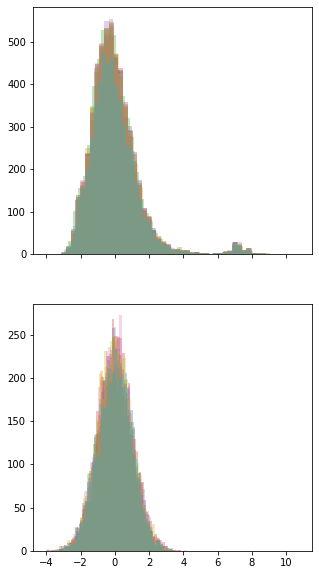

In [76]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

     # Train the model using the training sets
    model.fit(X_train, y_train)

    # Make predictions using the train set
    y_pred_train = model.predict(X_train)

    # Make predictions using the testing set
    y_pred = model.predict(X_test)

    axes[0].hist(y_train - y_pred_train, bins=50, alpha=0.3)
    axes[1].hist(np.random.randn(4000), bins=50, alpha=0.3)

# ================================================================

# Linear Regression with L1 regularization -  LASSO

$$ (1 / (2  n\_{samples}))  ||y - Xw||^2_2 + \alpha * ||w||_1 $$


In [77]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)

In [78]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso()

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

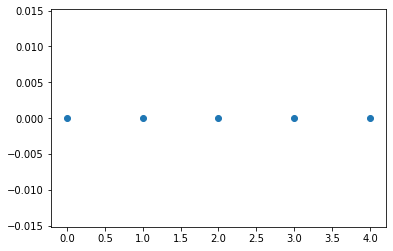

In [79]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [80]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [81]:
lin_reg_l1.coef_

array([-0., -0.,  0.,  0.,  0.])

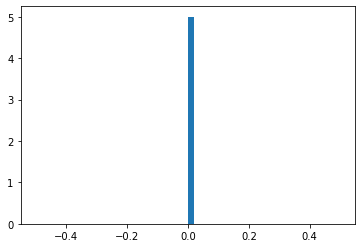

In [82]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [83]:
# f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
# axes[0].hist((y_train - y_pred_train), bins=50)
# axes[1].hist(np.random.randn(4000), bins=50)

### Cross validation
without outliers

In [84]:
# X, y = data_scaled_clean[target < 9].values, target[target < 9].values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# # Create linear regression with L2 regularization object
# model_l1 = linear_model.Lasso(0.2)

# model_name = 'LR+L1_t<.9'

# lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
#                 weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const, \
#                 results_pd = train_test_KFold(X, y, 
#                                               model, model_name, results_pd,
#                                               n_splits=5, random_state=3, shuffle=True)
# results_pd

In [85]:
# np.mean(weighted_mse_test_all)

In [86]:
# for coef_i in coefs_l1:
#     plt.hist(coef_i, alpha=0.5)
# plt.hist(coefs_l1[0], alpha=0.5)

In [87]:
# np.sort(coefs_l1)

In [88]:
# lin_reg_l1.predict(X_test)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L 1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5233751150317654 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


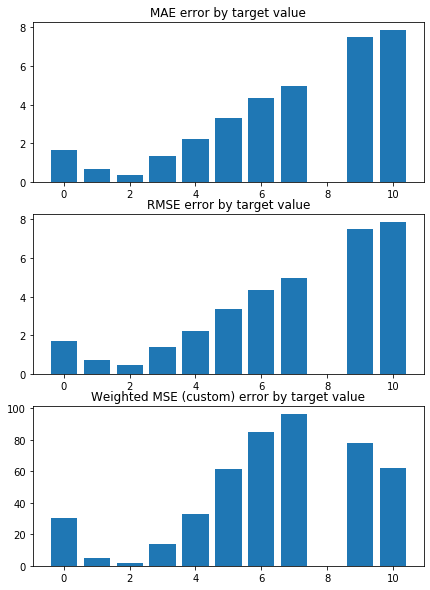

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


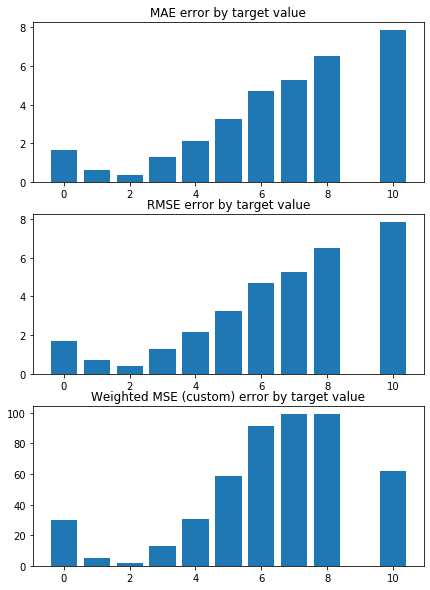

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


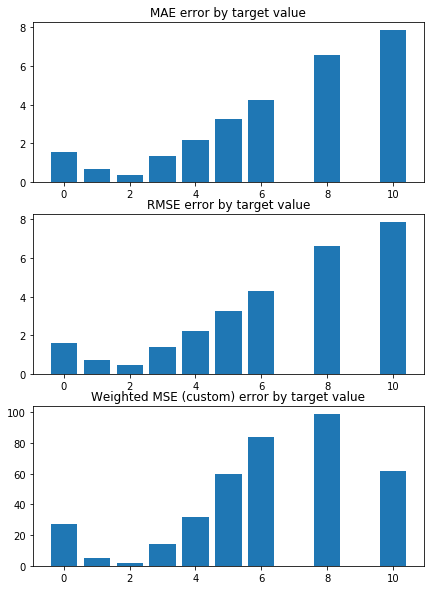

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


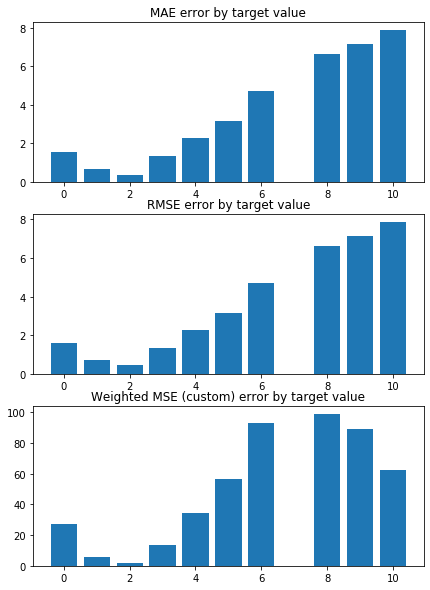

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


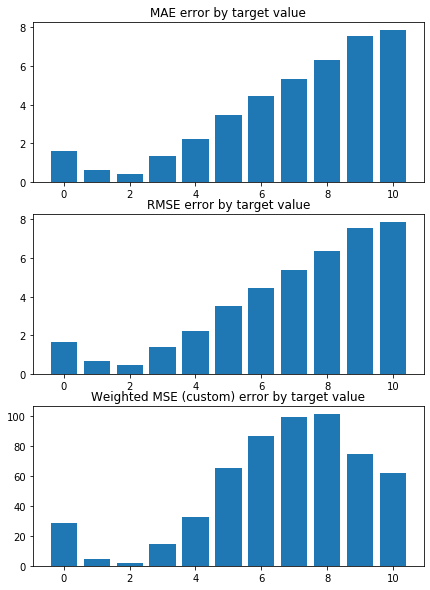

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


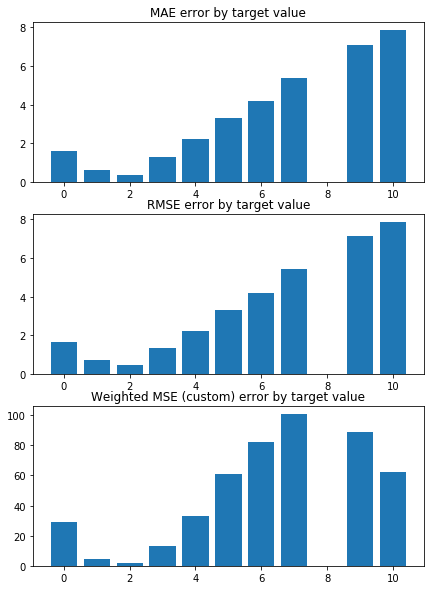

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


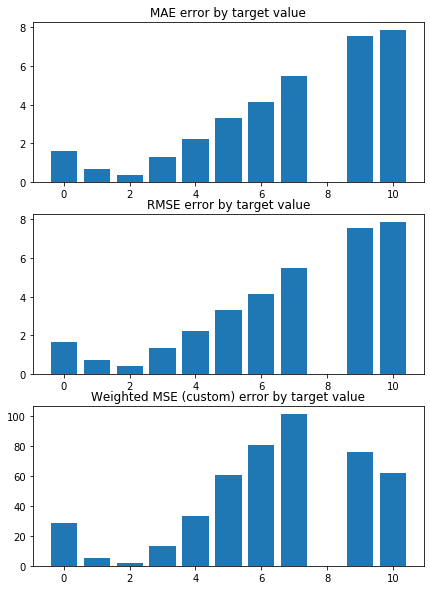

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


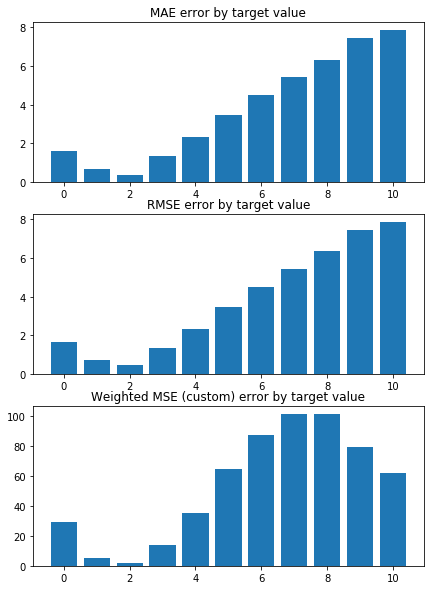

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


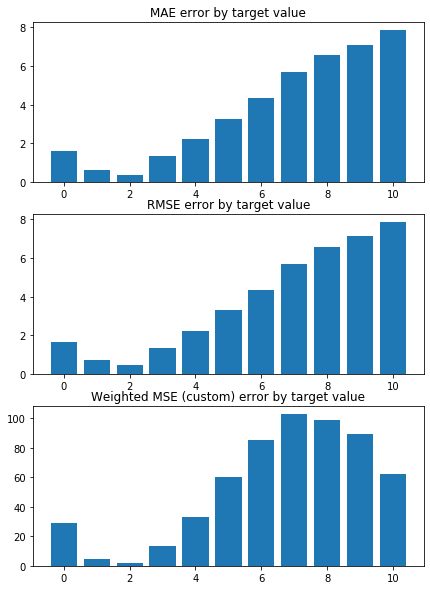

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


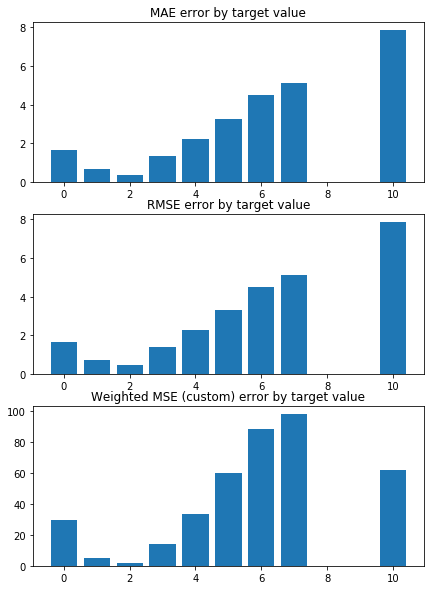

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."


In [89]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.Lasso()

model_name = 'LR+L1'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)
results_pd

# Fined parametrs for lasso L1

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.150429439402017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1474530001881726 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6242.865674945077, tolerance: 1.5753001672530345
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

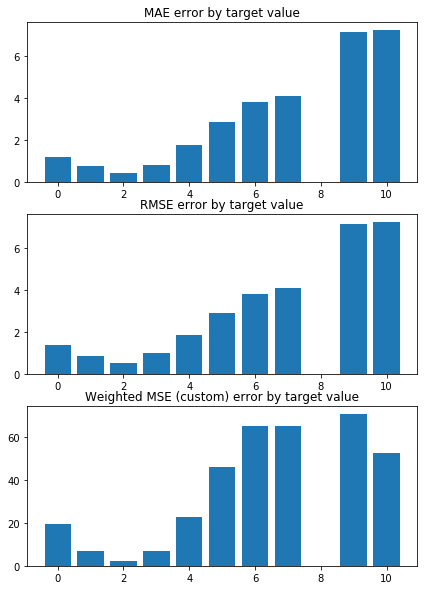

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0782543118183805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1611155407329028 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6356.670701750772, tolerance: 1.5951549408328658
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

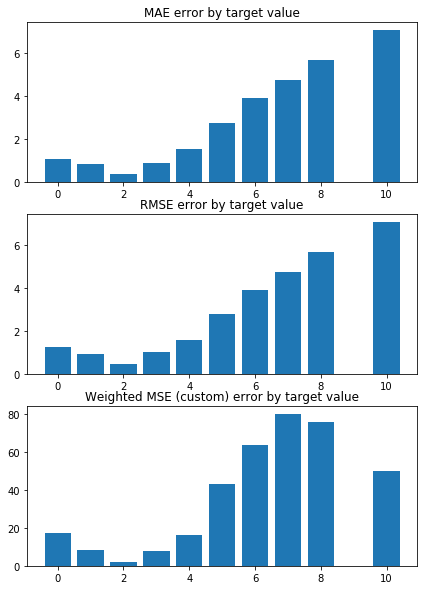

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0677171462739652 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584859794774696 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6274.133759711843, tolerance: 1.5821769354883282
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

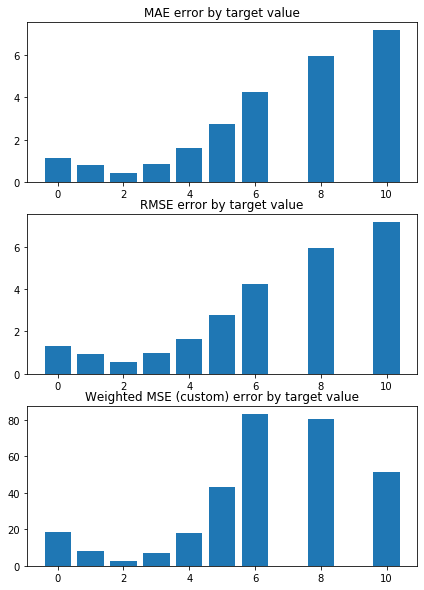

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731761631271278 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437958887539694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6094.980961909499, tolerance: 1.5581200225471517
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

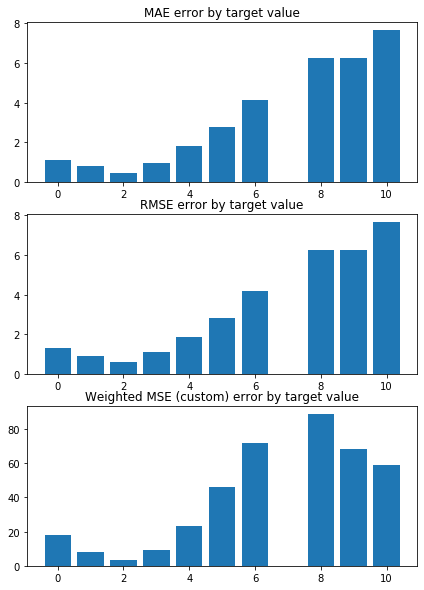

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169229129661831 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491770167028728 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6363.2855123956215, tolerance: 1.6044926244369746
  positive)


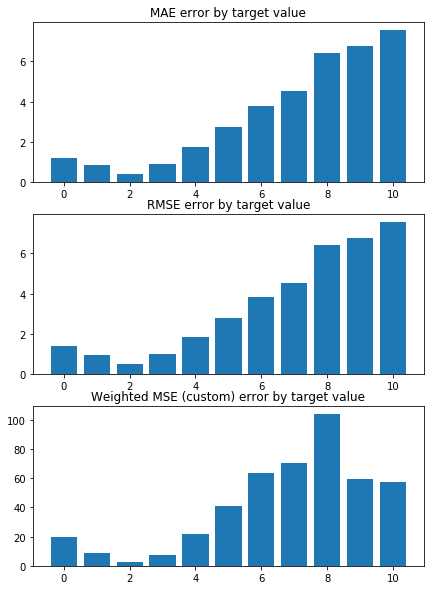

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897700170464065 


 TRAIN PREDICTION Error
weighted_mse_train: 1.144002229673775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6132.098034762407, tolerance: 1.5618709890457518
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

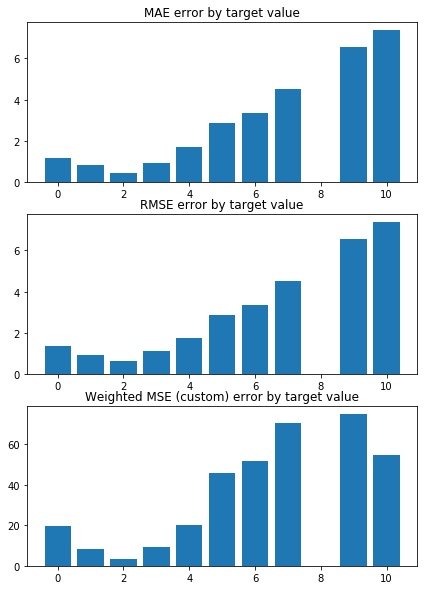

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.102058191568401 


 TRAIN PREDICTION Error


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6343.068491806614, tolerance: 1.6006251832941174
  positive)


weighted_mse_train: 1.1559393528280035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


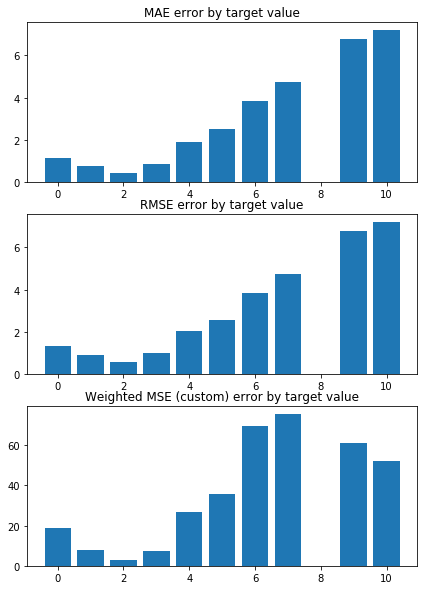

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364696945192493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409774712552478 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6292.674649939457, tolerance: 1.591772067394958
  positive)


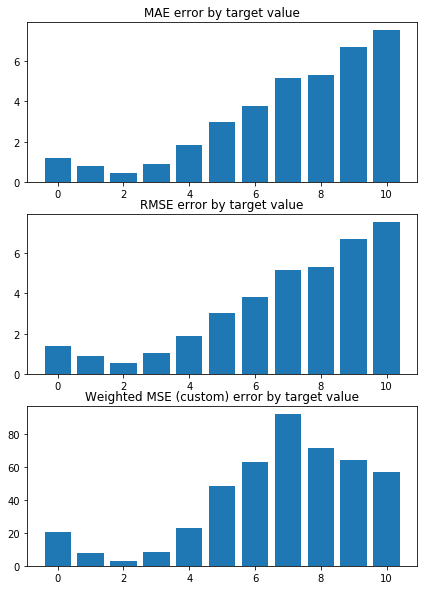

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778973501249657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133594897490691 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6199.585854656057, tolerance: 1.5756948114957992
  positive)


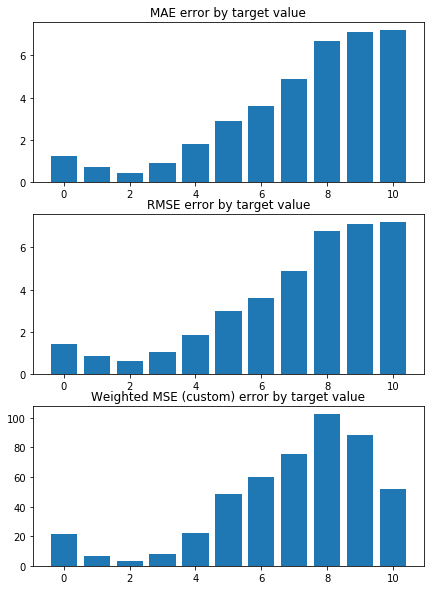

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695651766089527 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1594139569006885 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6271.05641869449, tolerance: 1.5896707153314662
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

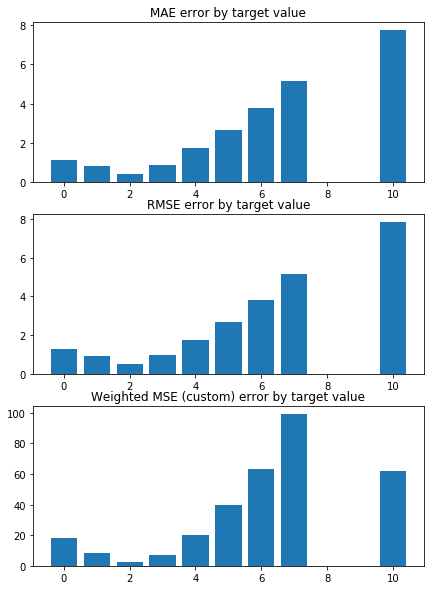

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897107771123 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410463265831885 

Root of MSE on Test: 1.07 
 1.5300478183975783 

Variance score on Test: 0.07 
 r2_test: 0.21002153096464138 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450243 -0.378528 -0.120351  0.104176  0.010957
1 -0.482286 -0.351931 -0.125640  0.094882  0.014683
2 -0.454280 -0.381915 -0.125185  0.081891  0.018755
3 -0.463124 -0.366355 -0.123296  0.111936  0.025166
4 -0.449125 -0.379371 -0.125621  0.103758  0.020455
5 -0.449878 -0.373745 -0.112968  0.119382  0.018721
6 -0.473549 -0.356155 -0.118064  0.113101  0.009478
7 -0.459020 -0.364279 -0.112133  0.118205  0.015006
8 -0.454382 -0.379319 -0.125261  0.106479  0.011607
9 -0.452735 -0.382000 -0.128770  0.116150  0.004668
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


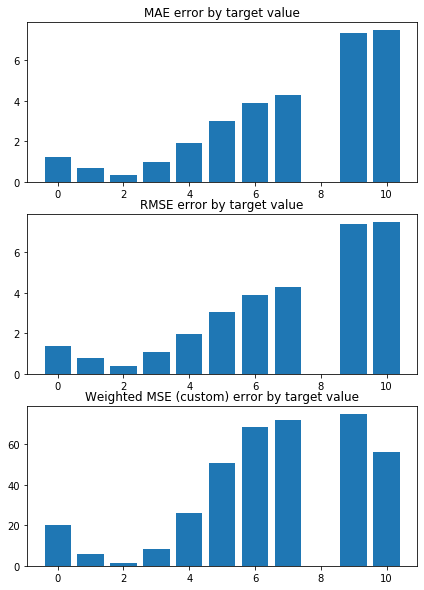

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0885359371590442 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1654541621800865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


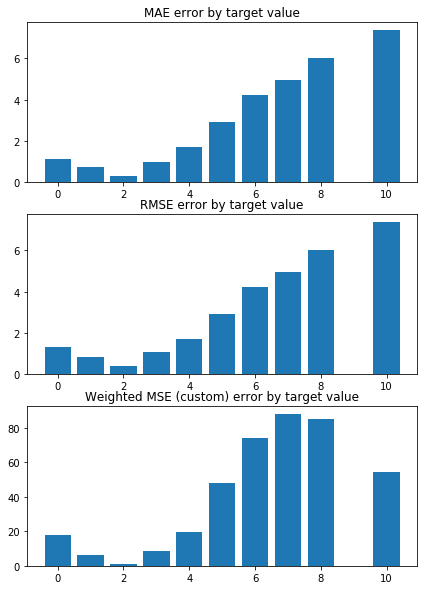

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0793940215966444 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1607748906278734 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


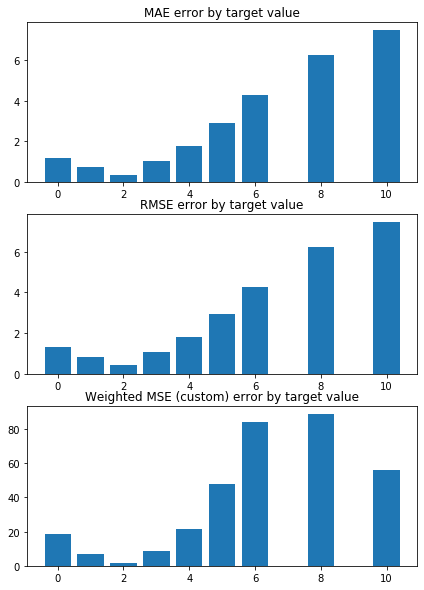

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1733769047745104 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1455388179621029 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


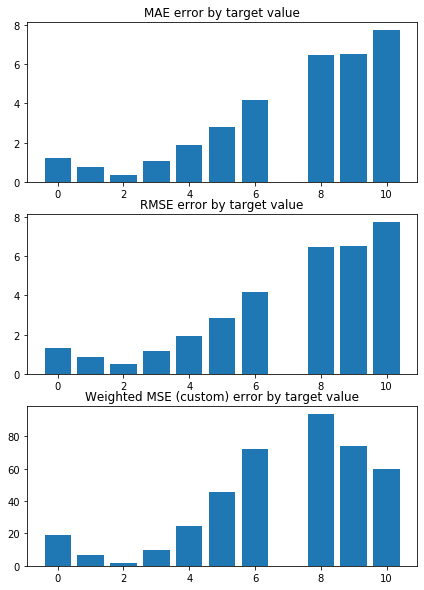

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1831840979005568 


 TRAIN PREDICTION Error
weighted_mse_train: 1.15060902902434 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


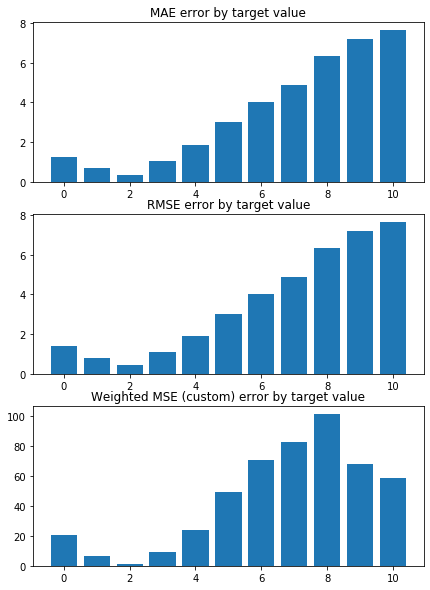

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1654818131315492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1487818558653673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


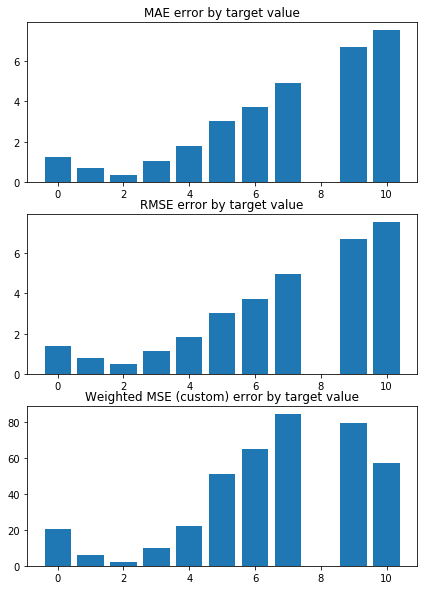

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0949015848384838 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1602631082893062 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


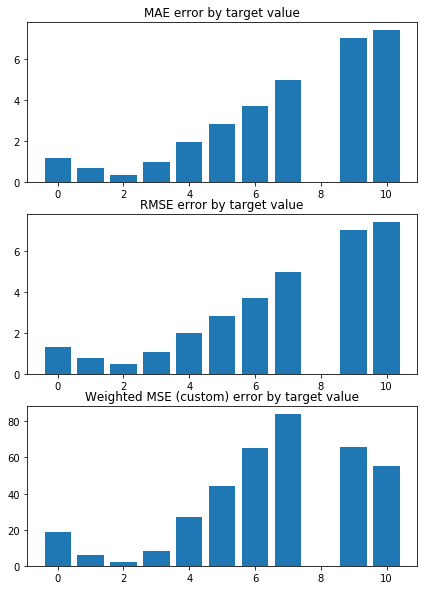

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2402030823425974 


 TRAIN PREDICTION Error
weighted_mse_train: 1.14460166876746 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


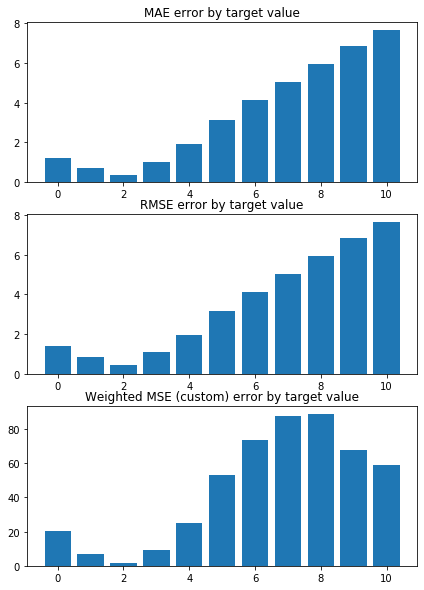

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2678845264106184 


 TRAIN PREDICTION Error
weighted_mse_train: 1.136932193951947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


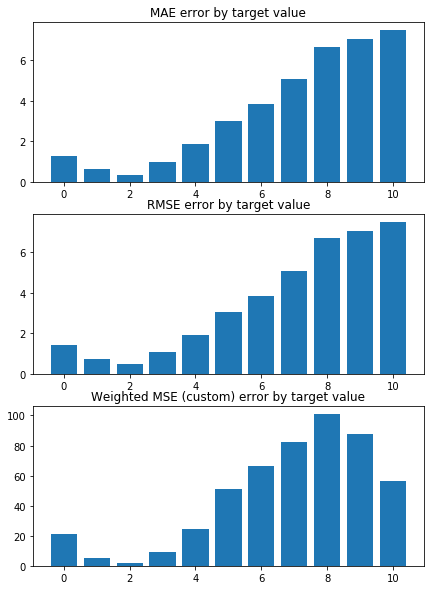

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073991347699697 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1603717867719059 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


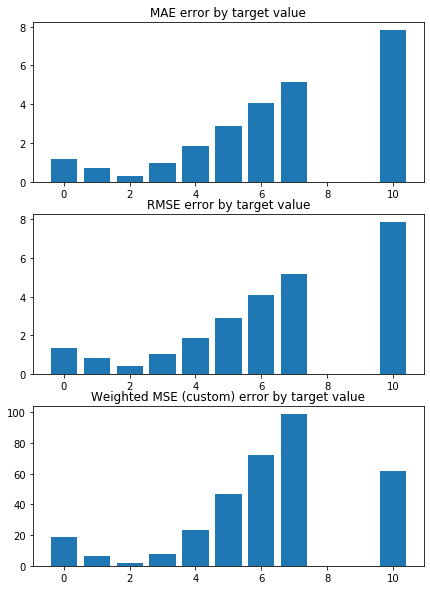

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4041708852480745 

Mean squared error on Test: 1.15 
 MSE mean test:  2.405260016843316 

Root of MSE on Test: 1.07 
 1.5508900724562382 

Variance score on Test: 0.06 
 r2_test: 0.18795107980811424 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.4
MSE_test 2.41
MAE_train 1.07
MAE_test 1.03
r2_test 0.19
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.334249 -0.246173     0.0       0.0      0.0
1 -0.361793 -0.217149     0.0       0.0      0.0
2 -0.341658 -0.239702     0.0       0.0      0.0
3 -0.358577 -0.231177     0.0       0.0      0.0
4 -0.338930 -0.244014     0.0       0.0      0.0
5 -0.338864 -0.248533     0.0       0.0      0.0
6 -0.362137 -0.223485     0.0       0.0      0.0
7 -0.349952 -0.235776     0.0       0.0      0.0
8 -0.347587 -0.240122     0.0       0.0      0.0
9 -0.340536 -0.246393     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 594

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


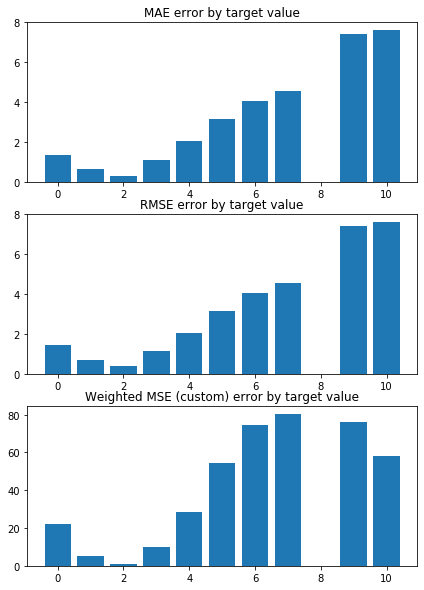

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897599739529106 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2434507200485327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


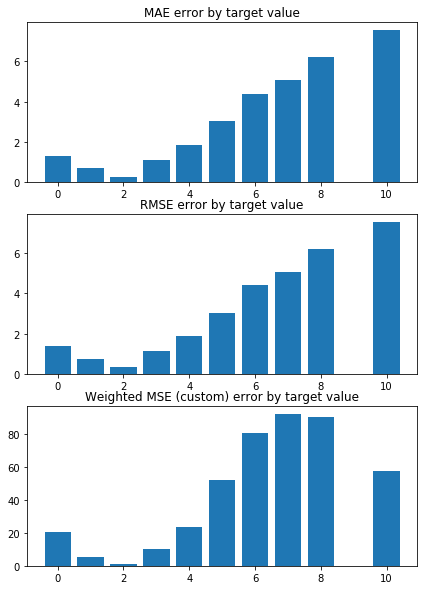

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.153530171107625 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2371622857402362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


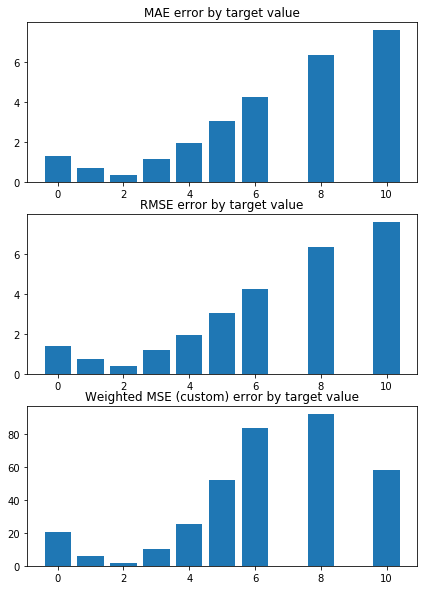

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.232389579949166 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2189985021967036 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


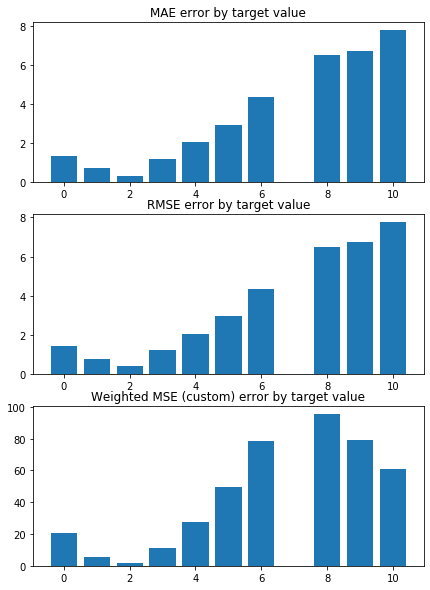

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.265136795700116 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2243762250092542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


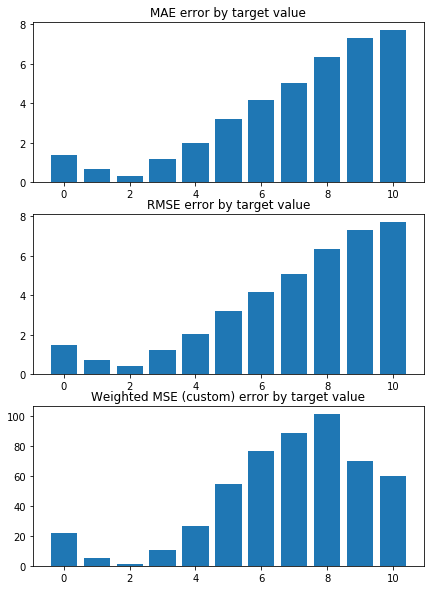

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.217522494757862 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2245511367818793 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


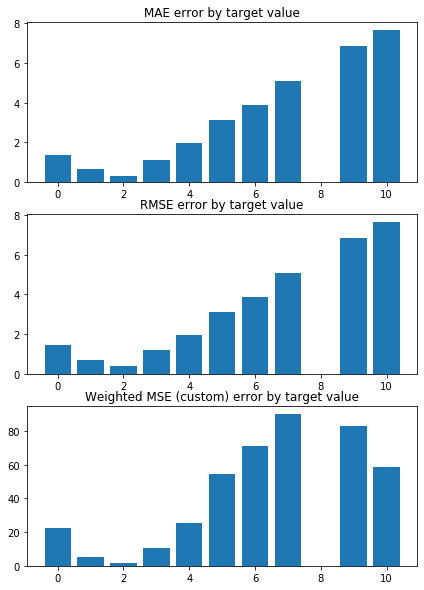

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1666018630270214 


 TRAIN PREDICTION Error
weighted_mse_train: 1.237316823066475 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


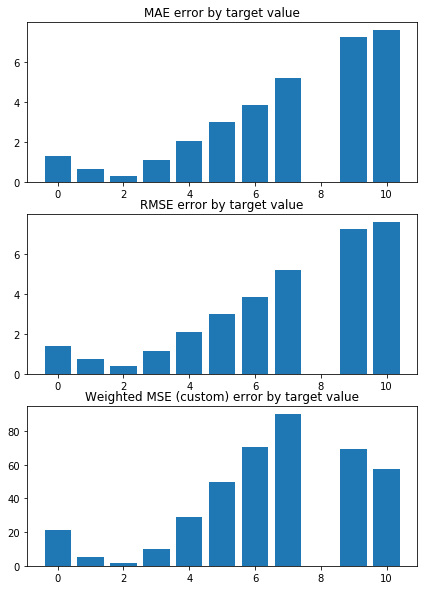

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3177978386905727 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2198130162898877 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


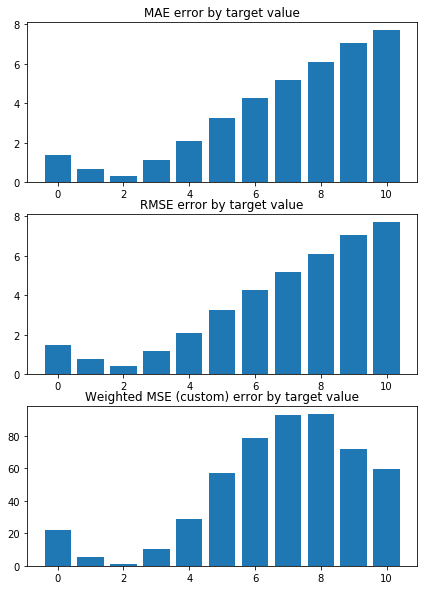

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3313384062992017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2114659406901662 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


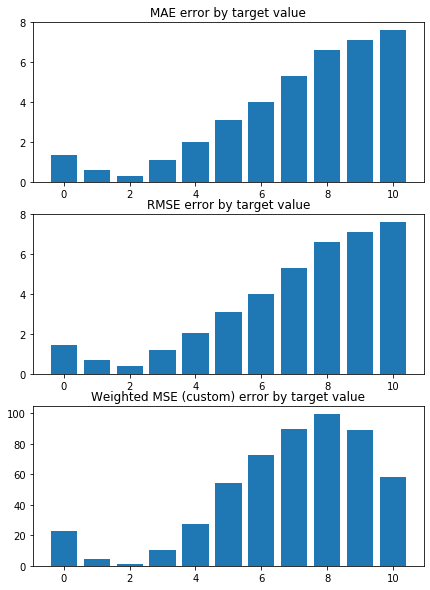

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1648531373625626 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2329746784171327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


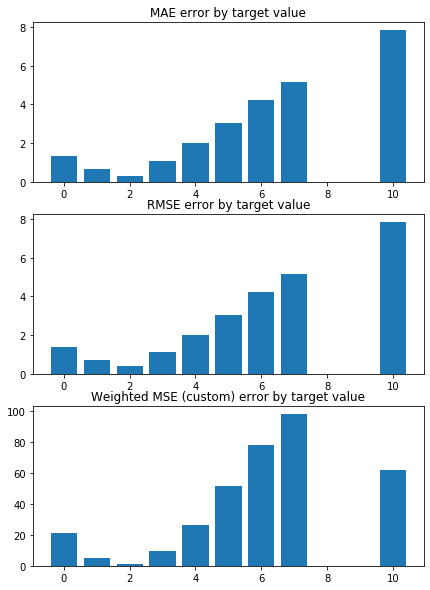

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 2.5331474134154943 

Mean squared error on Test: 1.23 
 MSE mean test:  2.5345768783777545 

Root of MSE on Test: 1.11 
 1.592035451357084 

Variance score on Test: 0.06 
 r2_test: 0.14364113421504082 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 2.53
MSE_test 2.53
MAE_train 1.12
MAE_test 1.09
r2_test 0.14
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.222353 -0.141734     0.0       0.0      0.0
1 -0.247705 -0.111918     0.0       0.0      0.0
2 -0.236872 -0.129939     0.0       0.0      0.0
3 -0.256224 -0.121031     0.0       0.0      0.0
4 -0.234416 -0.135162     0.0       0.0      0.0
5 -0.229767 -0.143984     0.0       0.0      0.0
6 -0.252520 -0.116635     0.0       0.0      0.0
7 -0.242914 -0.127673     0.0       0.0      0.0
8 -0.244681 -0.129492     0.0       0.0      0.0
9 -0.232072 -0.140041     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 59

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


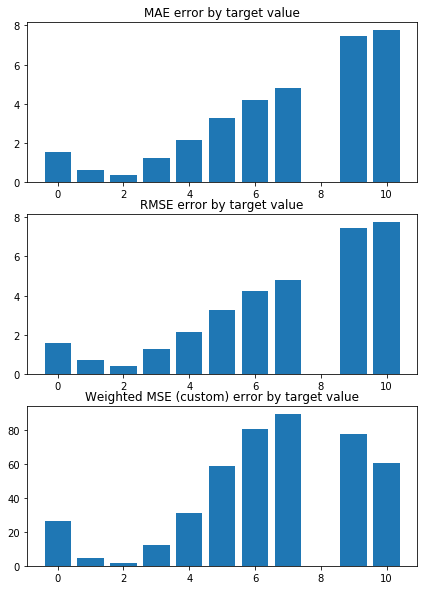

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3840474571593449 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3970962121713628 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


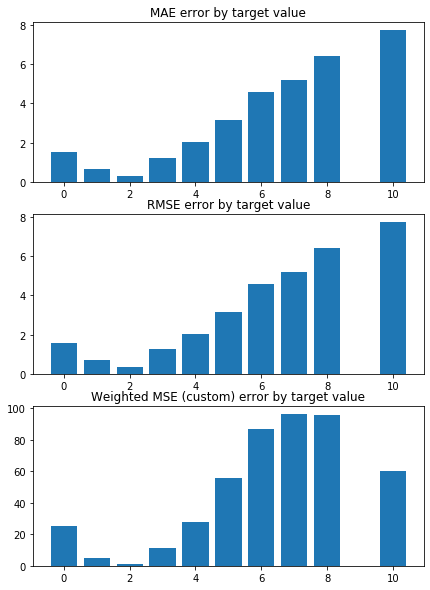

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3006194205609953 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3876338444622631 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


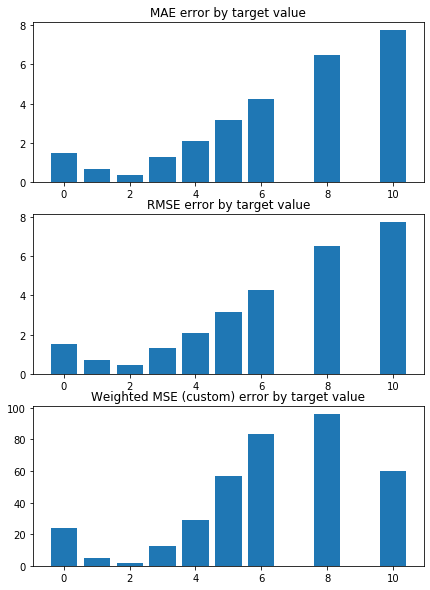

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3555238063982902 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3659563119721214 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


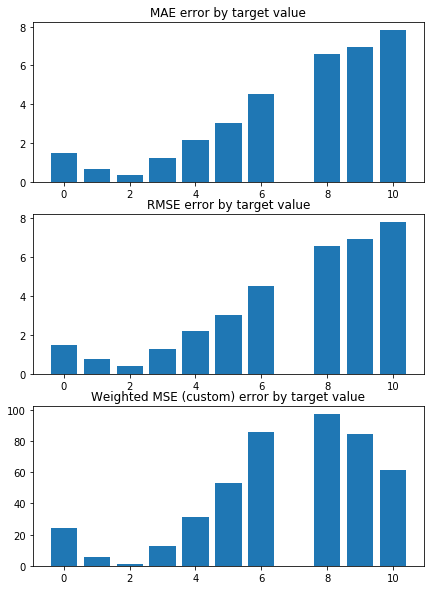

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.415928586624421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3717179412845772 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


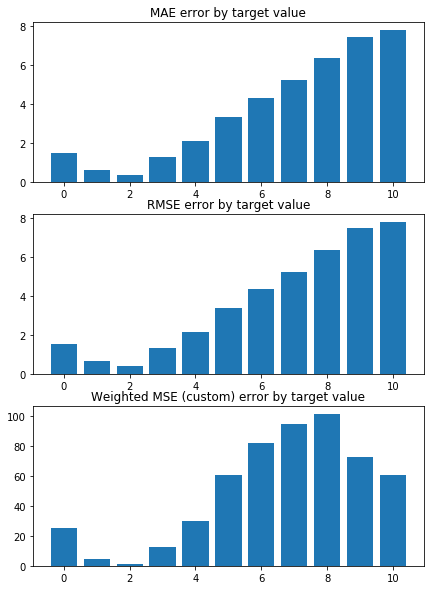

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.337746817900546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3742369475237413 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


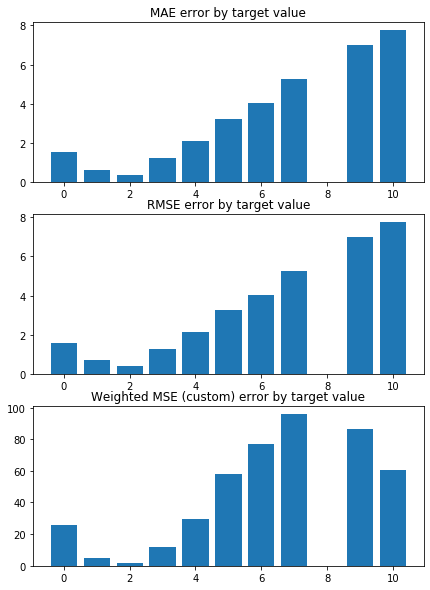

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318858323587493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3891984852940886 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


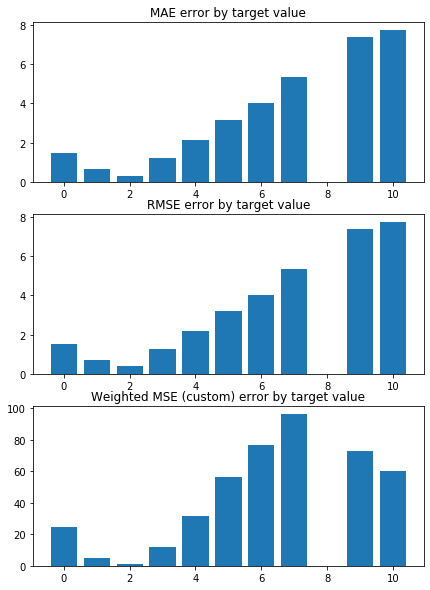

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.4712358739340614 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3692913417810388 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


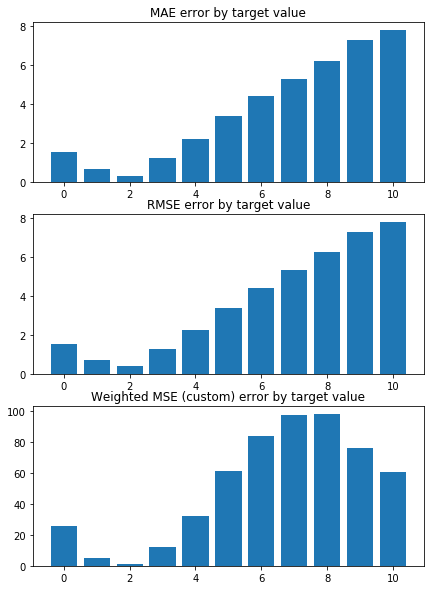

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4631099040373725 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3598331291430157 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


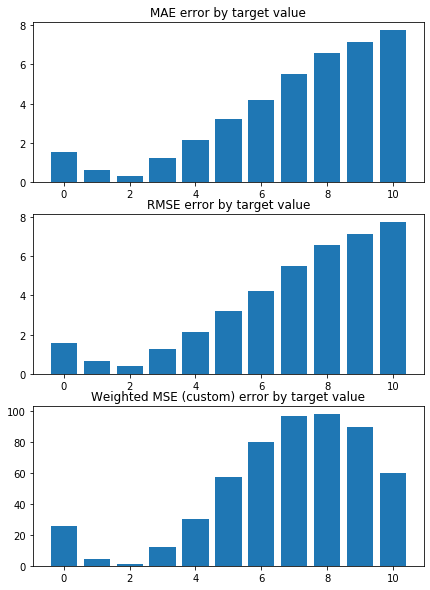

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3286903407941286 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3798778867688843 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


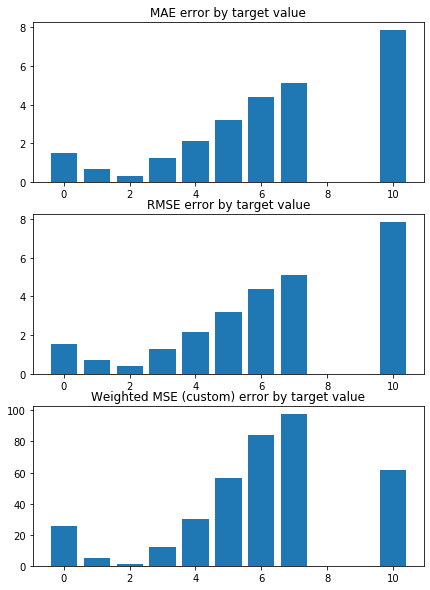

Weighted Mean squared error on Train: 1.38 
 MSE mean train: 2.7481125509396542 

Mean squared error on Test: 1.38 
 MSE mean test:  2.7501326276002125 

Root of MSE on Test: 1.17 
 1.6583523834216334 

Variance score on Test: 0.06 
 r2_test: 0.0698272243624174 

wMSE_train 1.38
wMSE_test 1.38
MSE_train 2.75
MSE_test 2.75
MAE_train 1.2
MAE_test 1.18
r2_test 0.07
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.110456 -0.037294     0.0       0.0      0.0
1 -0.133618 -0.006687     0.0       0.0      0.0
2 -0.132085 -0.020177     0.0       0.0      0.0
3 -0.153872 -0.010885     0.0       0.0      0.0
4 -0.129902 -0.026310     0.0       0.0      0.0
5 -0.120669 -0.039435     0.0       0.0      0.0
6 -0.142903 -0.009785     0.0       0.0      0.0
7 -0.135875 -0.019569     0.0       0.0      0.0
8 -0.141774 -0.018863     0.0       0.0      0.0
9 -0.123607 -0.033688     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 594

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


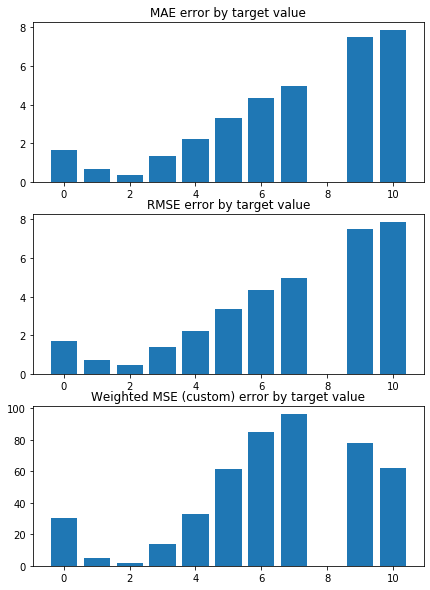

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


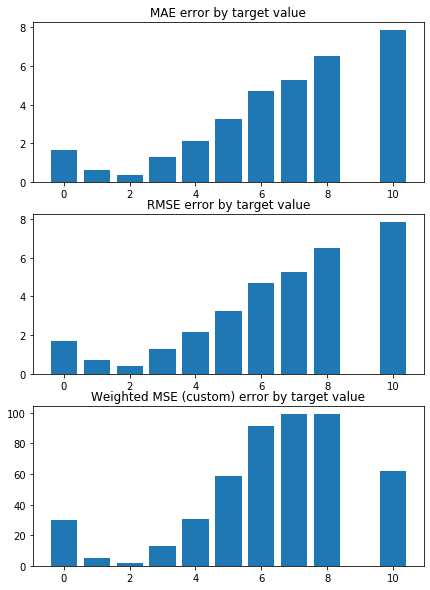

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


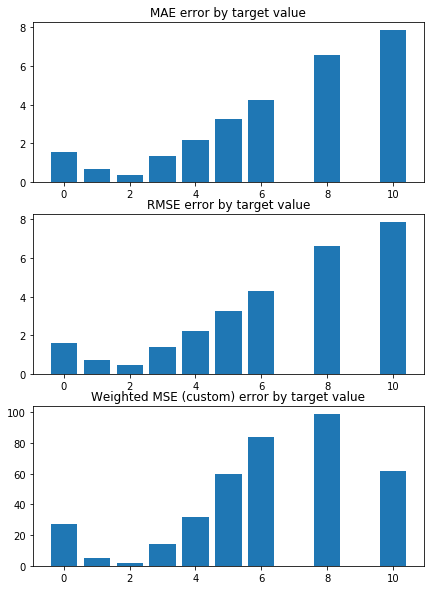

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


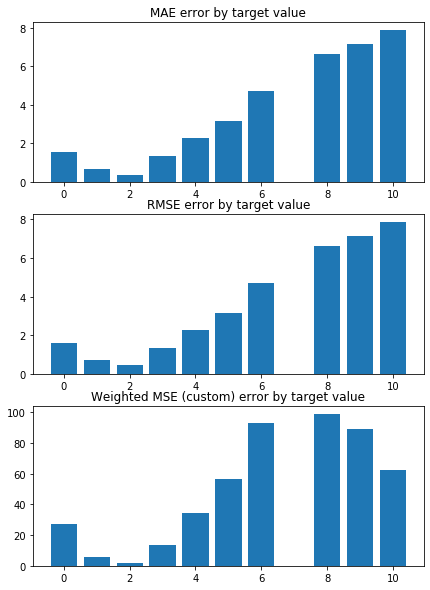

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


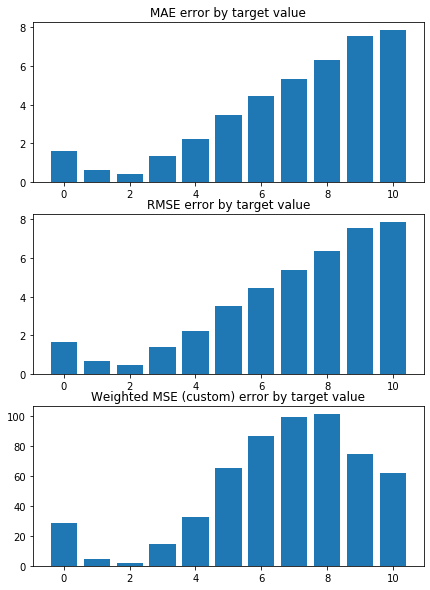

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


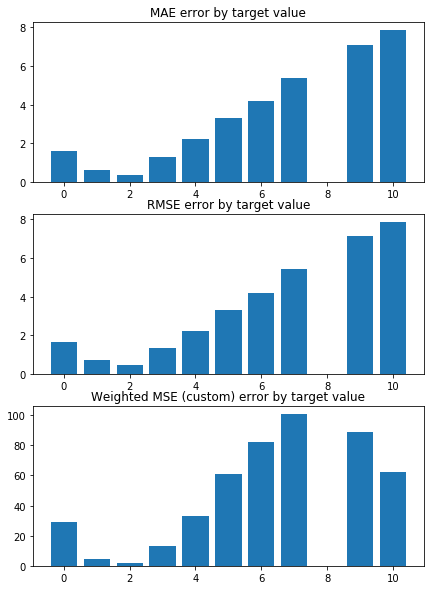

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


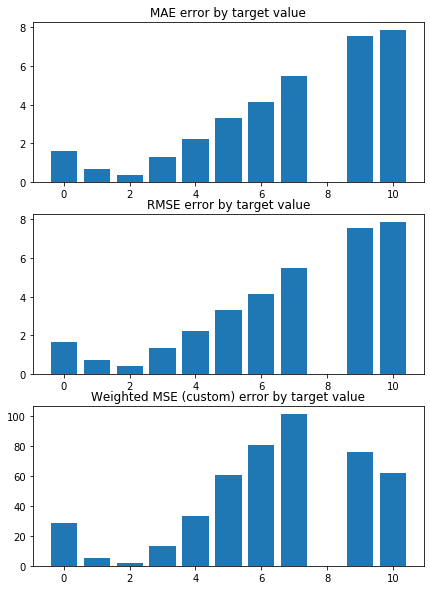

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


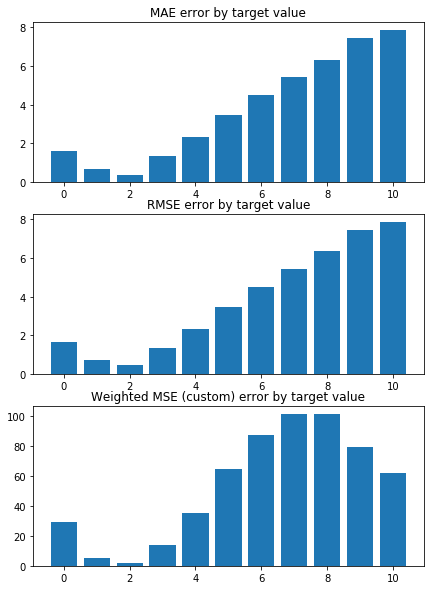

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


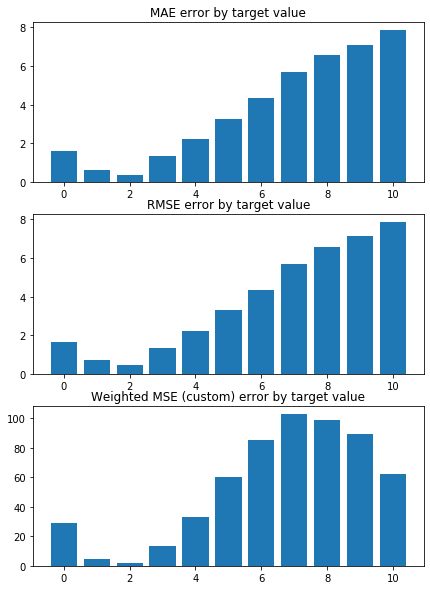

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


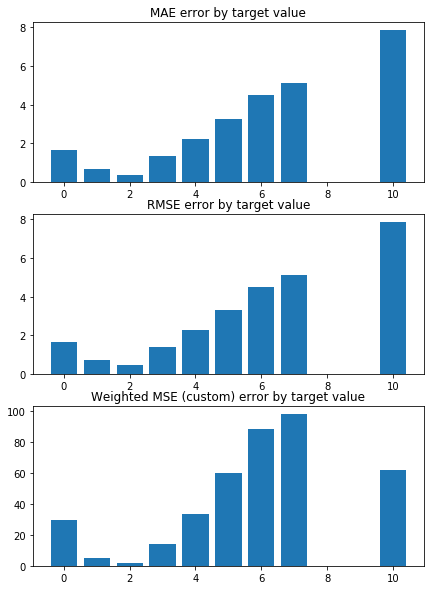

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


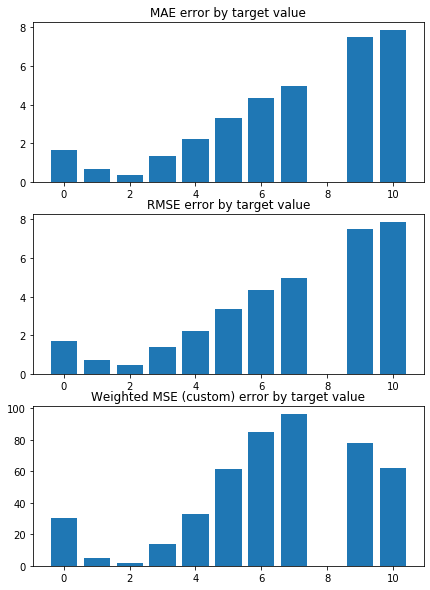

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


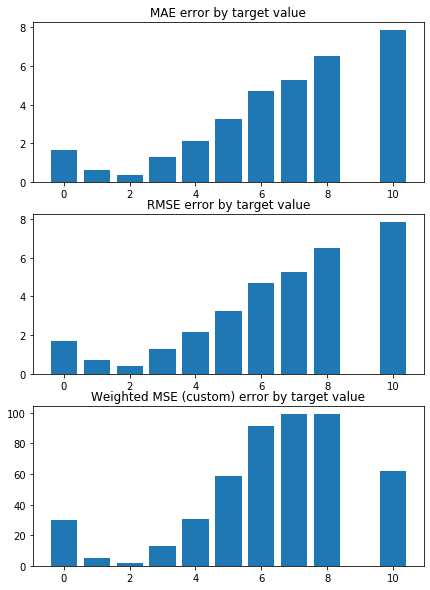

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


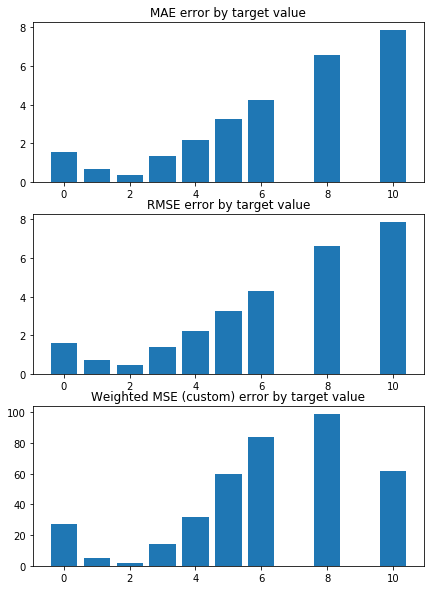

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


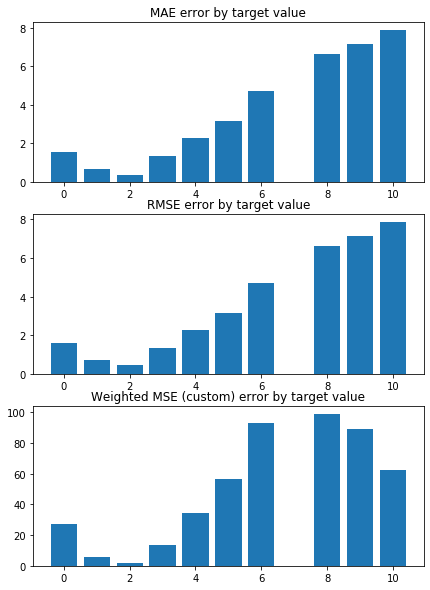

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


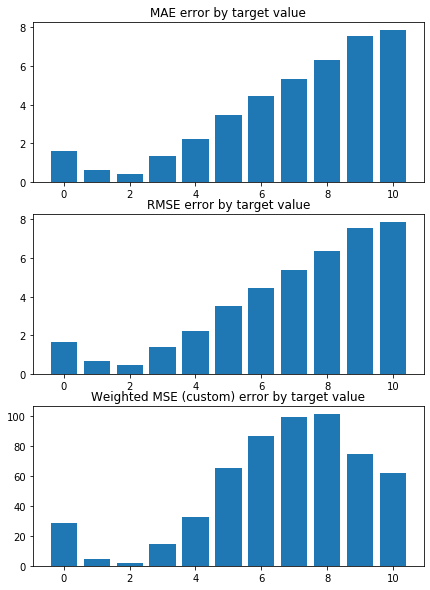

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


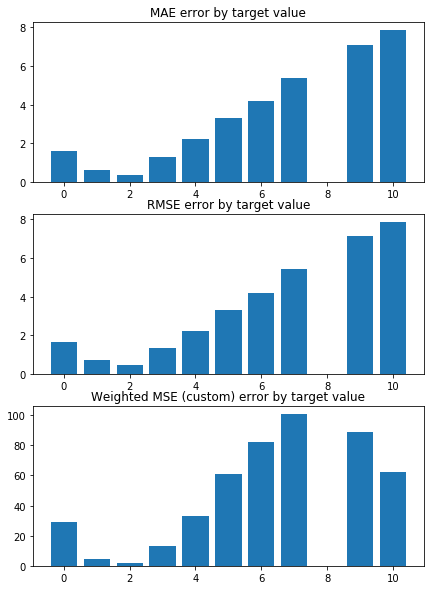

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


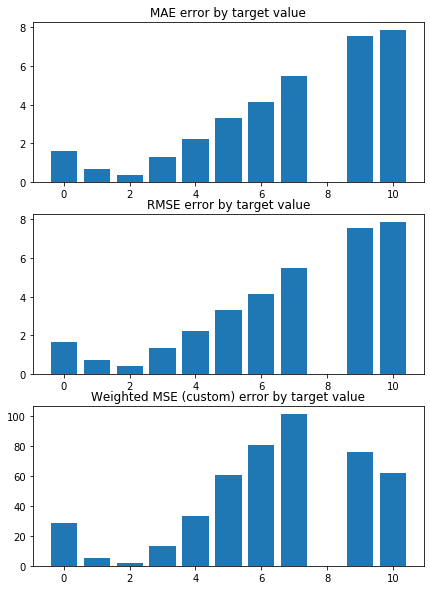

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


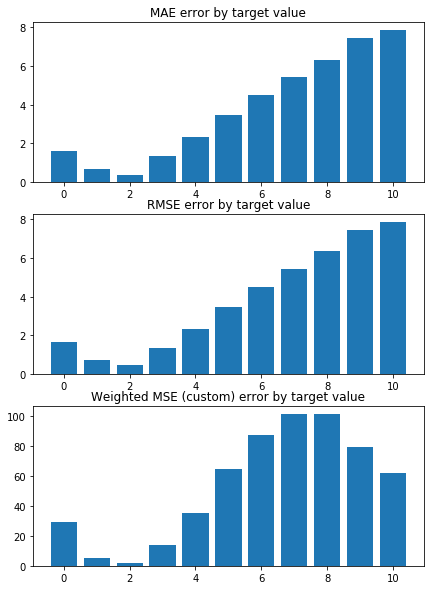

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


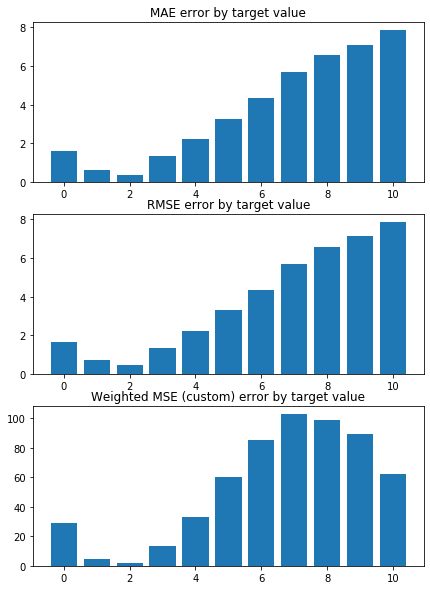

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


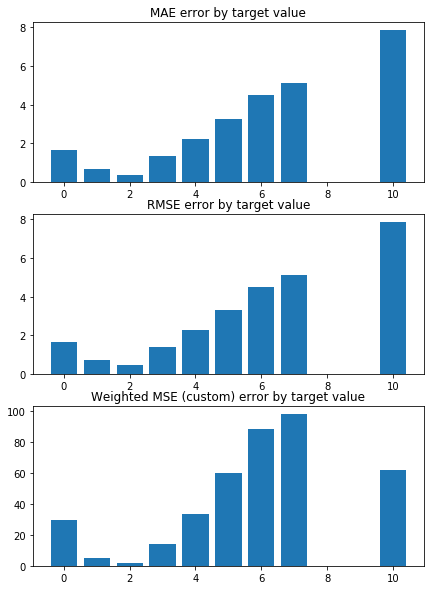

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


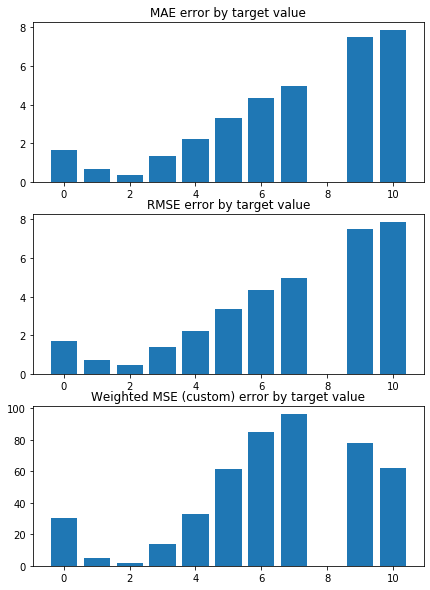

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


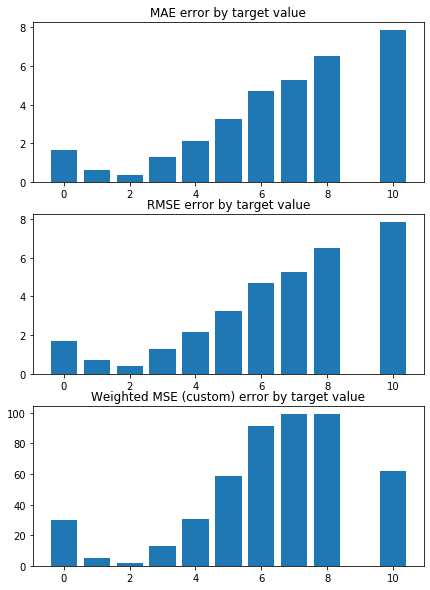

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


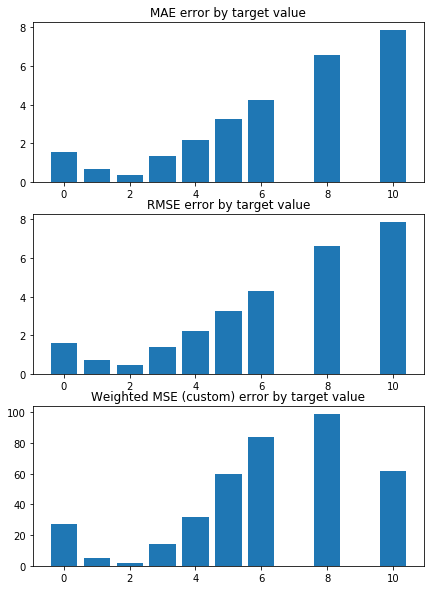

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


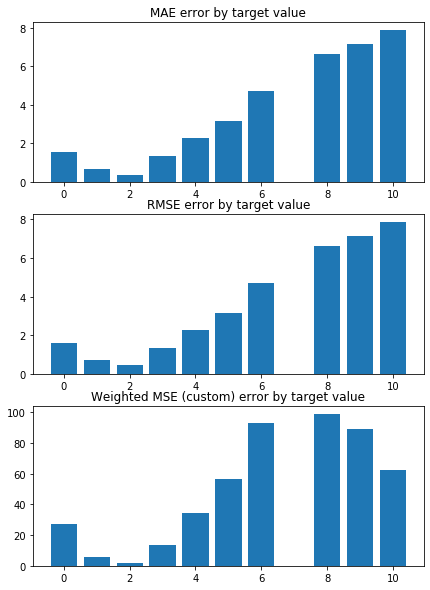

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


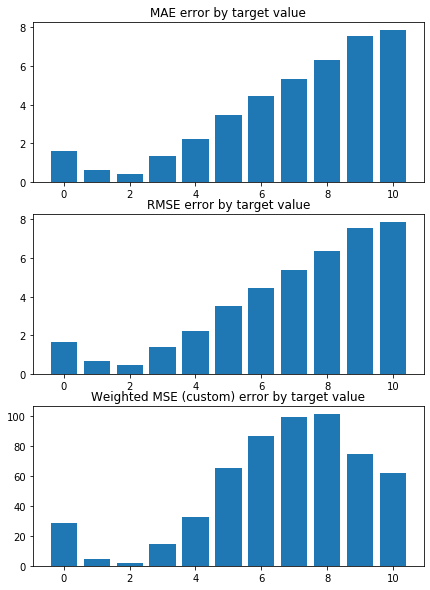

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


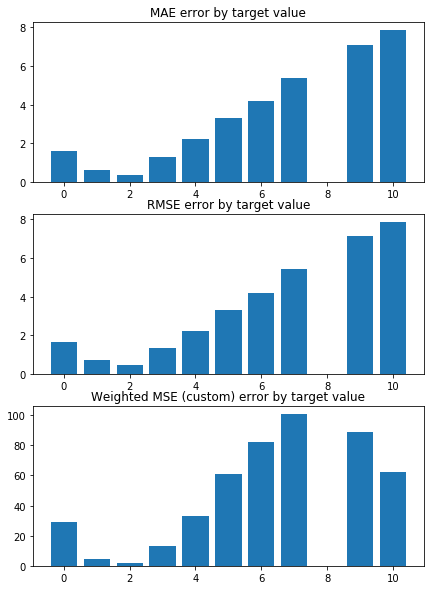

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


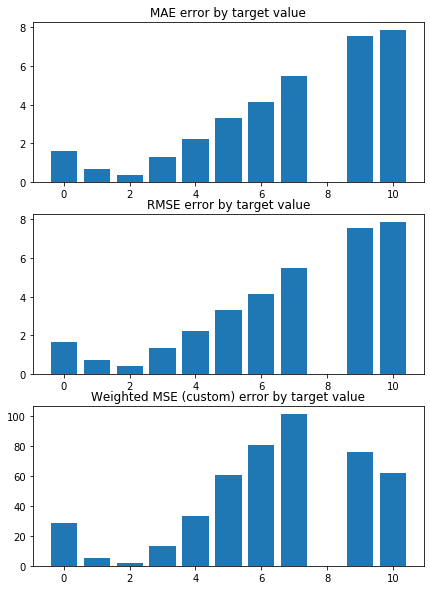

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


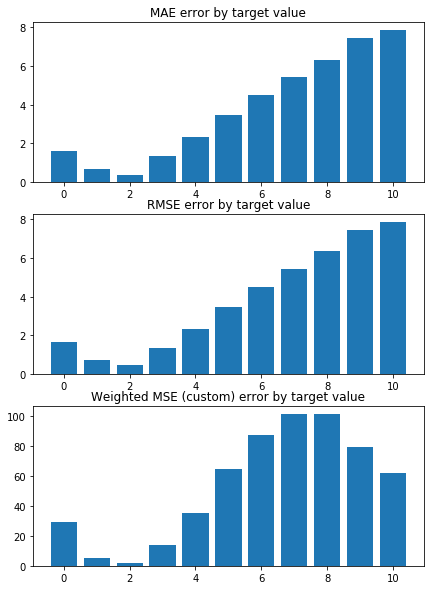

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


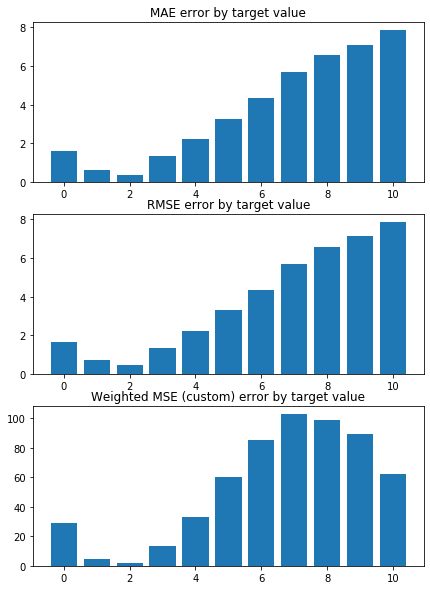

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


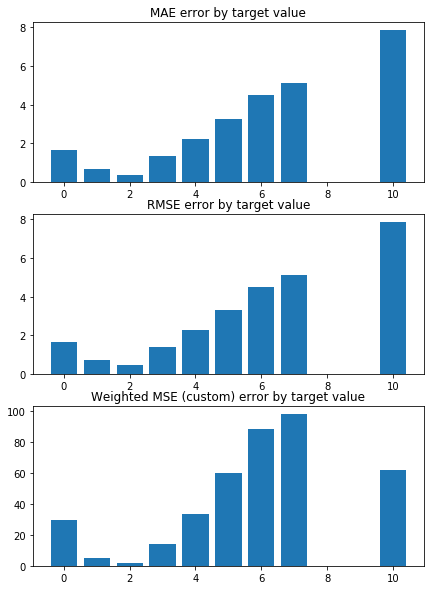

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


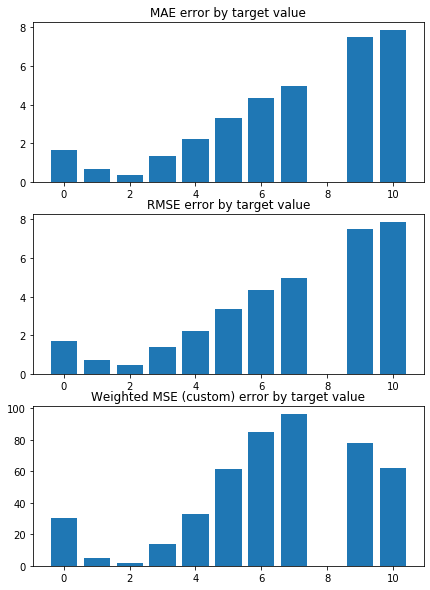

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


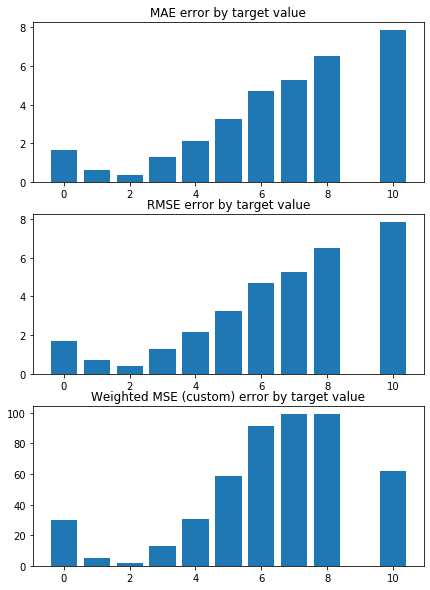

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


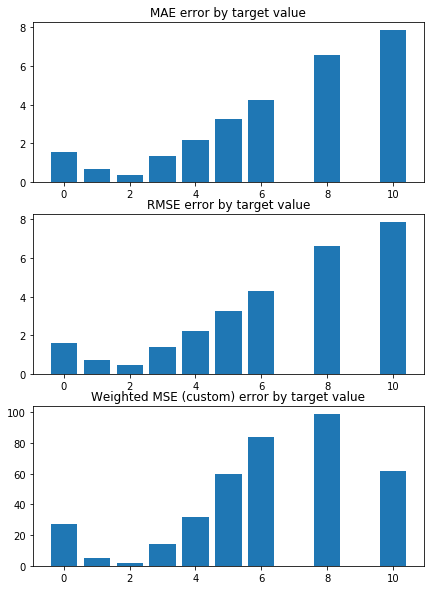

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


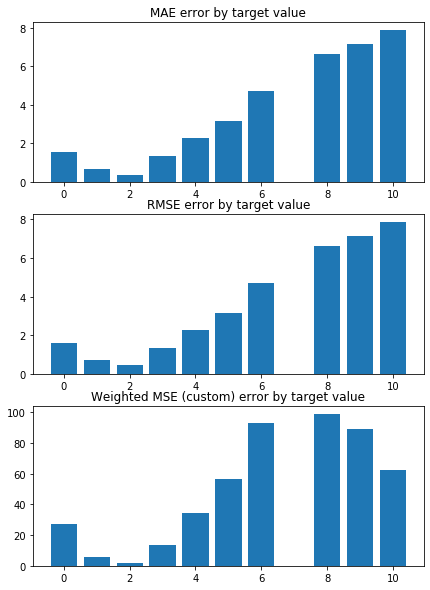

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


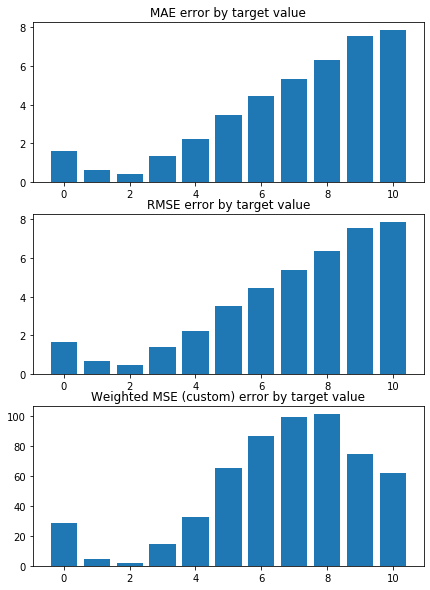

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


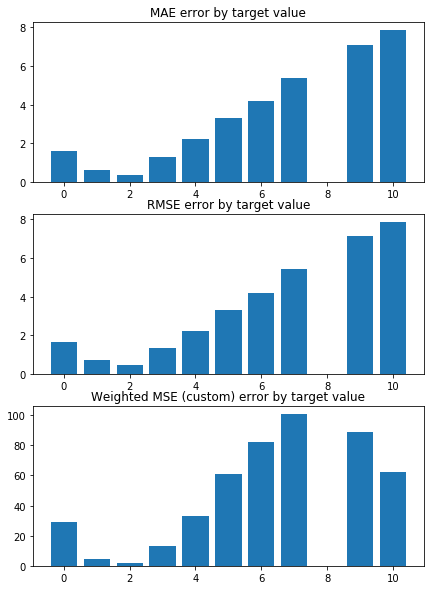

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


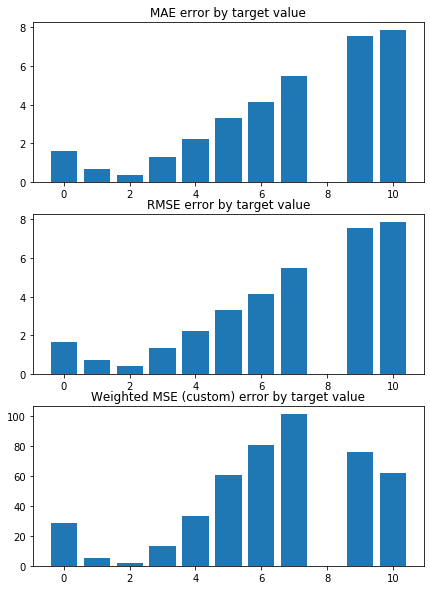

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


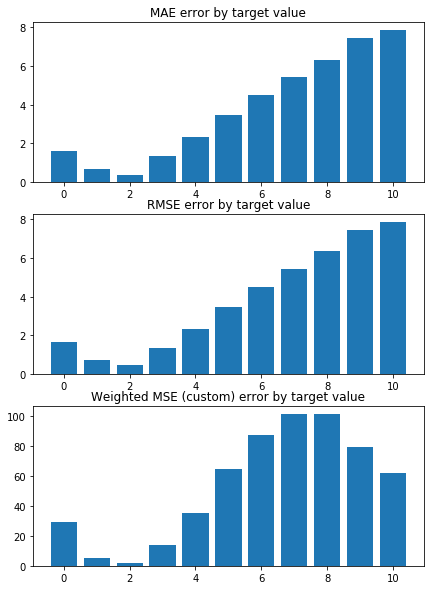

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


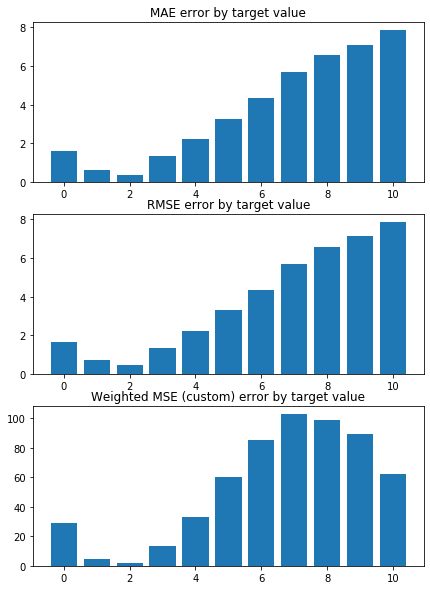

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


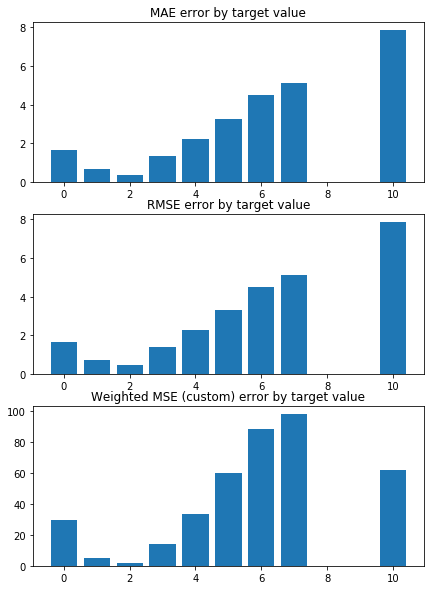

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


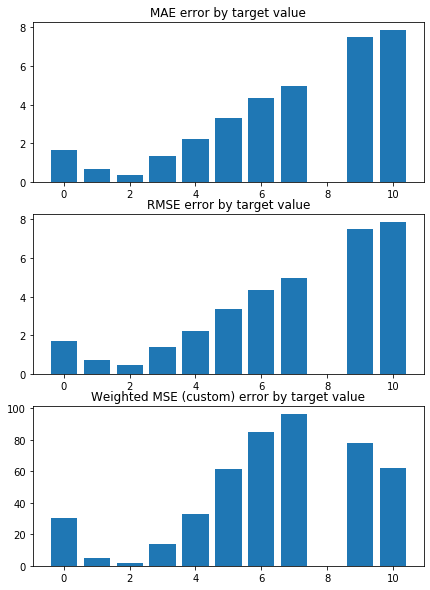

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


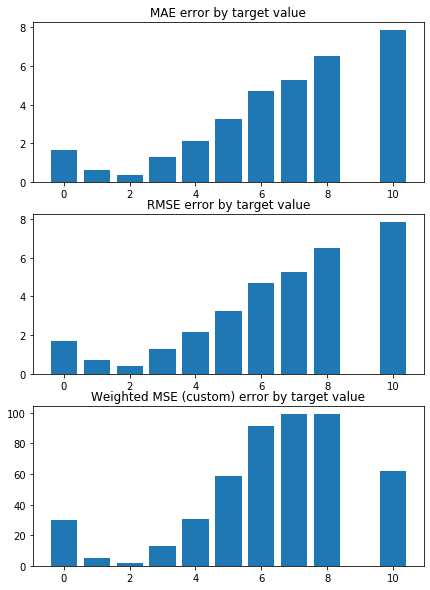

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


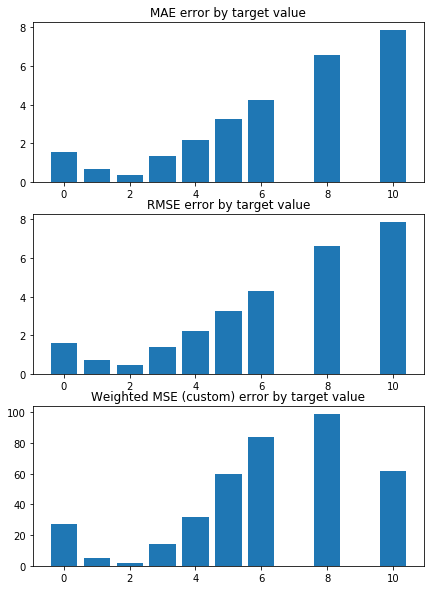

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


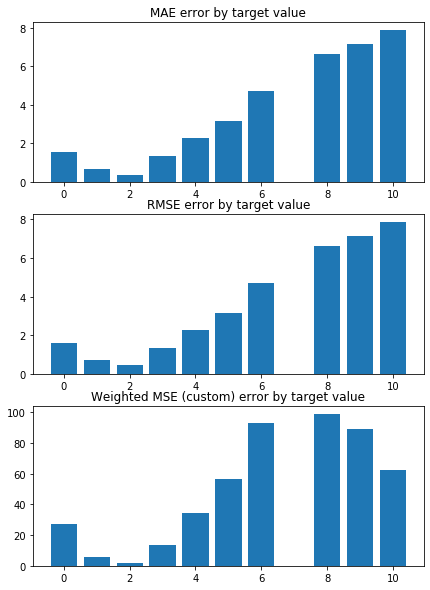

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


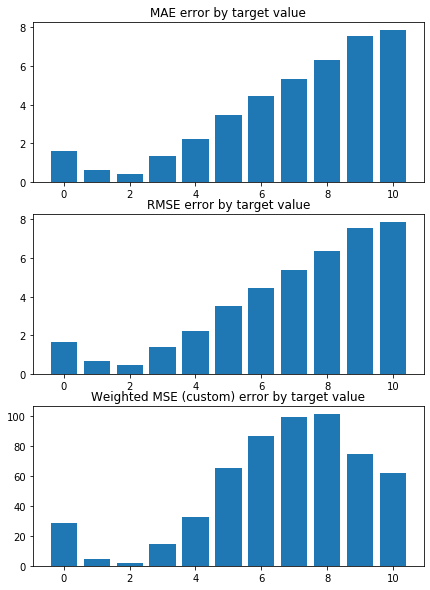

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


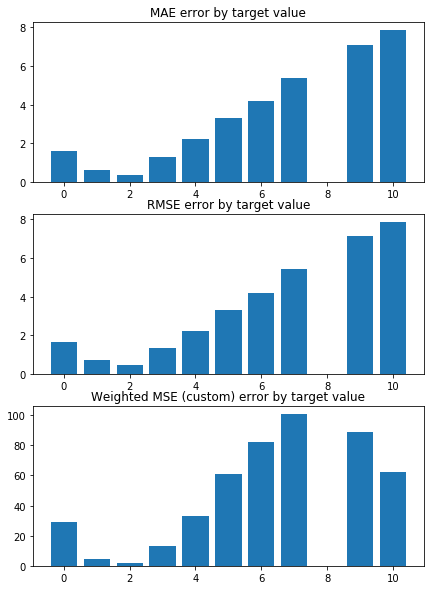

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


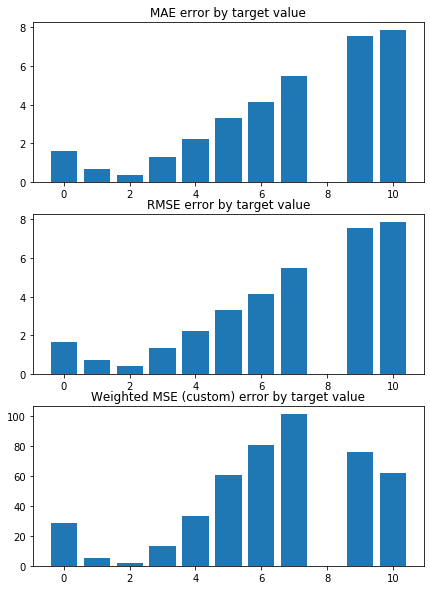

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


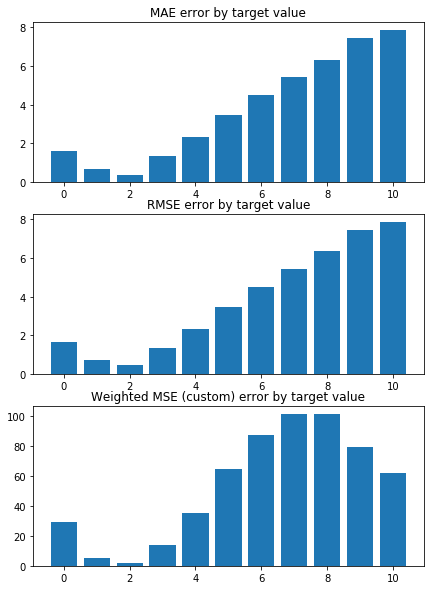

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


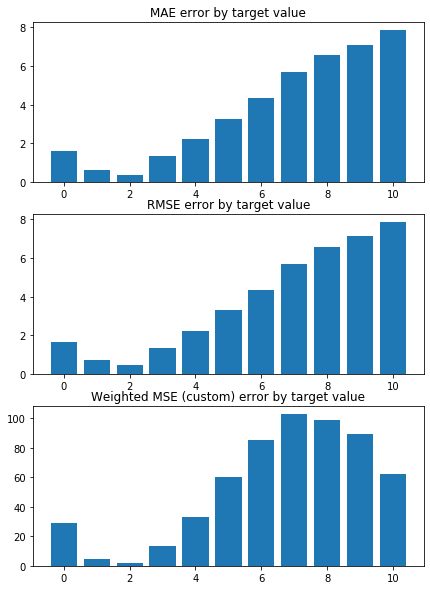

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


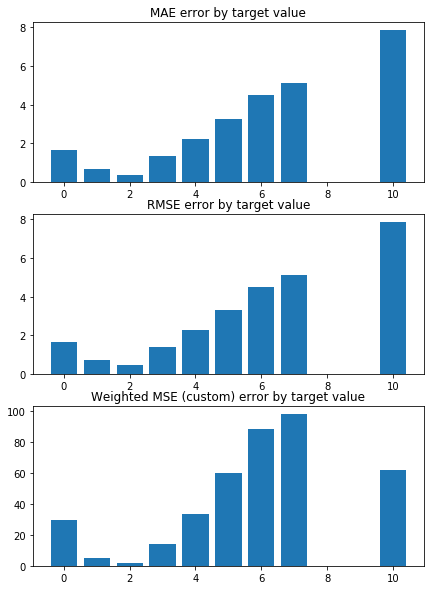

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


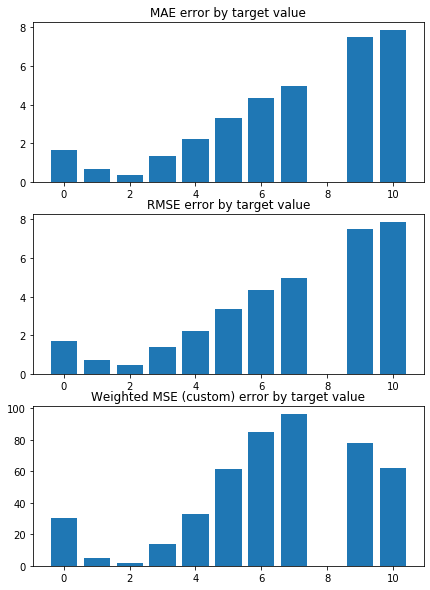

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


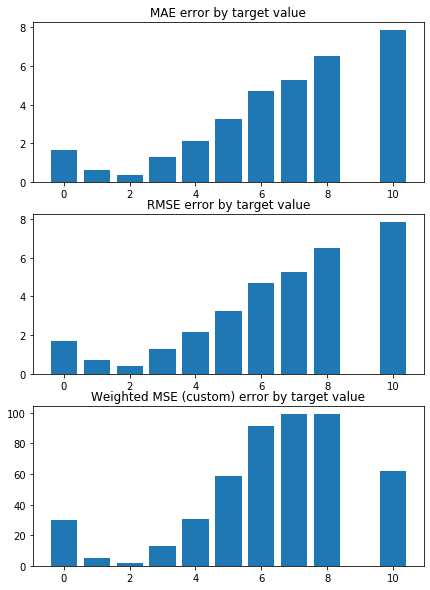

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


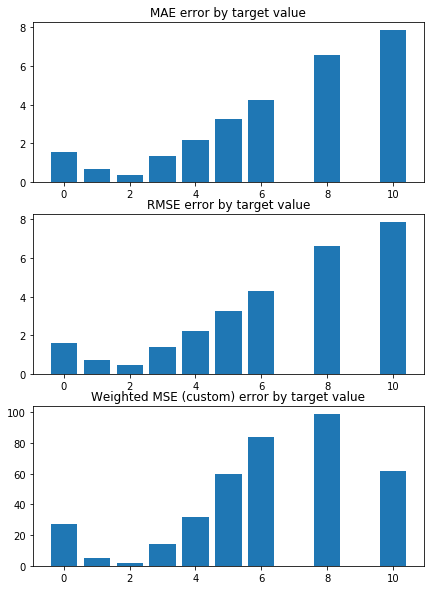

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


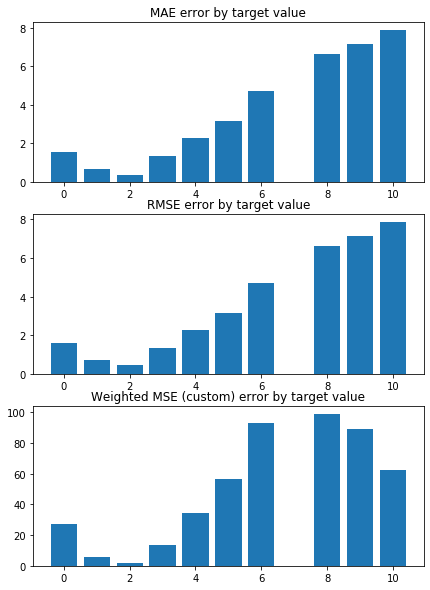

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


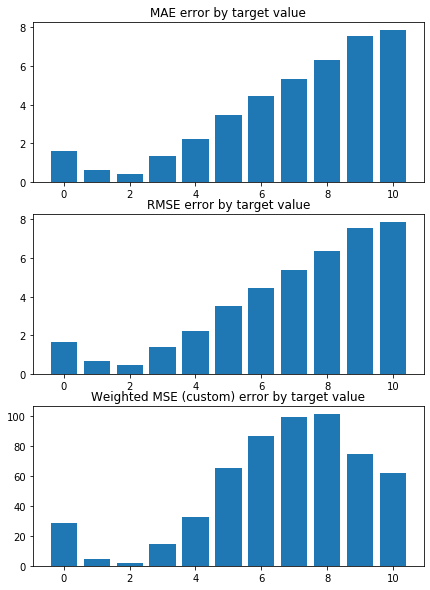

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


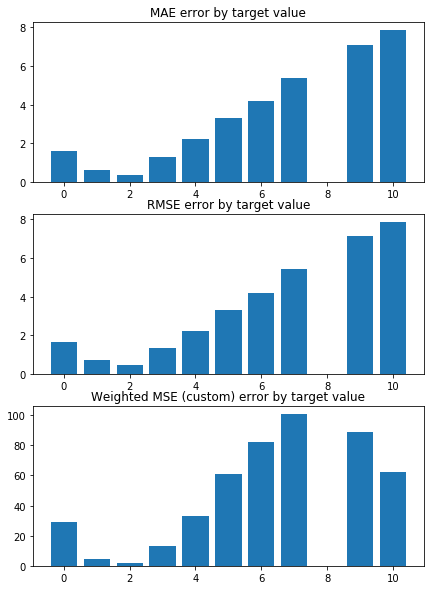

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


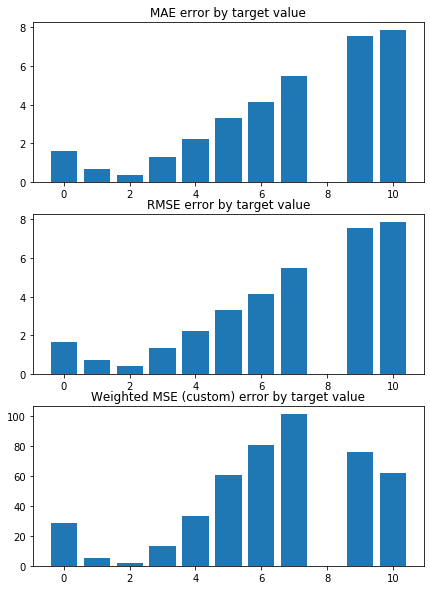

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


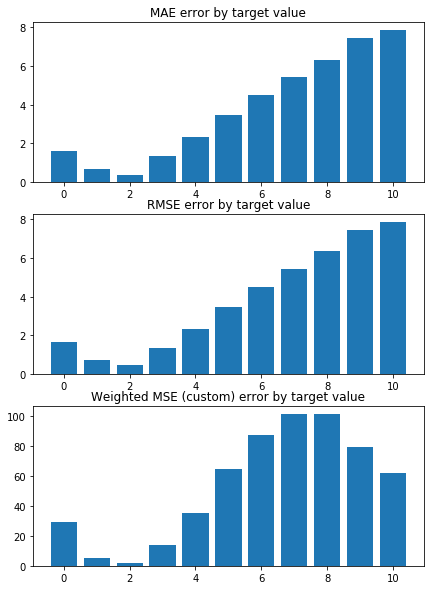

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


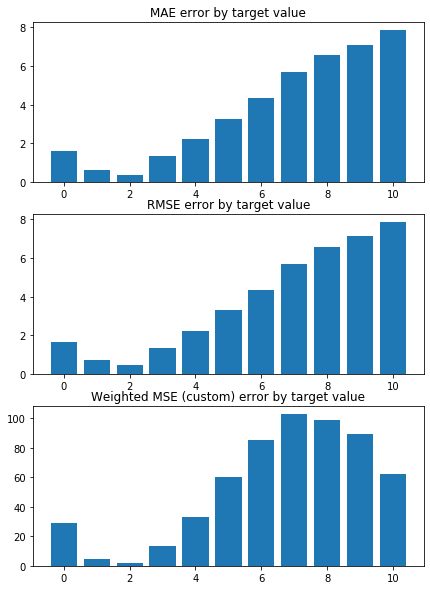

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


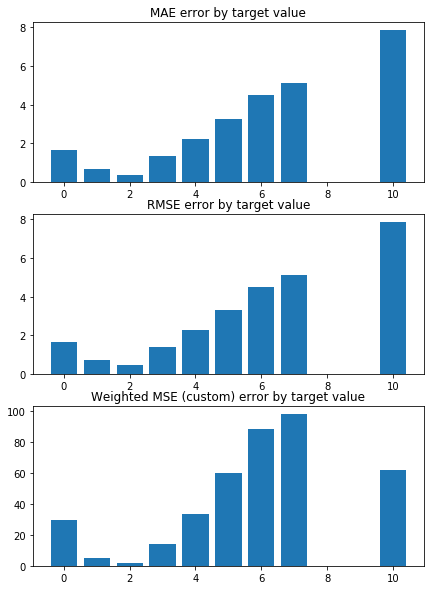

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0


In [90]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 2, 0.2)
# Create linear regression object

model_name = 'LR+L1_grid'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    _ = train_test_KFold(X, y, 
                                                  model, model_name, results_pd,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)
#     results_pd
    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


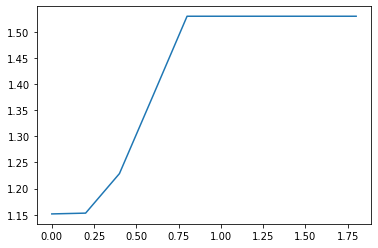

In [91]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.150429439402017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1474530001881726 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6242.865674945077, tolerance: 1.5753001672530345
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

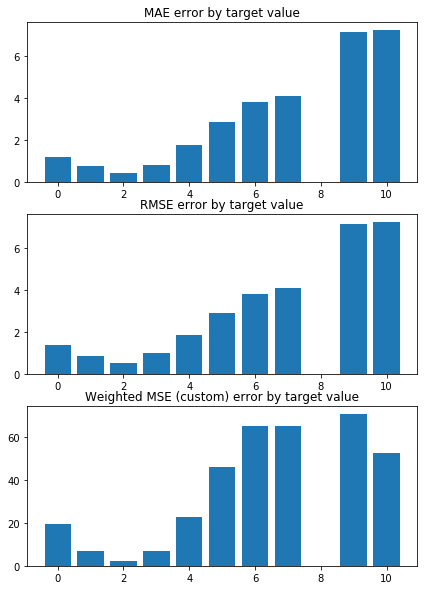

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0782543118183805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1611155407329028 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6356.670701750772, tolerance: 1.5951549408328658
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

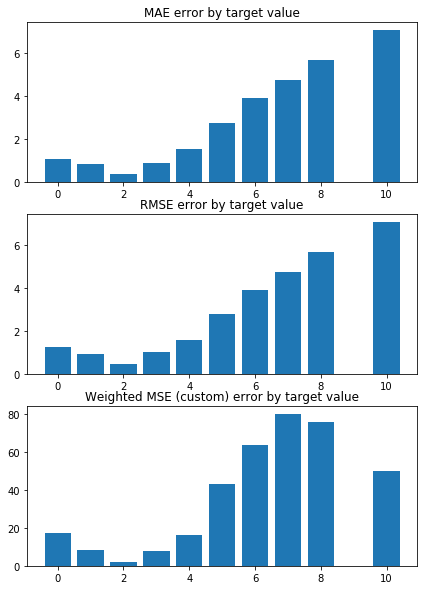

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0677171462739652 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584859794774696 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6274.133759711843, tolerance: 1.5821769354883282
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

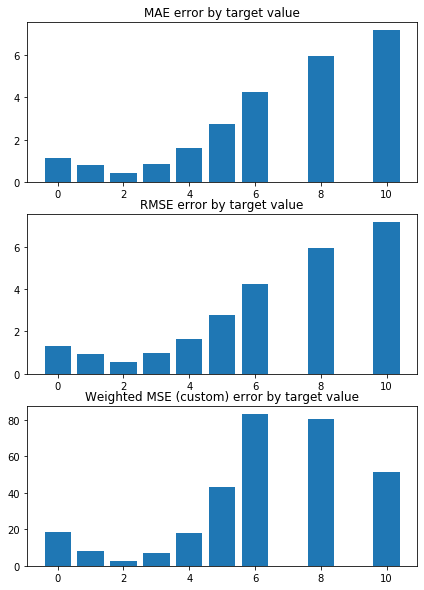

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731761631271278 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437958887539694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6094.980961909499, tolerance: 1.5581200225471517
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

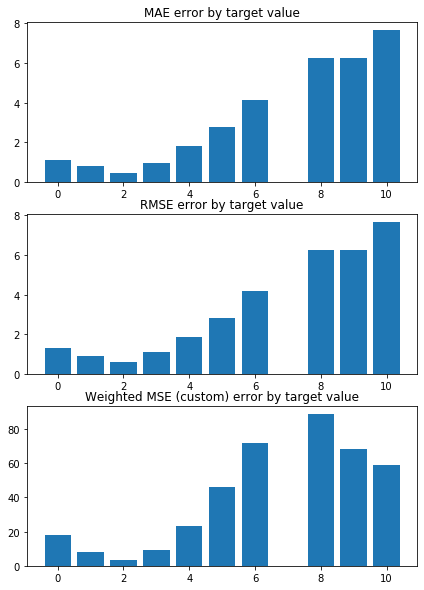

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169229129661831 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491770167028728 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6363.2855123956215, tolerance: 1.6044926244369746
  positive)


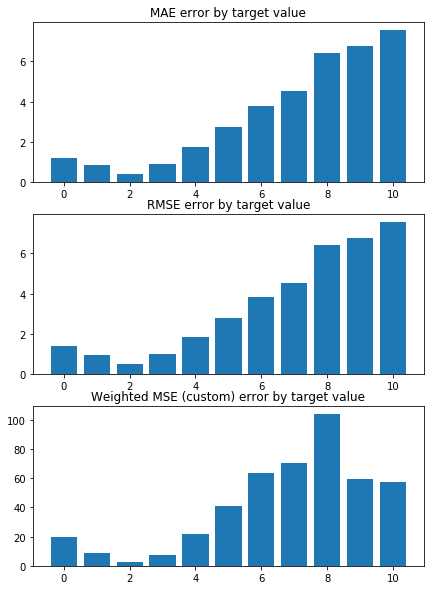

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897700170464065 


 TRAIN PREDICTION Error
weighted_mse_train: 1.144002229673775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6132.098034762407, tolerance: 1.5618709890457518
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

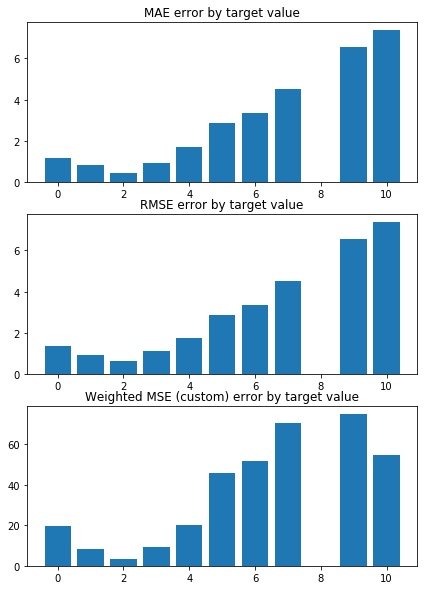

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.102058191568401 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1559393528280035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6343.068491806614, tolerance: 1.6006251832941174
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encounter

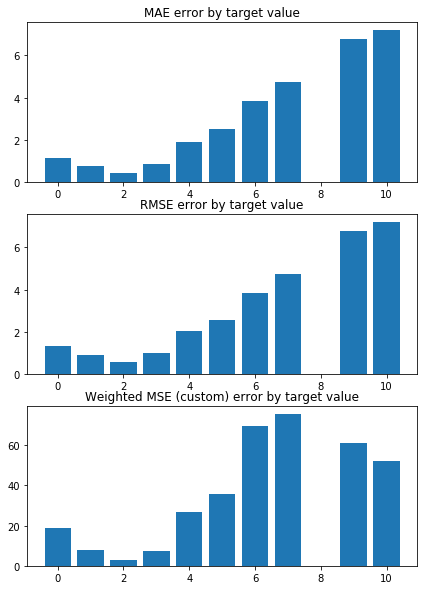

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364696945192493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409774712552478 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6292.674649939457, tolerance: 1.591772067394958
  positive)


weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


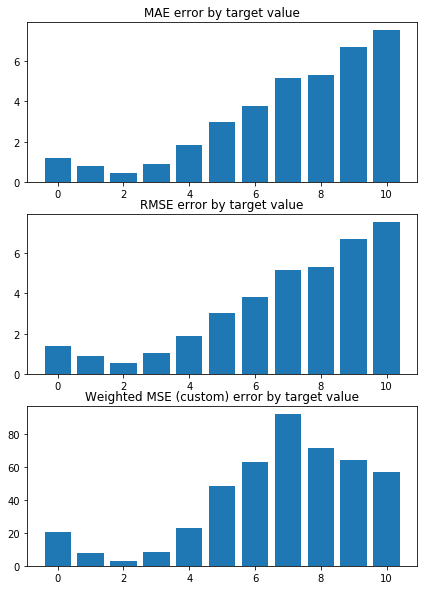

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778973501249657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133594897490691 


 CONSTANT pred Error:


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6199.585854656057, tolerance: 1.5756948114957992
  positive)


weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


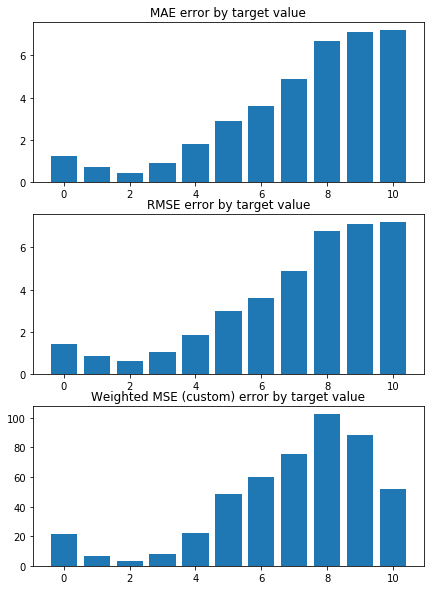

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695651766089527 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1594139569006885 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/usr/local/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 6271.05641869449, tolerance: 1.5896707153314662
  positive)
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountere

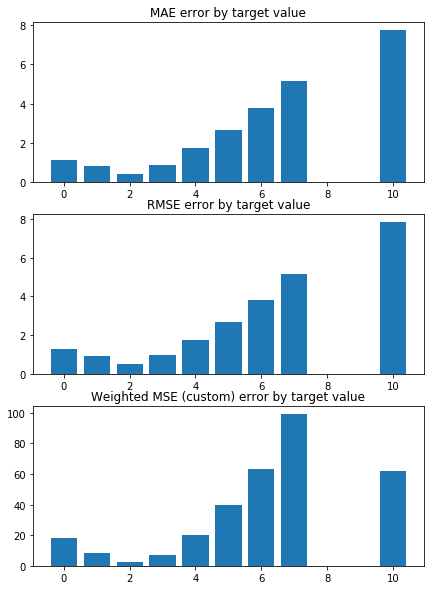

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897107771123 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410463265831885 

Root of MSE on Test: 1.07 
 1.5300478183975783 

Variance score on Test: 0.07 
 r2_test: 0.21002153096464138 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450243 -0.378528 -0.120351  0.104176  0.010957
1 -0.482286 -0.351931 -0.125640  0.094882  0.014683
2 -0.454280 -0.381915 -0.125185  0.081891  0.018755
3 -0.463124 -0.366355 -0.123296  0.111936  0.025166
4 -0.449125 -0.379371 -0.125621  0.103758  0.020455
5 -0.449878 -0.373745 -0.112968  0.119382  0.018721
6 -0.473549 -0.356155 -0.118064  0.113101  0.009478
7 -0.459020 -0.364279 -0.112133  0.118205  0.015006
8 -0.454382 -0.379319 -0.125261  0.106479  0.011607
9 -0.452735 -0.382000 -0.128770  0.116150  0.004668
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


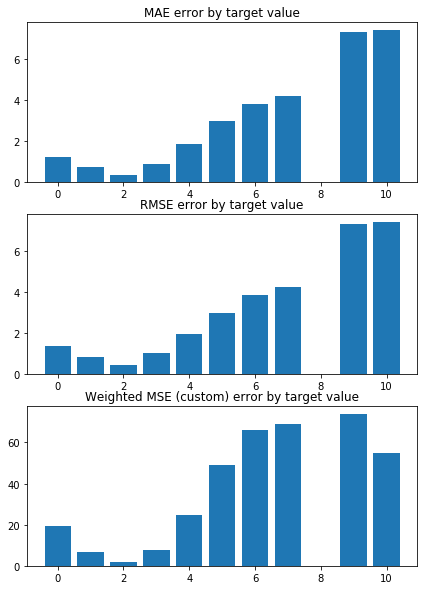

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.066142352396677 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1510299437672105 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


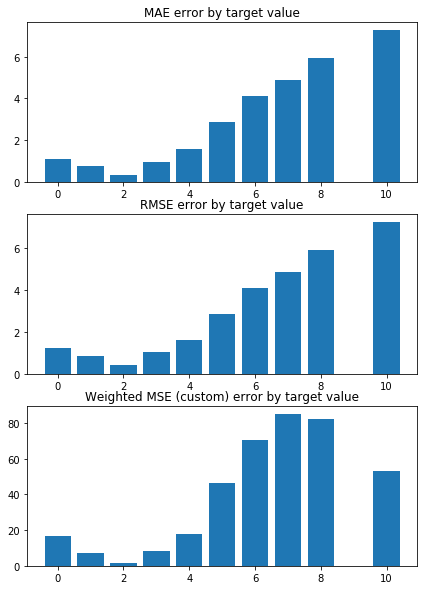

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0647265511644468 


 TRAIN PREDICTION Error
weighted_mse_train: 1.148590573206869 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


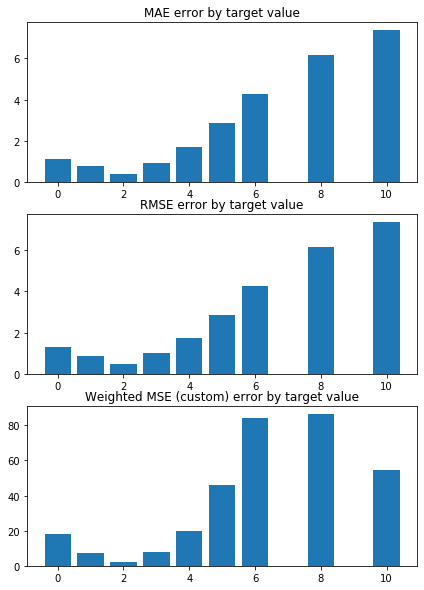

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1611463676311684 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1310686628017634 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


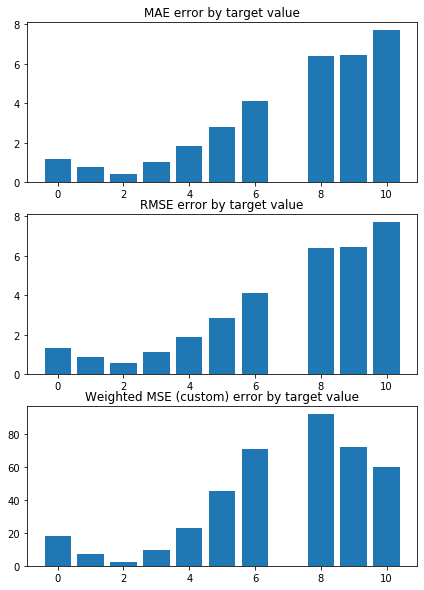

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.161984005440887 


 TRAIN PREDICTION Error
weighted_mse_train: 1.136910008538699 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


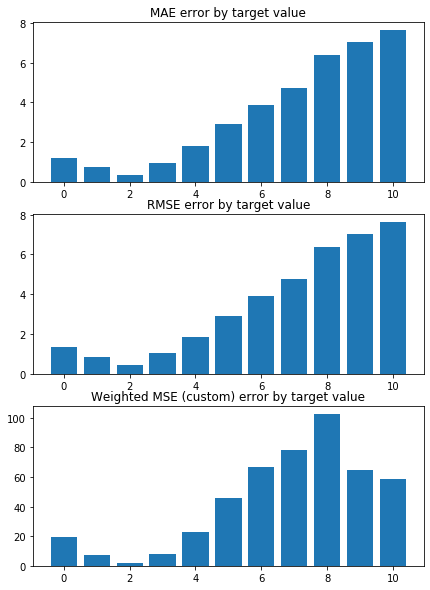

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1623072033328512 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1328678088001884 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


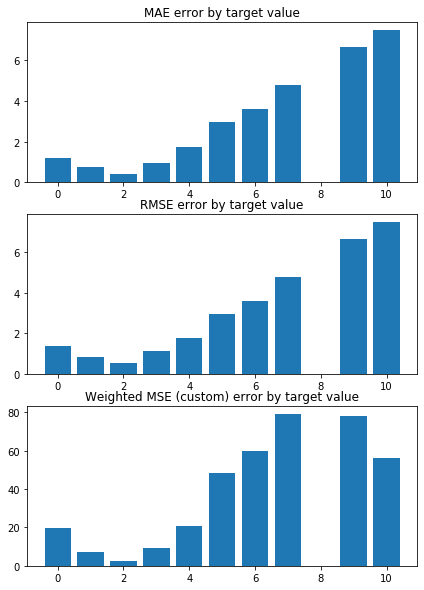

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.085140917949458 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1446035711005875 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


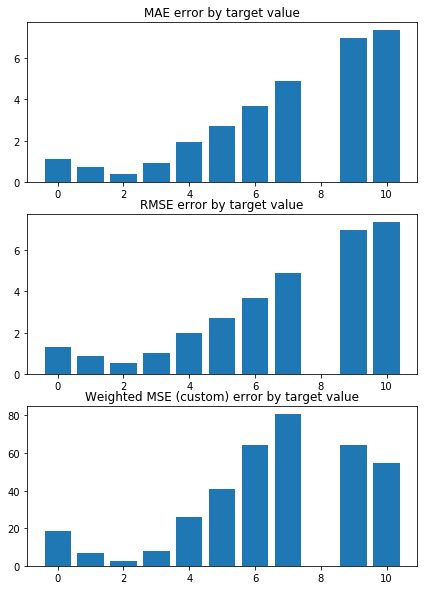

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2300313789016493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1285854755941127 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


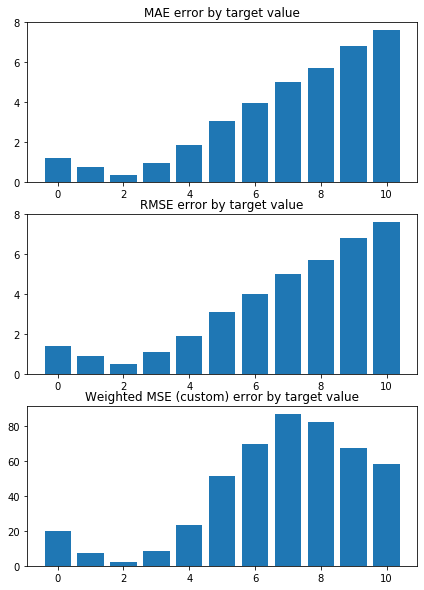

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2598131931223715 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1221122193482722 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


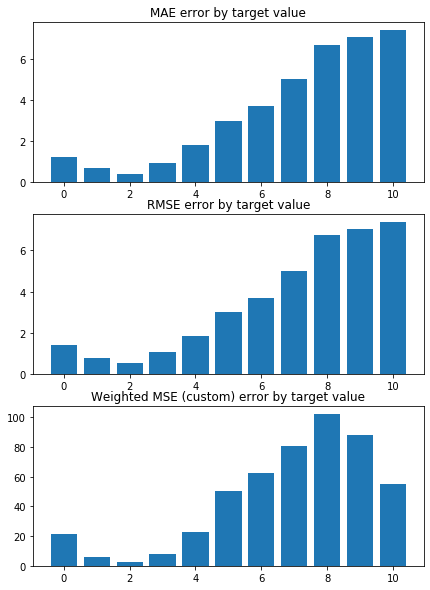

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.055396181836002 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1458671519578034 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


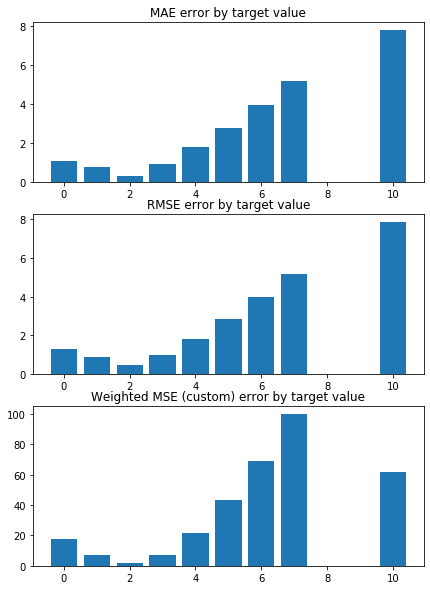

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 2.363956442345465 

Mean squared error on Test: 1.14 
 MSE mean test:  2.367188167525911 

Root of MSE on Test: 1.07 
 1.5385669200674734 

Variance score on Test: 0.07 
 r2_test: 0.20103443948770722 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 2.36
MSE_test 2.37
MAE_train 1.05
MAE_test 1.01
r2_test 0.2
       CTCF     Chriz    Su(Hw)  H3K27me3  H3K27ac
0 -0.385272 -0.292269  0.038650      -0.0      0.0
1 -0.414506 -0.264222  0.033613      -0.0      0.0
2 -0.392189 -0.291897  0.016454      -0.0      0.0
3 -0.403215 -0.278203  0.049964      -0.0      0.0
4 -0.386067 -0.291811  0.040753      -0.0      0.0
5 -0.386798 -0.292123  0.053749      -0.0      0.0
6 -0.410576 -0.269366  0.048158      -0.0      0.0
7 -0.397017 -0.280883  0.053790      -0.0      0.0
8 -0.393529 -0.288210  0.043825      -0.0      0.0
9 -0.388731 -0.290430  0.052459      -0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


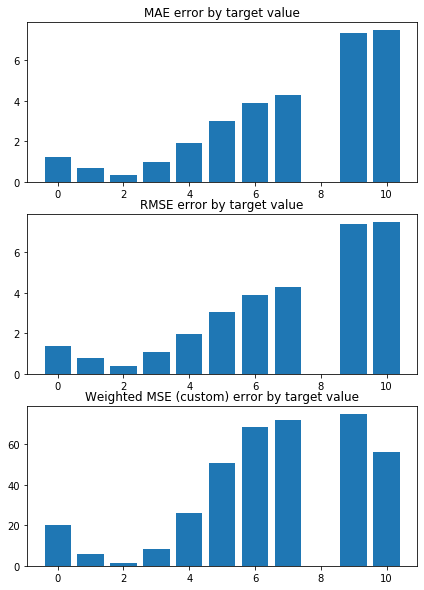

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0885359371590442 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1654541621800865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


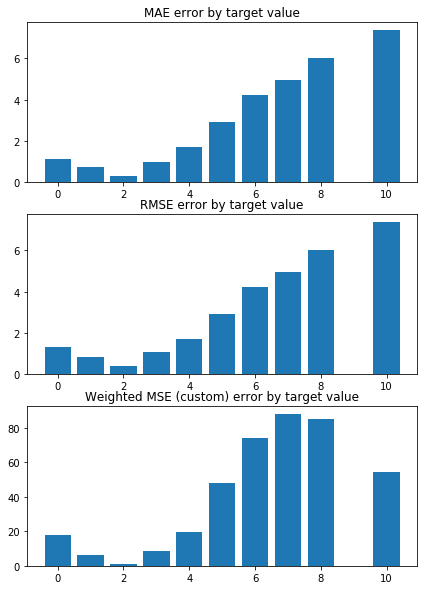

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0793940215966444 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1607748906278734 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


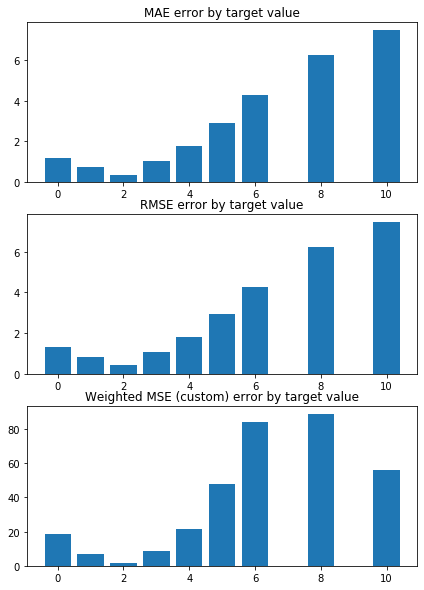

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1733769047745104 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1455388179621029 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


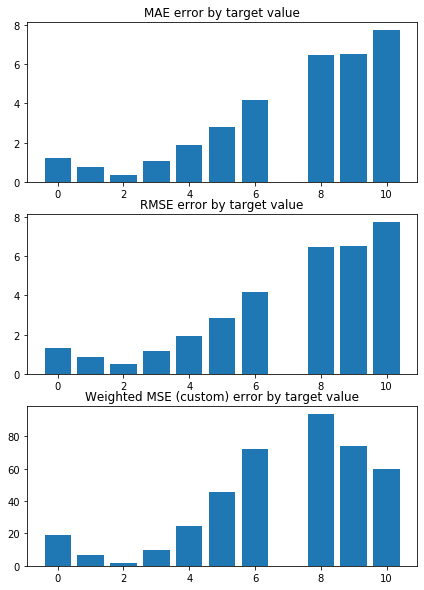

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1831840979005568 


 TRAIN PREDICTION Error
weighted_mse_train: 1.15060902902434 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


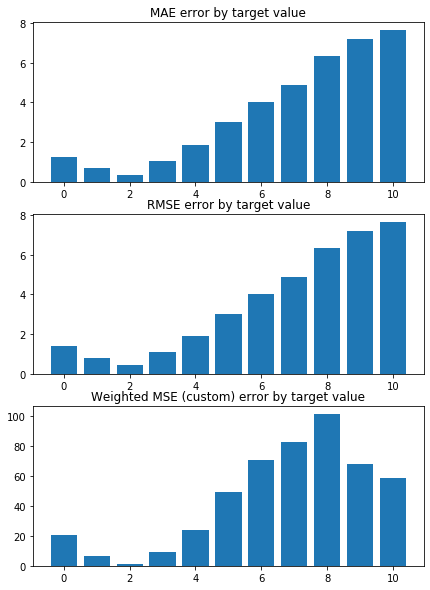

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1654818131315492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1487818558653673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


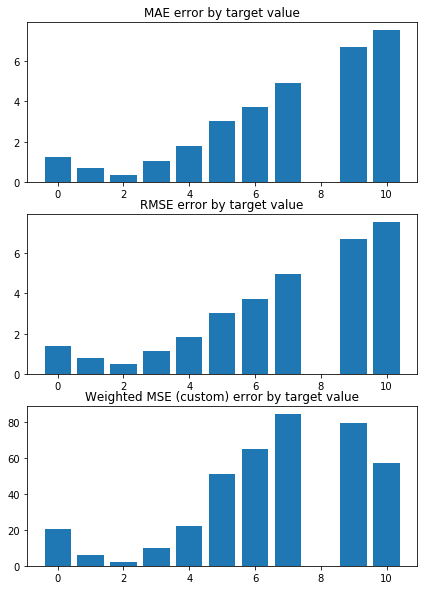

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0949015848384838 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1602631082893062 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


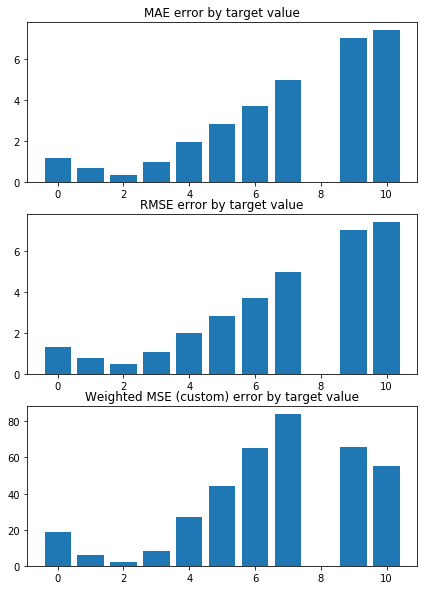

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2402030823425974 


 TRAIN PREDICTION Error
weighted_mse_train: 1.14460166876746 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


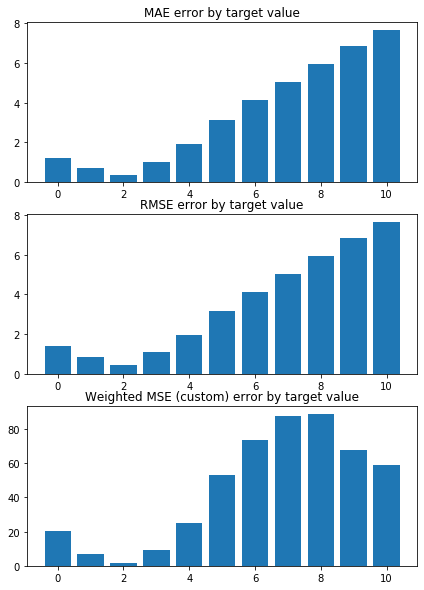

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2678845264106184 


 TRAIN PREDICTION Error
weighted_mse_train: 1.136932193951947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


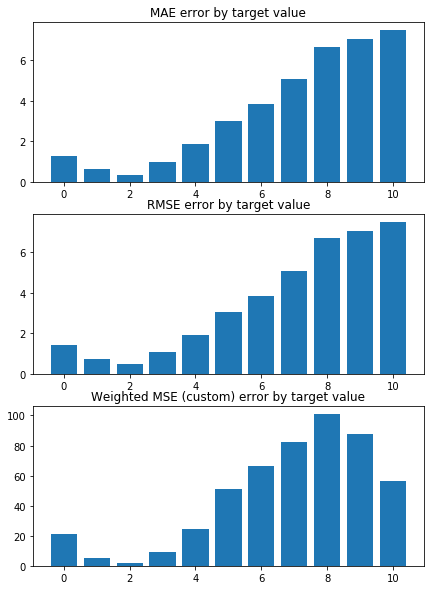

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073991347699697 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1603717867719059 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


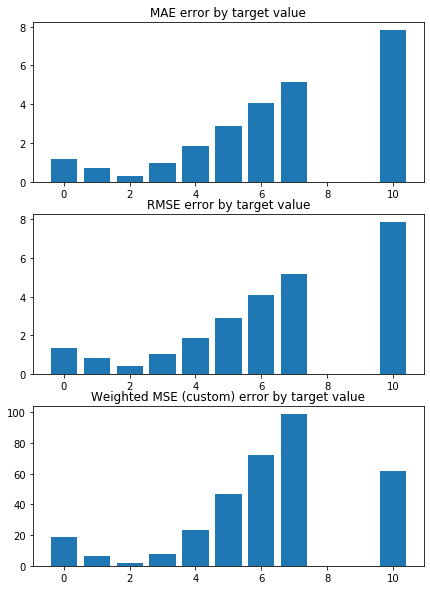

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4041708852480745 

Mean squared error on Test: 1.15 
 MSE mean test:  2.405260016843316 

Root of MSE on Test: 1.07 
 1.5508900724562382 

Variance score on Test: 0.06 
 r2_test: 0.18795107980811424 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.4
MSE_test 2.41
MAE_train 1.07
MAE_test 1.03
r2_test 0.19
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.334249 -0.246173     0.0       0.0      0.0
1 -0.361793 -0.217149     0.0       0.0      0.0
2 -0.341658 -0.239702     0.0       0.0      0.0
3 -0.358577 -0.231177     0.0       0.0      0.0
4 -0.338930 -0.244014     0.0       0.0      0.0
5 -0.338864 -0.248533     0.0       0.0      0.0
6 -0.362137 -0.223485     0.0       0.0      0.0
7 -0.349952 -0.235776     0.0       0.0      0.0
8 -0.347587 -0.240122     0.0       0.0      0.0
9 -0.340536 -0.246393     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 594

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


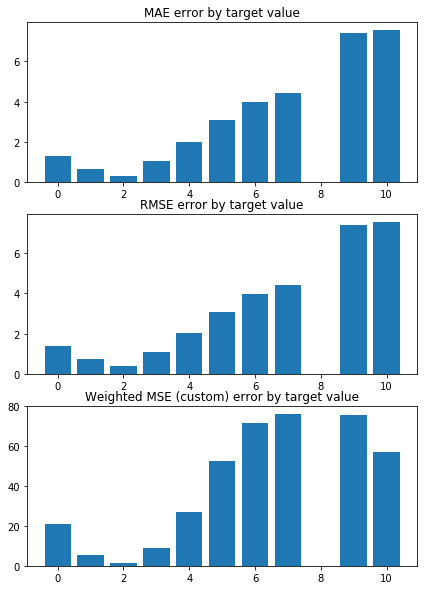

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1275150247544061 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1949963243325117 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


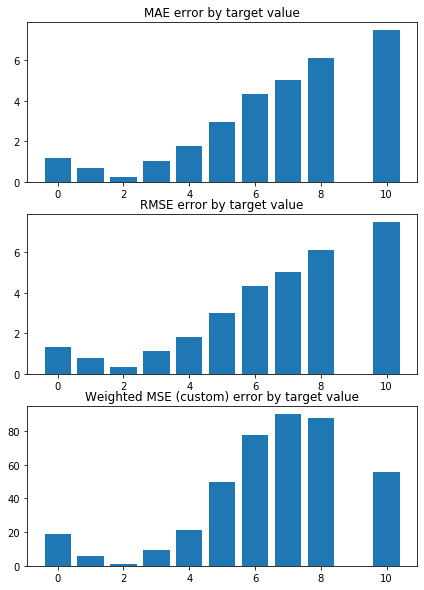

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1073429588593358 


 TRAIN PREDICTION Error
weighted_mse_train: 1.189708067732847 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


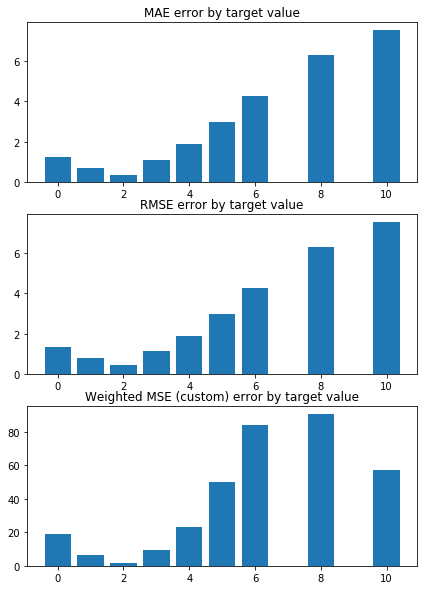

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1948680484525296 


 TRAIN PREDICTION Error
weighted_mse_train: 1.173081394386801 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


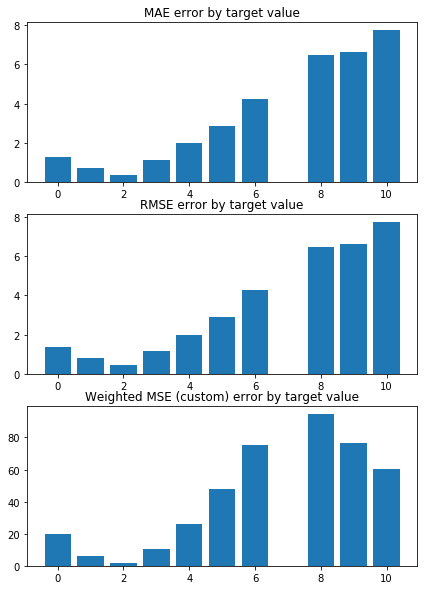

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2155555601597434 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1782958119804963 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


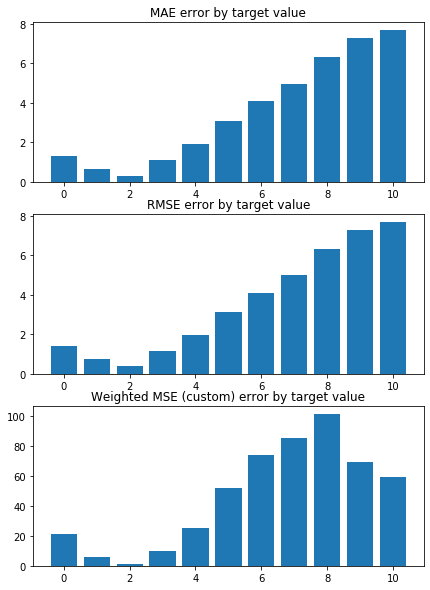

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1829791987551592 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1774269300954547 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


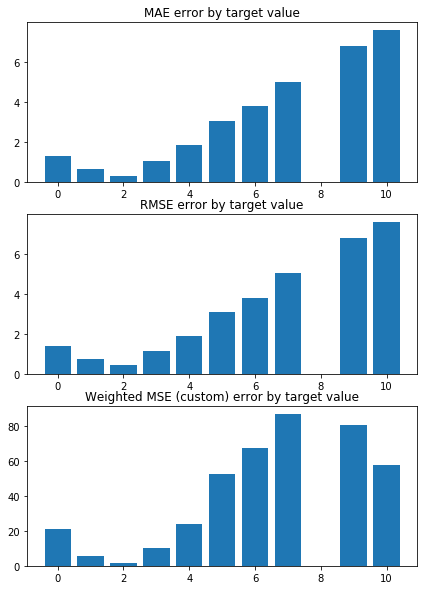

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1206822011362605 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1894364722465847 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


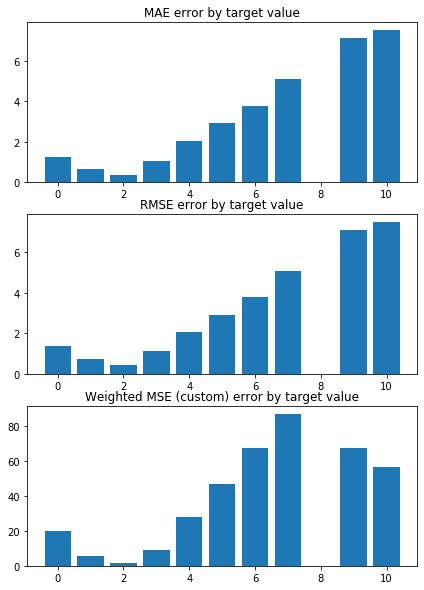

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2695200506546453 


 TRAIN PREDICTION Error
weighted_mse_train: 1.172923970282583 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


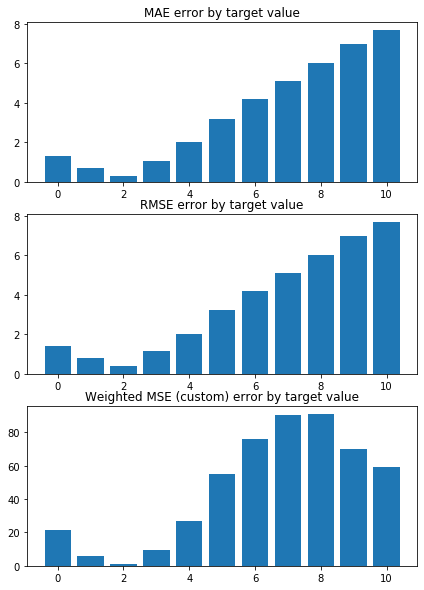

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2910717641237115 


 TRAIN PREDICTION Error
weighted_mse_train: 1.164969887106728 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


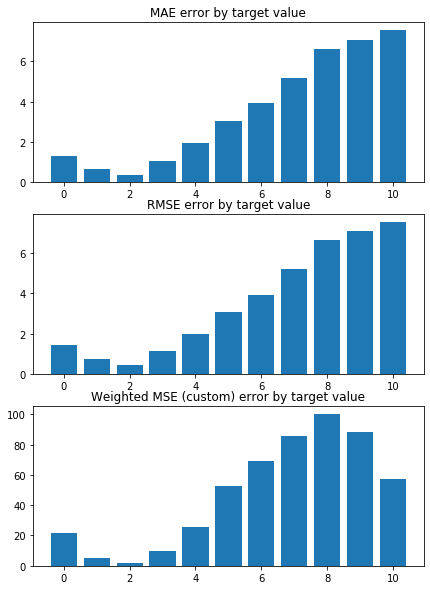

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1103003158100422 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1873856930062037 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


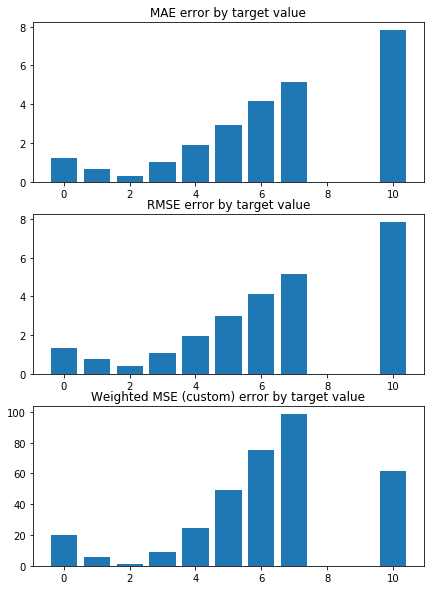

Weighted Mean squared error on Train: 1.18 
 MSE mean train: 2.4579105731621924 

Mean squared error on Test: 1.18 
 MSE mean test:  2.4591385866495328 

Root of MSE on Test: 1.09 
 1.568164081545529 

Variance score on Test: 0.06 
 r2_test: 0.16948410254402127 

wMSE_train 1.18
wMSE_test 1.18
MSE_train 2.46
MSE_test 2.46
MAE_train 1.09
MAE_test 1.06
r2_test 0.17
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.278301 -0.193954     0.0       0.0      0.0
1 -0.304749 -0.164534     0.0       0.0      0.0
2 -0.289265 -0.184821     0.0       0.0      0.0
3 -0.307400 -0.176104     0.0       0.0      0.0
4 -0.286673 -0.189588     0.0       0.0      0.0
5 -0.284316 -0.196259     0.0       0.0      0.0
6 -0.307328 -0.170060     0.0       0.0      0.0
7 -0.296433 -0.181724     0.0       0.0      0.0
8 -0.296134 -0.184807     0.0       0.0      0.0
9 -0.286304 -0.193217     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 59

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


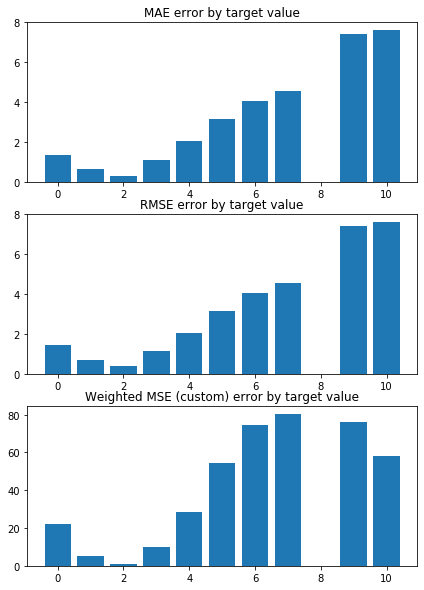

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897599739529106 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2434507200485327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


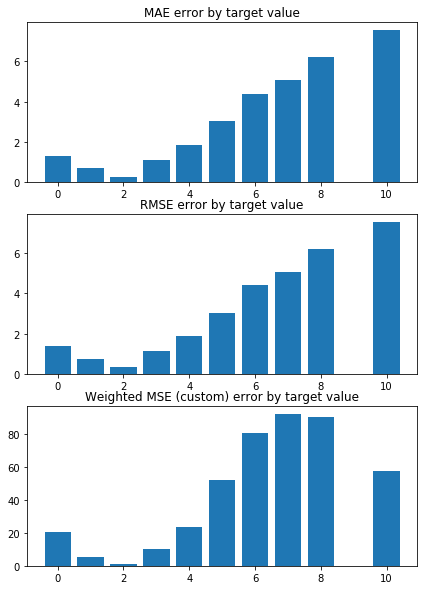

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.153530171107625 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2371622857402362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


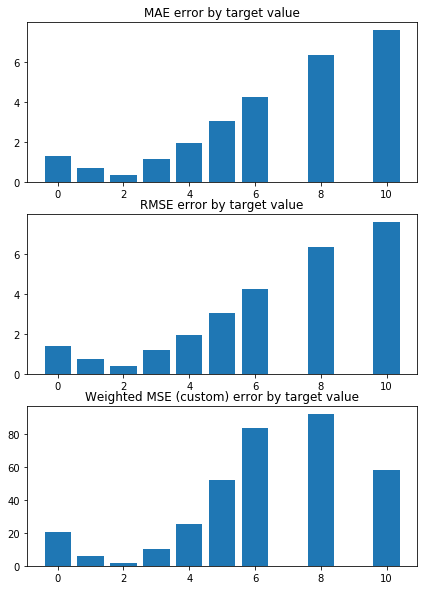

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.232389579949166 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2189985021967036 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


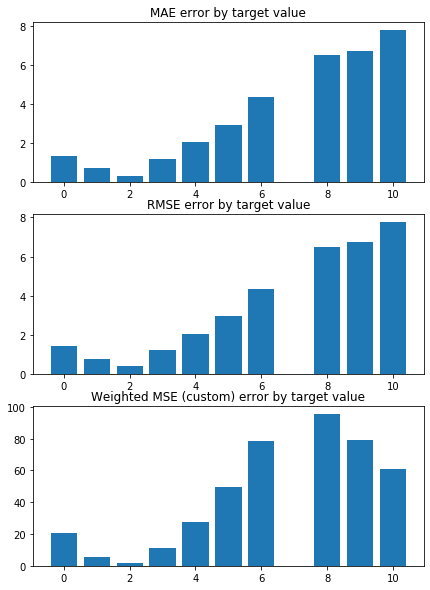

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.265136795700116 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2243762250092542 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


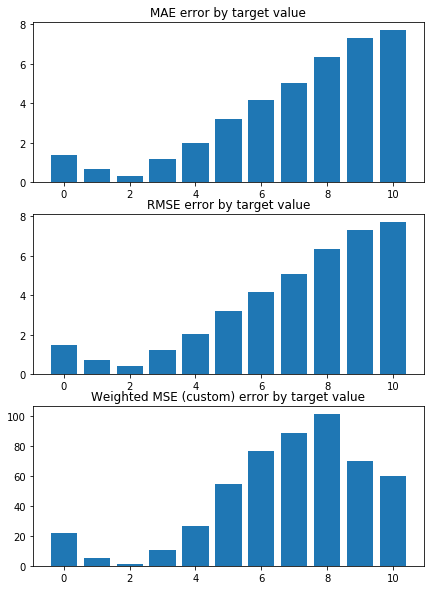

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.217522494757862 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2245511367818793 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


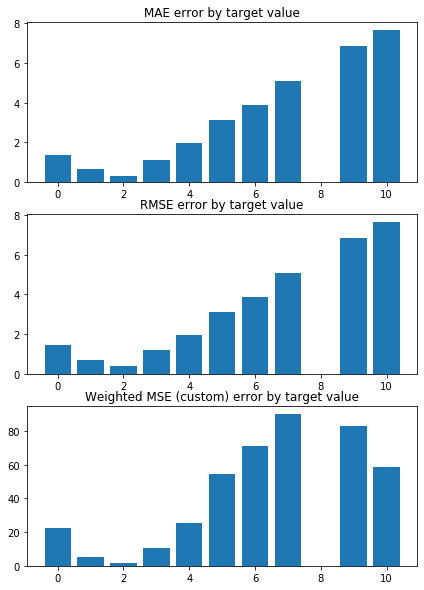

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1666018630270214 


 TRAIN PREDICTION Error
weighted_mse_train: 1.237316823066475 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


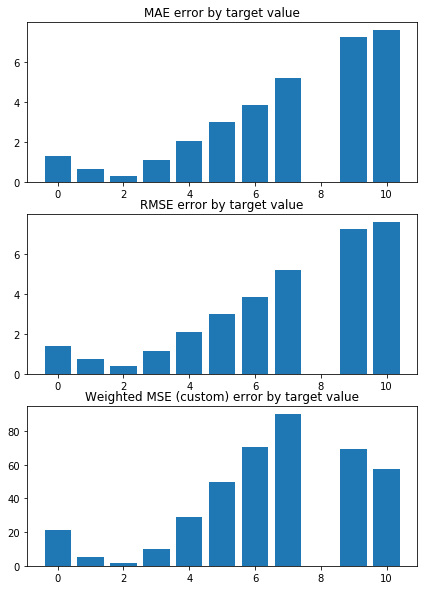

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3177978386905727 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2198130162898877 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


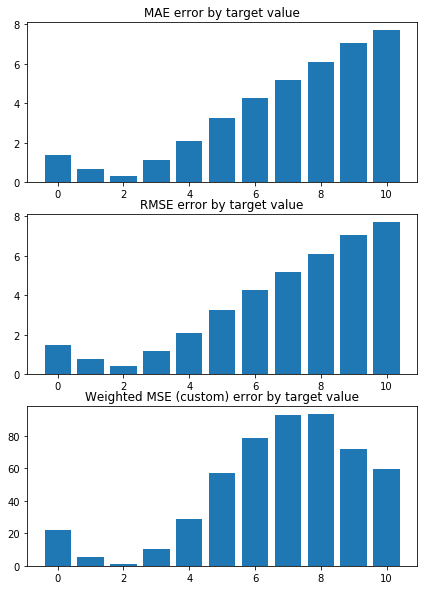

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3313384062992017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2114659406901662 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


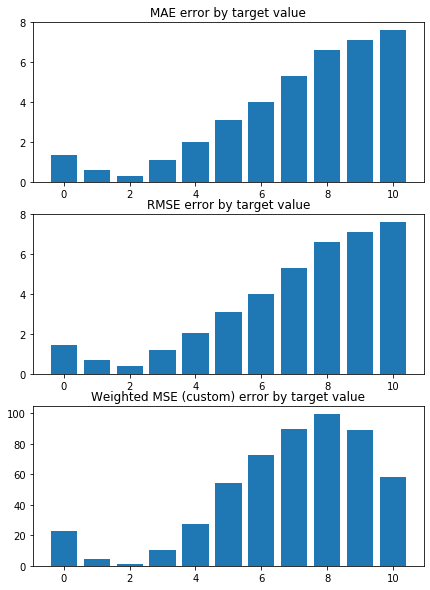

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1648531373625626 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2329746784171327 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


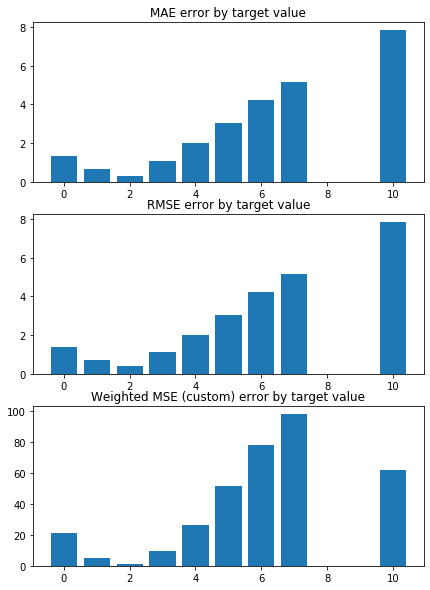

Weighted Mean squared error on Train: 1.23 
 MSE mean train: 2.5331474134154943 

Mean squared error on Test: 1.23 
 MSE mean test:  2.5345768783777545 

Root of MSE on Test: 1.11 
 1.592035451357084 

Variance score on Test: 0.06 
 r2_test: 0.14364113421504082 

wMSE_train 1.23
wMSE_test 1.23
MSE_train 2.53
MSE_test 2.53
MAE_train 1.12
MAE_test 1.09
r2_test 0.14
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.222353 -0.141734     0.0       0.0      0.0
1 -0.247705 -0.111918     0.0       0.0      0.0
2 -0.236872 -0.129939     0.0       0.0      0.0
3 -0.256224 -0.121031     0.0       0.0      0.0
4 -0.234416 -0.135162     0.0       0.0      0.0
5 -0.229767 -0.143984     0.0       0.0      0.0
6 -0.252520 -0.116635     0.0       0.0      0.0
7 -0.242914 -0.127673     0.0       0.0      0.0
8 -0.244681 -0.129492     0.0       0.0      0.0
9 -0.232072 -0.140041     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 59

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


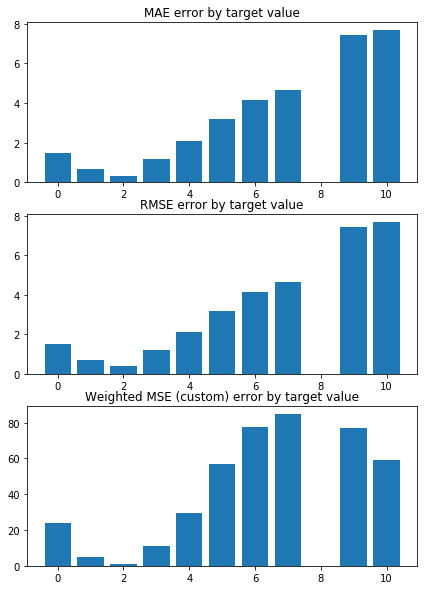

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.275270784754557 


 TRAIN PREDICTION Error
weighted_mse_train: 1.31081734932815 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


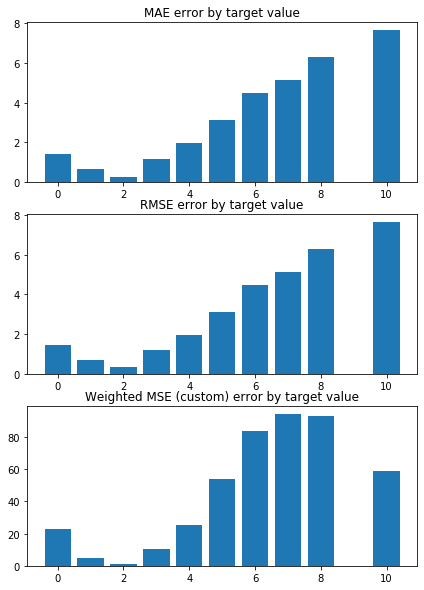

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2179556583415116 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3031375446500422 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


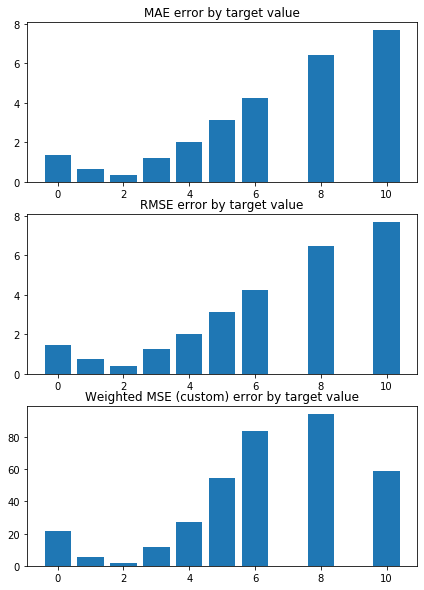

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2859414992644196 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2832901413918107 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


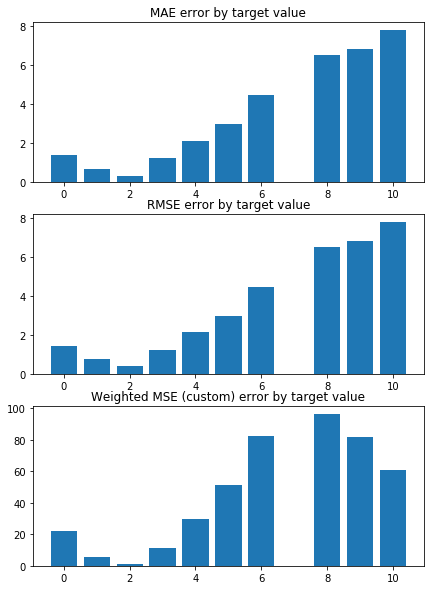

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3319278045216754 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2888502681106144 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


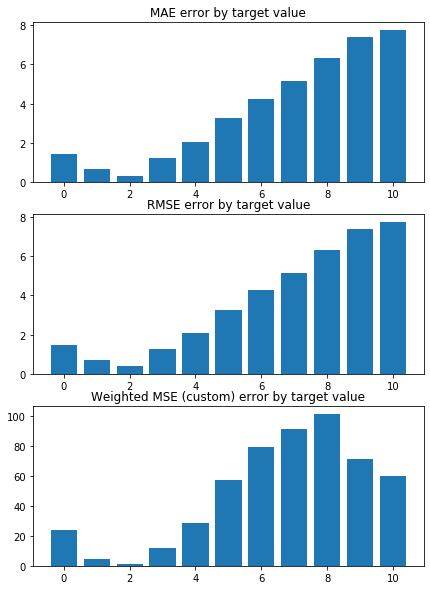

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.269111701139658 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2901544759246415 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


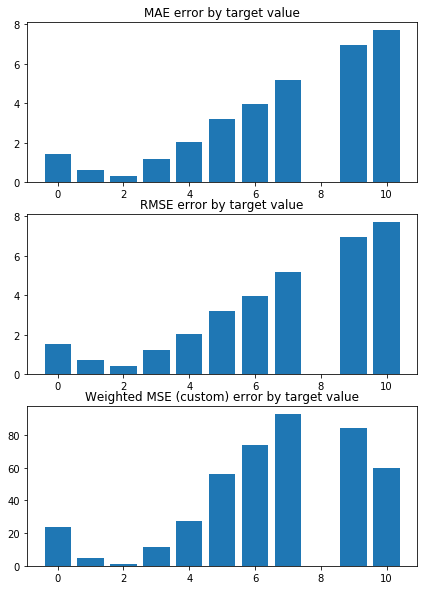

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.232660570510765 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3039041607489759 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


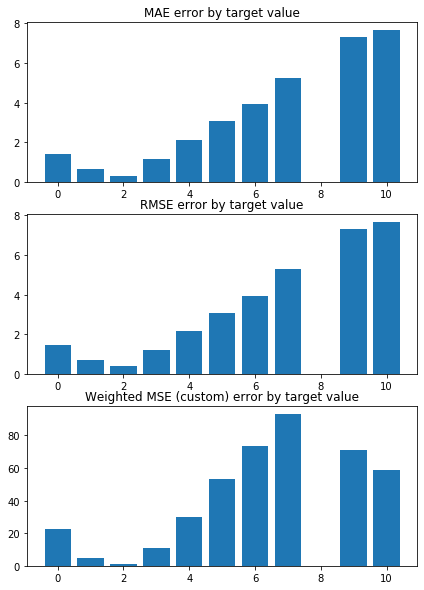

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.3850364464503775 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2852688067893725 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


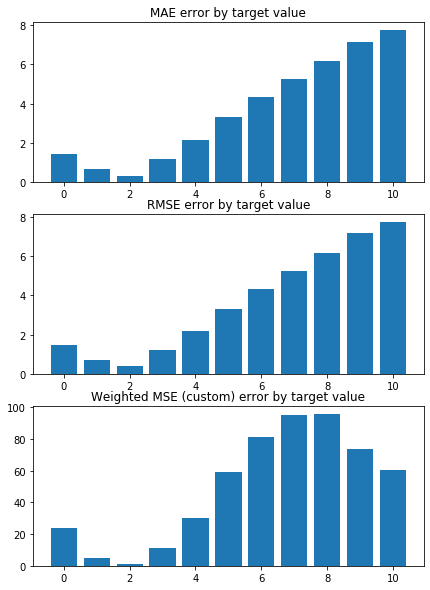

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3886844529370888 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2764203547022621 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


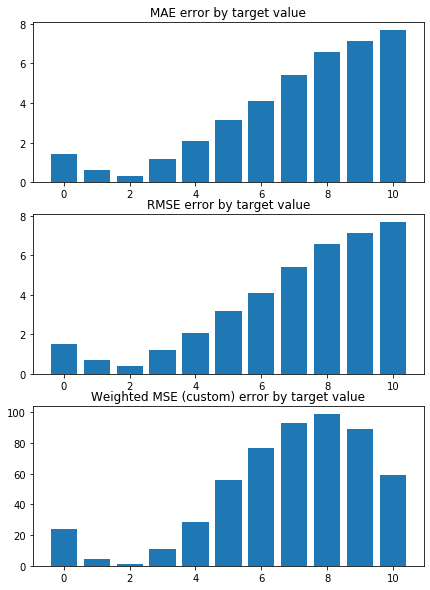

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2376498123572581 


 TRAIN PREDICTION Error
weighted_mse_train: 1.2971387430046928 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


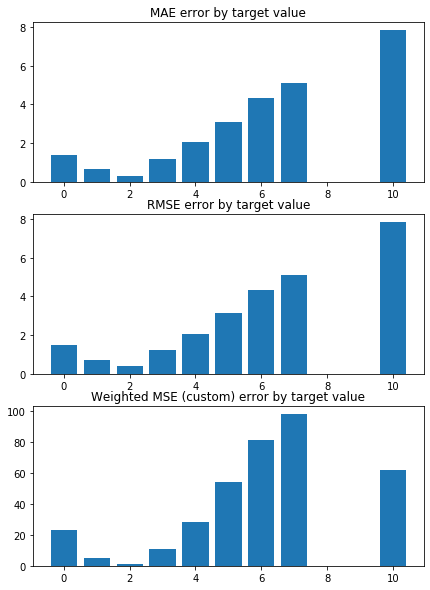

Weighted Mean squared error on Train: 1.29 
 MSE mean train: 2.6298814060079816 

Mean squared error on Test: 1.29 
 MSE mean test:  2.631574892027981 

Root of MSE on Test: 1.14 
 1.622212961367274 

Variance score on Test: 0.06 
 r2_test: 0.11042217482117281 

wMSE_train 1.29
wMSE_test 1.29
MSE_train 2.63
MSE_test 2.63
MAE_train 1.16
MAE_test 1.14
r2_test 0.11
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.166405 -0.089514     0.0       0.0      0.0
1 -0.190661 -0.059302     0.0       0.0      0.0
2 -0.184479 -0.075058     0.0       0.0      0.0
3 -0.205048 -0.065958     0.0       0.0      0.0
4 -0.182159 -0.080736     0.0       0.0      0.0
5 -0.175218 -0.091710     0.0       0.0      0.0
6 -0.197711 -0.063210     0.0       0.0      0.0
7 -0.189394 -0.073621     0.0       0.0      0.0
8 -0.193228 -0.074178     0.0       0.0      0.0
9 -0.177839 -0.086864     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 594

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


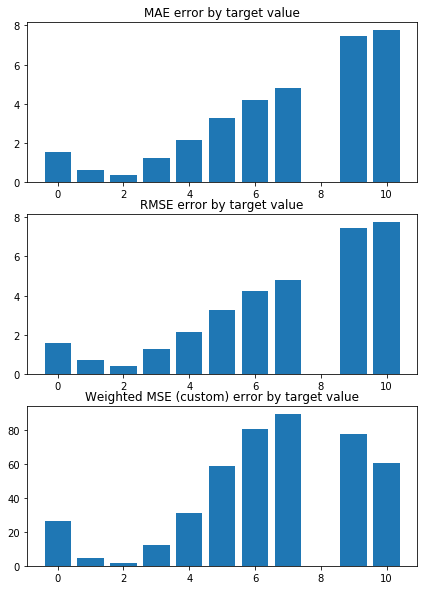

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3840474571593449 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3970962121713628 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


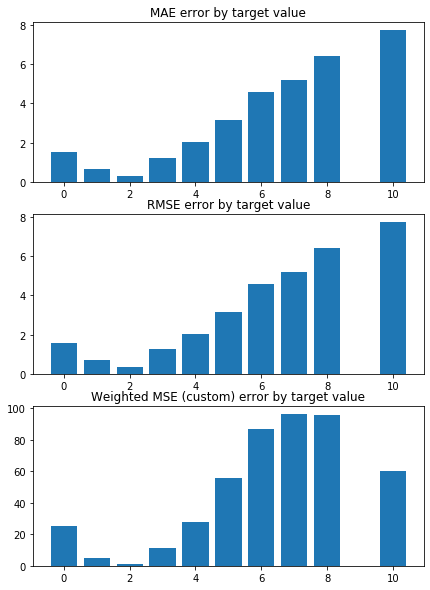

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3006194205609953 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3876338444622631 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


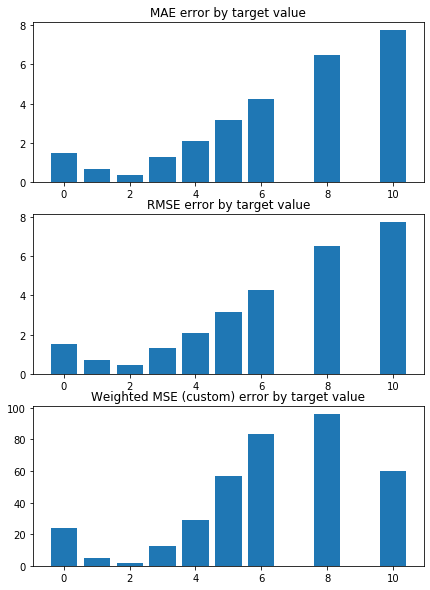

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3555238063982902 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3659563119721214 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


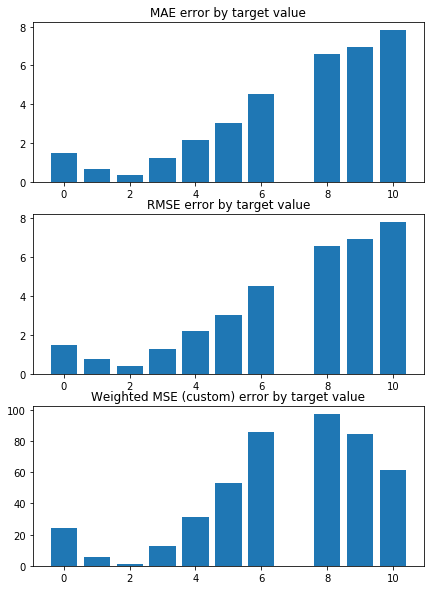

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.415928586624421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3717179412845772 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


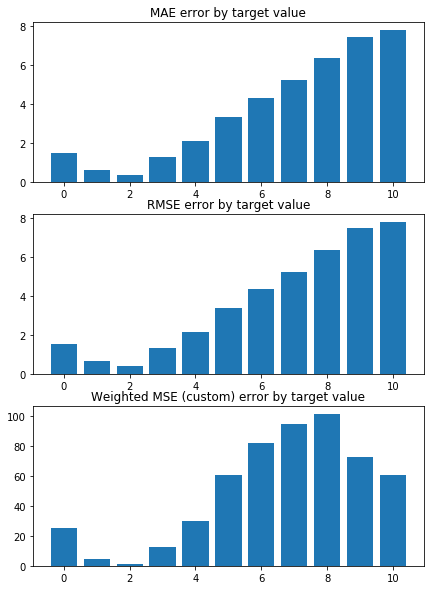

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.337746817900546 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3742369475237413 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


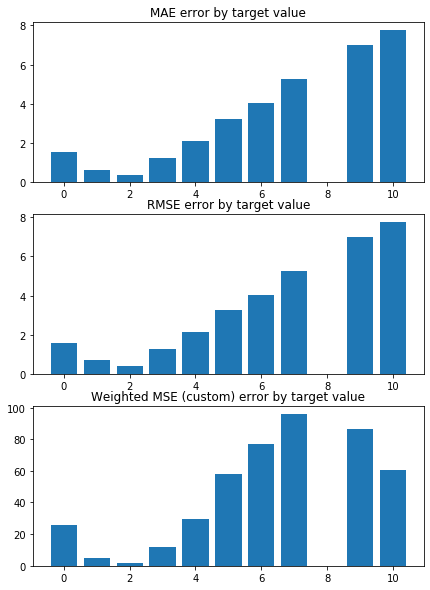

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.318858323587493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3891984852940886 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


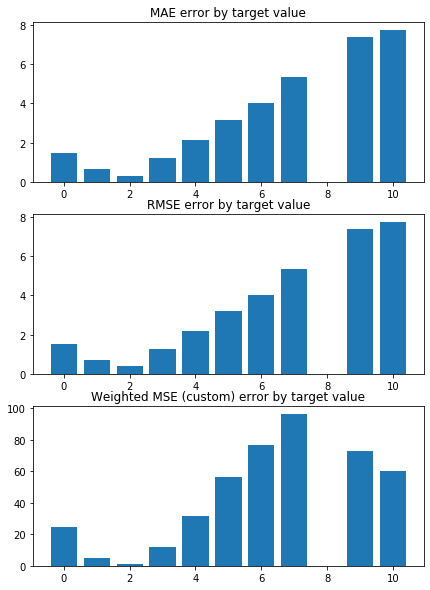

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.4712358739340614 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3692913417810388 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


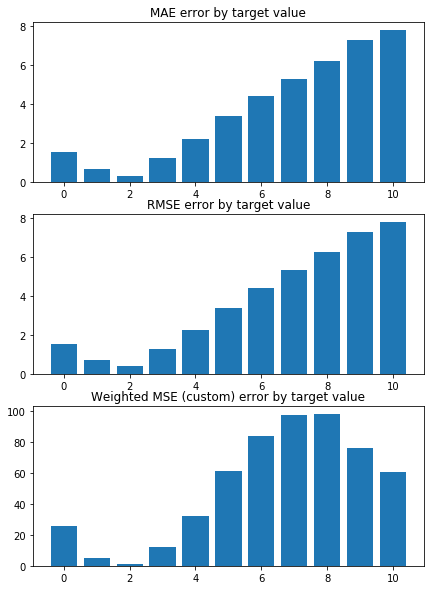

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4631099040373725 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3598331291430157 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


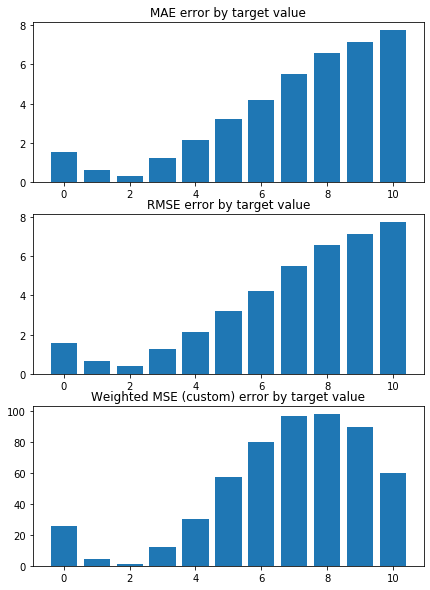

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3286903407941286 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3798778867688843 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


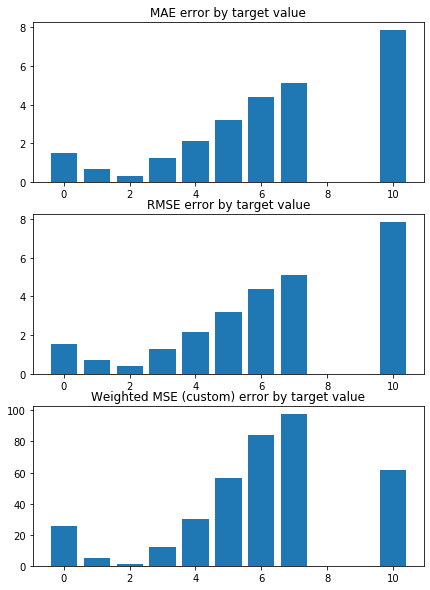

Weighted Mean squared error on Train: 1.38 
 MSE mean train: 2.7481125509396542 

Mean squared error on Test: 1.38 
 MSE mean test:  2.7501326276002125 

Root of MSE on Test: 1.17 
 1.6583523834216334 

Variance score on Test: 0.06 
 r2_test: 0.0698272243624174 

wMSE_train 1.38
wMSE_test 1.38
MSE_train 2.75
MSE_test 2.75
MAE_train 1.2
MAE_test 1.18
r2_test 0.07
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.110456 -0.037294     0.0       0.0      0.0
1 -0.133618 -0.006687     0.0       0.0      0.0
2 -0.132085 -0.020177     0.0       0.0      0.0
3 -0.153872 -0.010885     0.0       0.0      0.0
4 -0.129902 -0.026310     0.0       0.0      0.0
5 -0.120669 -0.039435     0.0       0.0      0.0
6 -0.142903 -0.009785     0.0       0.0      0.0
7 -0.135875 -0.019569     0.0       0.0      0.0
8 -0.141774 -0.018863     0.0       0.0      0.0
9 -0.123607 -0.033688     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 594

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


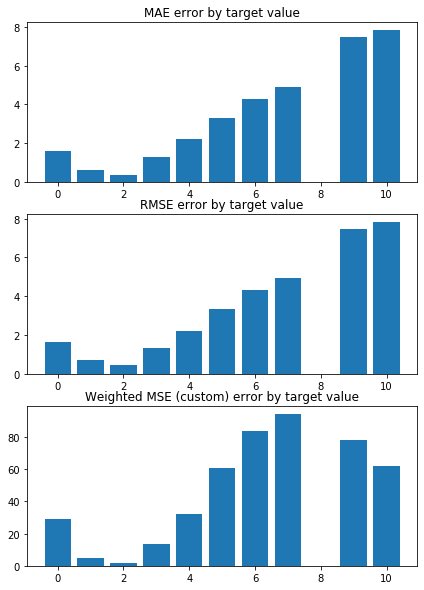

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.506573355534919 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4943899679367967 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


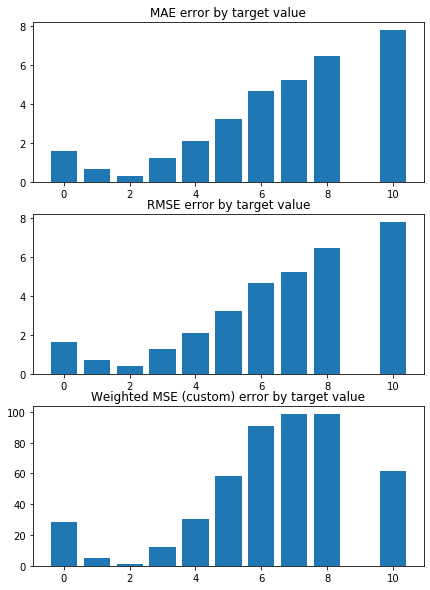

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3959773252923084 


 TRAIN PREDICTION Error
weighted_mse_train: 1.484408707702765 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


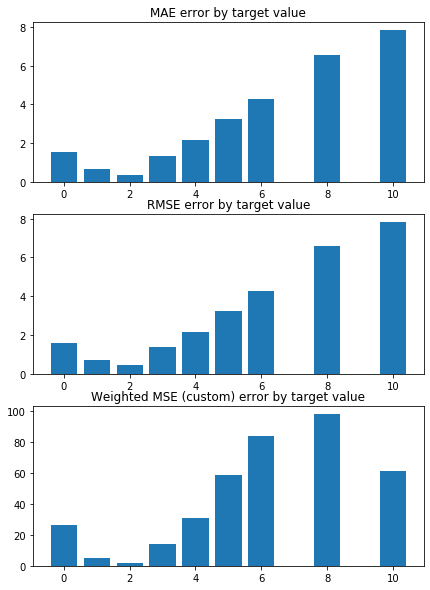

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4311616848692519 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4592274861988828 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


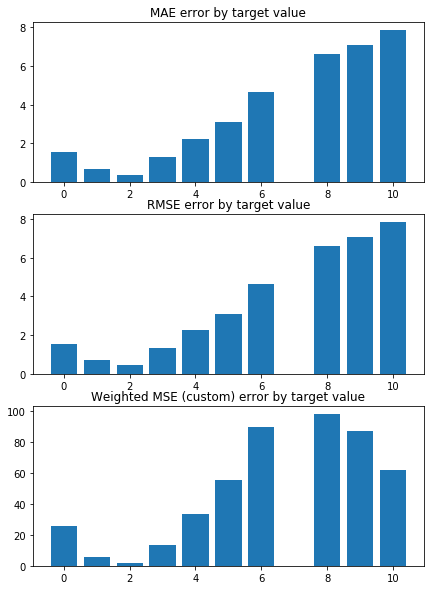

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5125652363033006 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4678677836772833 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


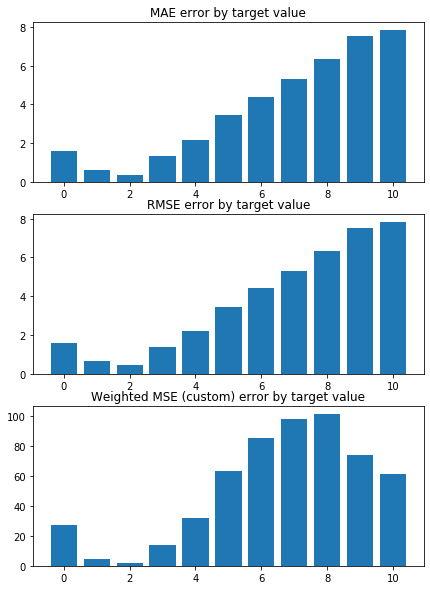

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4216158391062421 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4745969585438081 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


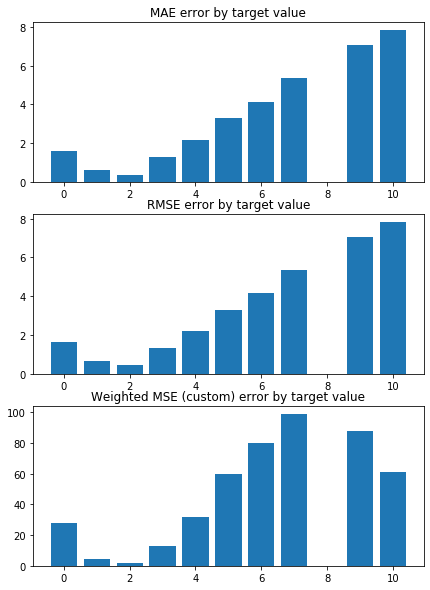

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4154842655169229 


 TRAIN PREDICTION Error
weighted_mse_train: 1.485676083063325 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


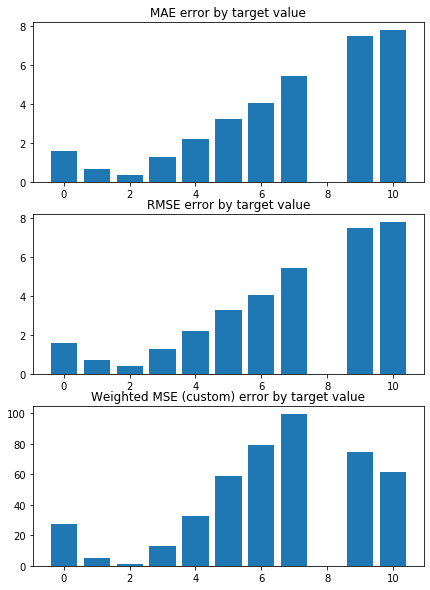

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.569180809738424 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4658758921847848 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


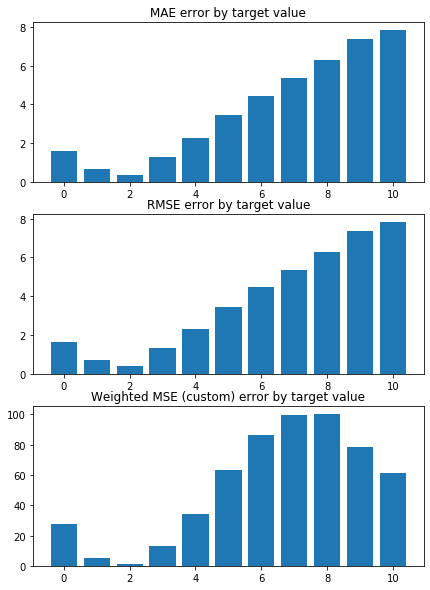

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5462946371898918 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4554153610641265 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


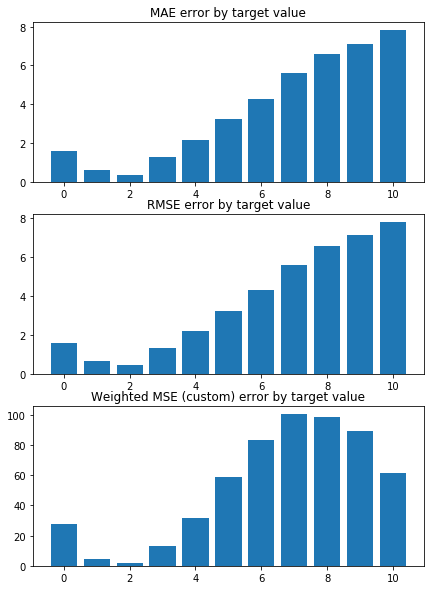

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4353883283134465 


 TRAIN PREDICTION Error
weighted_mse_train: 1.4777144609513473 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


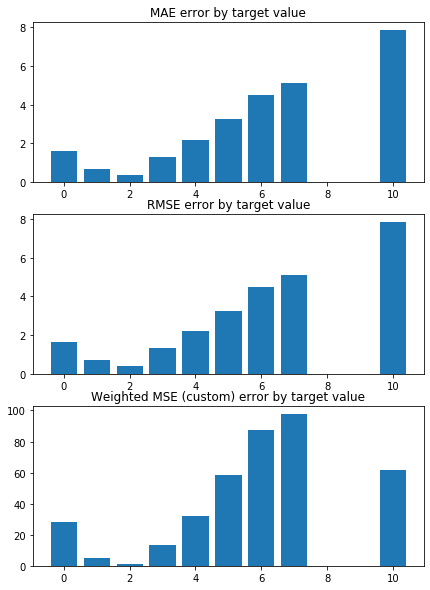

Weighted Mean squared error on Train: 1.47 
 MSE mean train: 2.882007511691486 

Mean squared error on Test: 1.48 
 MSE mean test:  2.8837383002231336 

Root of MSE on Test: 1.21 
 1.6981573249328619 

Variance score on Test: 0.06 
 r2_test: 0.024098617397227996 

wMSE_train 1.47
wMSE_test 1.48
MSE_train 2.88
MSE_test 2.88
MAE_train 1.24
MAE_test 1.23
r2_test 0.02
       CTCF  Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.041612   -0.0     0.0       0.0      0.0
1 -0.036818   -0.0     0.0       0.0      0.0
2 -0.049862   -0.0     0.0       0.0      0.0
3 -0.064734   -0.0     0.0       0.0      0.0
4 -0.053544   -0.0     0.0       0.0      0.0
5 -0.055036   -0.0     0.0       0.0      0.0
6 -0.050414   -0.0     0.0       0.0      0.0
7 -0.052720   -0.0     0.0       0.0      0.0
8 -0.058978   -0.0     0.0       0.0      0.0
9 -0.052630   -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weigh

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


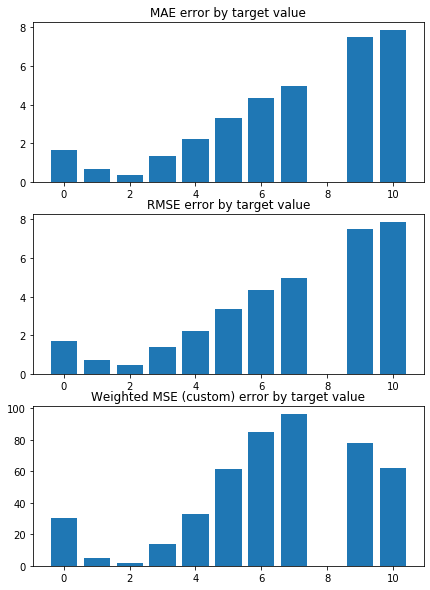

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


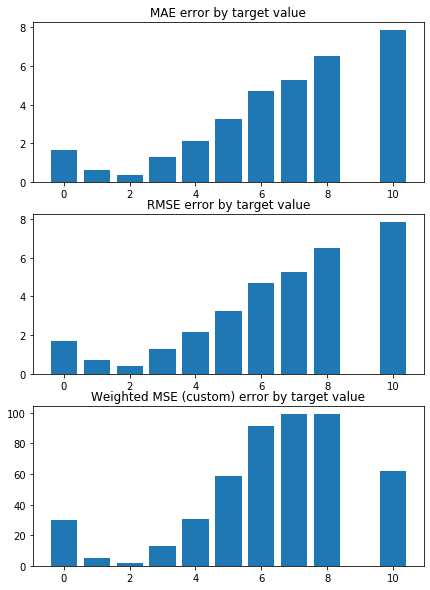

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


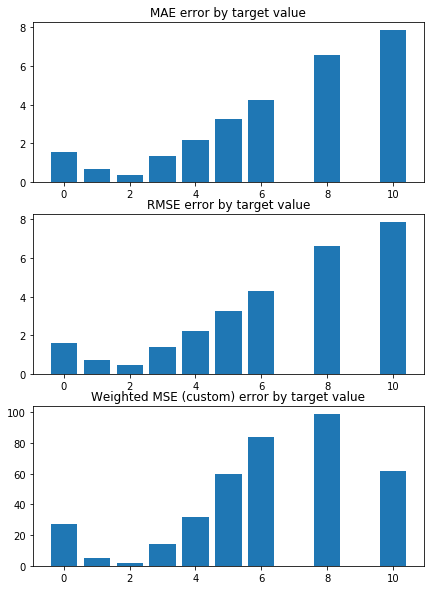

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


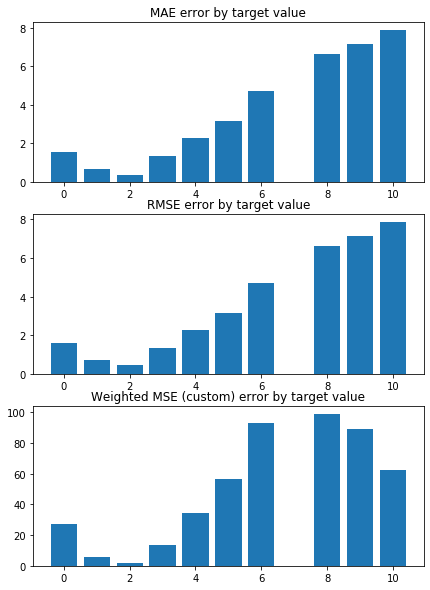

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


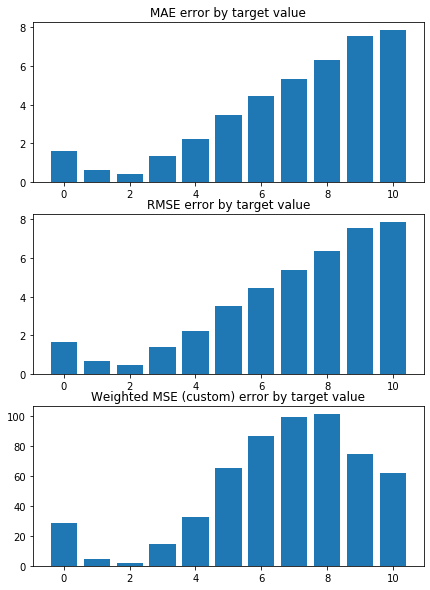

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


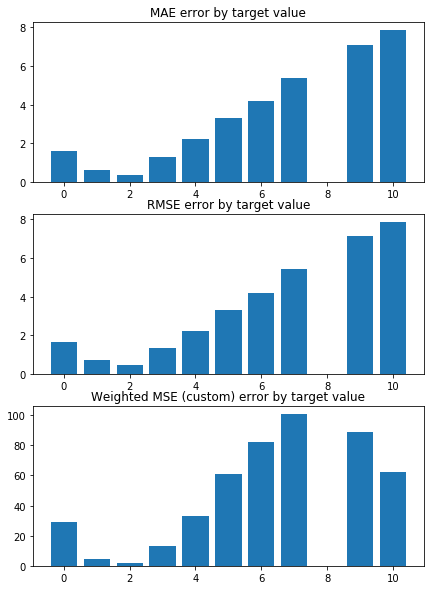

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


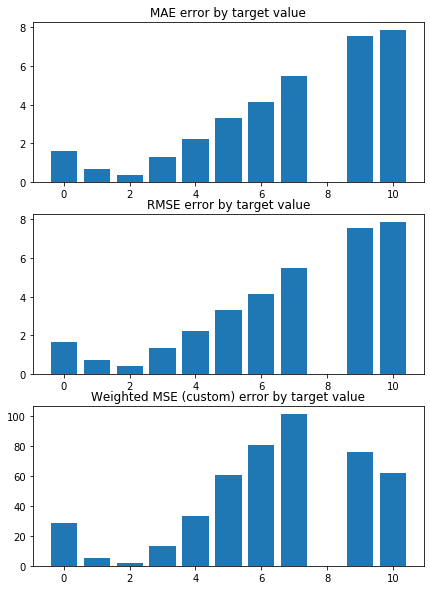

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


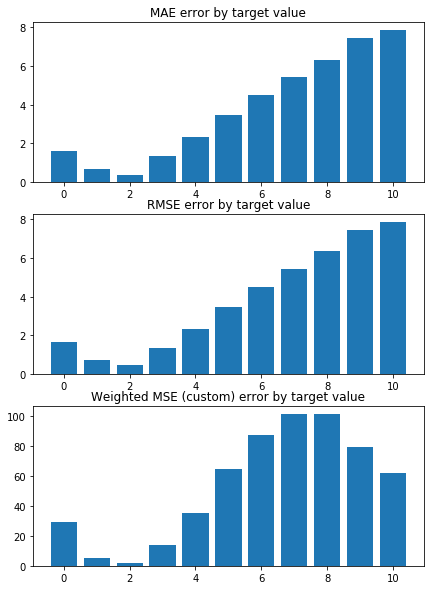

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


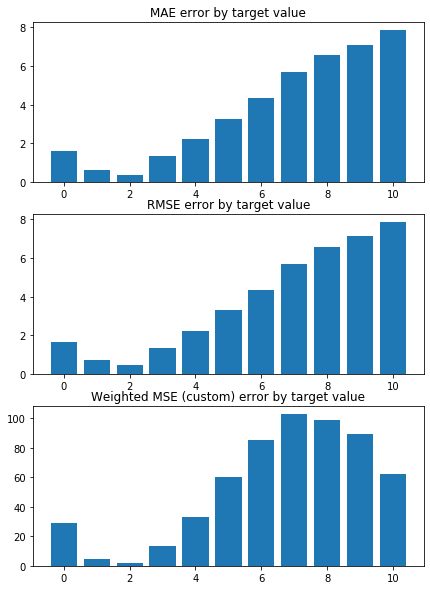

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


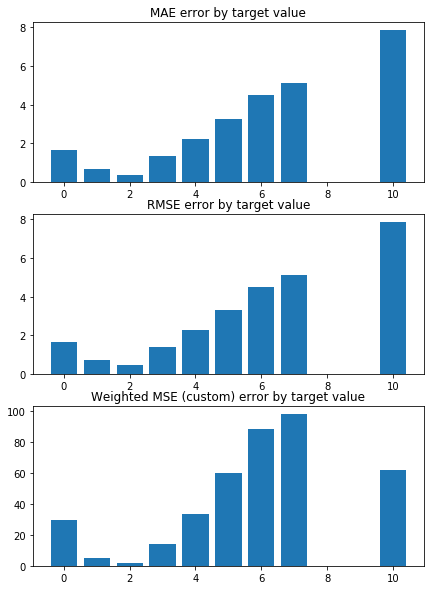

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5729131802711864 


 TRAIN

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


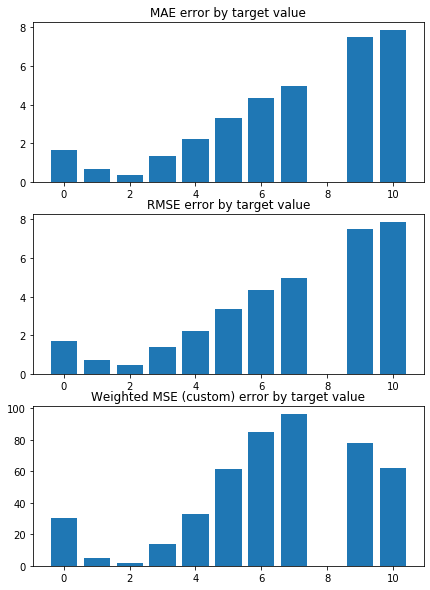

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.555598172469537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332283816329182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


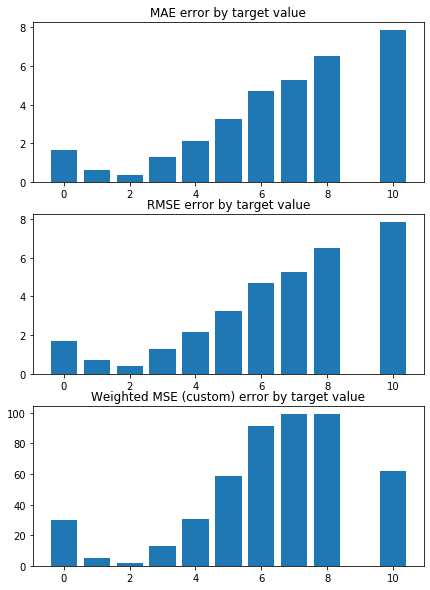

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4484520826241511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5376290480141426 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


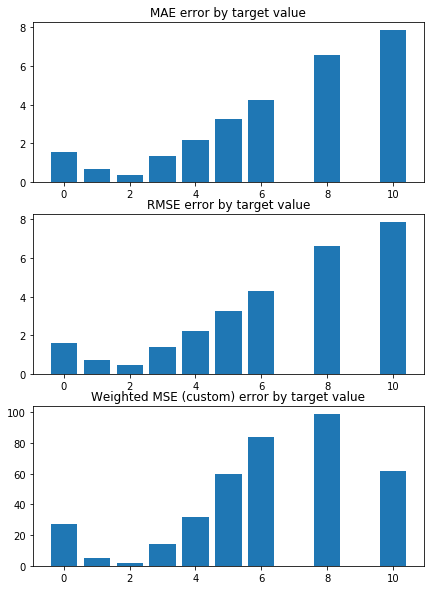

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4871218475178962 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5286165420930318 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


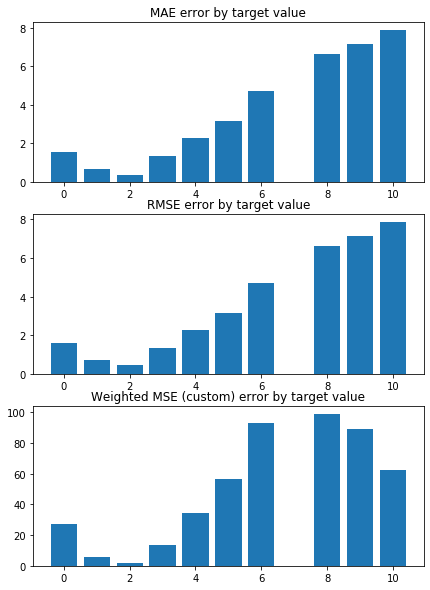

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.5691848499209409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5246067463854969 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


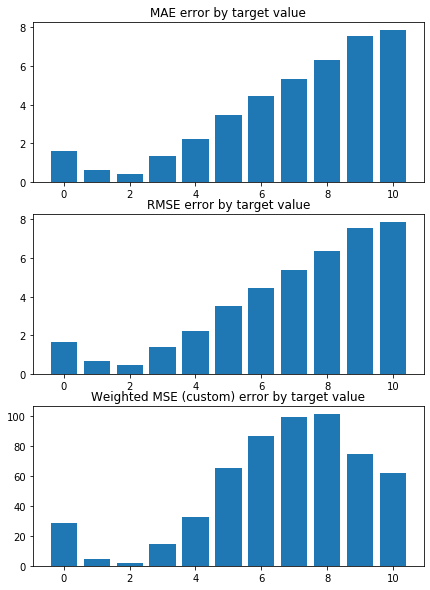

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.47198290491892 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5339147139949958 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


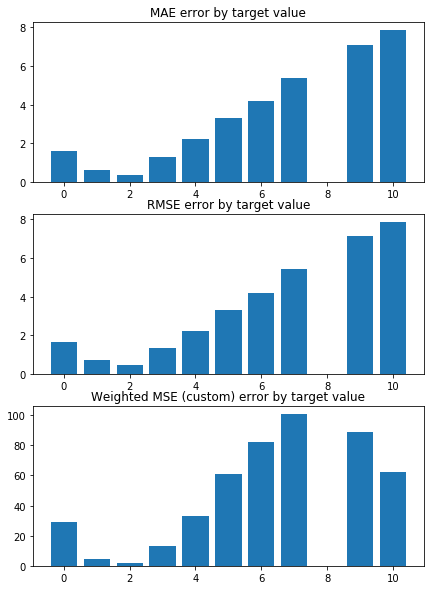

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.4698577154229036 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5395979470373908 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


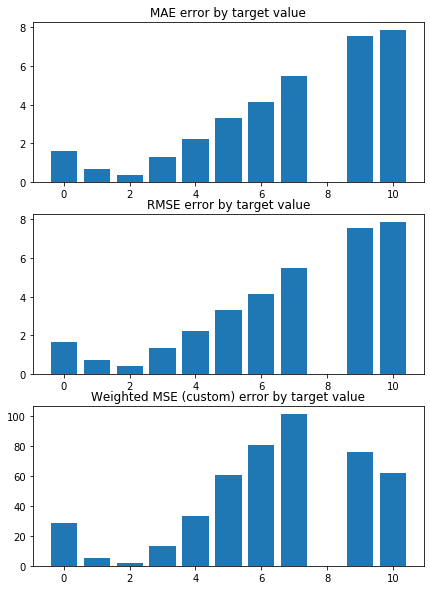

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.6258094685412205 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5220760059014686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


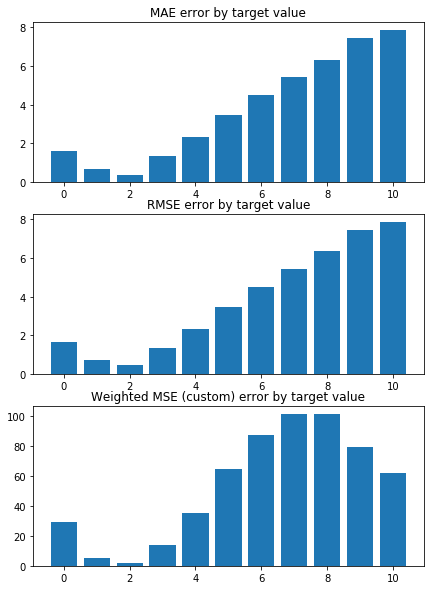

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.6007348104053327 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5186625316836926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


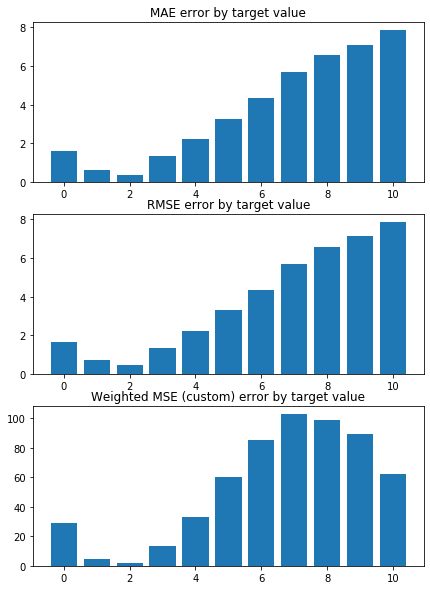

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.496247603284074 


 TRAIN PREDICTION Error
weighted_mse_train: 1.5332379669573635 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


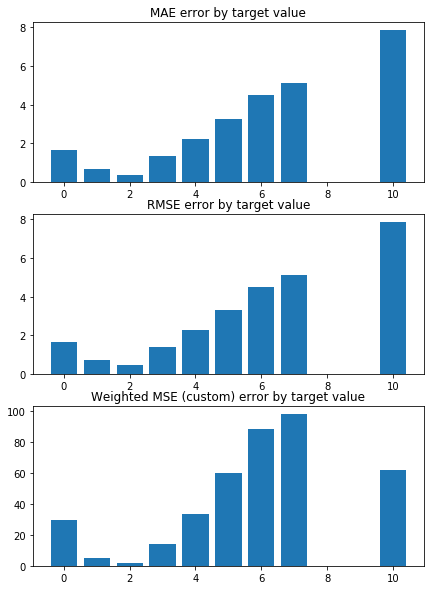

Weighted Mean squared error on Train: 1.53 
 MSE mean train: 2.9570267893782347 

Mean squared error on Test: 1.53 
 MSE mean test:  2.957656949359613 

Root of MSE on Test: 1.24 
 1.7197839833419817 

Variance score on Test: 0.06 
 r2_test: -0.0010673110719145785 

wMSE_train 1.53
wMSE_test 1.53
MSE_train 2.96
MSE_test 2.96
MAE_train 1.27
MAE_test 1.25
r2_test -0.0
   Chriz  CTCF  Su(Hw)  H3K27me3  H3K27ac
0   -0.0  -0.0     0.0       0.0      0.0
1   -0.0  -0.0     0.0       0.0      0.0
2   -0.0  -0.0     0.0       0.0      0.0
3   -0.0  -0.0     0.0       0.0      0.0
4   -0.0  -0.0     0.0       0.0      0.0
5   -0.0  -0.0     0.0       0.0      0.0
6   -0.0  -0.0     0.0       0.0      0.0
7   -0.0  -0.0     0.0       0.0      0.0
8   -0.0  -0.0     0.0       0.0      0.0
9   -0.0  -0.0     0.0       0.0      0.0


In [92]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 1, 0.1)
# Create linear regression object

model_name = 'LR+L1_grid0.1-1'
n_splits = 10
random_state = 16 
shuffle = True


wmse_test = []
wmse_train = []

for alpha in alpha_grid:
    model = linear_model.Lasso(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                        weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                        rmse_test, rmse_train, rmse_test_const, \
                        mae_test,    mae_train,  mae_test_const, \
                        _ = train_test_KFold(X, y, model, model_name, results_pd,
                                             n_splits=n_splits, random_state=random_state, shuffle=shuffle)


    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))


In [93]:
wmse_test

[1.1514566620151299,
 1.1391840430888505,
 1.1529648277264812,
 1.1814650339179988,
 1.2285882437590736,
 1.2943344572497046,
 1.378703674389892,
 1.4756690677269382,
 1.5297902635376162,
 1.5297902635376162]

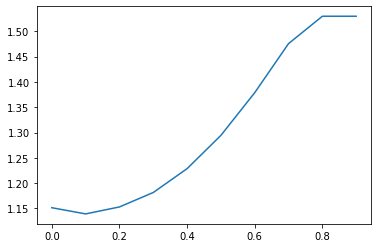

In [94]:
plt.plot(alpha_grid, wmse_test)

In [95]:
# Best alpha = 0.2

# L1 - best  score

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1626949614111086 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1505710391321122 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


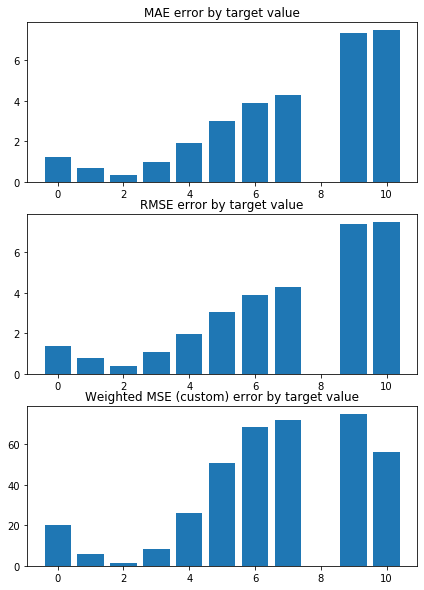

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0885359371590442 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1654541621800865 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


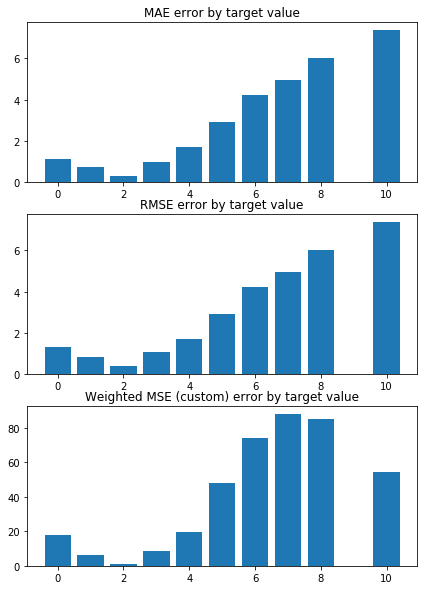

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0793940215966444 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1607748906278734 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


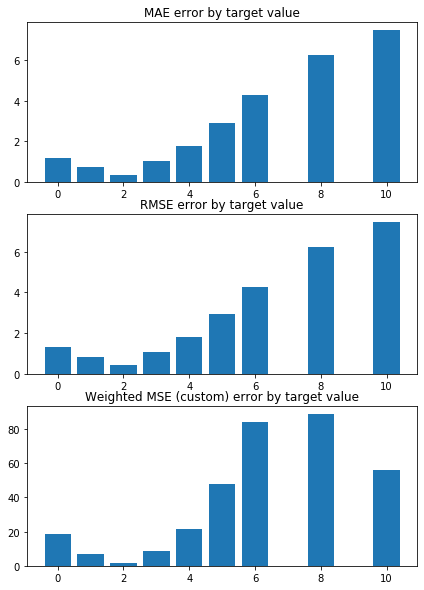

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1733769047745104 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1455388179621029 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


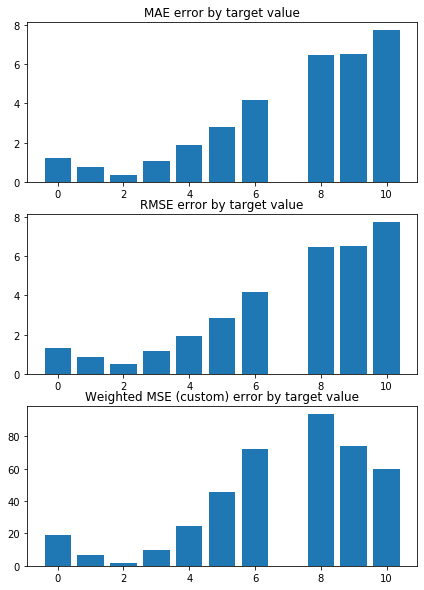

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1831840979005568 


 TRAIN PREDICTION Error
weighted_mse_train: 1.15060902902434 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


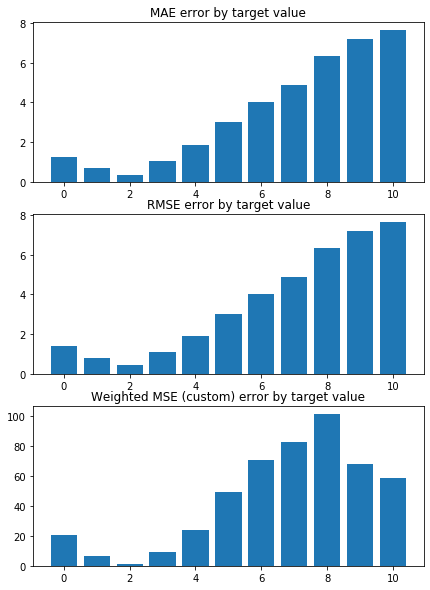

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1654818131315492 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1487818558653673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


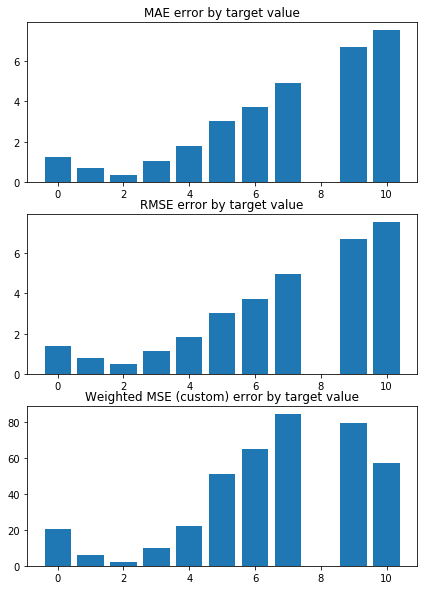

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0949015848384838 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1602631082893062 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


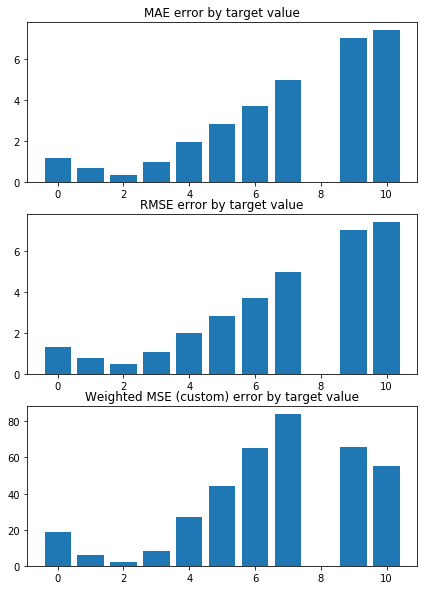

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2402030823425974 


 TRAIN PREDICTION Error
weighted_mse_train: 1.14460166876746 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


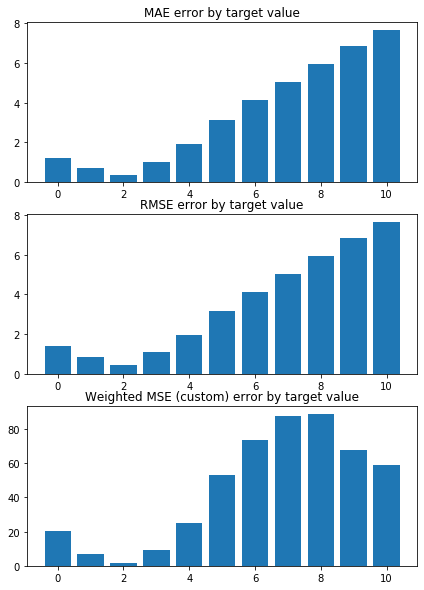

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2678845264106184 


 TRAIN PREDICTION Error
weighted_mse_train: 1.136932193951947 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


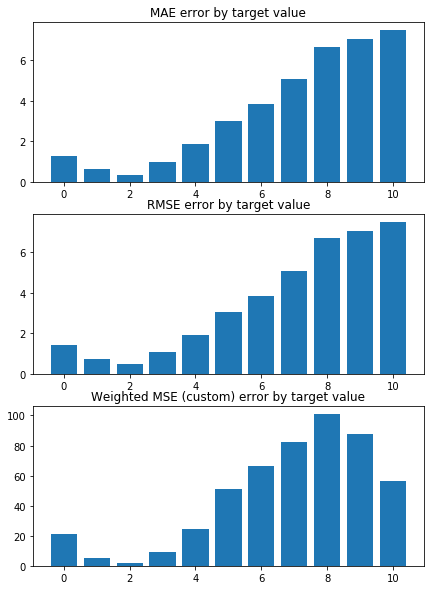

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.073991347699697 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1603717867719059 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


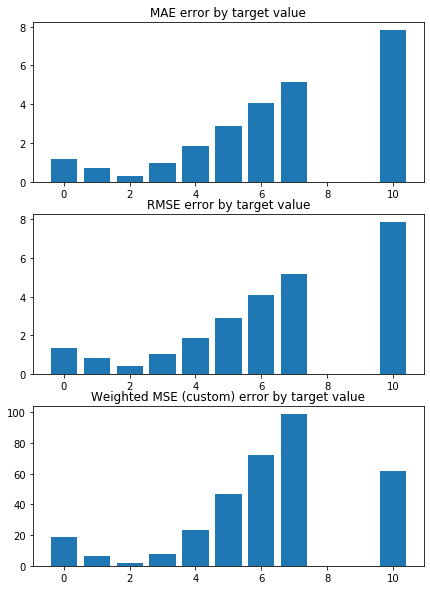

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4041708852480745 

Mean squared error on Test: 1.15 
 MSE mean test:  2.405260016843316 

Root of MSE on Test: 1.07 
 1.5508900724562382 

Variance score on Test: 0.06 
 r2_test: 0.18795107980811424 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.4
MSE_test 2.41
MAE_train 1.07
MAE_test 1.03
r2_test 0.19
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.334249 -0.246173     0.0       0.0      0.0
1 -0.361793 -0.217149     0.0       0.0      0.0
2 -0.341658 -0.239702     0.0       0.0      0.0
3 -0.358577 -0.231177     0.0       0.0      0.0
4 -0.338930 -0.244014     0.0       0.0      0.0
5 -0.338864 -0.248533     0.0       0.0      0.0
6 -0.362137 -0.223485     0.0       0.0      0.0
7 -0.349952 -0.235776     0.0       0.0      0.0
8 -0.347587 -0.240122     0.0       0.0      0.0
9 -0.340536 -0.246393     0.0       0.0      0.0


,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."


In [96]:
# L1 - best 
model = linear_model.Lasso(alpha=0.2)


model_name = 'LR+L1_alf=0.2_spt=10'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

# wmse_test.append(np.mean(weighted_mse_test_all))
# wmse_train.append(np.mean(weighted_mse_train_all))
results_pd

In [97]:
coefs_argsort, coefs

(array([[1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4]]),
 array([[-0.24617342, -0.33424874,  0.        ,  0.        ,  0.        ],
        [-0.21714915, -0.36179336,  0.        ,  0.        ,  0.        ],
        [-0.23970224, -0.34165818,  0.        ,  0.        ,  0.        ],
        [-0.23117678, -0.35857666,  0.        ,  0.        ,  0.        ],
        [-0.24401362, -0.33892979,  0.        ,  0.        ,  0.        ],
        [-0.24853297, -0.33886447,  0.        ,  0.        ,  0.        ],
        [-0.22348475, -0.36213659,  0.        ,  0.        ,  0.        ],
        [-0.23577625, -0.34995238,  0.        ,  0.        ,  0.        ],
        [-0.24012189, -0.34758702,  0.        ,  0.        ,  0.        ],
        [-0.2463934 , -0.34053643,  0.        ,  0.        ,  0.        ]

In [98]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object')

In [99]:
coefs_argsort[:]

array([[1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4]])

In [100]:

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.15238985525725 1.1529648277264812


In [101]:
su_drsc.columns[2:][coefs_argsort[0]], coefs

(Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object'),
 array([[-0.24617342, -0.33424874,  0.        ,  0.        ,  0.        ],
        [-0.21714915, -0.36179336,  0.        ,  0.        ,  0.        ],
        [-0.23970224, -0.34165818,  0.        ,  0.        ,  0.        ],
        [-0.23117678, -0.35857666,  0.        ,  0.        ,  0.        ],
        [-0.24401362, -0.33892979,  0.        ,  0.        ,  0.        ],
        [-0.24853297, -0.33886447,  0.        ,  0.        ,  0.        ],
        [-0.22348475, -0.36213659,  0.        ,  0.        ,  0.        ],
        [-0.23577625, -0.34995238,  0.        ,  0.        ,  0.        ],
        [-0.24012189, -0.34758702,  0.        ,  0.        ,  0.        ],
        [-0.2463934 , -0.34053643,  0.        ,  0.        ,  0.        ]]))

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 1

Получили наиболее влияющие признаки

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# Linear Regression with L2 regularization -  Ridge

In [102]:
X, y = data_scaled_clean, target_clean.gamma
X_train, X_test, y_train, y_test = train_test_split(X[:], y[:], test_size=0.3, random_state=10)


In [103]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l2 = linear_model.Ridge()

# Train the model using the training sets
lin_reg_l2.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l2.predict(X_test)

Коэффициенты

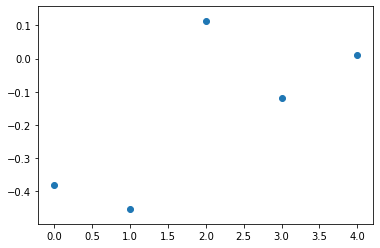

In [104]:
plt.scatter( np.arange(len(lin_reg_l2.coef_)) , lin_reg_l2.coef_)
plt.show()

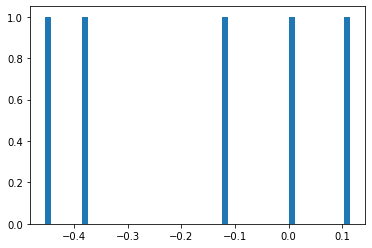

In [105]:
plt.hist(lin_reg_l2.coef_, bins=50)
plt.show()

In [106]:
# Make predictions using the testing set
y_pred_train = lin_reg_l2.predict(X_train)
# The mean squared error
print("Mean squared error on Train: %.2f"
      % mean_squared_error(y_train, y_pred_train))

# The mean squared error
print("Mean squared error on Test: %.2f"
      % mean_squared_error(y_test, y_pred))


# The mean squared error
print("Root of Mean squared error: %.2f"
      % np.sqrt(mean_squared_error(y_test, y_pred)))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % r2_score(y_test, y_pred))

Mean squared error on Train: 2.31
Mean squared error on Test: 2.40
Root of Mean squared error: 1.55
Variance score: 0.20


(array([  1.,   0.,   0.,   1.,   0.,   3.,   2.,   2.,   8.,   2.,  10.,
         15.,  20.,  42.,  38.,  43.,  74.,  90.,  98., 145., 153., 173.,
        193., 236., 230., 282., 266., 235., 225., 221., 196., 175., 173.,
        163., 113.,  88.,  80.,  59.,  32.,  30.,  18.,  26.,  14.,   7.,
          8.,   3.,   4.,   1.,   0.,   2.]),
 array([-4.1619581 , -4.0064581 , -3.85095809, -3.69545809, -3.53995809,
        -3.38445808, -3.22895808, -3.07345808, -2.91795808, -2.76245807,
        -2.60695807, -2.45145807, -2.29595806, -2.14045806, -1.98495806,
        -1.82945806, -1.67395805, -1.51845805, -1.36295805, -1.20745804,
        -1.05195804, -0.89645804, -0.74095804, -0.58545803, -0.42995803,
        -0.27445803, -0.11895802,  0.03654198,  0.19204198,  0.34754198,
         0.50304199,  0.65854199,  0.81404199,  0.969542  ,  1.125042  ,
         1.280542  ,  1.436042  ,  1.59154201,  1.74704201,  1.90254201,
         2.05804202,  2.21354202,  2.36904202,  2.52454203,  2.68004203,
 

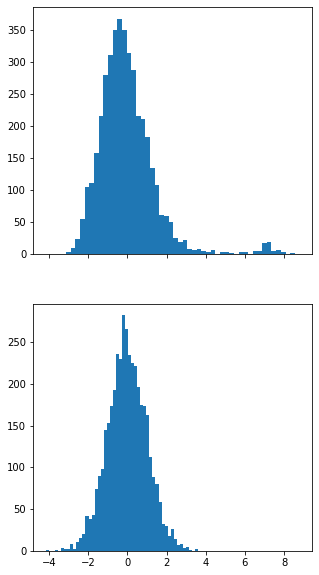

In [107]:
f, axes = plt.subplots(2, 1, figsize=(5, 10), sharex=True)
axes[0].hist((y_train - y_pred_train), bins=50)
axes[1].hist(np.random.randn(4000), bins=50)

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L2


## Fined parametrs for L2

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.150429439402017 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1474530001881722 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


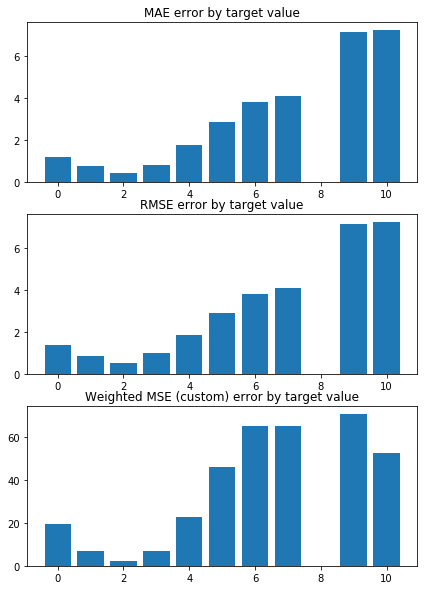

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0782543118183805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1611155407329032 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


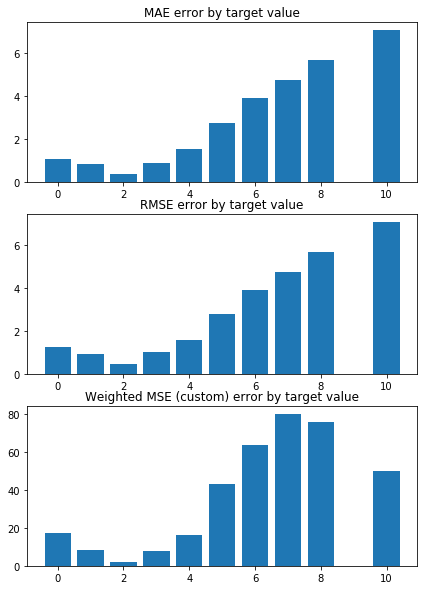

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0677171462739656 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584859794774696 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


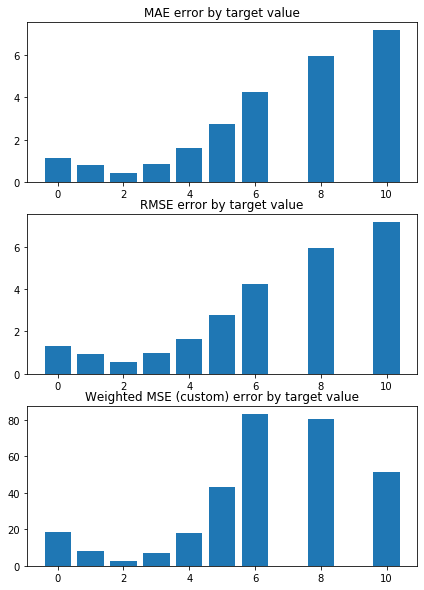

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731761631271278 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437958887539694 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


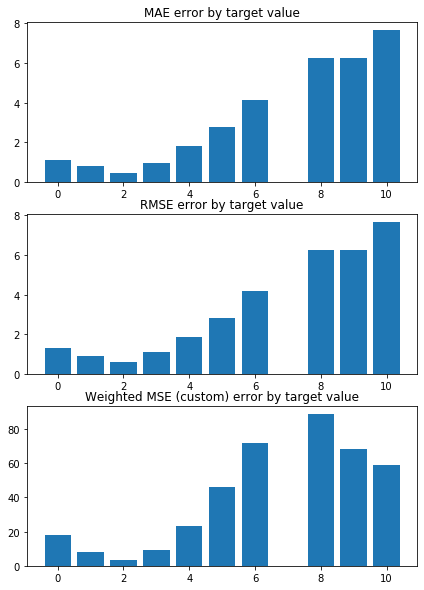

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1692291296618311 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491770167028732 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


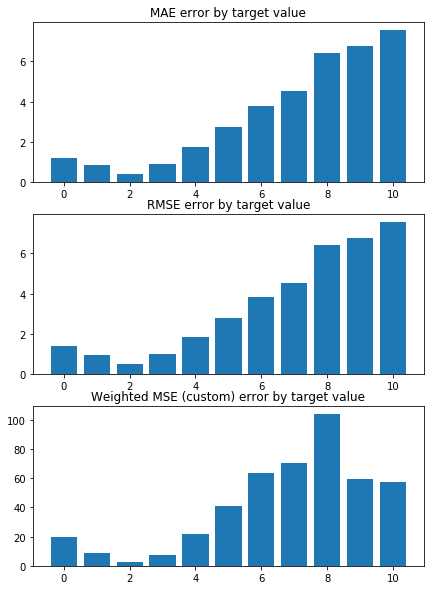

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897700170464065 


 TRAIN PREDICTION Error
weighted_mse_train: 1.144002229673775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


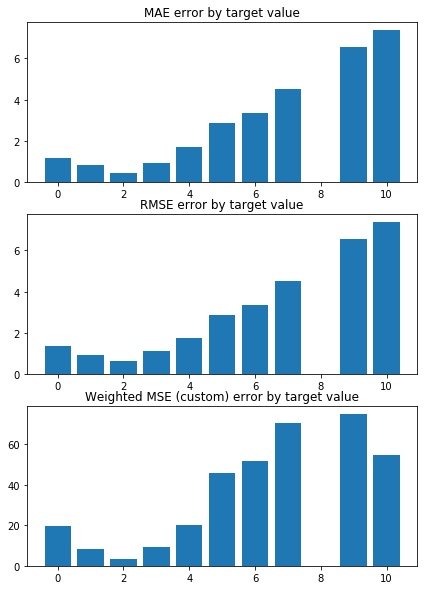

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1020581915684007 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1559393528280035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


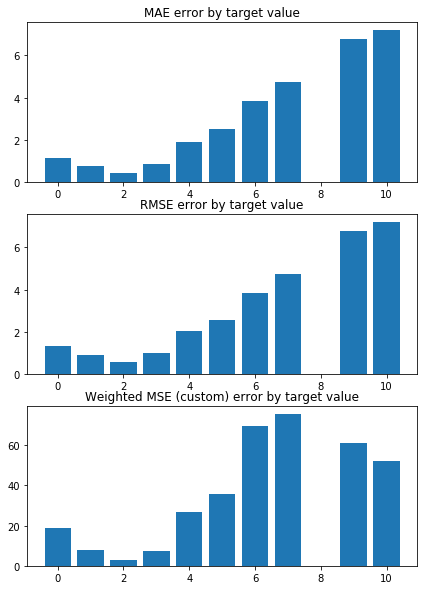

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364696945192493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409774712552483 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


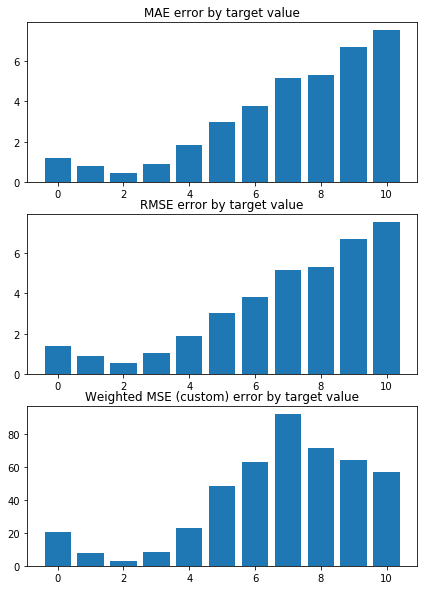

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778973501249657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133594897490691 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


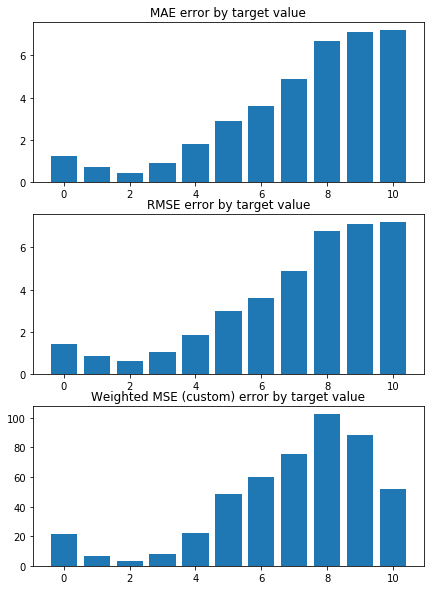

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.069565176608953 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1594139569006885 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


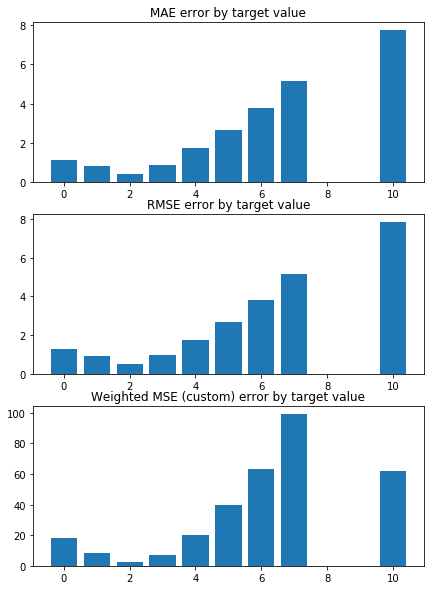

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897107771123 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410463265831885 

Root of MSE on Test: 1.07 
 1.5300478183975783 

Variance score on Test: 0.07 
 r2_test: 0.21002153096464138 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450243 -0.378528 -0.120351  0.104176  0.010957
1 -0.482286 -0.351931 -0.125640  0.094882  0.014683
2 -0.454280 -0.381915 -0.125185  0.081891  0.018755
3 -0.463124 -0.366355 -0.123296  0.111936  0.025166
4 -0.449125 -0.379371 -0.125621  0.103758  0.020455
5 -0.449878 -0.373745 -0.112968  0.119382  0.018721
6 -0.473549 -0.356155 -0.118064  0.113101  0.009478
7 -0.459020 -0.364279 -0.112133  0.118205  0.015006
8 -0.454382 -0.379319 -0.125261  0.106479  0.011607
9 -0.452735 -0.382000 -0.128770  0.116150  0.004668
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


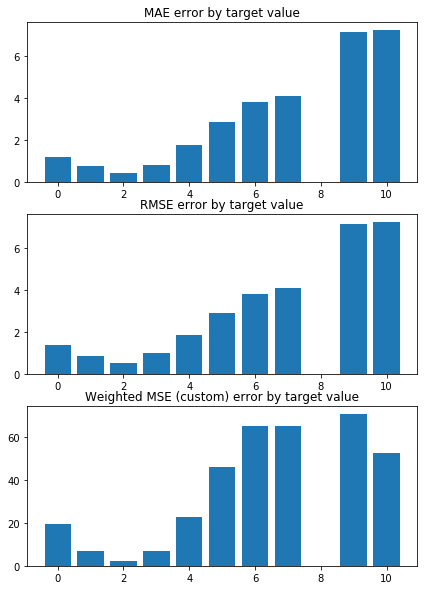

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.078212404371212 


 TRAIN PREDICTION Error
weighted_mse_train: 1.161088887765169 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


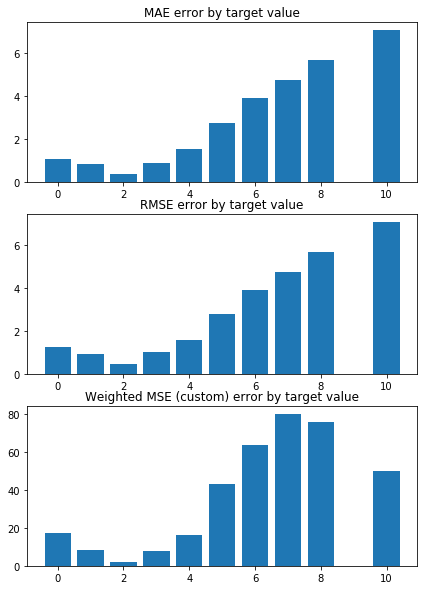

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0676894196349291 


 TRAIN PREDICTION Error
weighted_mse_train: 1.158460888657976 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


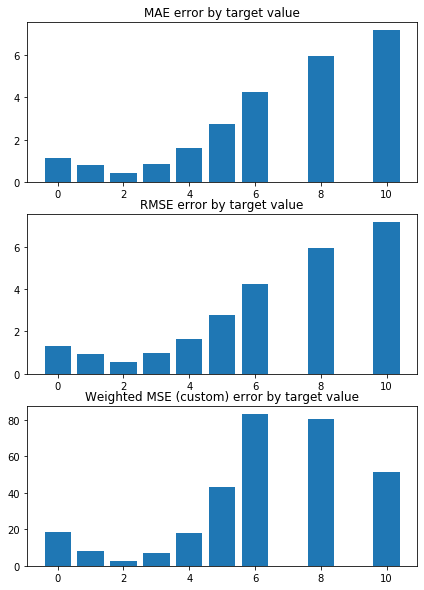

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731505553635475 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437700117381204 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


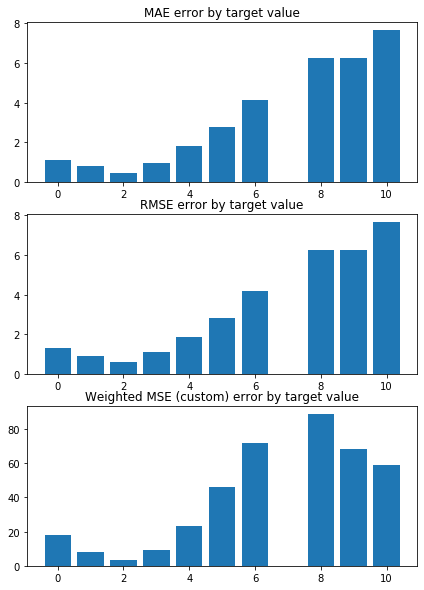

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1692104403053276 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491515326856385 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


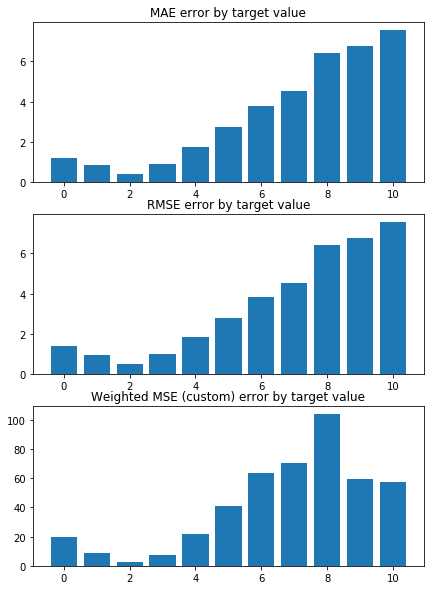

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897394709655267 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1439787706816924 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


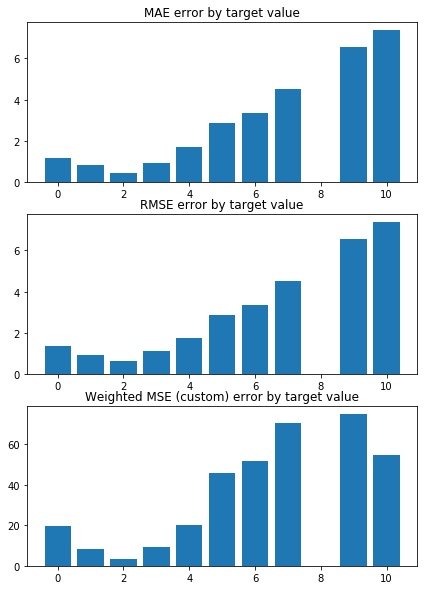

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1020231001320493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1559137595974975 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


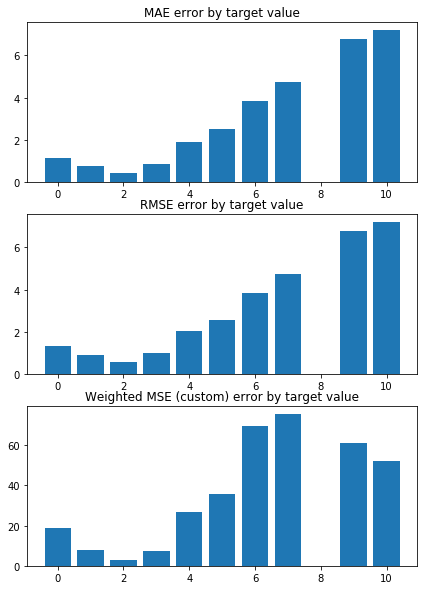

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364540771239965 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409523425884407 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


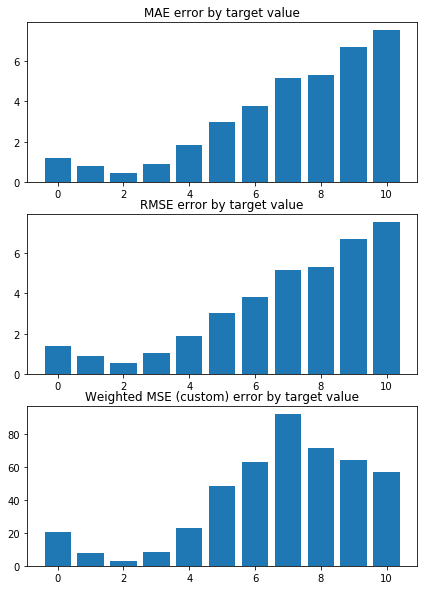

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778692182193105 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1335694455345224 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


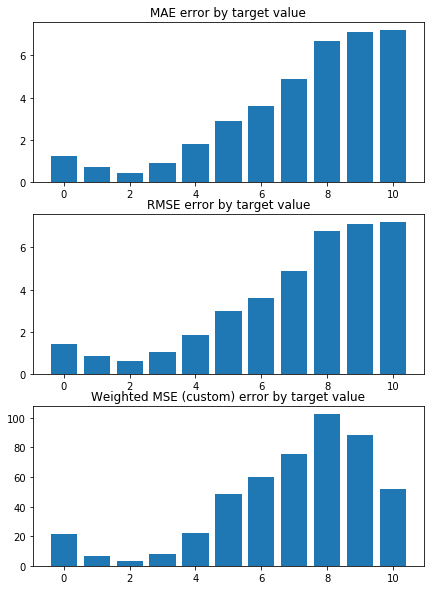

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695456422830003 


 TRAIN PREDICTION Error
weighted_mse_train: 1.159387202912661 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


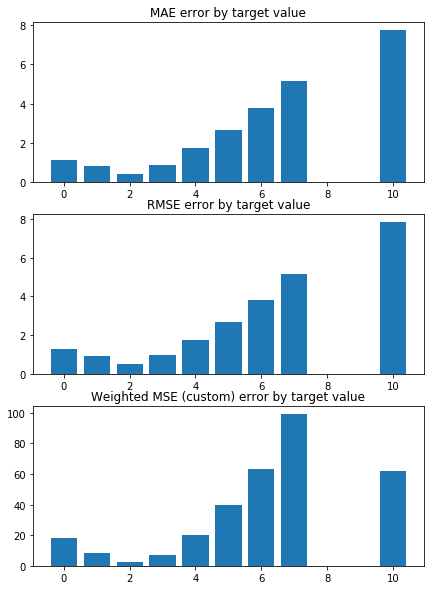

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.3368971205832354 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410448075976102 

Root of MSE on Test: 1.07 
 1.530047322012496 

Variance score on Test: 0.07 
 r2_test: 0.2100221098091284 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450138 -0.378500 -0.120266  0.104186  0.010965
1 -0.482138 -0.351943 -0.125555  0.094895  0.014688
2 -0.454177 -0.381883 -0.125099  0.081905  0.018761
3 -0.463006 -0.366343 -0.123211  0.111945  0.025170
4 -0.449025 -0.379339 -0.125536  0.103768  0.020461
5 -0.449772 -0.373721 -0.112886  0.119389  0.018727
6 -0.473414 -0.356158 -0.117980  0.113110  0.009486
7 -0.458903 -0.364267 -0.112052  0.118211  0.015013
8 -0.454277 -0.379291 -0.125174  0.106489  0.011615
9 -0.452634 -0.381968 -0.128684  0.116158  0.004676
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


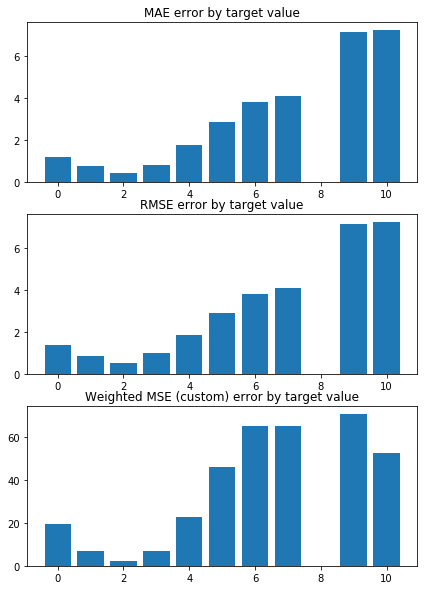

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0781705696359145 


 TRAIN PREDICTION Error
weighted_mse_train: 1.161062277651138 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


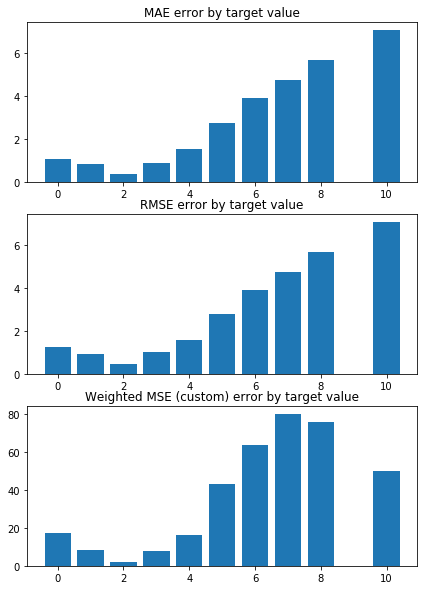

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0676617268480408 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584358337717906 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


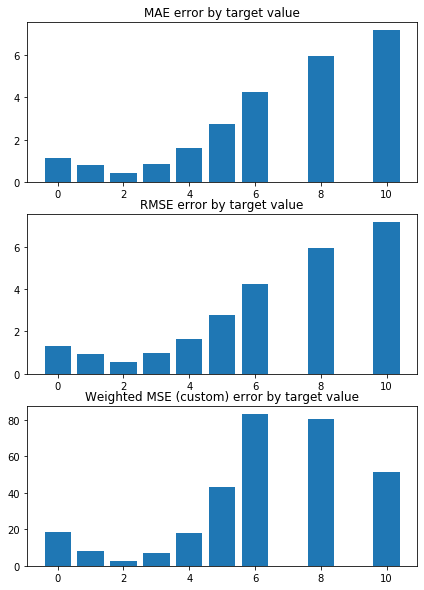

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.173124984537537 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437441715019798 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


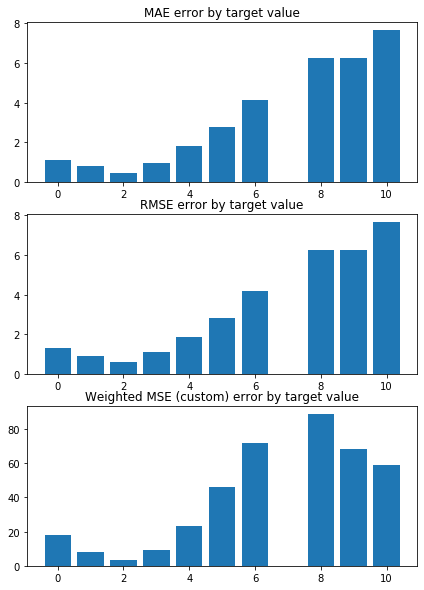

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1691917788434185 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491260836119794 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


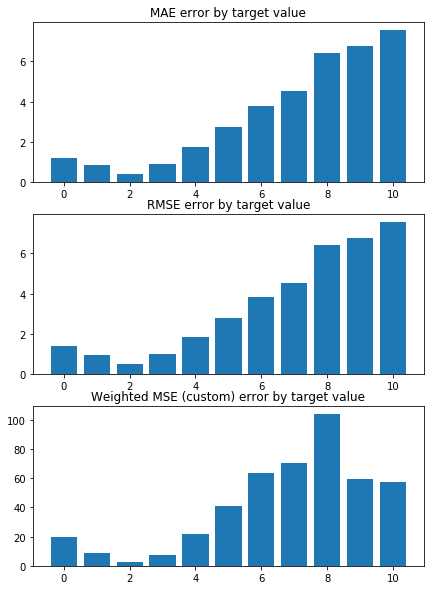

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897089613747316 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1439553447951623 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


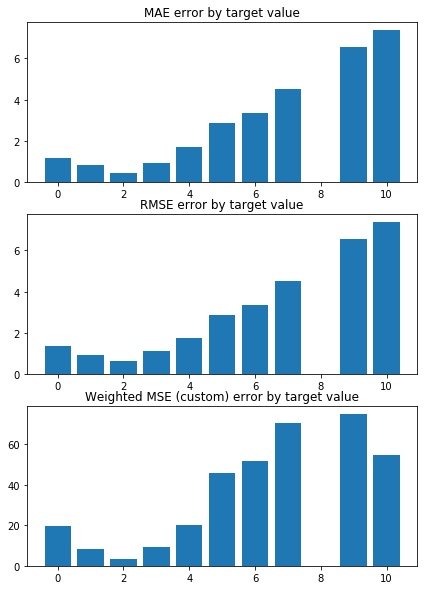

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1019880631573884 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1558882057346382 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


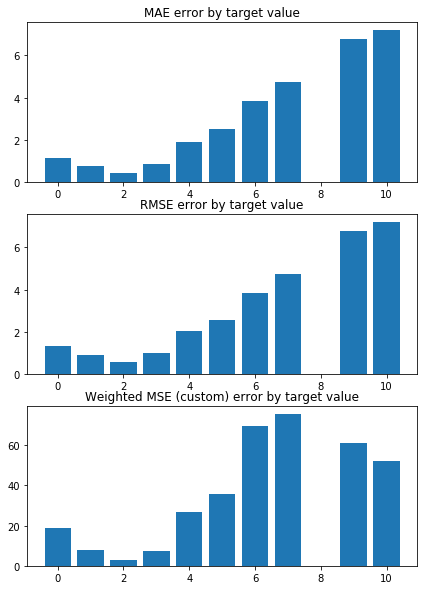

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364384895583838 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409272492502285 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


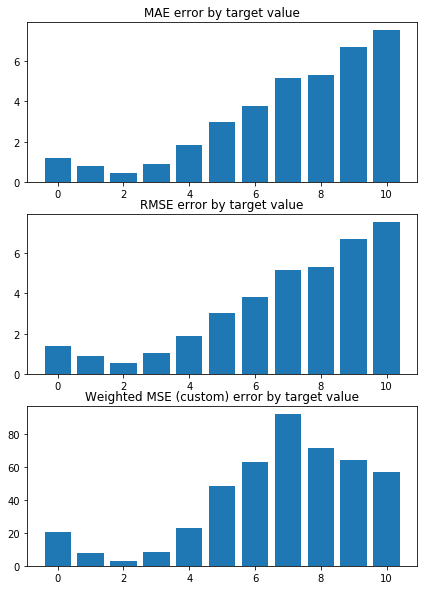

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778411236626654 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1335440290501142 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


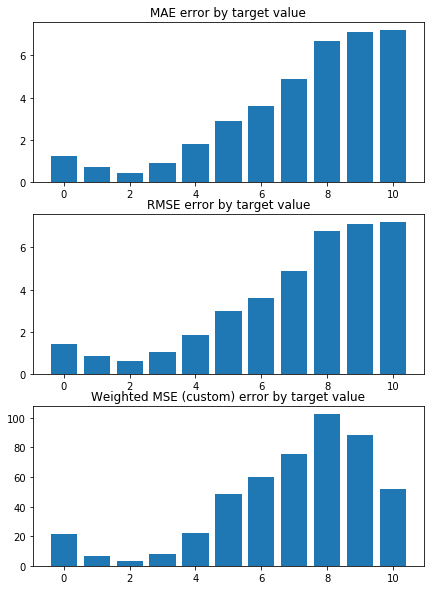

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695261358790125 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1593604847853414 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


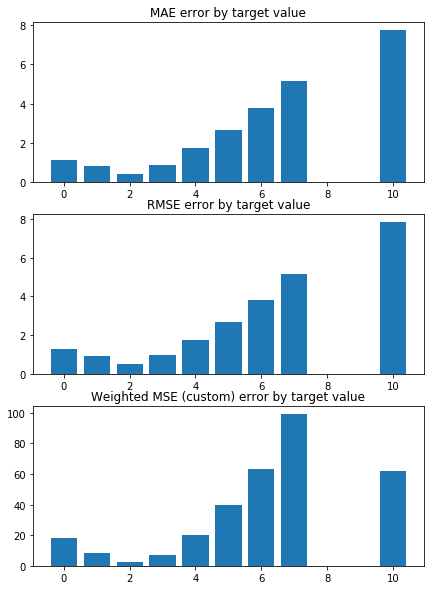

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897158988126 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410433172324154 

Root of MSE on Test: 1.07 
 1.5300468349800327 

Variance score on Test: 0.07 
 r2_test: 0.21002267872828972 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450033 -0.378471 -0.120181  0.104196  0.010973
1 -0.481990 -0.351954 -0.125469  0.094908  0.014694
2 -0.454074 -0.381851 -0.125012  0.081919  0.018767
3 -0.462888 -0.366330 -0.123126  0.111954  0.025175
4 -0.448924 -0.379308 -0.125450  0.103779  0.020467
5 -0.449667 -0.373697 -0.112803  0.119396  0.018732
6 -0.473279 -0.356161 -0.117897  0.113118  0.009494
7 -0.458787 -0.364255 -0.111972  0.118217  0.015020
8 -0.454173 -0.379262 -0.125087  0.106500  0.011623
9 -0.452533 -0.381936 -0.128597  0.116166  0.004685
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


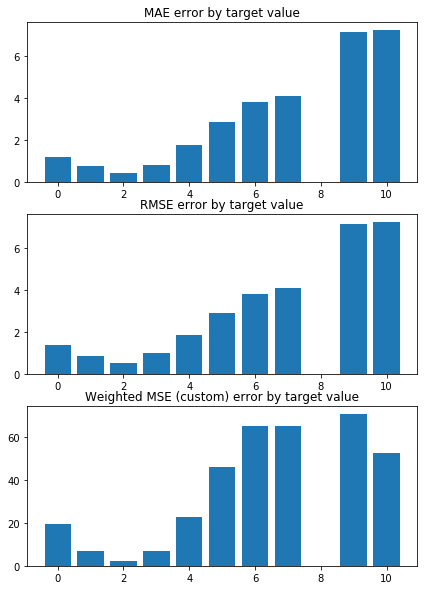

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0781288074260915 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1610357102961868 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


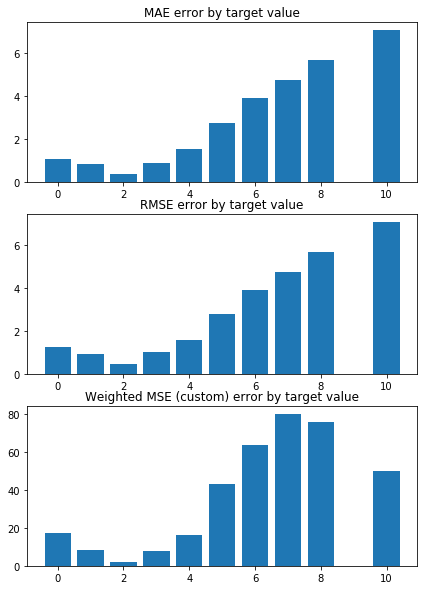

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0676340678772718 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584108147615877 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


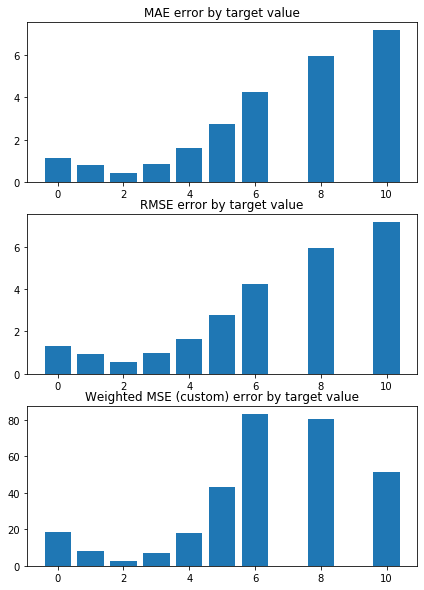

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.173099450578241 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437183679799798 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


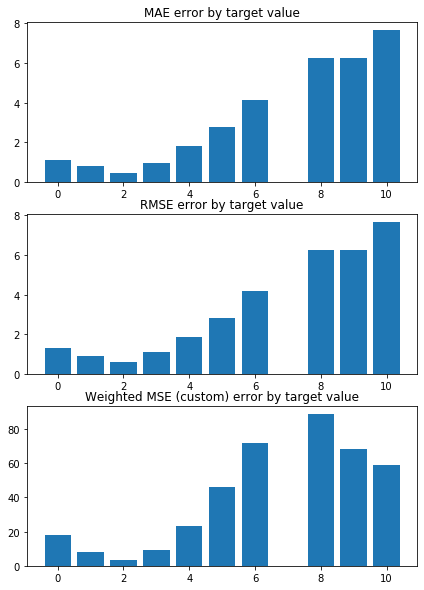

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1691731452424394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491006694273085 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


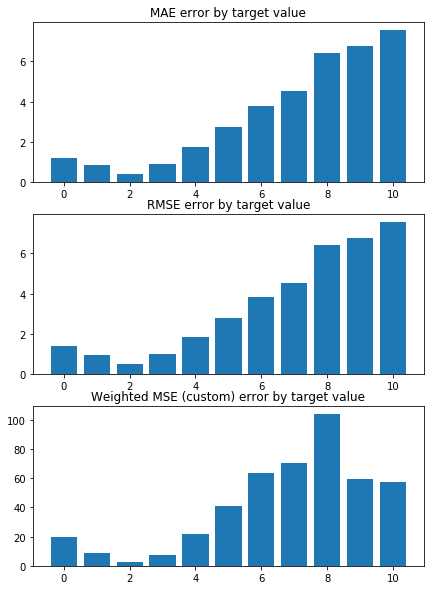

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1896784882091878 


 TRAIN PREDICTION Error
weighted_mse_train: 1.143931951960995 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


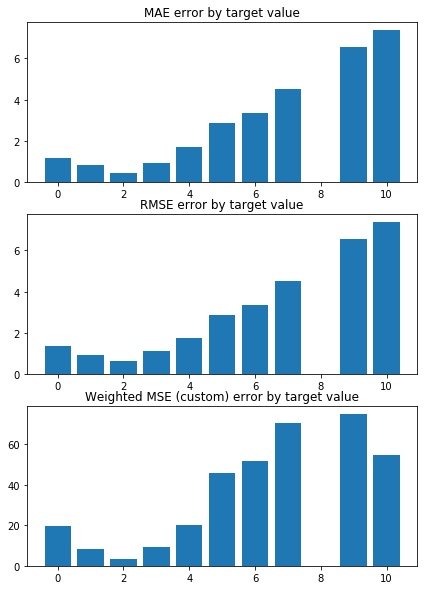

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1019530805091267 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1558626911589396 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


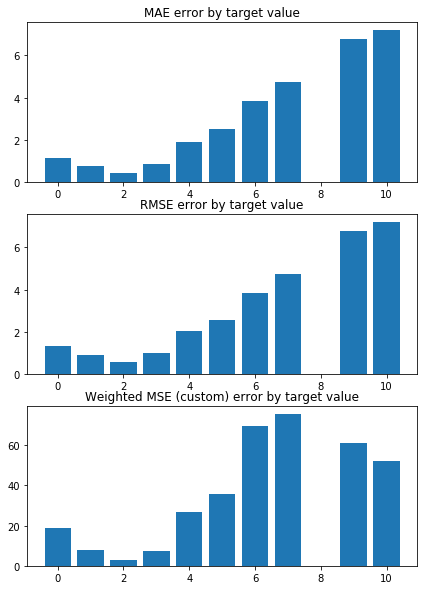

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.236422931754377 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409021911790498 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


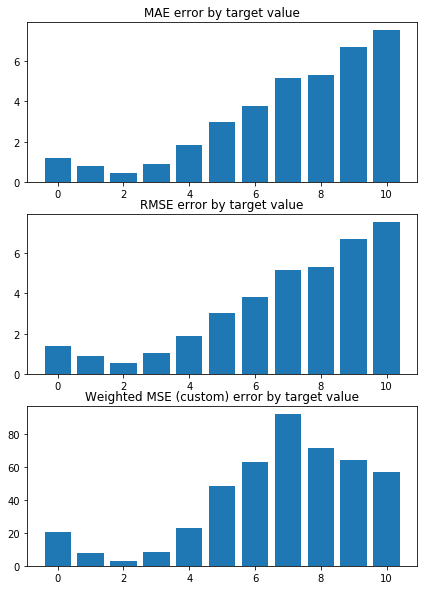

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.277813066391549 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1335186479815726 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


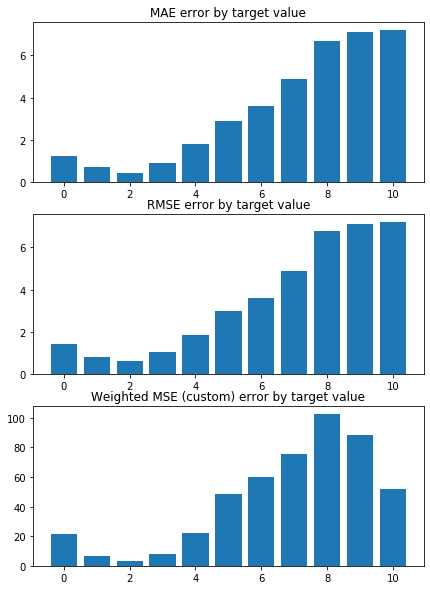

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695066573638814 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1593338024641509 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


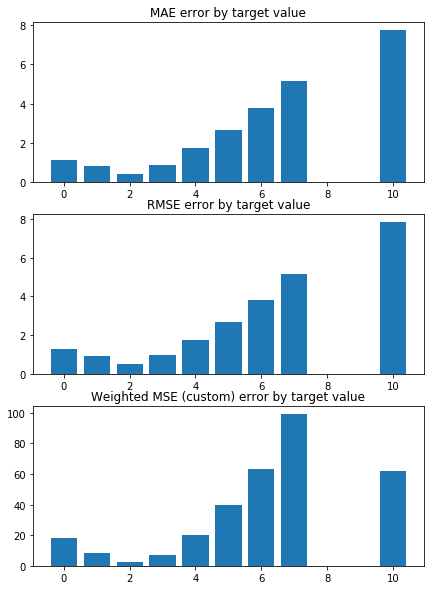

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897222938739 

Mean squared error on Test: 1.15 
 MSE mean test:  2.341041855428713 

Root of MSE on Test: 1.07 
 1.5300463572809528 

Variance score on Test: 0.07 
 r2_test: 0.21002323774278828 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449928 -0.378442 -0.120096  0.104206  0.010980
1 -0.481843 -0.351965 -0.125384  0.094921  0.014700
2 -0.453971 -0.381819 -0.124925  0.081933  0.018774
3 -0.462771 -0.366317 -0.123041  0.111963  0.025179
4 -0.448824 -0.379277 -0.125365  0.103789  0.020473
5 -0.449562 -0.373673 -0.112721  0.119403  0.018738
6 -0.473144 -0.356164 -0.117813  0.113126  0.009501
7 -0.458671 -0.364243 -0.111892  0.118224  0.015027
8 -0.454068 -0.379233 -0.125000  0.106511  0.011631
9 -0.452432 -0.381903 -0.128511  0.116174  0.004693
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


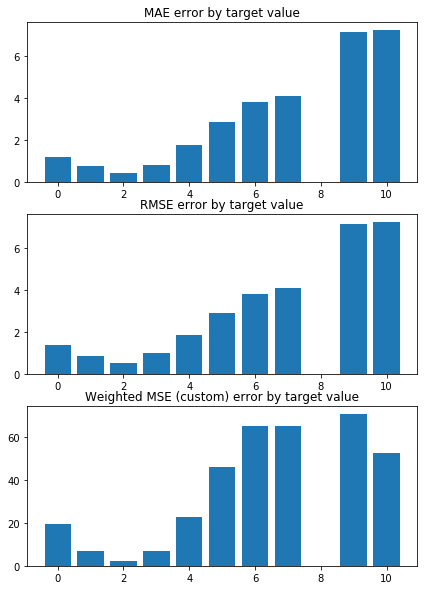

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0780871175562252 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1610091856061064 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


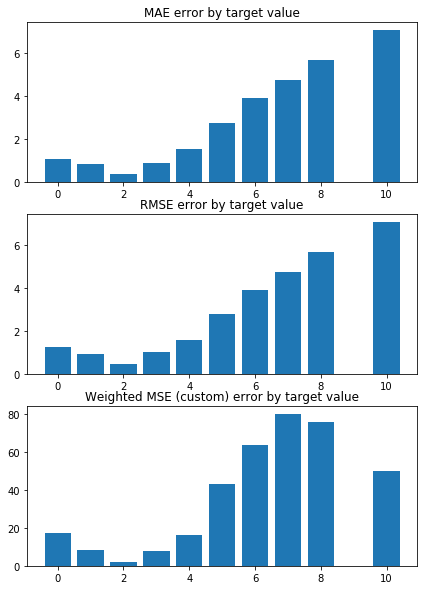

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0676064426866207 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1583858315702011 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


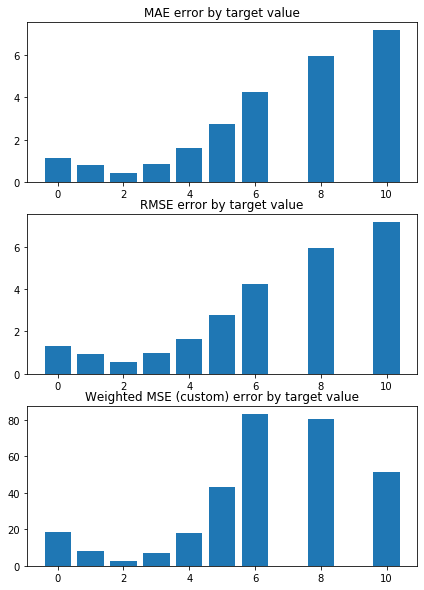

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1730739534150632 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1436926011067798 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


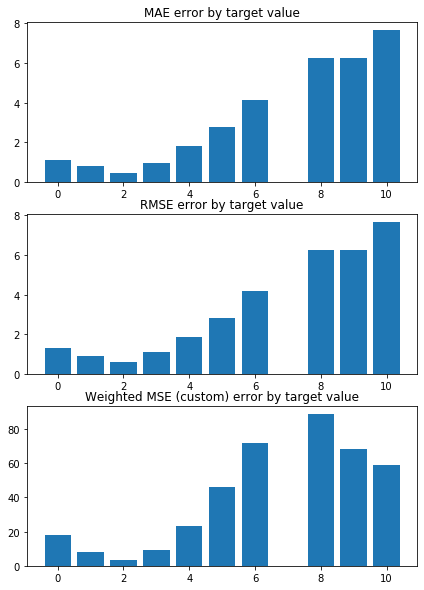

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1691545394687735 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1490752900771872 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


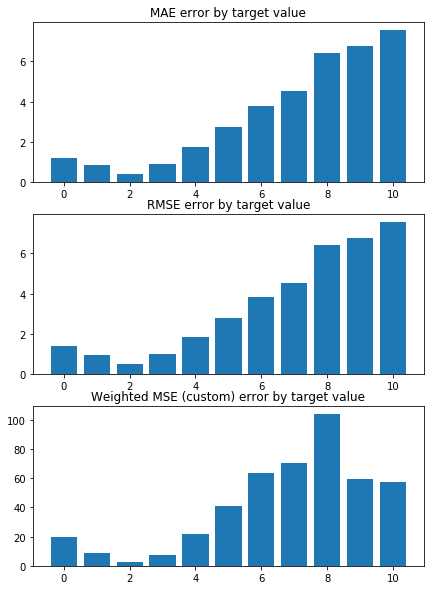

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.189648051404281 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1439085921261583 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


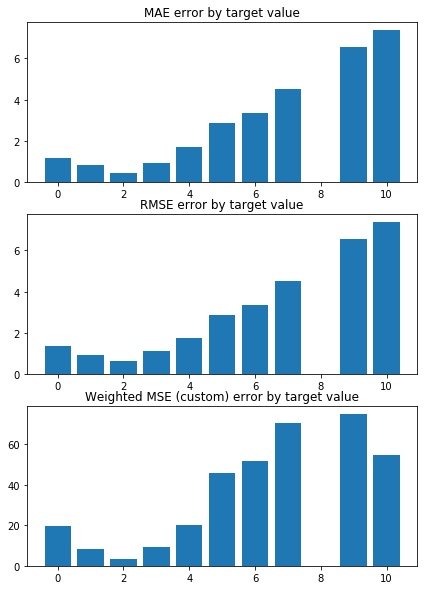

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1019181520525956 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1558372157902446 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


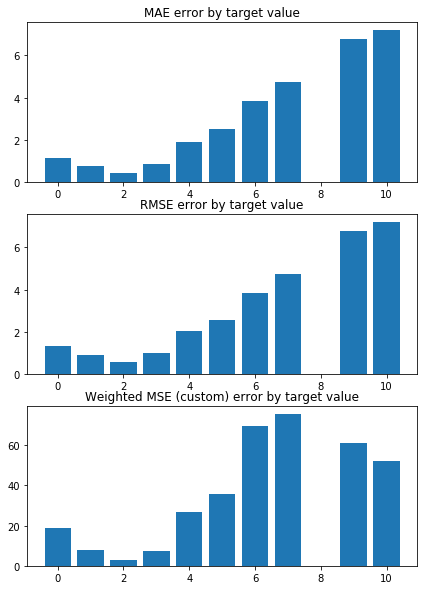

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.236407403644233 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1408771683135532 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


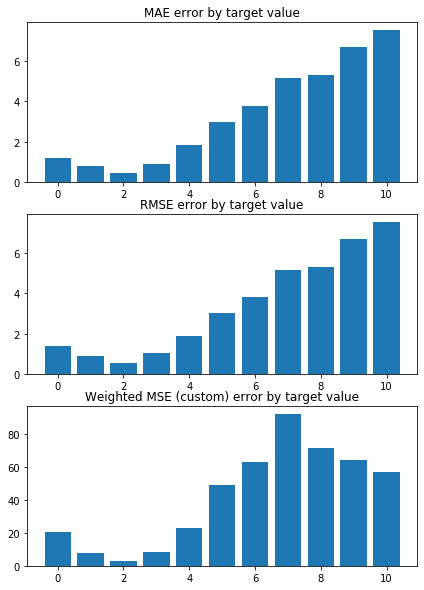

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2777850463426732 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1334933022731593 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


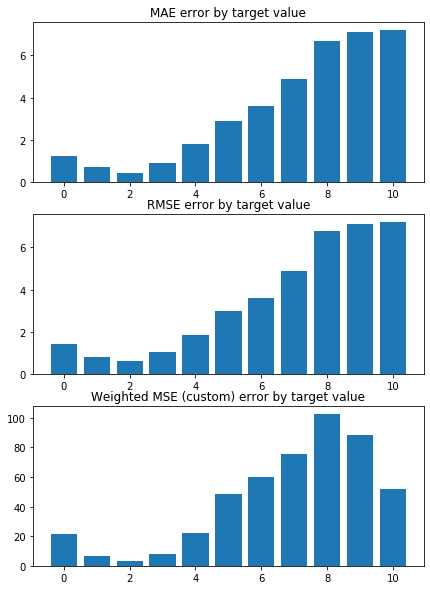

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0694872067045469 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1593071558946544 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


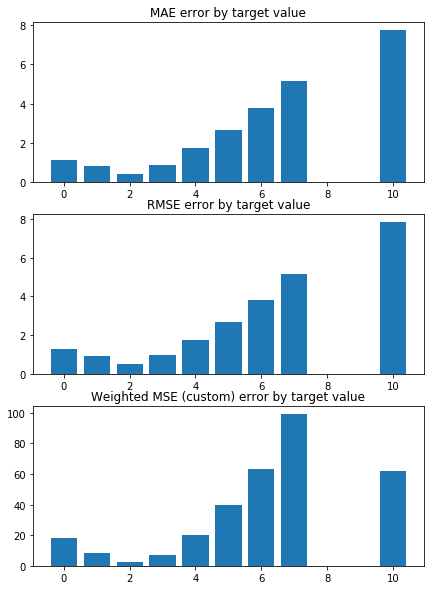

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897312388163 

Mean squared error on Test: 1.15 
 MSE mean test:  2.341040422127821 

Root of MSE on Test: 1.07 
 1.5300458888960884 

Variance score on Test: 0.07 
 r2_test: 0.21002378687321133 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449824 -0.378413 -0.120011  0.104216  0.010988
1 -0.481695 -0.351977 -0.125299  0.094934  0.014706
2 -0.453869 -0.381787 -0.124838  0.081947  0.018780
3 -0.462653 -0.366305 -0.122956  0.111972  0.025183
4 -0.448724 -0.379246 -0.125280  0.103800  0.020478
5 -0.449457 -0.373649 -0.112639  0.119410  0.018744
6 -0.473009 -0.356167 -0.117730  0.113135  0.009509
7 -0.458554 -0.364231 -0.111812  0.118230  0.015034
8 -0.453964 -0.379205 -0.124913  0.106521  0.011639
9 -0.452331 -0.381871 -0.128425  0.116182  0.004702
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


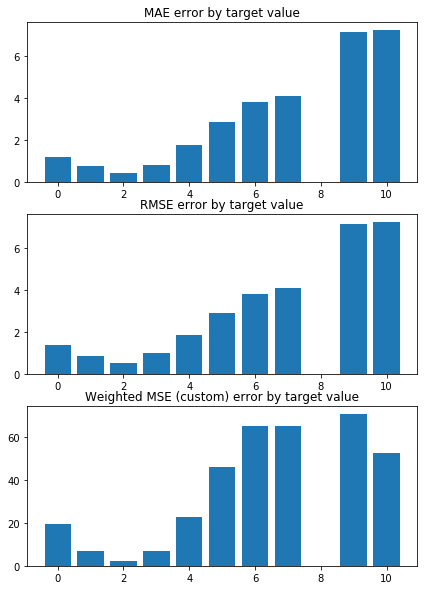

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.078045499841671 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1609827034870999 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


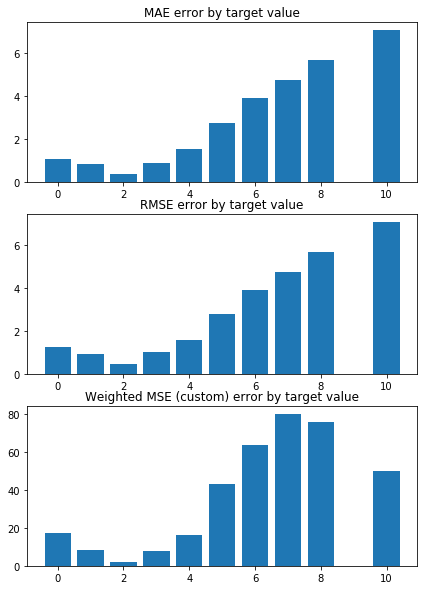

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.067578851240115 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1583608841406259 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


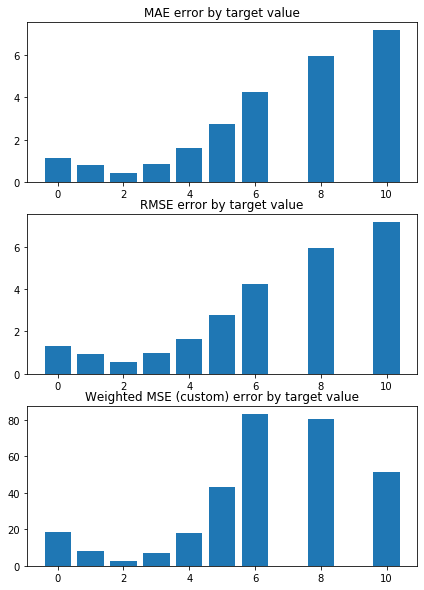

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1730484929776634 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1436668708172641 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


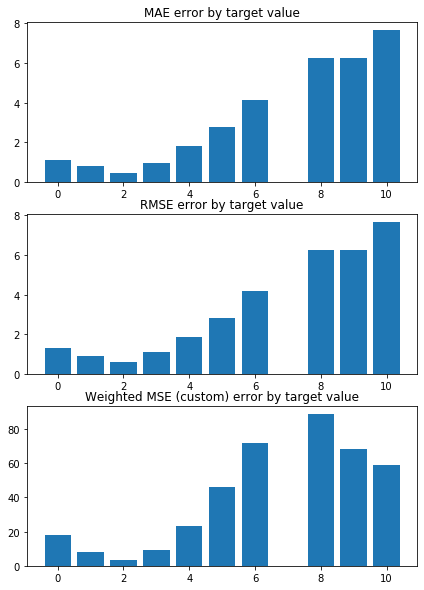

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169135961488852 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1490499455073275 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


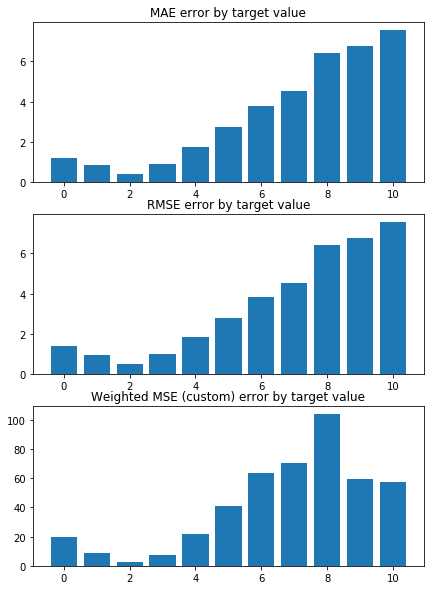

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1896176508956142 


 TRAIN PREDICTION Error
weighted_mse_train: 1.143885265237775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


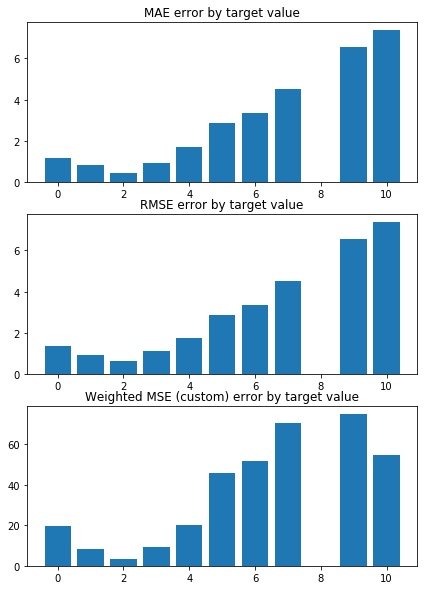

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1018832776537462 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1558117795487228 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


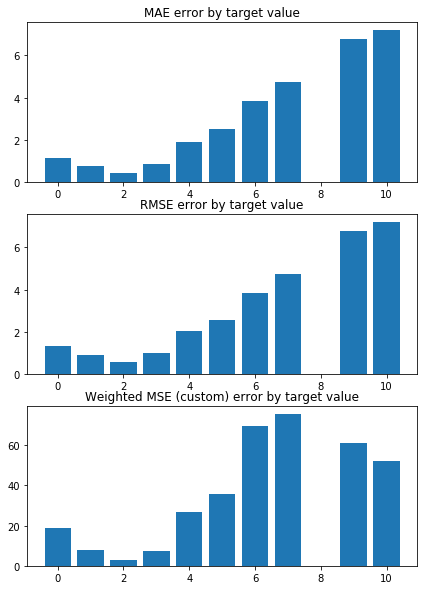

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2363919051604961 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1408521805925977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


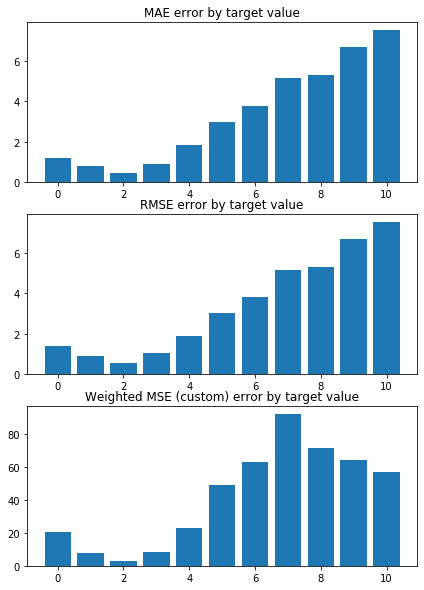

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.277757063452946 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1334679918692916 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


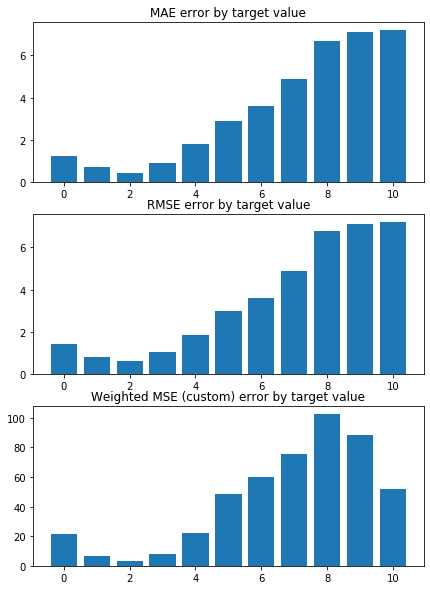

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.069467783867995 


 TRAIN PREDICTION Error
weighted_mse_train: 1.159280545022558 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


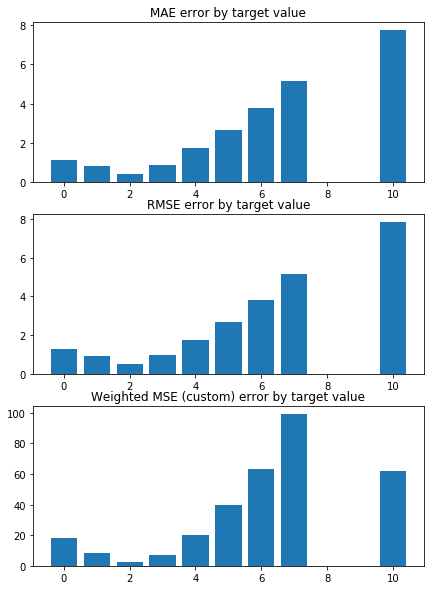

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.3368974272896303 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410390172712714 

Root of MSE on Test: 1.07 
 1.5300454298063413 

Variance score on Test: 0.07 
 r2_test: 0.2100243261400717 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449719 -0.378384 -0.119927  0.104226  0.010995
1 -0.481548 -0.351987 -0.125214  0.094947  0.014711
2 -0.453766 -0.381755 -0.124752  0.081961  0.018786
3 -0.462536 -0.366292 -0.122871  0.111981  0.025188
4 -0.448624 -0.379214 -0.125194  0.103810  0.020484
5 -0.449352 -0.373625 -0.112557  0.119417  0.018749
6 -0.472874 -0.356170 -0.117646  0.113143  0.009517
7 -0.458439 -0.364218 -0.111732  0.118236  0.015041
8 -0.453860 -0.379176 -0.124826  0.106532  0.011647
9 -0.452231 -0.381839 -0.128339  0.116190  0.004711
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


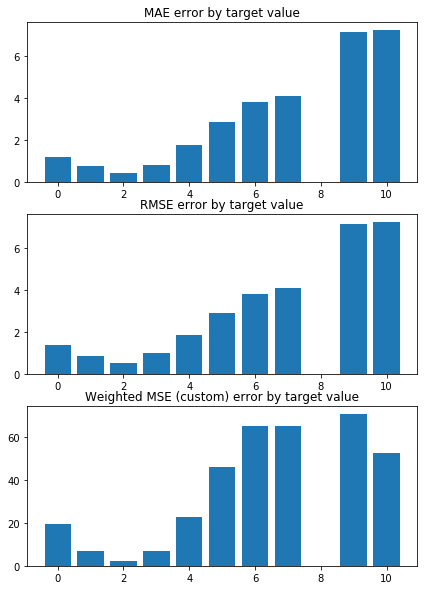

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0780039540986517 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1609562638457767 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


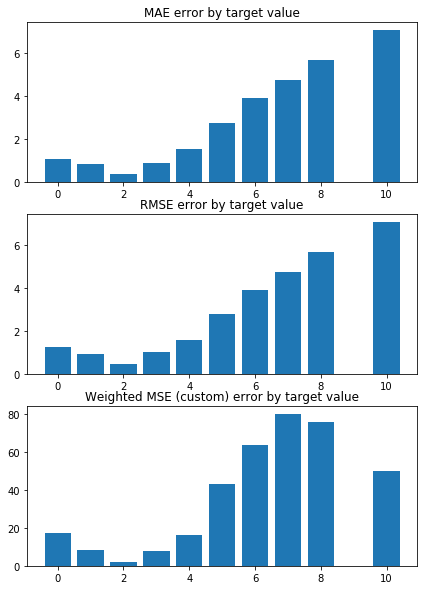

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0675512935018092 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1583359724160152 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


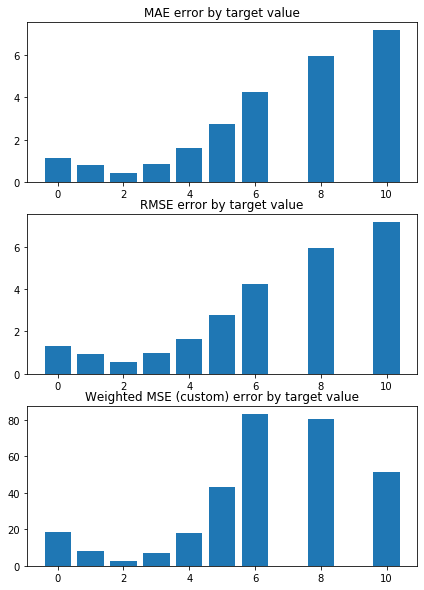

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1730230691959578 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1436411770465418 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


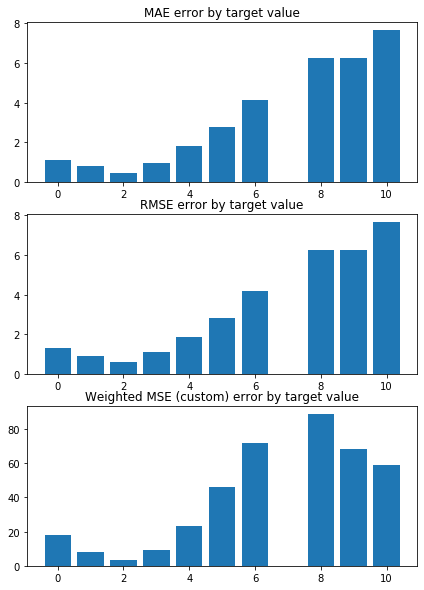

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1691174112691525 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1490246356635891 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


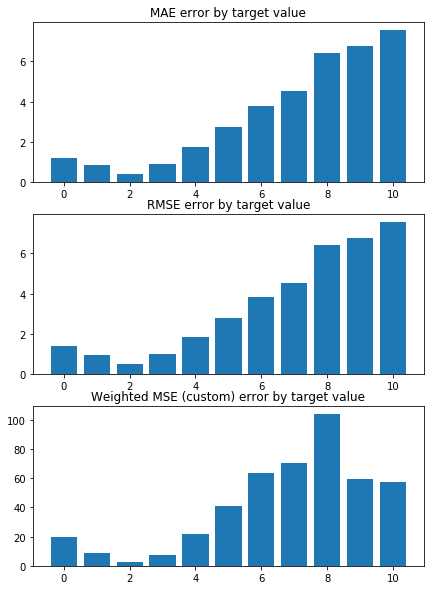

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.189587286619007 


 TRAIN PREDICTION Error
weighted_mse_train: 1.143861971243126 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


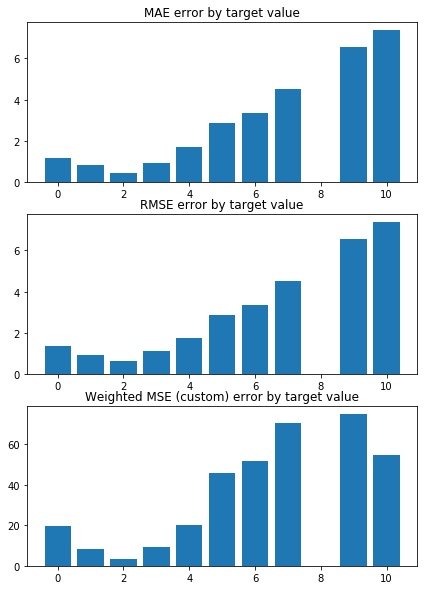

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1018484571791436 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1557863823548686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


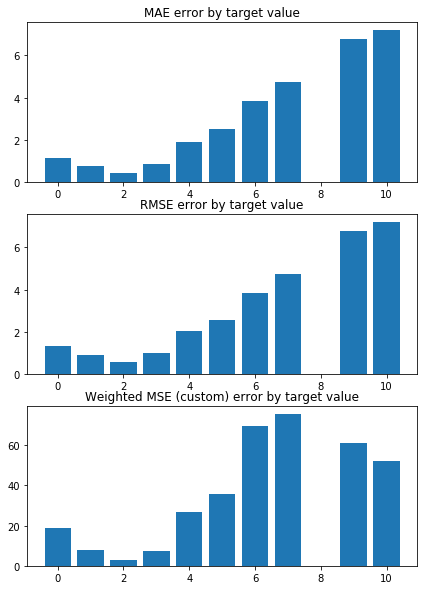

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2363764362359964 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1408272279552485 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


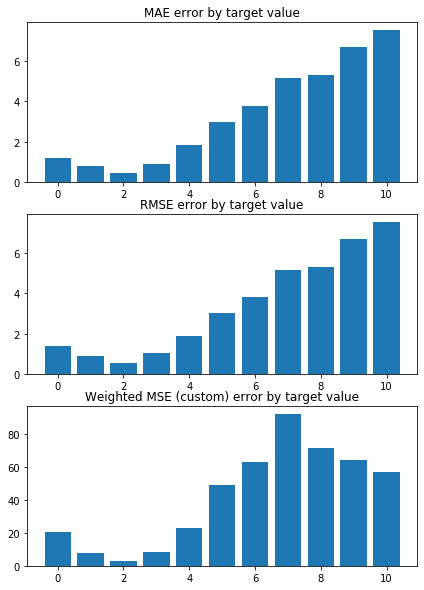

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2777291176594687 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1334427167145427 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


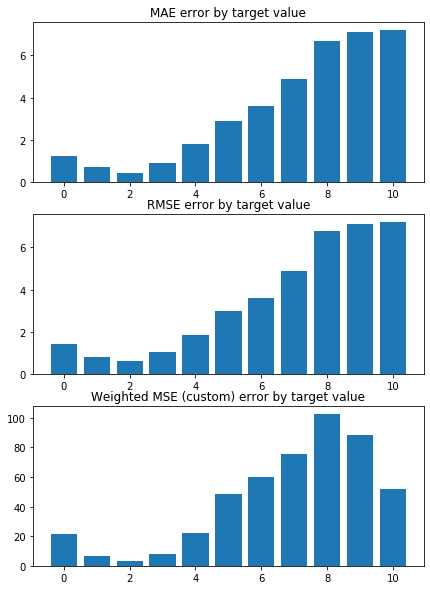

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0694483888212585 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1592539697937125 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


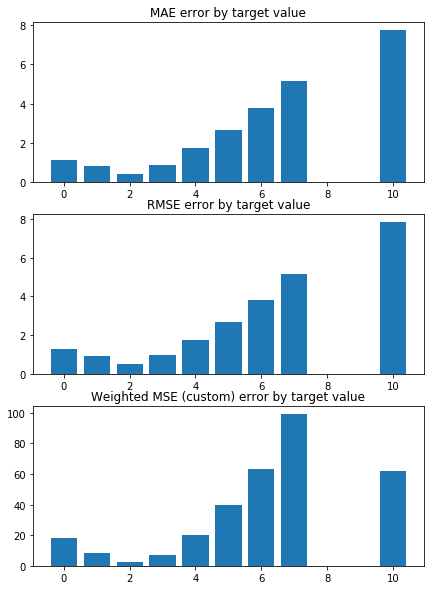

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897567596519 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410376408008 

Root of MSE on Test: 1.07 
 1.5300449799926799 

Variance score on Test: 0.07 
 r2_test: 0.2100248555638075 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449615 -0.378356 -0.119842  0.104235  0.011003
1 -0.481401 -0.351998 -0.125129  0.094960  0.014717
2 -0.453664 -0.381722 -0.124665  0.081975  0.018792
3 -0.462419 -0.366279 -0.122787  0.111990  0.025192
4 -0.448524 -0.379183 -0.125109  0.103820  0.020490
5 -0.449247 -0.373601 -0.112475  0.119424  0.018755
6 -0.472740 -0.356173 -0.117563  0.113151  0.009524
7 -0.458323 -0.364206 -0.111651  0.118243  0.015048
8 -0.453756 -0.379147 -0.124739  0.106542  0.011655
9 -0.452131 -0.381806 -0.128252  0.116198  0.004719
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [  

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


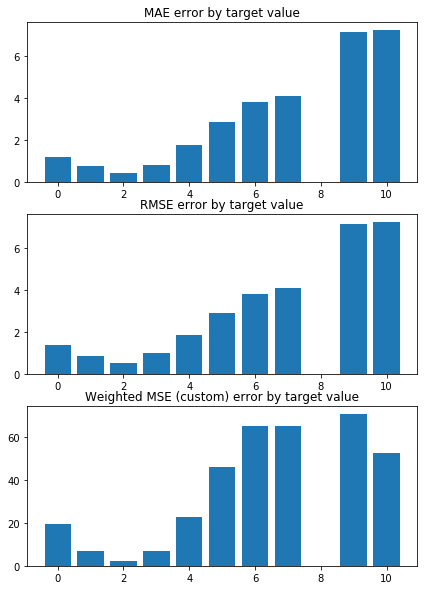

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0779624801442511 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1609298665891543 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


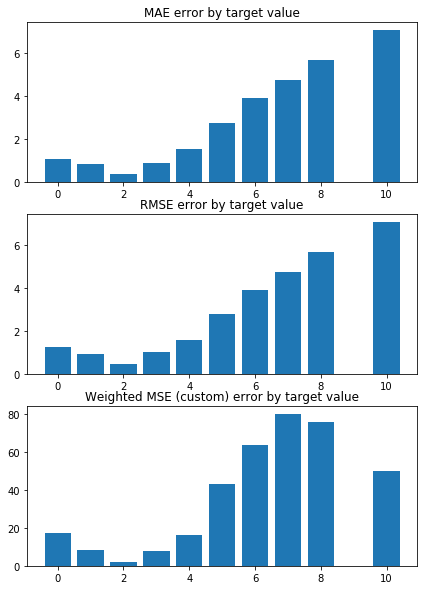

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0675237694357862 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1583110963396805 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


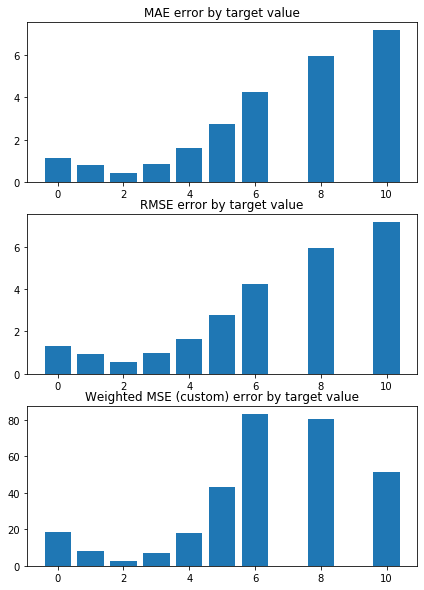

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1729976820001151 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1436155197299436 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


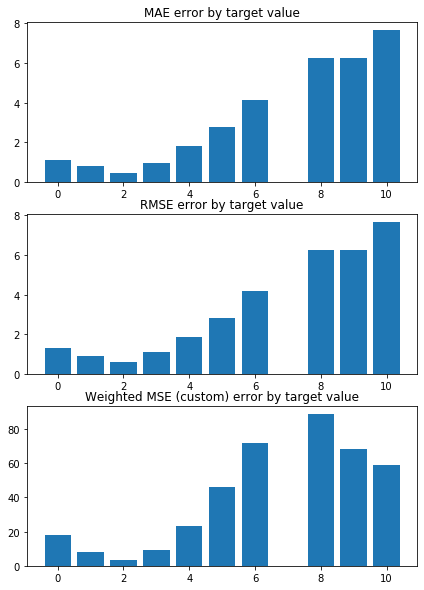

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1690988887762 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1489993604919795 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


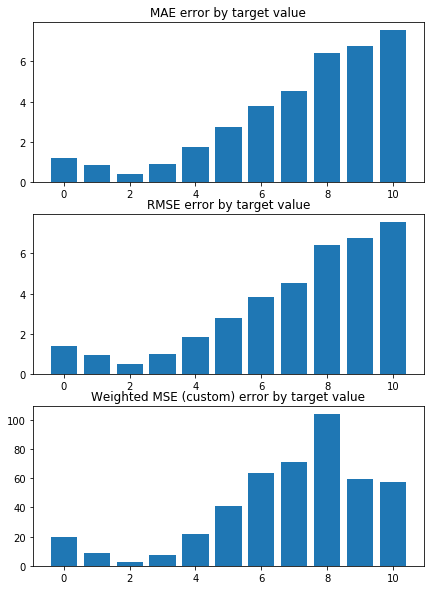

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.189556958510494 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1438387100896452 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


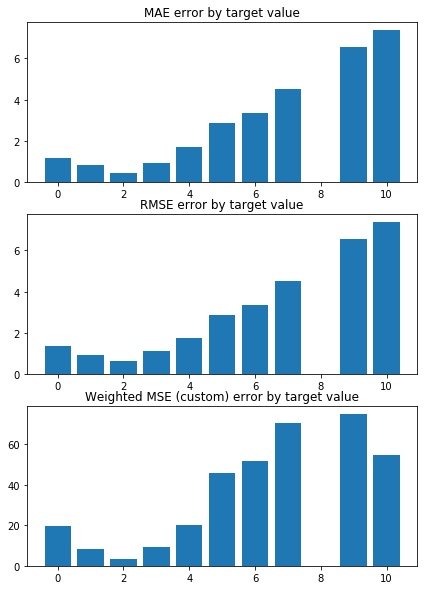

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1018136904959646 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1557610241294982 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


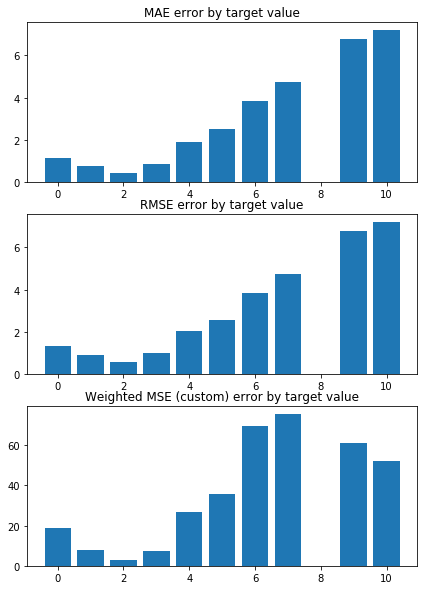

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2363609968038478 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1408023103407805 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


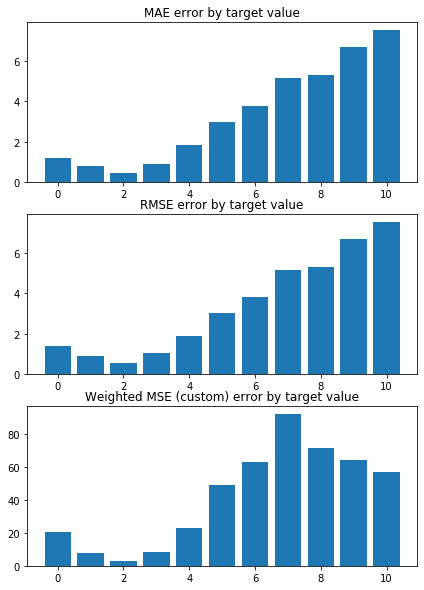

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.277701208899535 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133417476753638 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


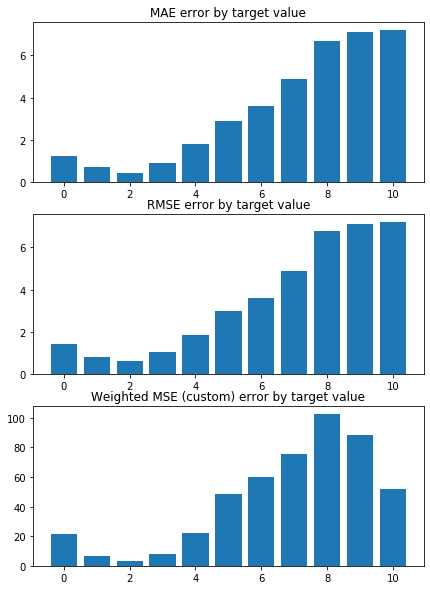

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0694290215314177 


 TRAIN PREDICTION Error
weighted_mse_train: 1.159227430154109 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


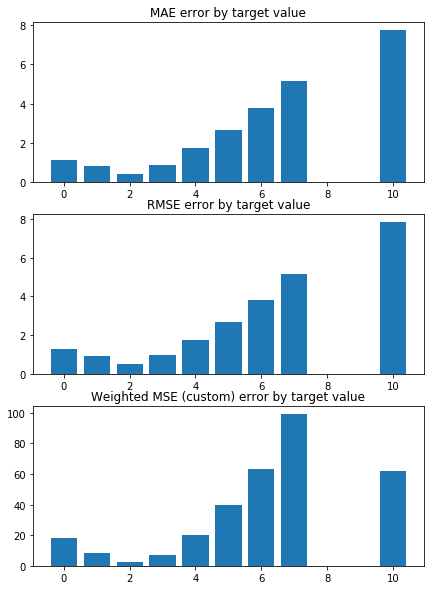

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.33689773326235 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410362926583534 

Root of MSE on Test: 1.07 
 1.5300445394361413 

Variance score on Test: 0.07 
 r2_test: 0.2100253751647831 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449511 -0.378327 -0.119757  0.104245  0.011010
1 -0.481255 -0.352009 -0.125044  0.094972  0.014723
2 -0.453561 -0.381690 -0.124579  0.081989  0.018798
3 -0.462302 -0.366266 -0.122702  0.111999  0.025196
4 -0.448425 -0.379151 -0.125024  0.103831  0.020495
5 -0.449142 -0.373577 -0.112393  0.119431  0.018761
6 -0.472606 -0.356175 -0.117480  0.113159  0.009532
7 -0.458207 -0.364194 -0.111571  0.118249  0.015054
8 -0.453652 -0.379118 -0.124653  0.106553  0.011663
9 -0.452030 -0.381774 -0.128166  0.116206  0.004728
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


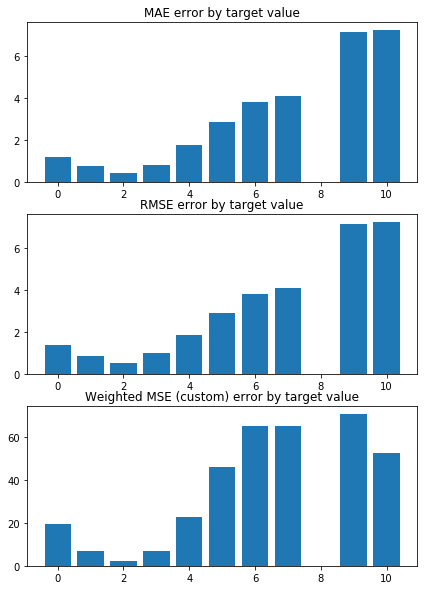

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.077921077796409 


 TRAIN PREDICTION Error
weighted_mse_train: 1.160903511624652 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


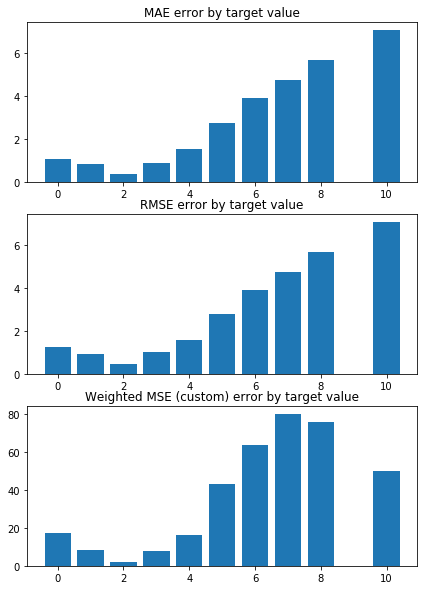

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0674962790061573 


 TRAIN PREDICTION Error
weighted_mse_train: 1.158286255855091 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


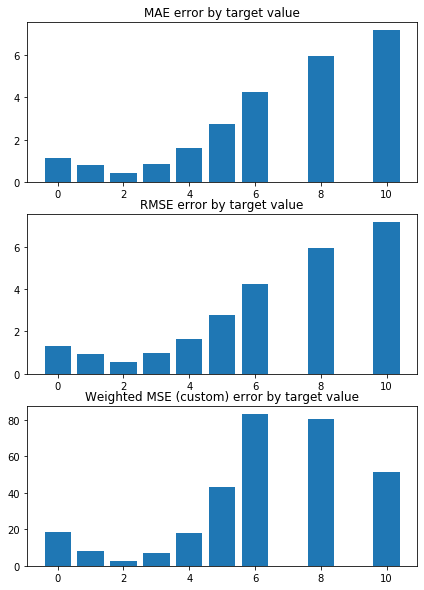

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1729723313205576 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1435898988030222 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


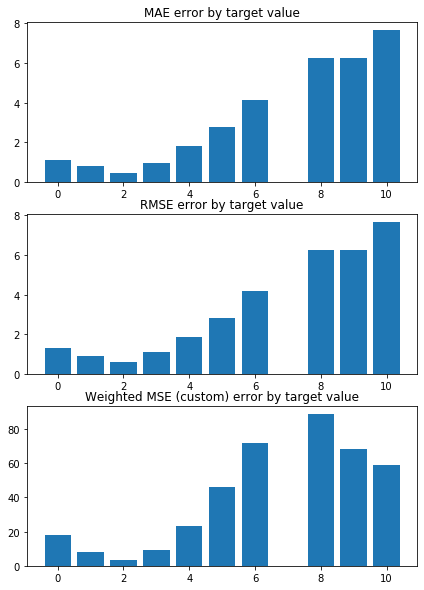

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169080393976567 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1489741199386534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


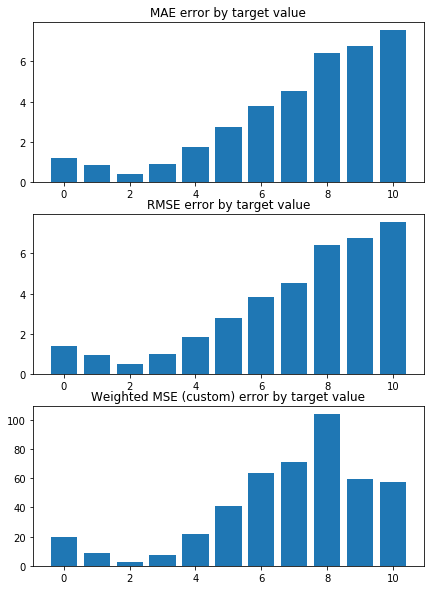

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1895266665063244 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1438154817249206 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


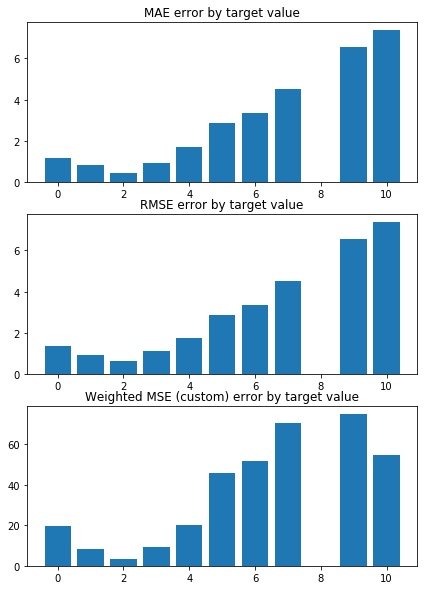

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.101778977471991 


 TRAIN PREDICTION Error
weighted_mse_train: 1.155735704793748 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


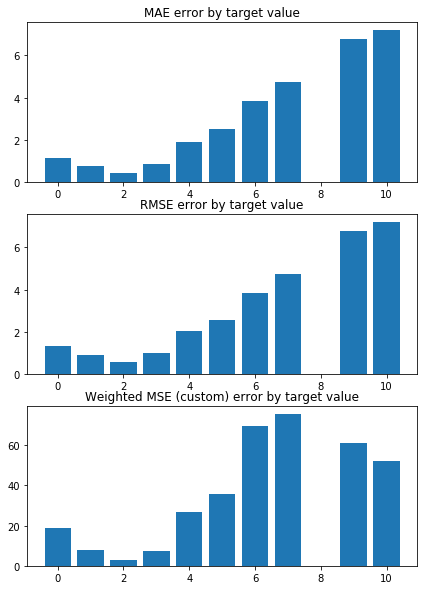

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2363455867974473 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1407774276886724 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


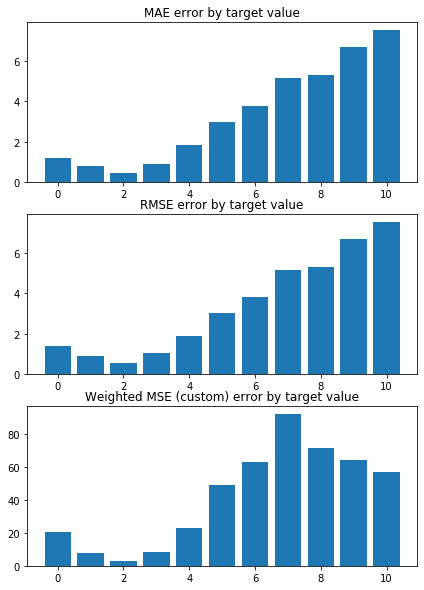

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2776733371106295 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133392271931458 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


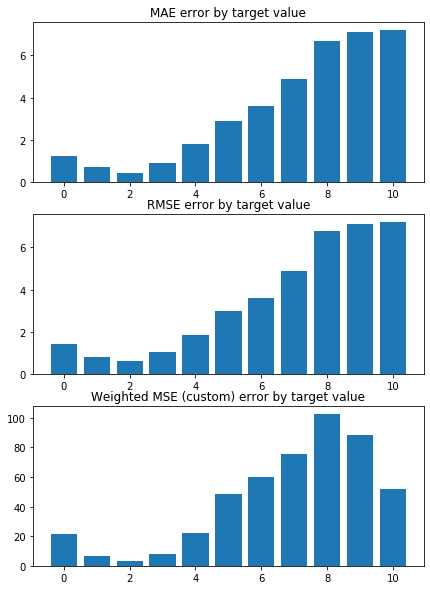

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0694096819655998 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1592009260498797 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


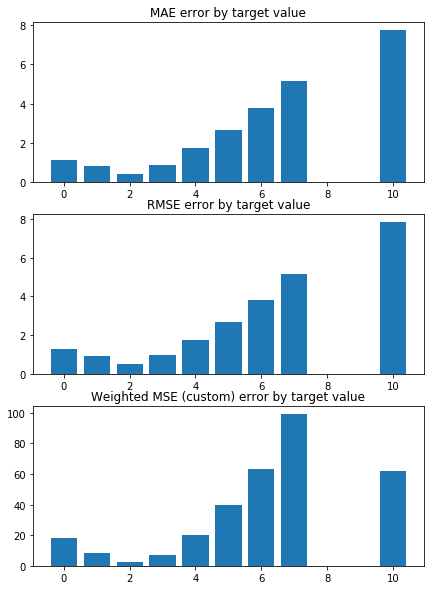

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897924240784 

Mean squared error on Test: 1.15 
 MSE mean test:  2.3410349727860855 

Root of MSE on Test: 1.07 
 1.53004410811783 

Variance score on Test: 0.07 
 r2_test: 0.21002588496328922 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449406 -0.378298 -0.119673  0.104255  0.011018
1 -0.481108 -0.352019 -0.124959  0.094985  0.014729
2 -0.453459 -0.381658 -0.124492  0.082003  0.018805
3 -0.462186 -0.366252 -0.122617  0.112008  0.025200
4 -0.448325 -0.379120 -0.124939  0.103841  0.020501
5 -0.449038 -0.373552 -0.112311  0.119438  0.018766
6 -0.472472 -0.356178 -0.117396  0.113168  0.009540
7 -0.458092 -0.364181 -0.111492  0.118255  0.015061
8 -0.453548 -0.379089 -0.124566  0.106563  0.011670
9 -0.451930 -0.381741 -0.128080  0.116213  0.004736
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


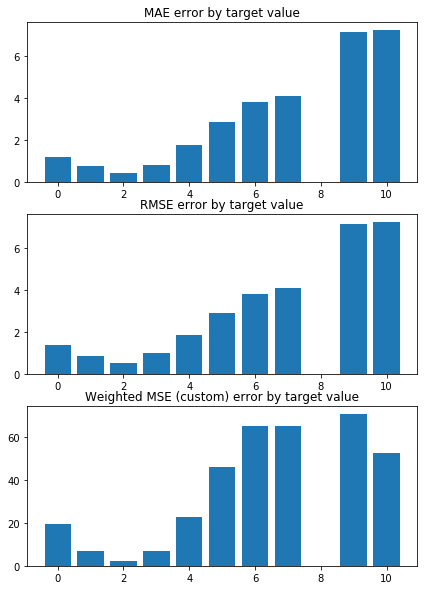

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0778797468739134 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1608771988600888 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


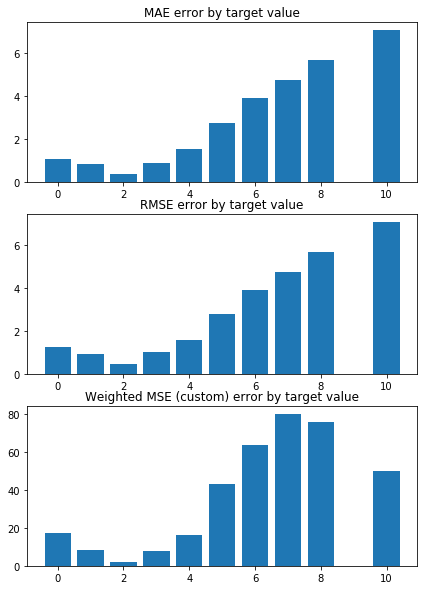

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0674688221770616 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1582614509058728 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


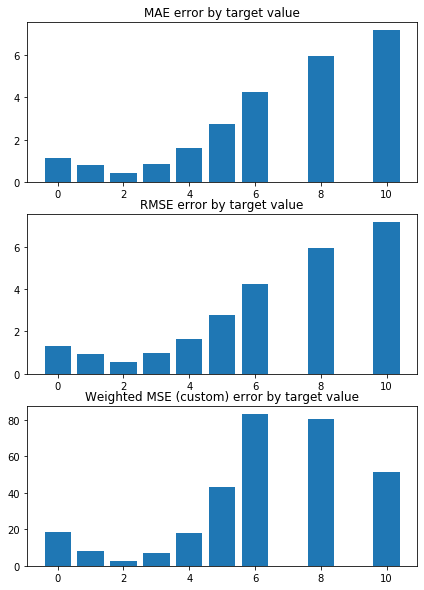

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1729470170879568 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1435643142015512 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


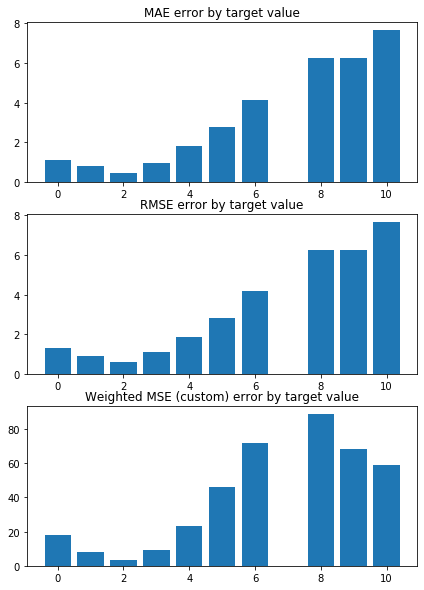

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1690619268368732 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1489489139499116 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


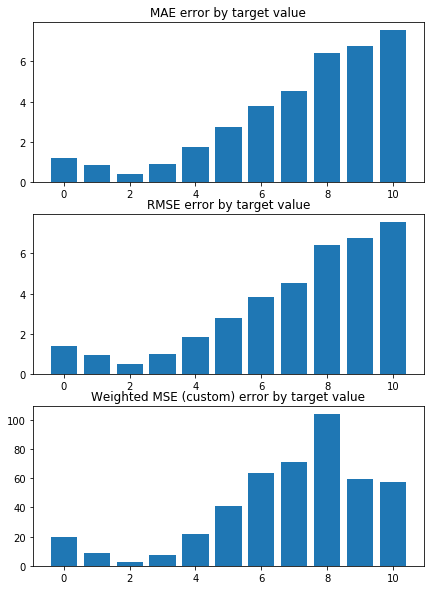

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.18949641054296 


 TRAIN PREDICTION Error
weighted_mse_train: 1.143792286096695 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


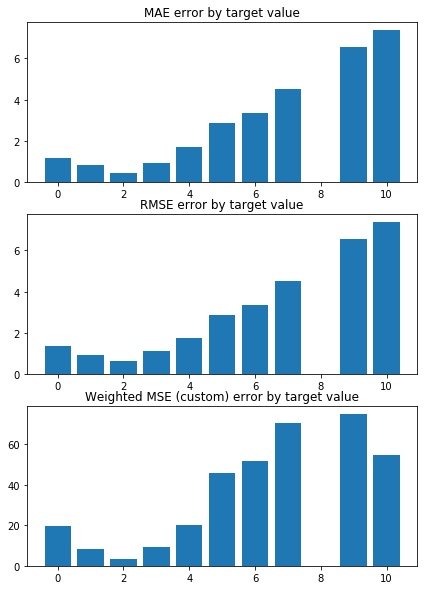

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.101744317975609 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1557104242690717 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


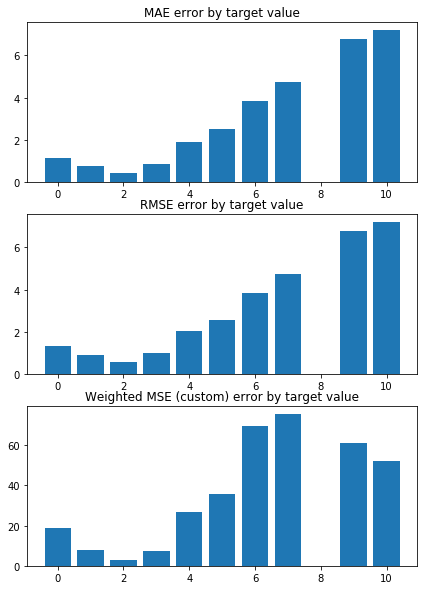

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2363302061504717 


 TRAIN PREDICTION Error
weighted_mse_train: 1.140752579938608 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


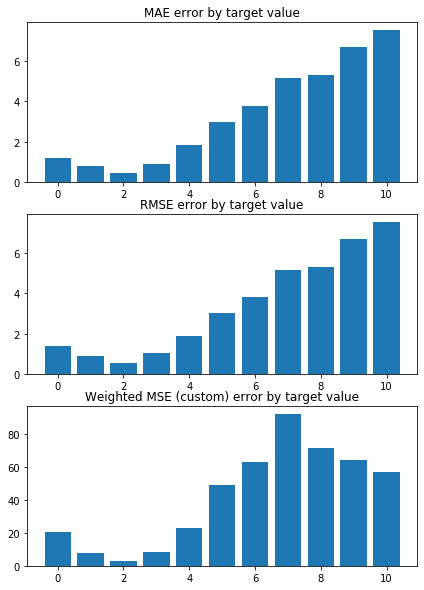

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2776455022304272 


 TRAIN PREDICTION Error
weighted_mse_train: 1.133367102193034 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


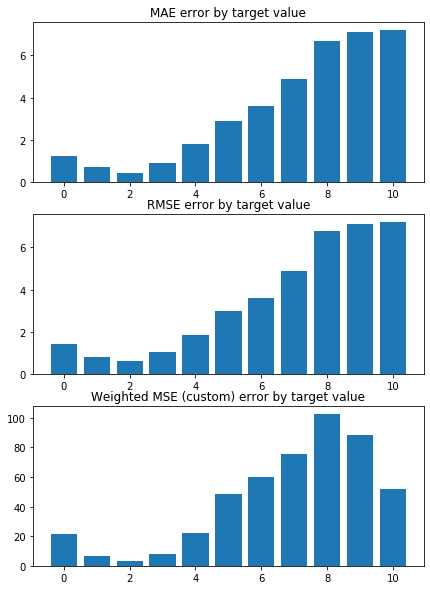

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0693903700909784 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1591744574272977 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


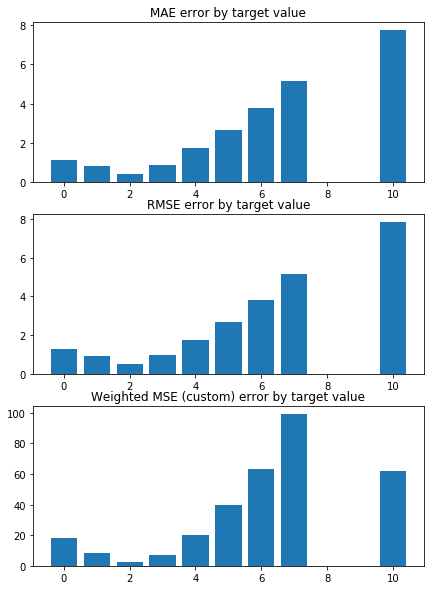

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.3368981404856264 

Mean squared error on Test: 1.15 
 MSE mean test:  2.341033681126352 

Root of MSE on Test: 1.07 
 1.5300436860189164 

Variance score on Test: 0.07 
 r2_test: 0.21002638497954376 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.449302 -0.378268 -0.119588  0.104265  0.011026
1 -0.480962 -0.352030 -0.124874  0.094998  0.014734
2 -0.453357 -0.381625 -0.124406  0.082017  0.018811
3 -0.462069 -0.366239 -0.122533  0.112017  0.025205
4 -0.448225 -0.379088 -0.124854  0.103851  0.020507
5 -0.448933 -0.373528 -0.112229  0.119445  0.018772
6 -0.472338 -0.356180 -0.117313  0.113176  0.009547
7 -0.457977 -0.364168 -0.111412  0.118262  0.015068
8 -0.453444 -0.379060 -0.124479  0.106574  0.011678
9 -0.451830 -0.381709 -0.127994  0.116221  0.004745


,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.341046,0.292483,2.336897,0.032506,-,"Ridge(alpha=0, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22859482394923247, 0.2702488691646693, 0.23...",1.151457,0.068548,1.149396,0.008649
1,2.341045,0.292485,2.336897,0.032506,-,"Ridge(alpha=1, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22859276775958248, 0.27025421427875784, 0.2...",1.151430,0.068551,1.149370,0.008648
2,2.341043,0.292487,2.336897,0.032506,-,"Ridge(alpha=2, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.2285907045253095, 0.27025953502773536, 0.23...",1.151404,0.068553,1.149345,0.008648
3,2.341042,0.292489,2.336897,0.032506,-,"Ridge(alpha=3, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22858863425617137, 0.27026483148237335, 0.2...",1.151377,0.068556,1.149319,0.008647
4,2.341040,0.292492,2.336897,0.032506,-,"Ridge(alpha=4, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22858655696191366, 0.270270103713096, 0.232...",1.151351,0.068559,1.149294,0.008647
5,2.341039,0.292494,2.336897,0.032506,-,"Ridge(alpha=5, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22858447265226822, 0.2702753517899845, 0.23...",1.151325,0.068561,1.149269,0.008646
6,2.341038,0.292496,2.336898,0.032506,-,"Ridge(alpha=6, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22858238133695497, 0.27028057578277775, 0.2...",1.151298,0.068564,1.149243,0.008646
7,2.341036,0.292498,2.336898,0.032506,-,"Ridge(alpha=7, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22858028302568068, 0.2702857757608754, 0.23...",1.151272,0.068566,1.149218,0.008646
8,2.341035,0.292500,2.336898,0.032506,-,"Ridge(alpha=8, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22857817772813993, 0.2702909517933404, 0.23...",1.151246,0.068569,1.149193,0.008645
9,2.341034,0.292502,2.336898,0.032506,-,"Ridge(alpha=9, copy_X=True, fit_intercept=True...",LR+L2_grid10,10.0,test_params = testtest,"[0.22857606545401388, 0.2702961039489009, 0.23...",1.151220,0.068572,1.149168,0.008645


In [108]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(0, 10, 1)
# Create linear regression object



model_name = 'LR+L2_grid10'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

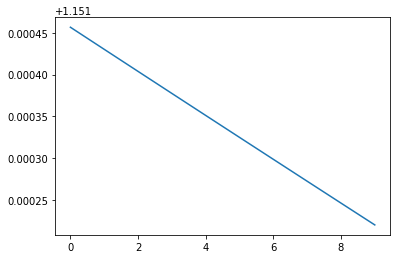

In [109]:
plt.plot(alpha_grid, wmse_test)

In [110]:
wmse_test

[1.1514566620151299,
 1.15143018359403,
 1.1514037440054732,
 1.1513773431765901,
 1.1513509810347768,
 1.1513246575076905,
 1.1512983725232497,
 1.1512721260096328,
 1.151245917895275,
 1.1512197481088684]

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1394324930038406 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1343536245714252 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


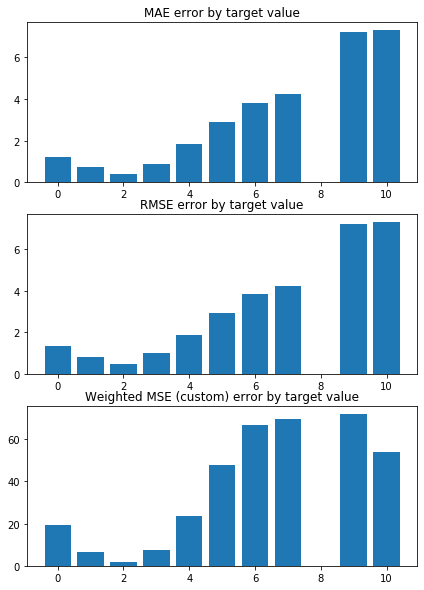

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0574507616635747 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1476553966029053 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


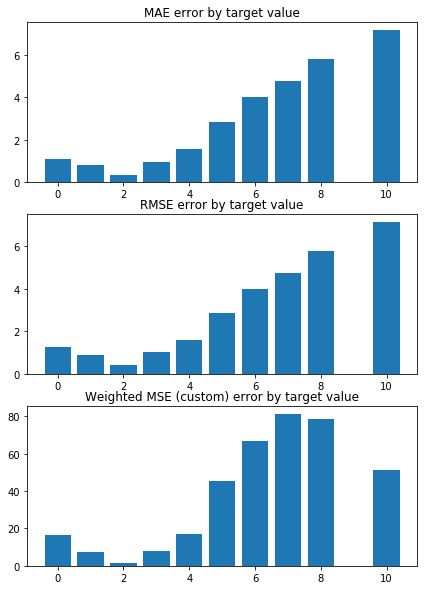

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0522160154294553 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1453927333223244 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


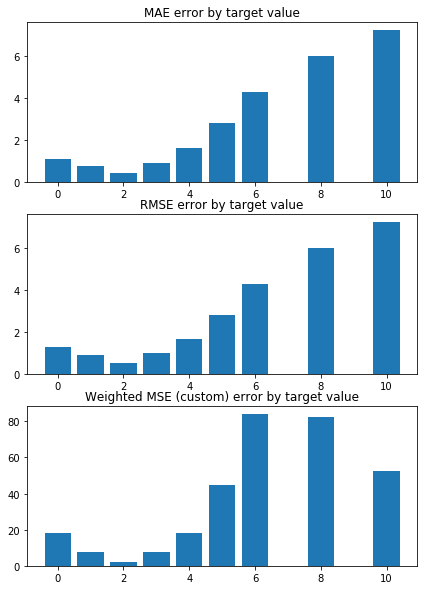

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1593496317512935 


 TRAIN PREDICTION Error
weighted_mse_train: 1.129949626603659 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


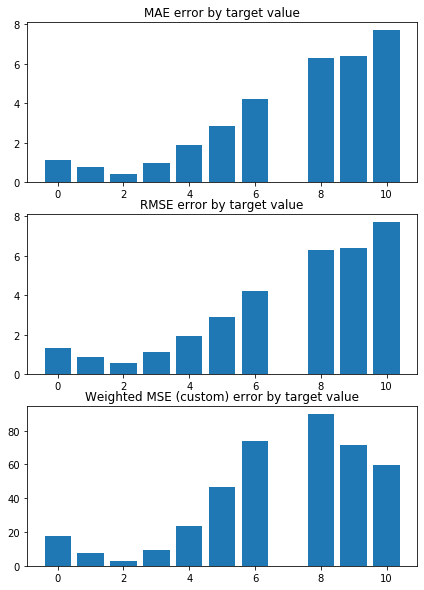

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1603848227275266 


 TRAIN PREDICTION Error
weighted_mse_train: 1.135446675076594 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


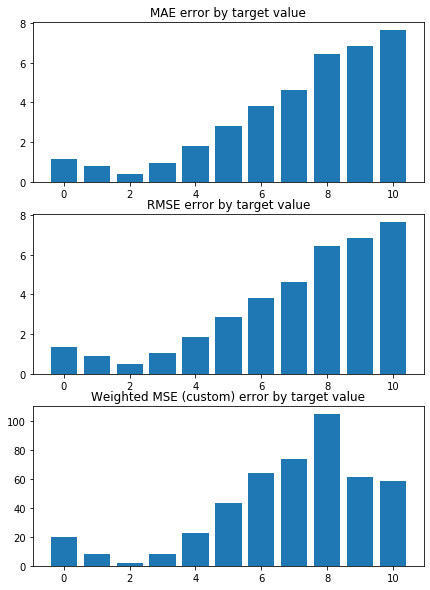

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1711800334320301 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1316393653642924 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


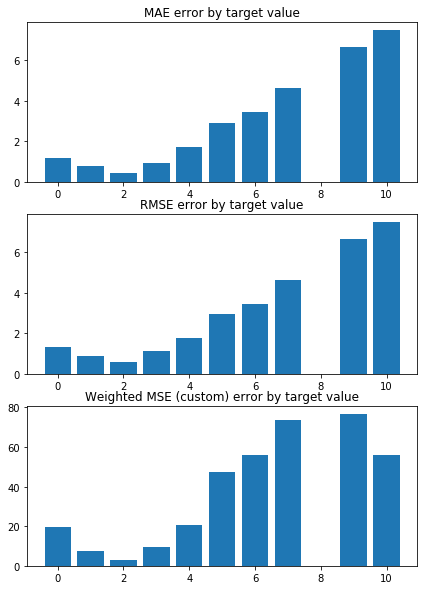

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0829823635660891 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1427710683007972 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


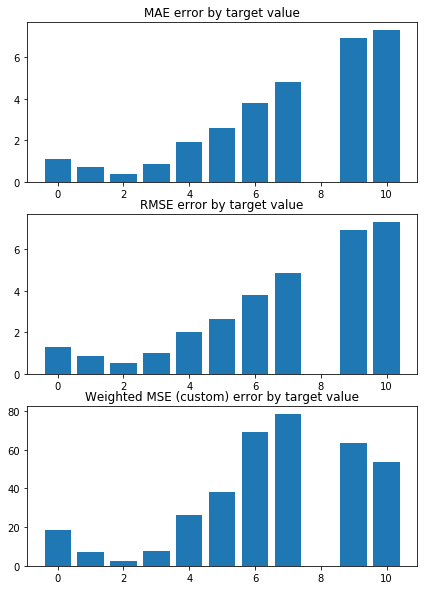

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2298791463384569 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1275056613588372 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


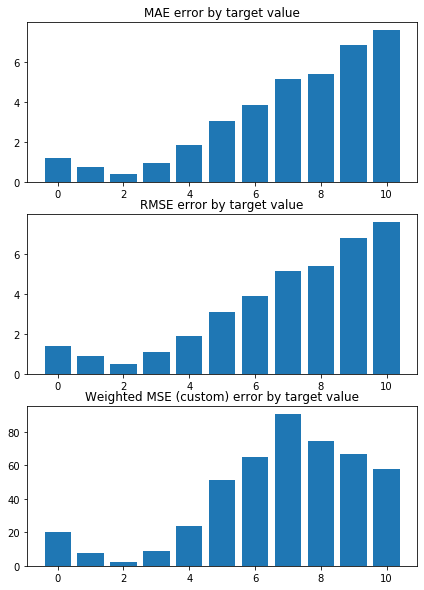

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2620485657699785 


 TRAIN PREDICTION Error
weighted_mse_train: 1.120045090452858 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


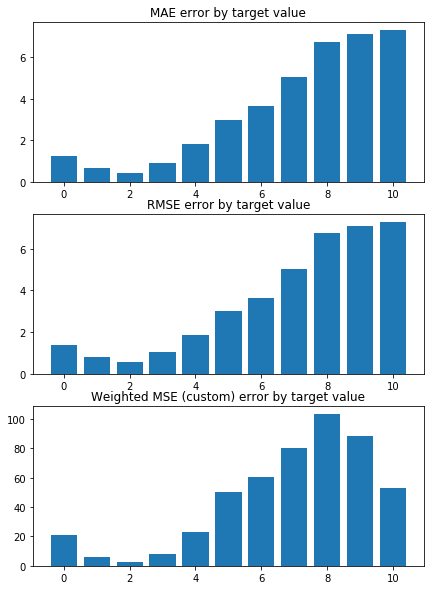

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0599622173097019 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1447972640471469 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


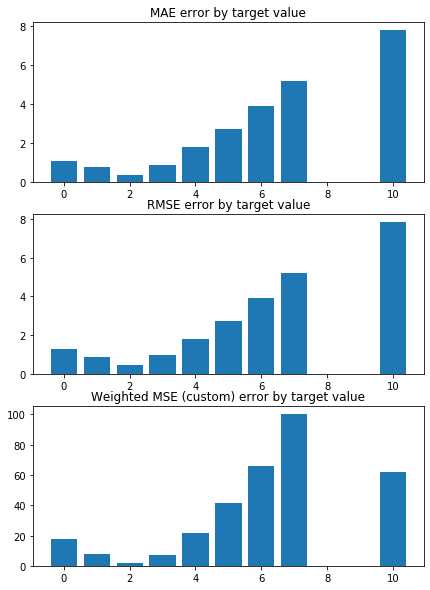

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 2.3449518921451684 

Mean squared error on Test: 1.14 
 MSE mean test:  2.3482512064600933 

Root of MSE on Test: 1.07 
 1.5324004719589763 

Variance score on Test: 0.07 
 r2_test: 0.20758442257925278 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 2.34
MSE_test 2.35
MAE_train 1.05
MAE_test 1.01
r2_test 0.21
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.378421 -0.341771  0.108239 -0.058028  0.017525
1 -0.391944 -0.331273  0.101348 -0.062490  0.020261
2 -0.382807 -0.343603  0.089394 -0.061445  0.024099
3 -0.386137 -0.336851  0.115340 -0.060574  0.029215
4 -0.379328 -0.341942  0.108221 -0.062802  0.025450
5 -0.378475 -0.339703  0.120964 -0.052469  0.023794
6 -0.389081 -0.332863  0.115824 -0.056353  0.016395
7 -0.382799 -0.335343  0.119621 -0.052802  0.021140
8 -0.382700 -0.342625  0.110953 -0.061517  0.018365
9 -0.382250 -0.344089  0.118557 -0.065238  0.012076
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


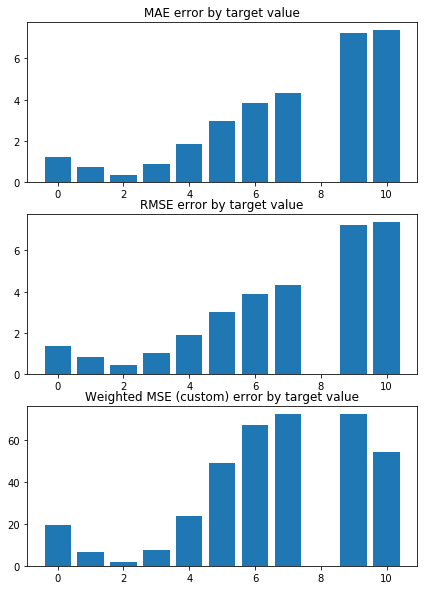

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.055911604530185 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1469427212189998 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


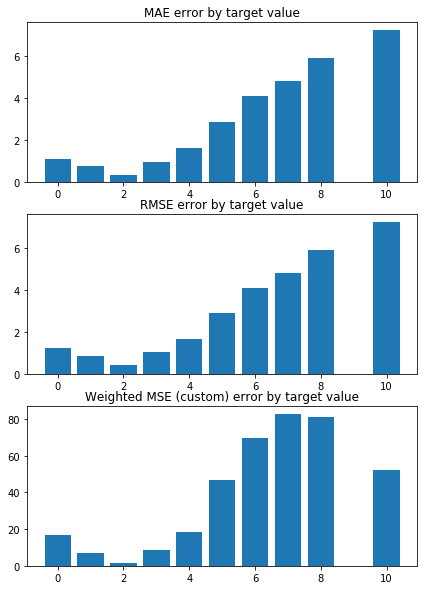

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0501120700745352 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1446082574379586 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


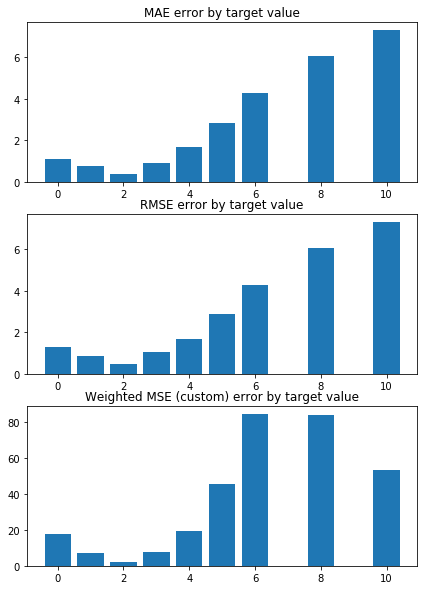

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1571648223946647 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1284068469193025 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


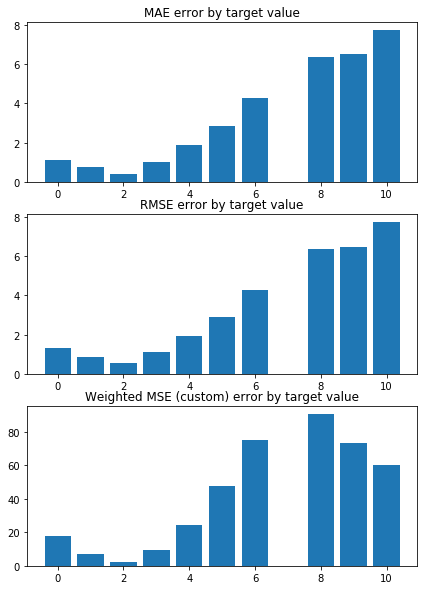

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1620640918051193 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1339439838164596 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


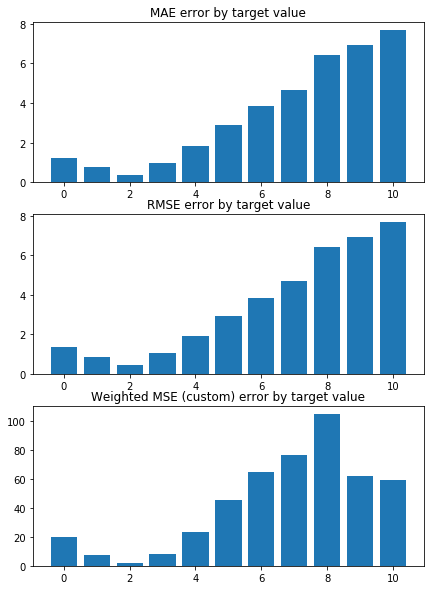

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1649864955837348 


 TRAIN PREDICTION Error
weighted_mse_train: 1.13085450074869 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


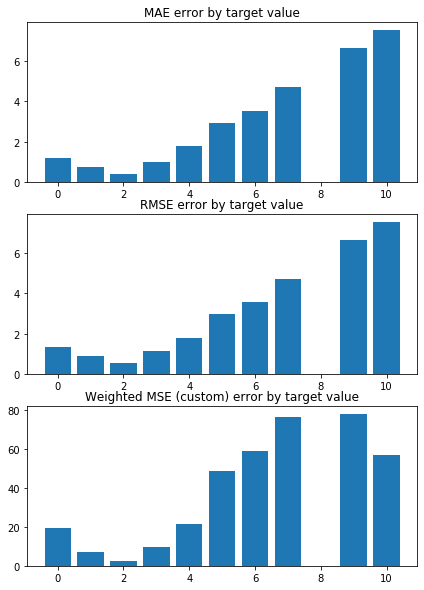

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0788541532822924 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1419407506737755 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


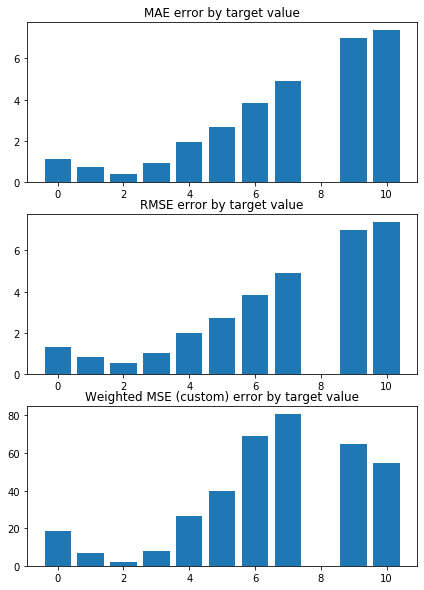

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2319095683509664 


 TRAIN PREDICTION Error
weighted_mse_train: 1.126108924052916 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


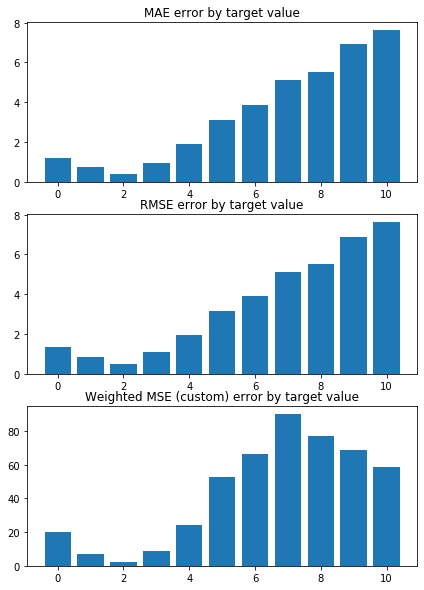

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2586819388593913 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1188259920704515 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


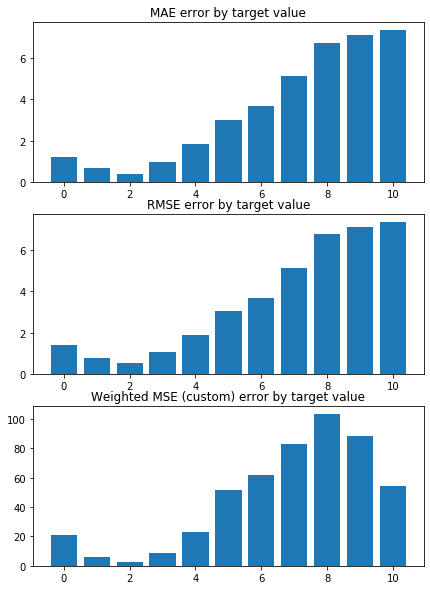

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0611934477449283 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1428828145393182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


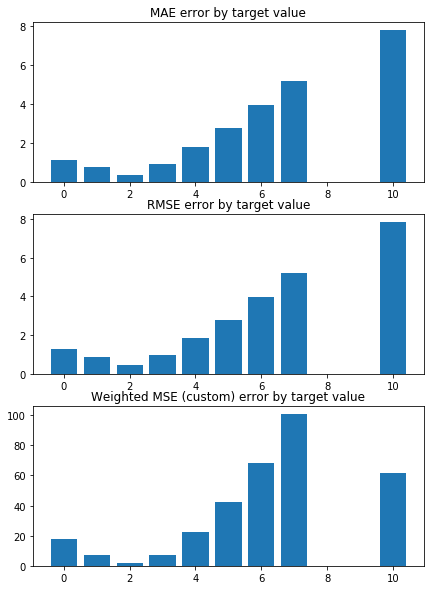

Weighted Mean squared error on Train: 1.13 
 MSE mean train: 2.360159513474842 

Mean squared error on Test: 1.14 
 MSE mean test:  2.363055266049354 

Root of MSE on Test: 1.07 
 1.5372232323411437 

Variance score on Test: 0.07 
 r2_test: 0.20252443730910835 

wMSE_train 1.13
wMSE_test 1.14
MSE_train 2.36
MSE_test 2.36
MAE_train 1.05
MAE_test 1.02
r2_test 0.2
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.334641 -0.309377  0.106318 -0.023427  0.021856
1 -0.342885 -0.302619  0.100960 -0.027198  0.024146
2 -0.338669 -0.310712  0.089969 -0.025970  0.027454
3 -0.341111 -0.306772  0.112918 -0.025516  0.031886
4 -0.336143 -0.309634  0.106578 -0.027669  0.028646
5 -0.335269 -0.308543  0.117259 -0.018856  0.027126
6 -0.341997 -0.304090  0.112951 -0.022035  0.021033
7 -0.338136 -0.305495  0.116059 -0.019611  0.025146
8 -0.338881 -0.310386  0.109159 -0.026172  0.022783
9 -0.338506 -0.311531  0.115454 -0.029710  0.017081
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


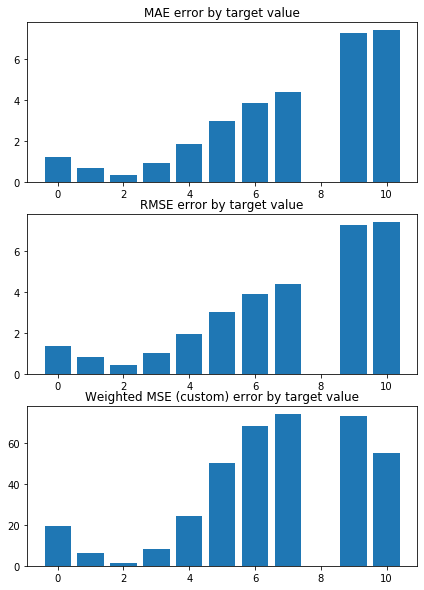

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.061728269654305 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1512924883318263 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


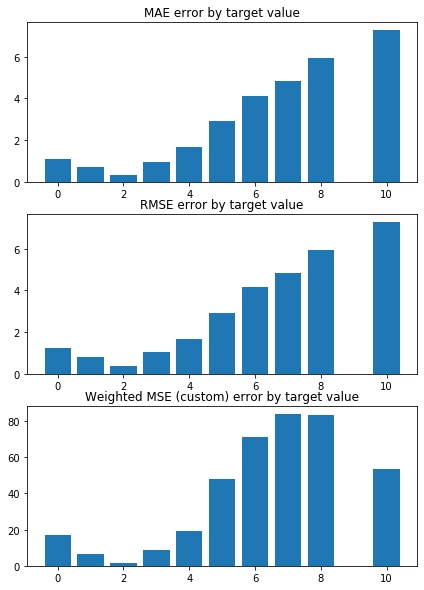

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0537305637511827 


 TRAIN PREDICTION Error
weighted_mse_train: 1.148871521392573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


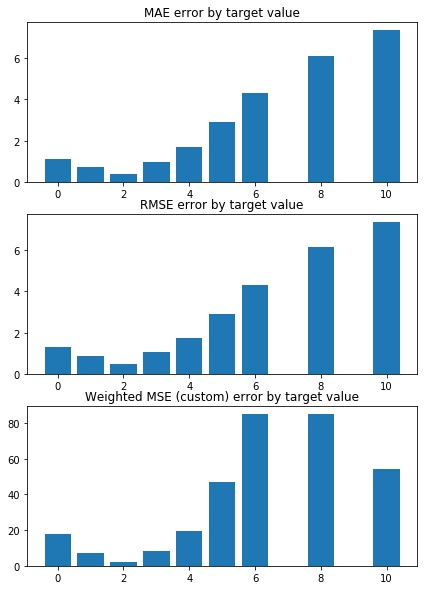

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1596697722352227 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1320263774893329 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


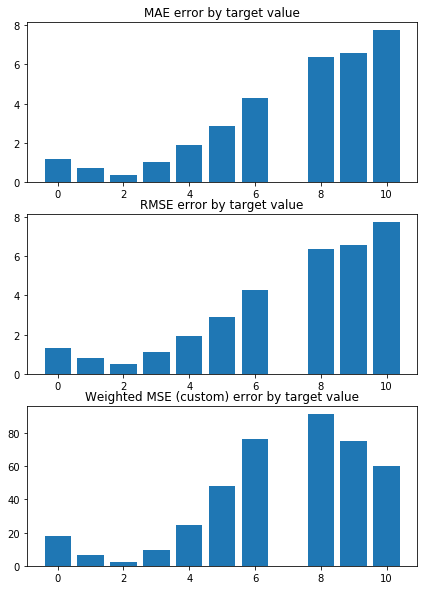

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1680983271468695 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1375791922567673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


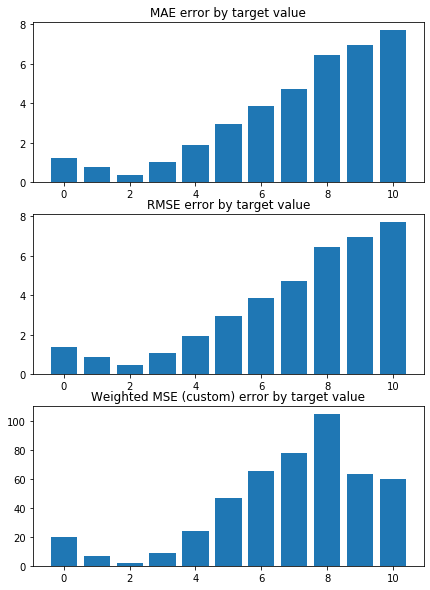

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1642452187478467 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1349892330838591 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


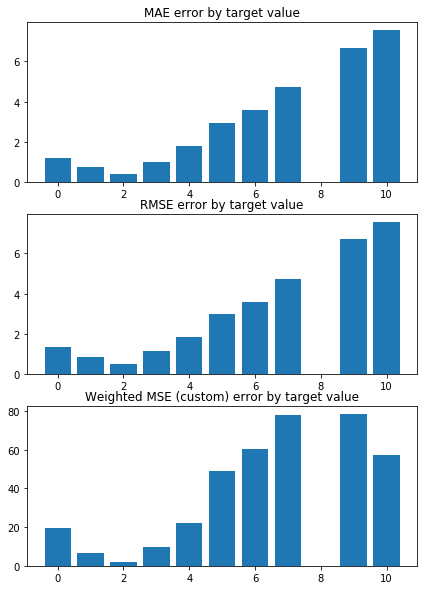

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.080753583519723 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1461680852121843 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


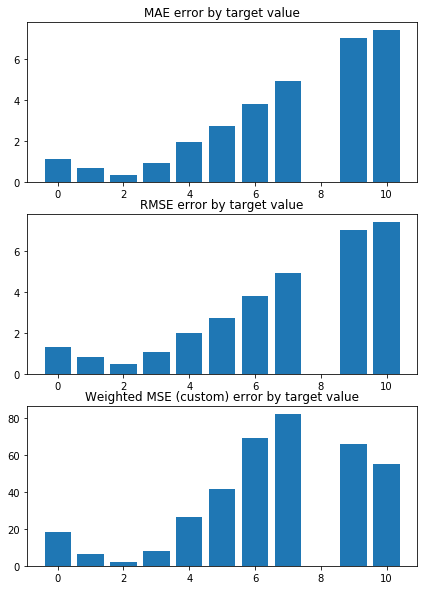

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2374428645605449 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1298436954864668 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


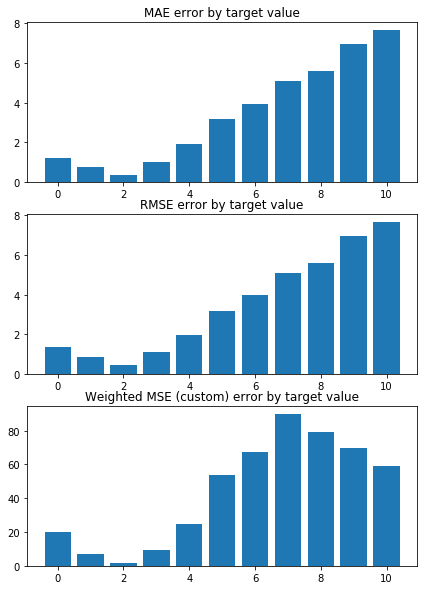

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.260491019009559 


 TRAIN PREDICTION Error
weighted_mse_train: 1.122758546354206 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


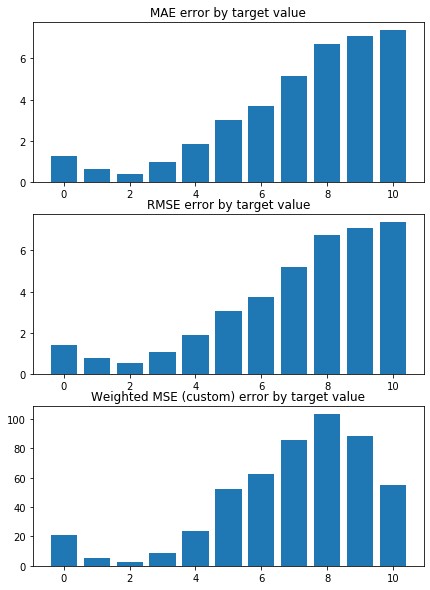

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0671003763197595 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1463285056710824 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


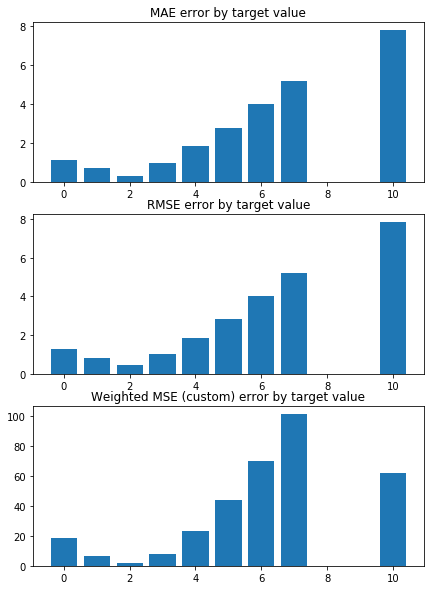

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 2.377379610146188 

Mean squared error on Test: 1.14 
 MSE mean test:  2.3800114017909277 

Root of MSE on Test: 1.07 
 1.5427285573913927 

Variance score on Test: 0.07 
 r2_test: 0.19672031404047557 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 2.38
MSE_test 2.38
MAE_train 1.06
MAE_test 1.02
r2_test 0.2
       CTCF     Chriz    Su(Hw)   H3K27ac  H3K27me3
0 -0.302623 -0.283336  0.102418  0.024554 -0.002515
1 -0.308309 -0.278150  0.098099  0.026551 -0.005817
2 -0.306289 -0.284419  0.087962  0.029370 -0.004480
3 -0.308517 -0.281938  0.108601  0.033378 -0.004233
4 -0.304394 -0.283716  0.102867  0.030490 -0.006282
5 -0.303658 -0.283230  0.112020  0.029091  0.001442
6 -0.308439 -0.279733  0.108332  0.023935 -0.001339
7 -0.305761 -0.280755  0.111002  0.027550  0.000498
8 -0.306775 -0.284477  0.105273  0.025516 -0.004796
9 -0.306345 -0.285417  0.110648  0.020314 -0.008075
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


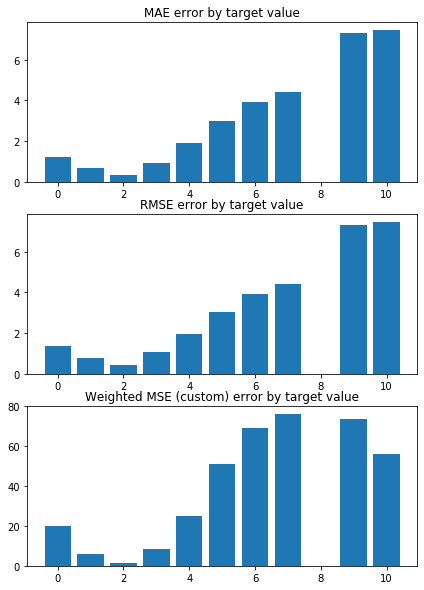

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0709815819171211 


 TRAIN PREDICTION Error
weighted_mse_train: 1.158069049248882 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


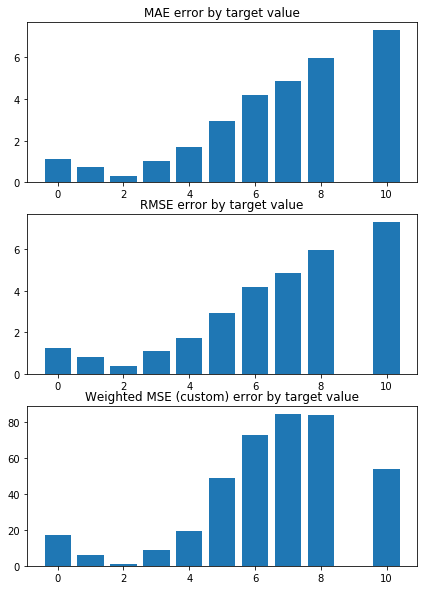

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0601551752884664 


 TRAIN PREDICTION Error
weighted_mse_train: 1.15558400943572 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


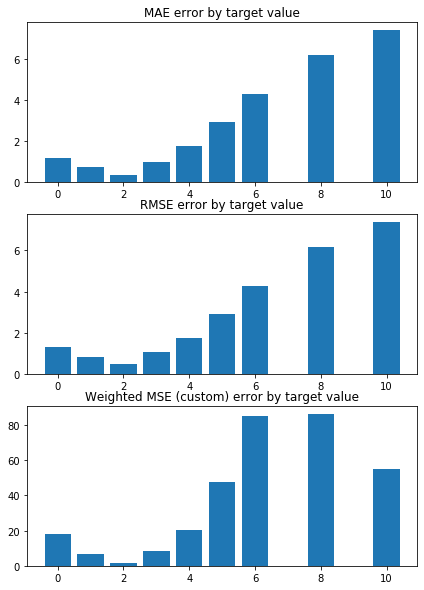

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.164474687181244 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1382314303319634 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


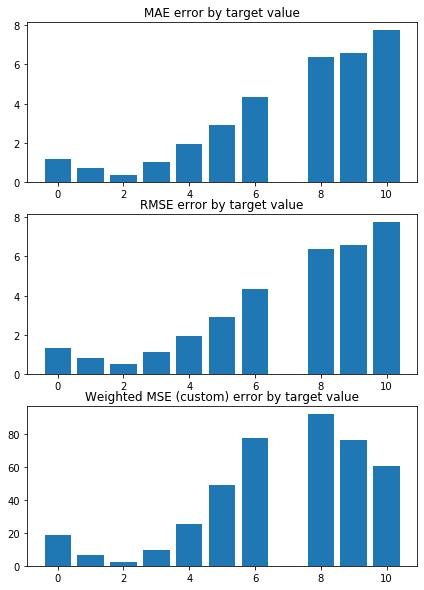

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1761879075109474 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437669408426656 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


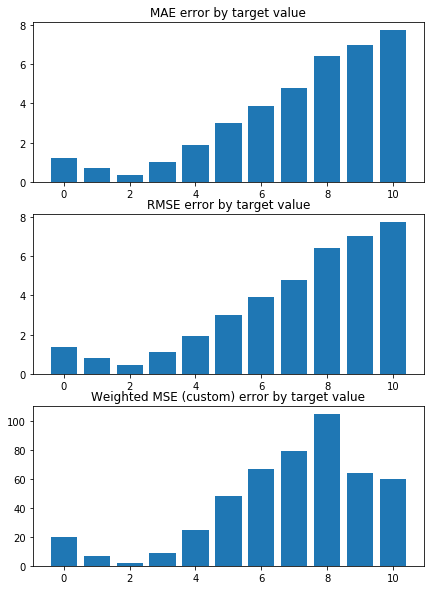

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1664221409053697 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1415898678811767 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


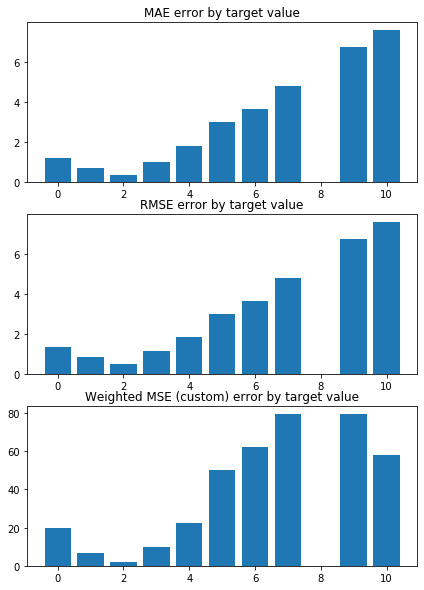

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0857087683453182 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1528815836966828 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


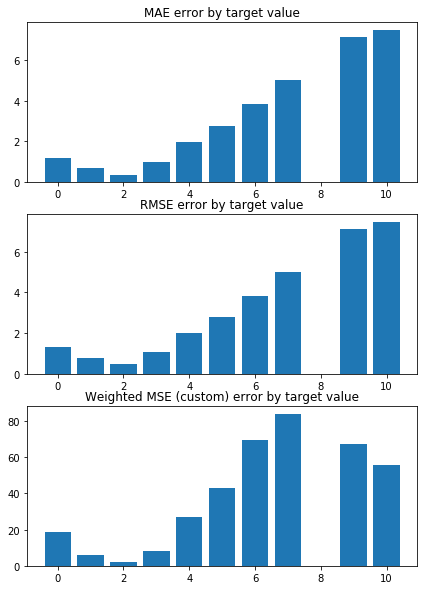

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2447235472539562 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1361539140808117 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


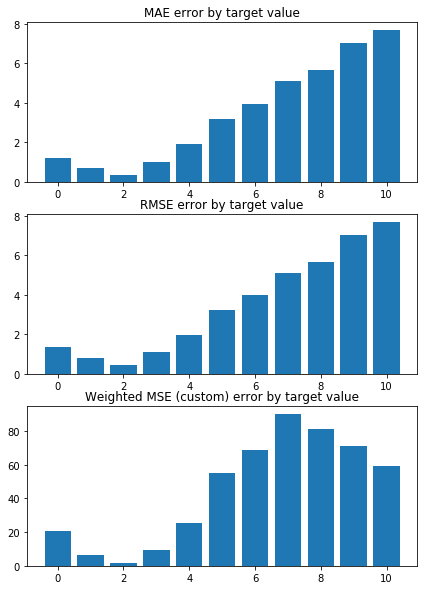

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2649031584606634 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1292402230008671 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


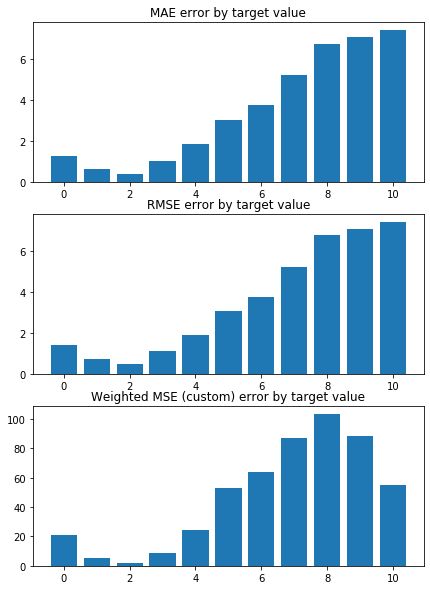

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0753105033844235 


 TRAIN PREDICTION Error
weighted_mse_train: 1.152439138100695 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


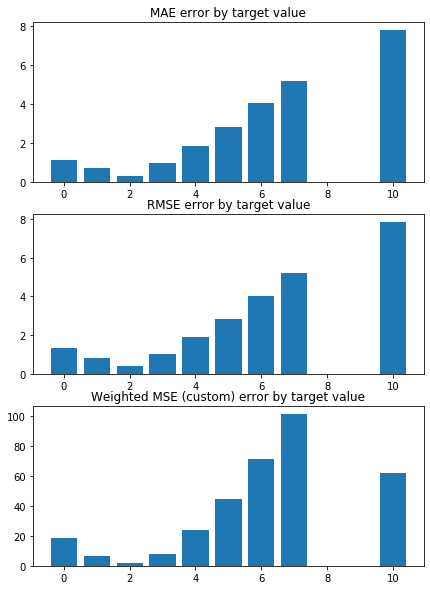

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.395021667568844 

Mean squared error on Test: 1.15 
 MSE mean test:  2.397461224548581 

Root of MSE on Test: 1.07 
 1.5483737354232605 

Variance score on Test: 0.07 
 r2_test: 0.19074389037797398 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.4
MSE_test 2.4
MAE_train 1.06
MAE_test 1.03
r2_test 0.19
       CTCF     Chriz    Su(Hw)   H3K27ac  H3K27me3
0 -0.277475 -0.261934  0.097937  0.026170  0.010828
1 -0.281649 -0.257597  0.094360  0.027948  0.007859
2 -0.280833 -0.262862  0.084969  0.030357  0.009266
3 -0.283012 -0.261281  0.103762  0.034071  0.009406
4 -0.279382 -0.262416  0.098516  0.031439  0.007465
5 -0.278787 -0.262297  0.106499  0.030145  0.014364
6 -0.282383 -0.259294  0.103286  0.025688  0.011830
7 -0.280406 -0.260140  0.105648  0.028906  0.013331
8 -0.281522 -0.263171  0.100755  0.027139  0.008868
9 -0.281019 -0.263953  0.105443  0.022360  0.005844
KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [ 

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


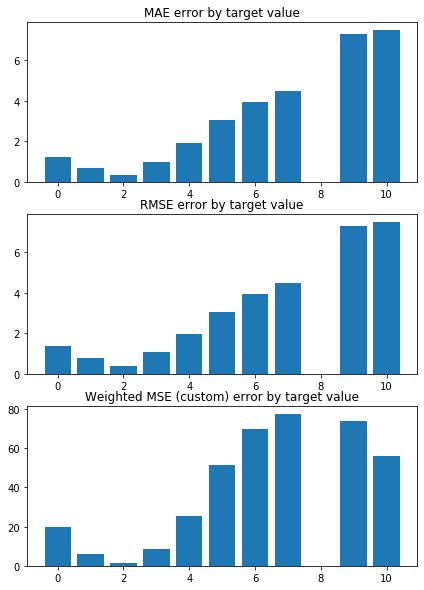

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0819220952636963 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1660791766924534 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


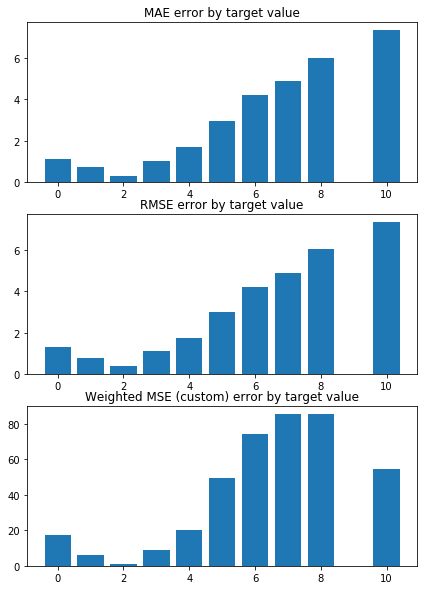

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0680351029534307 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1635570715646681 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


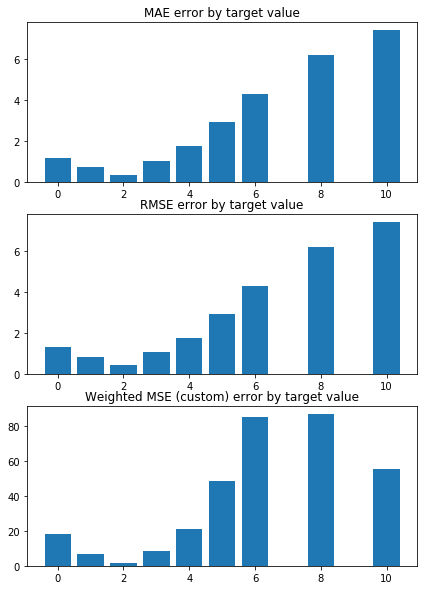

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1705015096742948 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1458190037463394 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


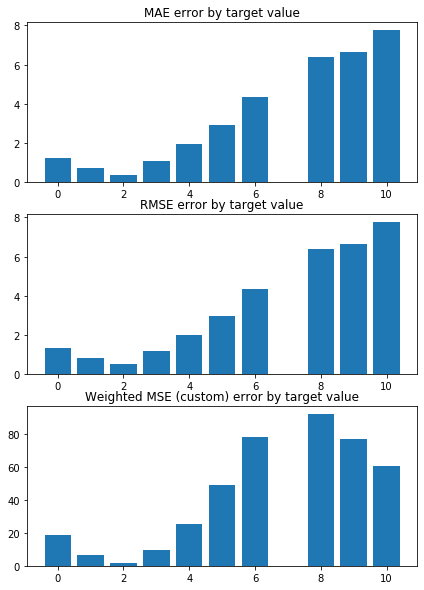

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1852745662220379 


 TRAIN PREDICTION Error
weighted_mse_train: 1.151305086250427 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


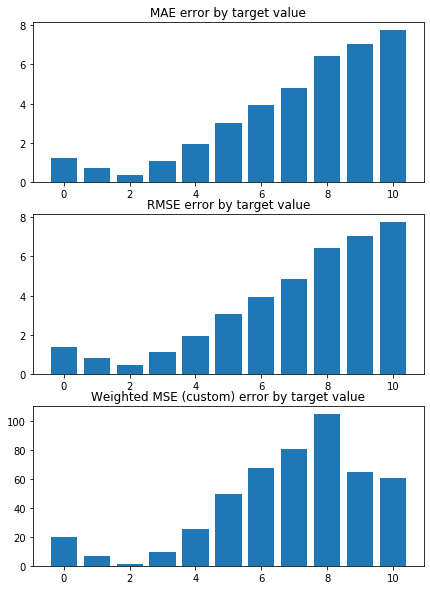

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1703032106479347 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1494995568572106 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


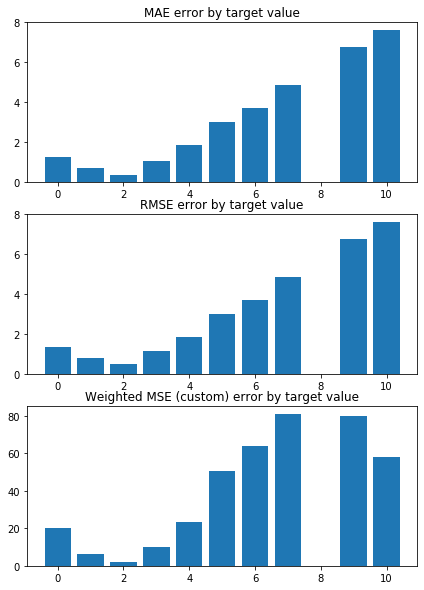

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.092348454292461 


 TRAIN PREDICTION Error
weighted_mse_train: 1.160891262316899 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


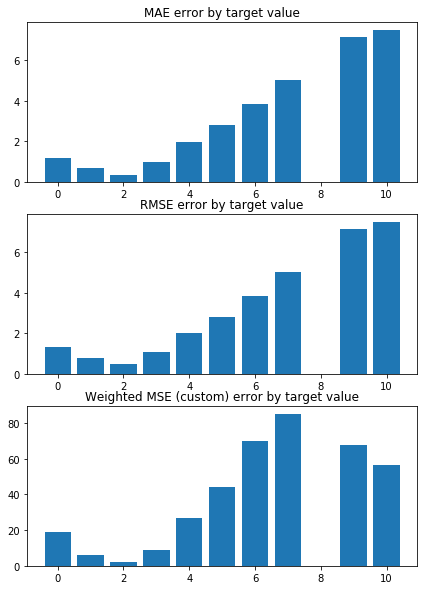

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.252920910403442 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1438348342930134 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


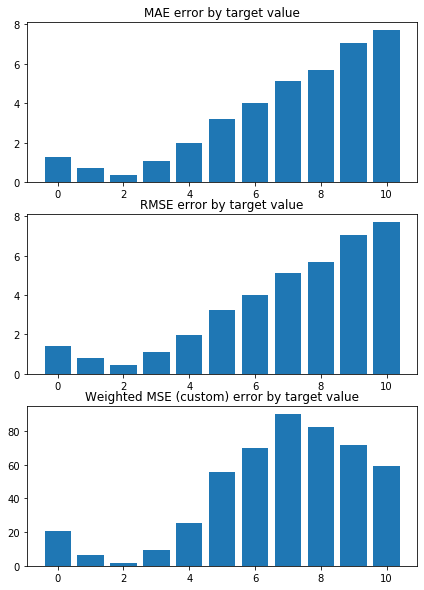

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2707380963701593 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1370639561569766 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


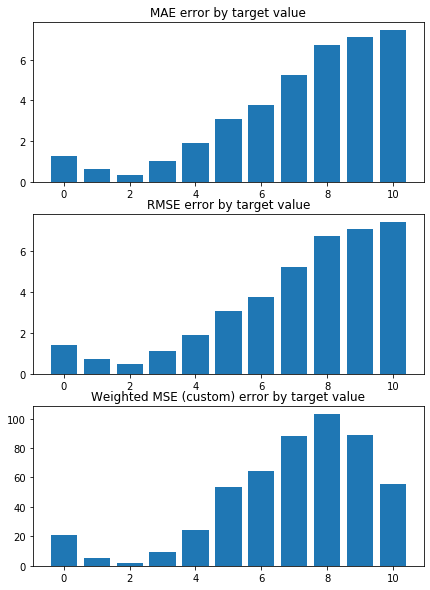

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.084693003817902 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1599596148825213 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


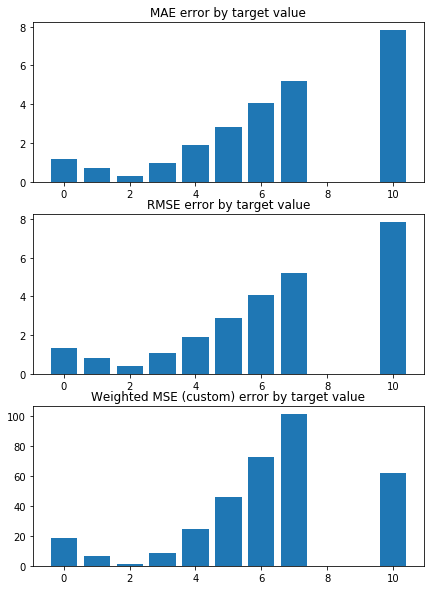

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.4124585748179284 

Mean squared error on Test: 1.15 
 MSE mean test:  2.4147495991259165 

Root of MSE on Test: 1.07 
 1.553946459542901 

Variance score on Test: 0.07 
 r2_test: 0.18482130935571509 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.41
MSE_test 2.41
MAE_train 1.07
MAE_test 1.04
r2_test 0.18
       CTCF     Chriz    Su(Hw)   H3K27ac  H3K27me3
0 -0.256892 -0.243929  0.093416  0.027070  0.019640
1 -0.260072 -0.240125  0.090391  0.028675  0.016922
2 -0.259992 -0.244752  0.081650  0.030745  0.018370
3 -0.262162 -0.243776  0.098927  0.034238  0.018456
4 -0.258866 -0.244491  0.094083  0.031807  0.016618
5 -0.258390 -0.244610  0.101147  0.030601  0.022867
6 -0.261187 -0.241905  0.098308  0.026684  0.020500
7 -0.259672 -0.242655  0.100435  0.029577  0.021793
8 -0.260826 -0.245231  0.096172  0.028032  0.017918
9 -0.260258 -0.245886  0.100326  0.023612  0.015125
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


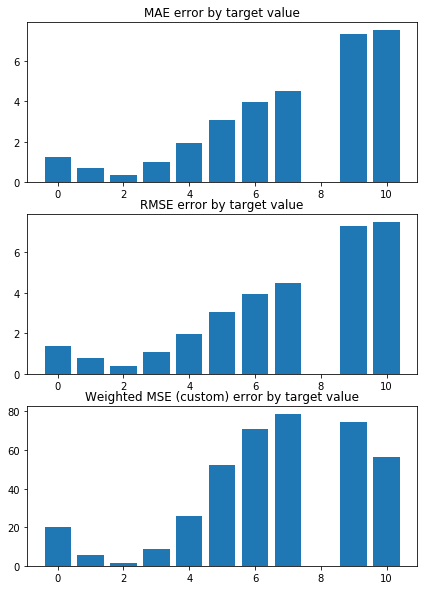

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0936482823670663 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1746961781157628 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


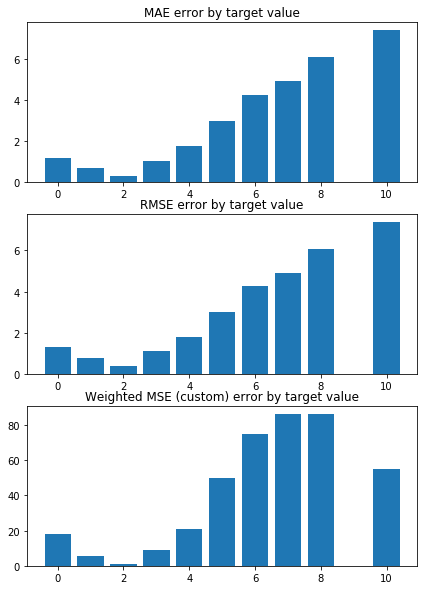

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0766566468779848 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1721621278182741 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


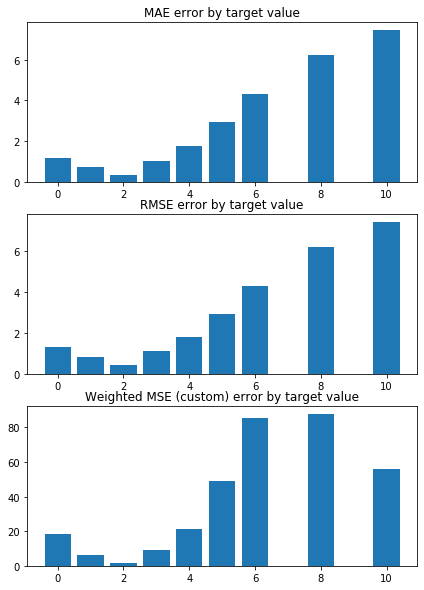

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1771816054580493 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1541397077111457 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


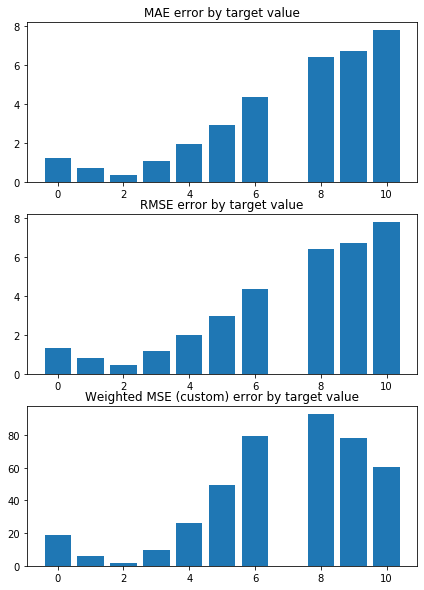

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1948017563043491 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1595490759760751 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


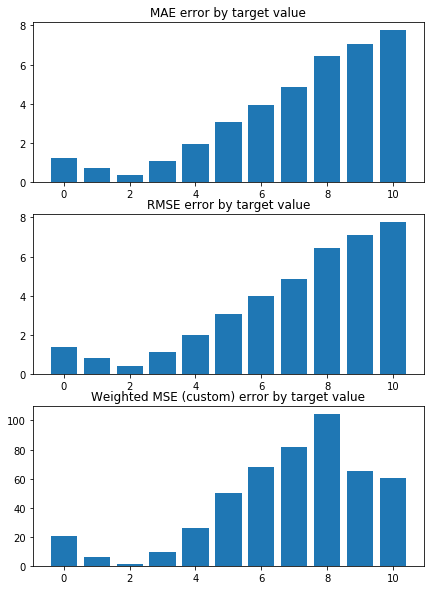

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1752127168450466 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1580905818154126 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


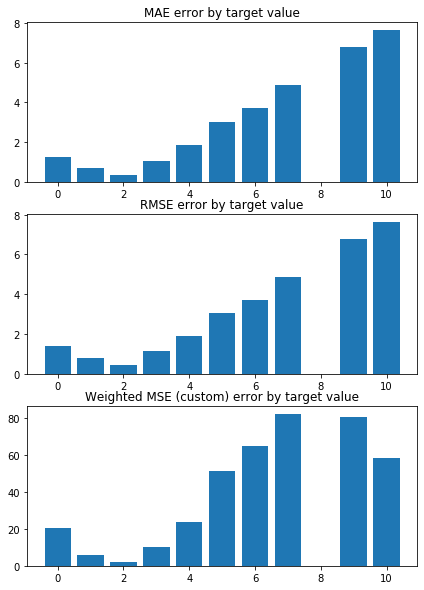

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0999309003597133 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1695603172526434 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


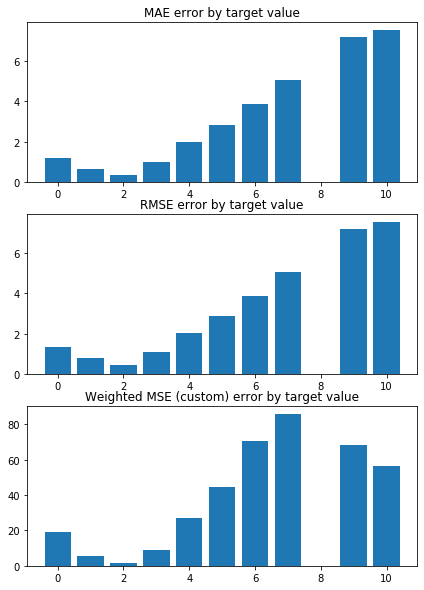

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2615743502659778 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1522342998667172 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


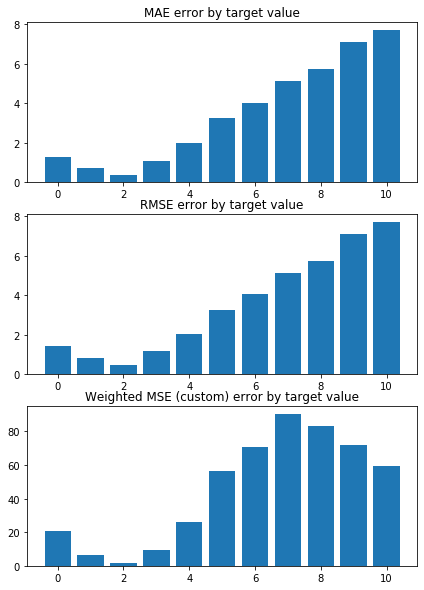

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2773635330334656 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1455831088443686 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


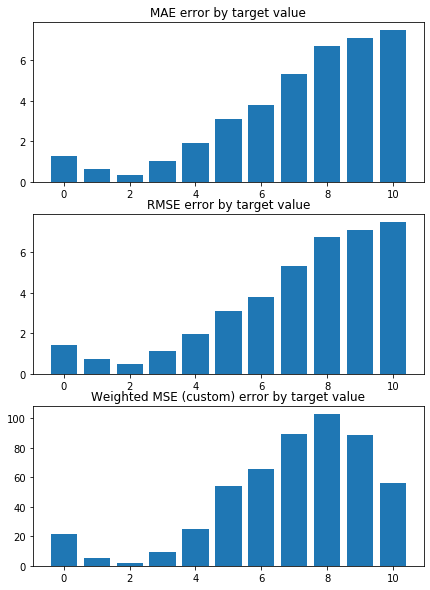

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0946346728515979 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1682177474334987 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


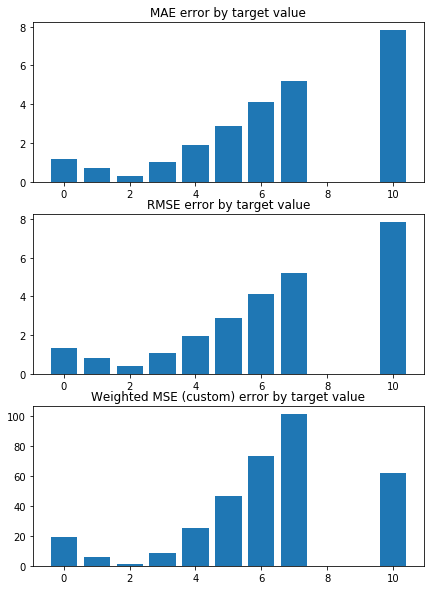

Weighted Mean squared error on Train: 1.16 
 MSE mean train: 2.429407411954835 

Mean squared error on Test: 1.16 
 MSE mean test:  2.4315790410837956 

Root of MSE on Test: 1.08 
 1.5593521222237765 

Variance score on Test: 0.07 
 r2_test: 0.17905533480897357 

wMSE_train 1.16
wMSE_test 1.16
MSE_train 2.43
MSE_test 2.43
MAE_train 1.08
MAE_test 1.05
r2_test 0.18
       CTCF     Chriz    Su(Hw)   H3K27ac  H3K27me3
0 -0.239574 -0.228496  0.089072  0.027492  0.025583
1 -0.242057 -0.225061  0.086470  0.028956  0.023063
2 -0.242456 -0.229241  0.078297  0.030747  0.024531
3 -0.244626 -0.228694  0.094304  0.034062  0.024593
4 -0.241577 -0.229118  0.089798  0.031793  0.022849
5 -0.241197 -0.229397  0.096122  0.030664  0.028570
6 -0.243421 -0.226894  0.093585  0.027175  0.026327
7 -0.242231 -0.227586  0.095526  0.029800  0.027482
8 -0.243393 -0.229840  0.091754  0.028438  0.024047
9 -0.242773 -0.230391  0.095481  0.024326  0.021456
KFold(n_splits=10, random_state=16, shuffle=True)
train_index=

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


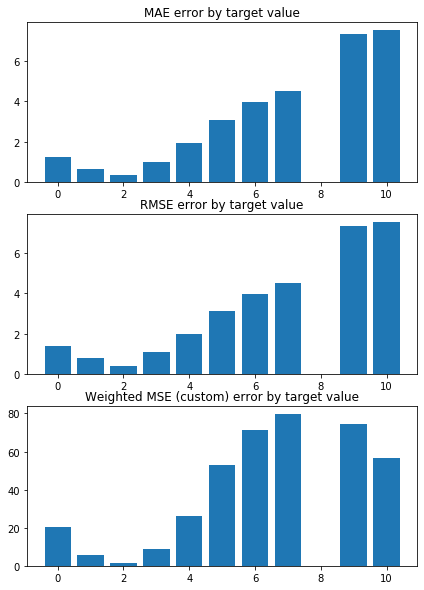

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1056554079953833 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1835605378651364 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


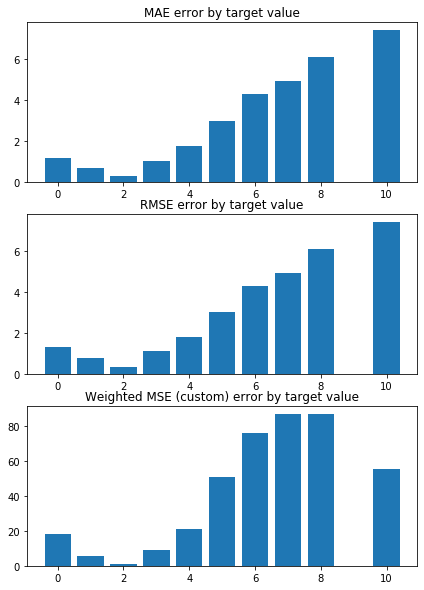

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0856099754936175 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1810362253855837 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


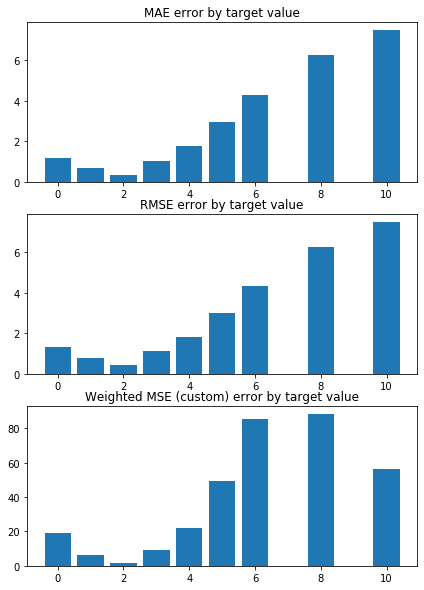

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1841847071950367 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1628112033782578 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


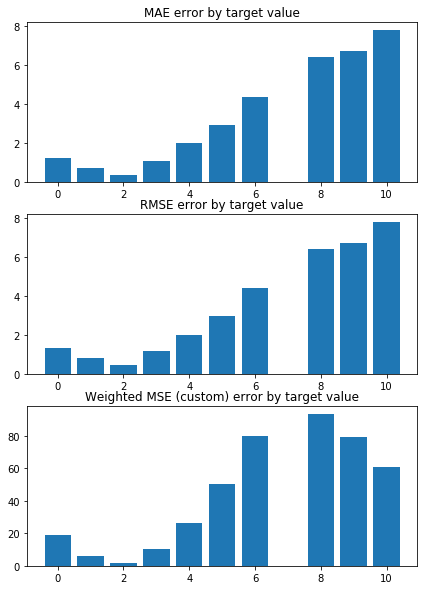

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.204452198484521 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1681221655653458 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


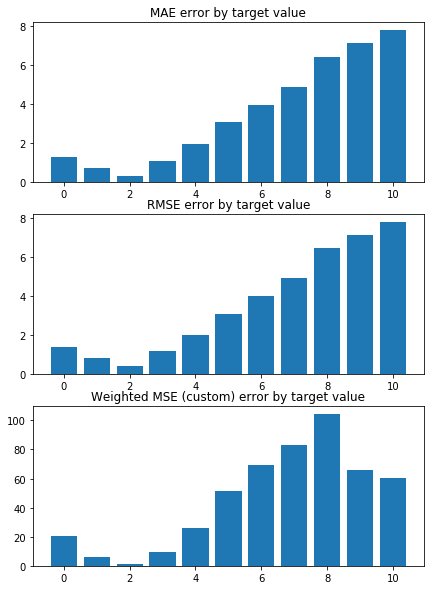

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1807393497891607 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1669927692291673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


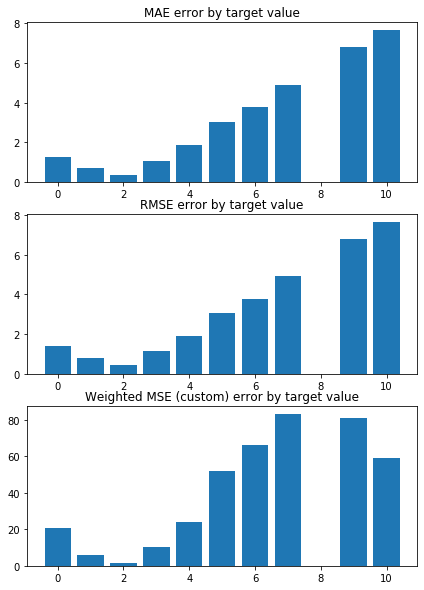

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1080162293044309 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1785175528781195 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


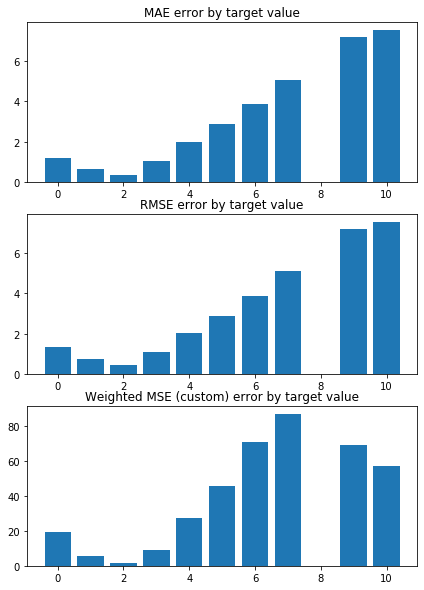

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.270405675186718 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1609688607541453 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


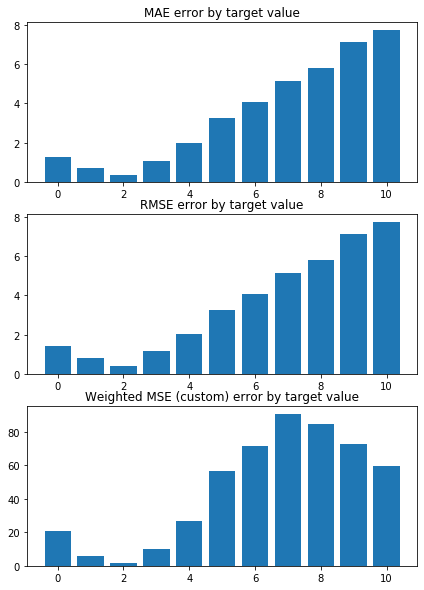

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2844071058020312 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1544199081897217 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


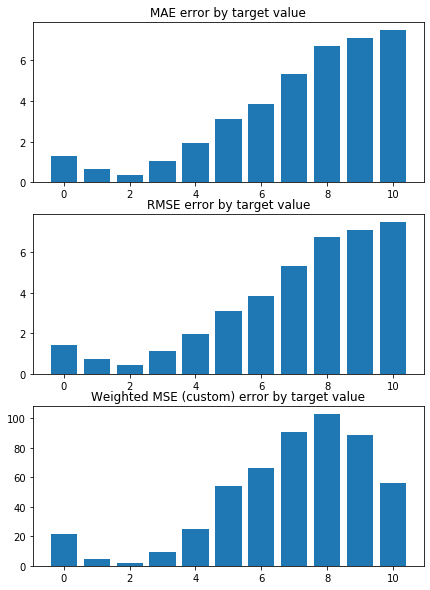

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1047769091705595 


 TRAIN PREDICTION Error
weighted_mse_train: 1.176821608061325 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


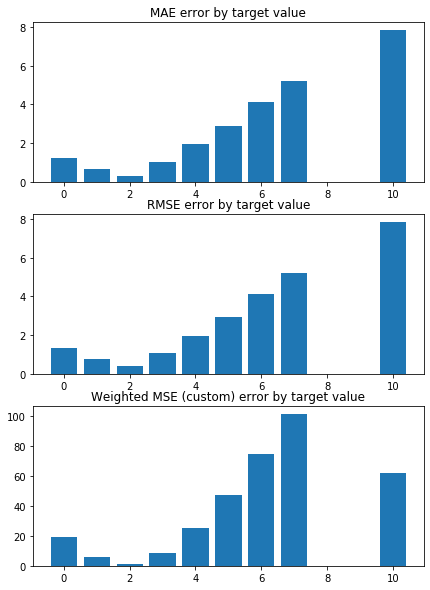

Weighted Mean squared error on Train: 1.17 
 MSE mean train: 2.4457345135717907 

Mean squared error on Test: 1.17 
 MSE mean test:  2.4478073430850746 

Root of MSE on Test: 1.08 
 1.5645470089086728 

Variance score on Test: 0.07 
 r2_test: 0.17349511741789522 

wMSE_train 1.17
wMSE_test 1.17
MSE_train 2.45
MSE_test 2.45
MAE_train 1.08
MAE_test 1.05
r2_test 0.17
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.224712 -0.215071  0.084986  0.029631  0.027593
1 -0.226683 -0.211910  0.082717  0.027272  0.028939
2 -0.227408 -0.215756  0.075044  0.028748  0.030498
3 -0.229574 -0.215524  0.089968  0.028800  0.033664
4 -0.226720 -0.215737  0.085752  0.027142  0.031531
5 -0.226417 -0.216127  0.091469  0.032426  0.030468
6 -0.228212 -0.213772  0.089178  0.030279  0.027326
7 -0.227261 -0.214425  0.090968  0.031338  0.029727
8 -0.228416 -0.216439  0.087589  0.028245  0.028518
9 -0.227757 -0.216904  0.090967  0.025831  0.024673
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


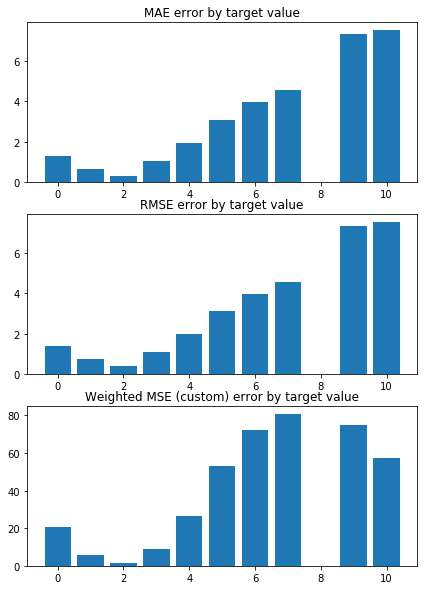

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.117647327128042 


 TRAIN PREDICTION Error
weighted_mse_train: 1.192455265635491 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


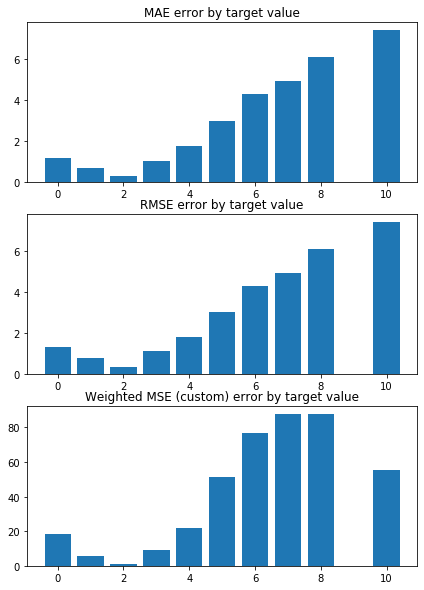

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.094647563151018 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1899587670395089 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


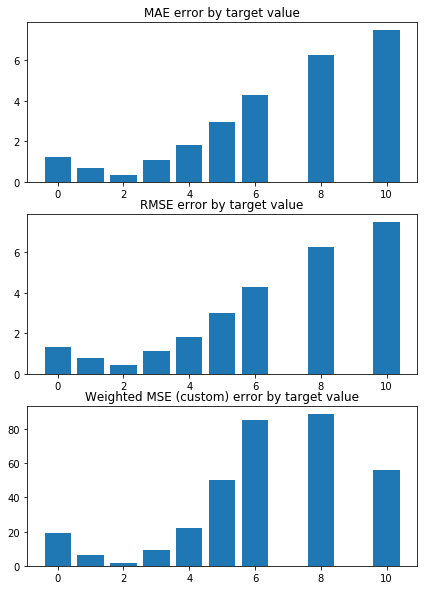

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1913074985227352 


 TRAIN PREDICTION Error
weighted_mse_train: 1.17159662679797 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


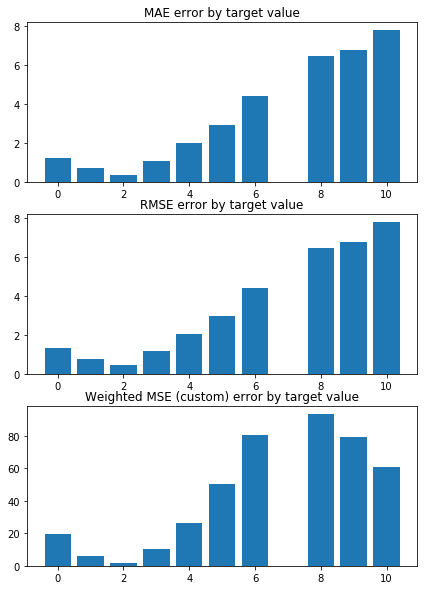

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2140367338724645 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1767926377144764 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


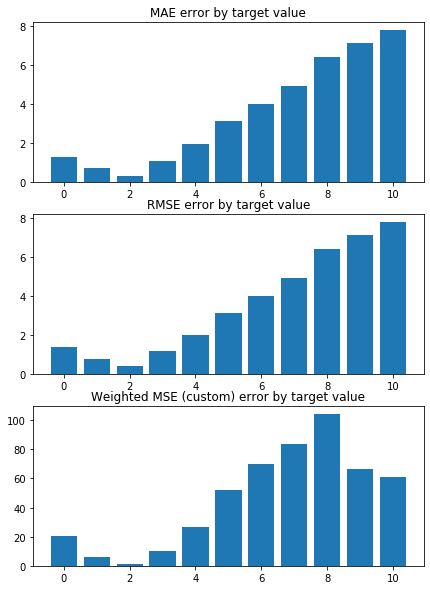

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1866187399726311 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1759770900699962 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


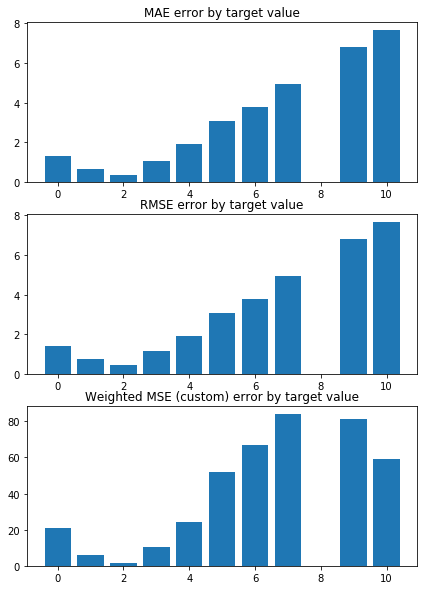

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1163290774710106 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1875357255795278 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


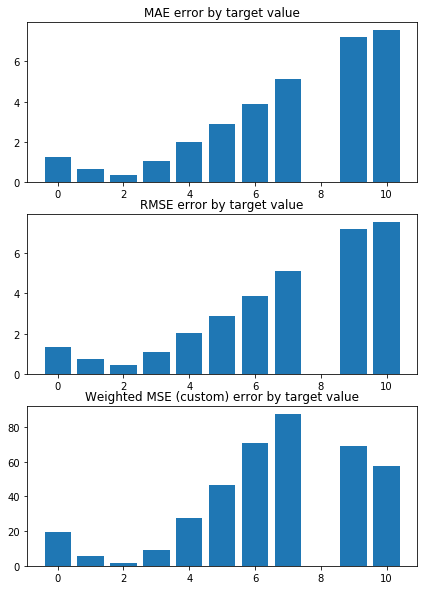

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2792392650785656 


 TRAIN PREDICTION Error
weighted_mse_train: 1.169801903554195 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


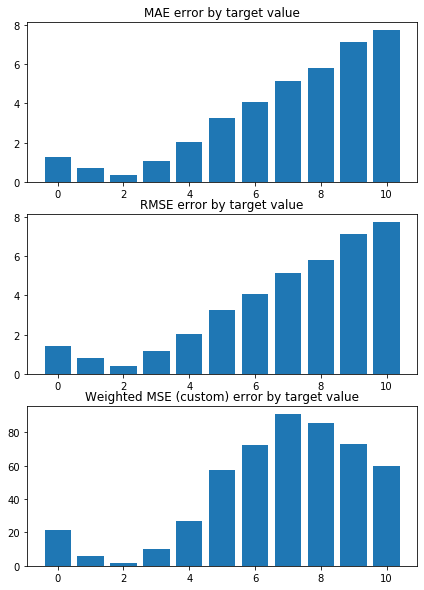

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2916366673174093 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1633421930582535 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


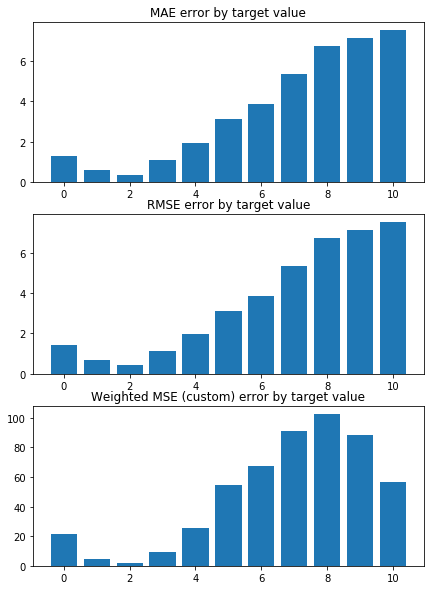

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.114901129937847 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1855308664312894 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


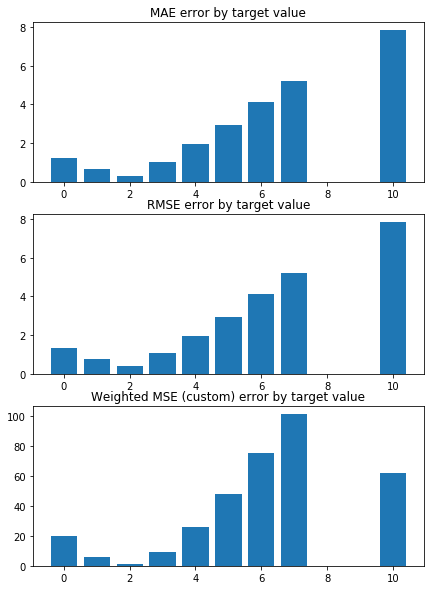

Weighted Mean squared error on Train: 1.18 
 MSE mean train: 2.4613804588705803 

Mean squared error on Test: 1.18 
 MSE mean test:  2.4633696775232496 

Root of MSE on Test: 1.09 
 1.5695125604859776 

Variance score on Test: 0.07 
 r2_test: 0.16816308350082584 

wMSE_train 1.18
wMSE_test 1.18
MSE_train 2.46
MSE_test 2.46
MAE_train 1.09
MAE_test 1.06
r2_test 0.17
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.211765 -0.203253  0.081181  0.032388  0.027476
1 -0.213348 -0.200307  0.079179  0.030164  0.028720
2 -0.214300 -0.203890  0.071949  0.031638  0.030087
3 -0.216457 -0.203896  0.085937  0.031689  0.033124
4 -0.213763 -0.203952  0.081972  0.030109  0.031107
5 -0.213521 -0.204420  0.087184  0.035023  0.030103
6 -0.214985 -0.202181  0.085098  0.032955  0.027247
7 -0.214217 -0.202806  0.086760  0.033944  0.029457
8 -0.215357 -0.204633  0.083704  0.031125  0.028378
9 -0.214668 -0.205026  0.086790  0.028867  0.024767
KFold(n_splits=10, random_state=16, shuffle=True)
train_index

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


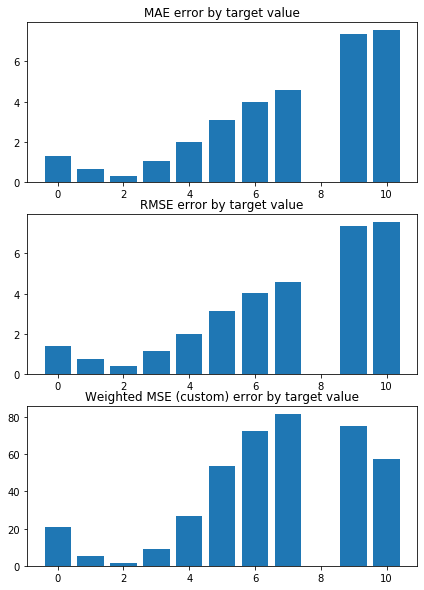

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1294465709990549 


 TRAIN PREDICTION Error
weighted_mse_train: 1.201246069475201 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


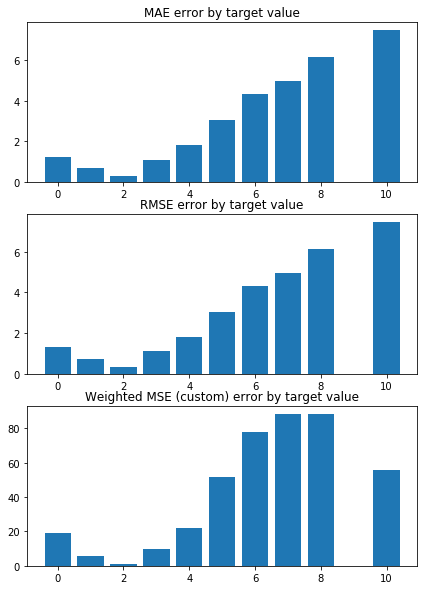

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1036158006939307 


 TRAIN PREDICTION Error
weighted_mse_train: 1.198792137196215 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


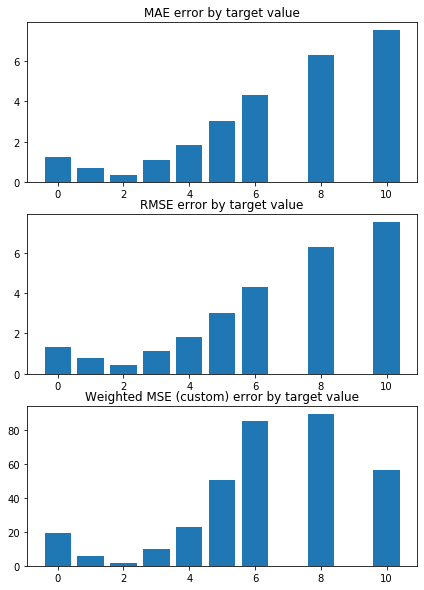

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1984206463720737 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1803451827103517 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


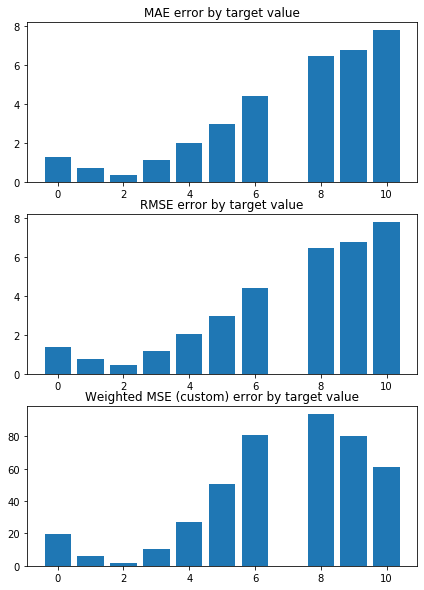

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2234405220406919 


 TRAIN PREDICTION Error
weighted_mse_train: 1.185414050537405 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


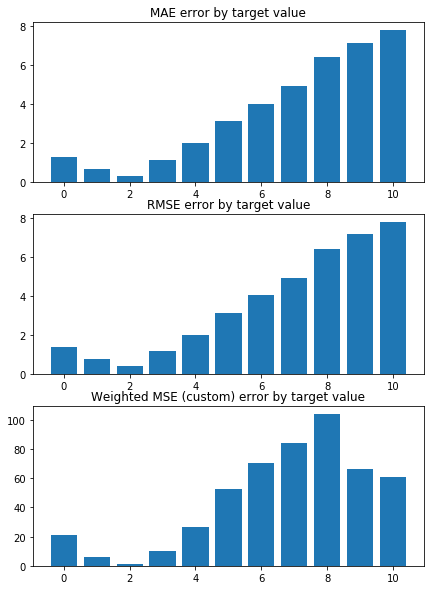

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1926752570708394 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1848983107168414 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


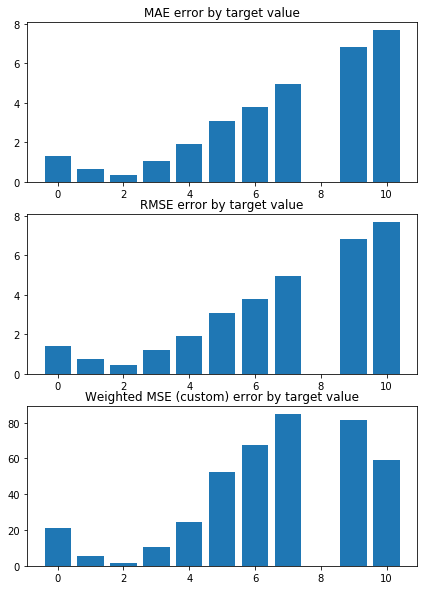

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1246917124478548 


 TRAIN PREDICTION Error
weighted_mse_train: 1.196472249576617 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


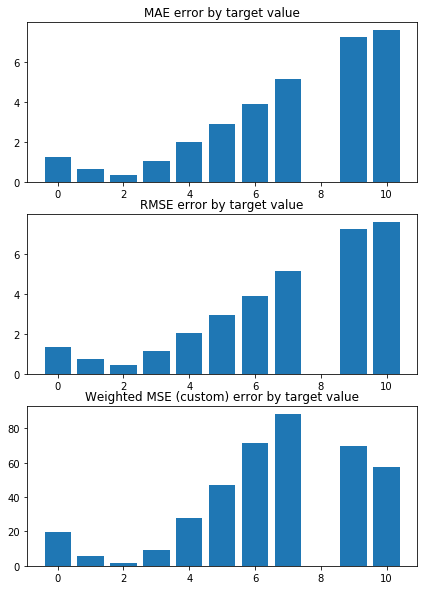

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2879621670442374 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1785836758240151 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


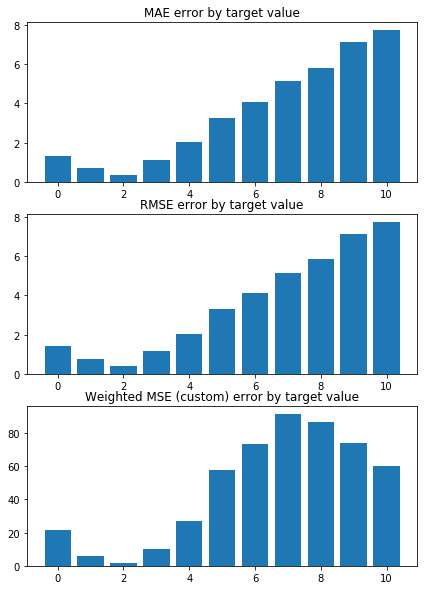

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2989026780229473 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1722034591813122 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


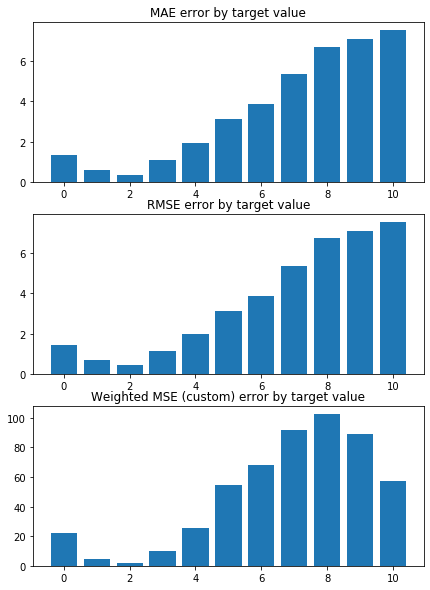

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1248717383375495 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1941941127463211 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


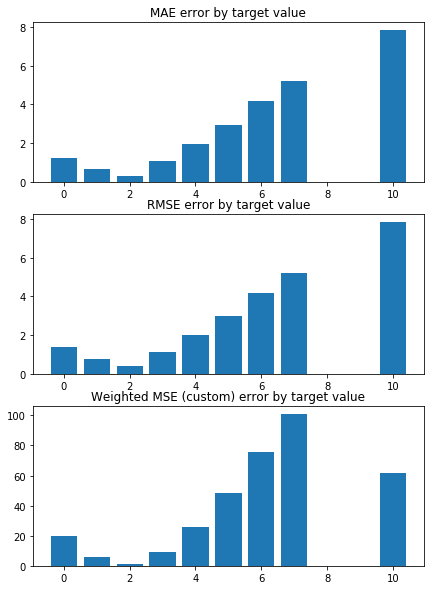

Weighted Mean squared error on Train: 1.19 
 MSE mean train: 2.476326216876743 

Mean squared error on Test: 1.19 
 MSE mean test:  2.478243401382859 

Root of MSE on Test: 1.09 
 1.5742437553895072 

Variance score on Test: 0.07 
 r2_test: 0.1630670936111716 

wMSE_train 1.19
wMSE_test 1.19
MSE_train 2.48
MSE_test 2.48
MAE_train 1.09
MAE_test 1.07
r2_test 0.16
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.200351 -0.192749  0.077652  0.034243  0.027211
1 -0.201632 -0.189978  0.075869  0.032135  0.028368
2 -0.202745 -0.193346  0.069034  0.033598  0.029574
3 -0.204887 -0.193534  0.082203  0.033654  0.032495
4 -0.202330 -0.193471  0.078459  0.032144  0.030580
5 -0.202138 -0.193993  0.083243  0.036740  0.029628
6 -0.203340 -0.191850  0.081330  0.034742  0.027012
7 -0.202715 -0.192454  0.082884  0.035677  0.029057
8 -0.203835 -0.194131  0.080097  0.033083  0.028089
9 -0.203124 -0.194464  0.082936  0.030963  0.024684


,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.348251,0.292803,2.344952,0.032596,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.22420657071510808, 0.2690310214571283, 0.22...",1.137489,0.069893,1.135956,0.008559
1,2.363055,0.291724,2.360160,0.032697,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2177308108476772, 0.26264426971157706, 0.22...",1.136110,0.069919,1.134792,0.008659
2,2.380011,0.290230,2.377380,0.032763,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2107568398073697, 0.25482829828300735, 0.21...",1.139925,0.069431,1.138734,0.008773
3,2.397461,0.288619,2.395022,0.032792,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.20378161829966568, 0.2466403988135425, 0.20...",1.146302,0.068738,1.145200,0.008868
4,2.414750,0.287011,2.412459,0.032792,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.19699290933189295, 0.23849106396875164, 0.2...",1.154027,0.067978,1.152989,0.008939
5,2.431579,0.285459,2.429407,0.032769,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.19046822420889187, 0.23056141083693416, 0.1...",1.162447,0.067216,1.161460,0.008989
6,2.447807,0.283986,2.445735,0.032728,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.18423819859369228, 0.22293419149170302, 0.1...",1.171186,0.066485,1.170239,0.009019
7,2.463370,0.282600,2.461380,0.032674,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.1783109609335769, 0.21564458656795193, 0.18...",1.180009,0.065799,1.179096,0.009034
8,2.478243,0.281301,2.476326,0.032610,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.17268301403486896, 0.20870297099042046, 0.1...",1.188772,0.065162,1.187887,0.009037


In [111]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

alpha_grid = np.arange(1000, 10000, 1000)
# Create linear regression object



model_name = 'LR+L2_grid10000'
n_splits = 10
random_state = 16 
shuffle = True

wmse_test = []
wmse_train = []

results_pd_gr = pd.DataFrame()

for alpha in alpha_grid:
    model = linear_model.Ridge(alpha=alpha)

    lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                    weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                    rmse_test, rmse_train, rmse_test_const, \
                    mae_test,    mae_train,  mae_test_const, \
                    results_pd_gr = train_test_KFold(X, y, 
                                                  model, model_name, results_pd_gr,
                                                  n_splits=n_splits, random_state=random_state, shuffle=shuffle)

    wmse_test.append(np.mean(weighted_mse_test_all))
    wmse_train.append(np.mean(weighted_mse_train_all))

results_pd_gr

In [112]:
results_pd_gr

,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,comments,model,model_name,n_splits,params,r2_test,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std
0,2.348251,0.292803,2.344952,0.032596,-,"Ridge(alpha=1000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.22420657071510808, 0.2690310214571283, 0.22...",1.137489,0.069893,1.135956,0.008559
1,2.363055,0.291724,2.360160,0.032697,-,"Ridge(alpha=2000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2177308108476772, 0.26264426971157706, 0.22...",1.136110,0.069919,1.134792,0.008659
2,2.380011,0.290230,2.377380,0.032763,-,"Ridge(alpha=3000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.2107568398073697, 0.25482829828300735, 0.21...",1.139925,0.069431,1.138734,0.008773
3,2.397461,0.288619,2.395022,0.032792,-,"Ridge(alpha=4000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.20378161829966568, 0.2466403988135425, 0.20...",1.146302,0.068738,1.145200,0.008868
4,2.414750,0.287011,2.412459,0.032792,-,"Ridge(alpha=5000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.19699290933189295, 0.23849106396875164, 0.2...",1.154027,0.067978,1.152989,0.008939
5,2.431579,0.285459,2.429407,0.032769,-,"Ridge(alpha=6000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.19046822420889187, 0.23056141083693416, 0.1...",1.162447,0.067216,1.161460,0.008989
6,2.447807,0.283986,2.445735,0.032728,-,"Ridge(alpha=7000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.18423819859369228, 0.22293419149170302, 0.1...",1.171186,0.066485,1.170239,0.009019
7,2.463370,0.282600,2.461380,0.032674,-,"Ridge(alpha=8000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.1783109609335769, 0.21564458656795193, 0.18...",1.180009,0.065799,1.179096,0.009034
8,2.478243,0.281301,2.476326,0.032610,-,"Ridge(alpha=9000, copy_X=True, fit_intercept=T...",LR+L2_grid10000,10.0,test_params = testtest,"[0.17268301403486896, 0.20870297099042046, 0.1...",1.188772,0.065162,1.187887,0.009037


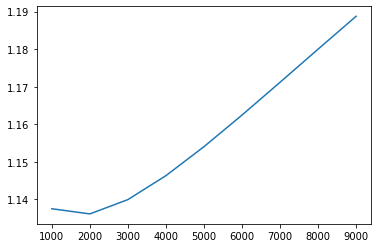

In [113]:
plt.plot(alpha_grid, wmse_test)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1459880795614208 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1374873248872057 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


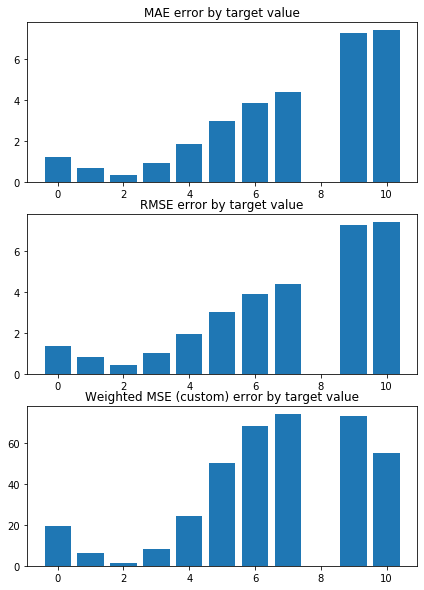

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.061728269654305 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1512924883318263 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


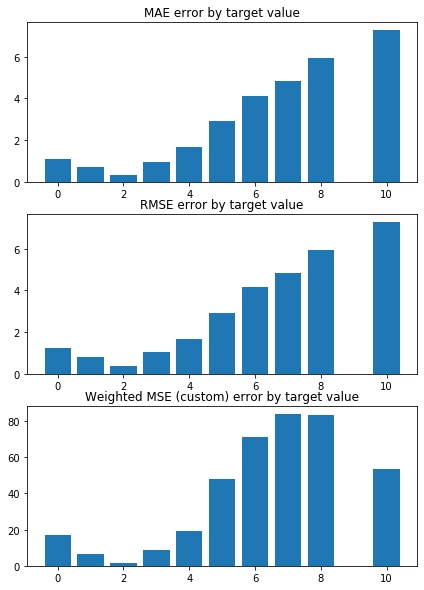

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0537305637511827 


 TRAIN PREDICTION Error
weighted_mse_train: 1.148871521392573 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


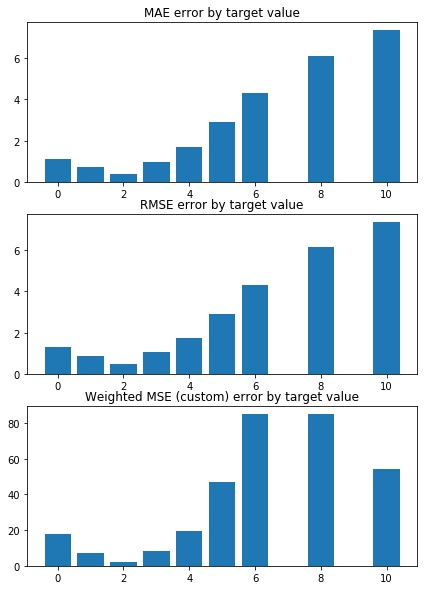

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1596697722352227 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1320263774893329 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


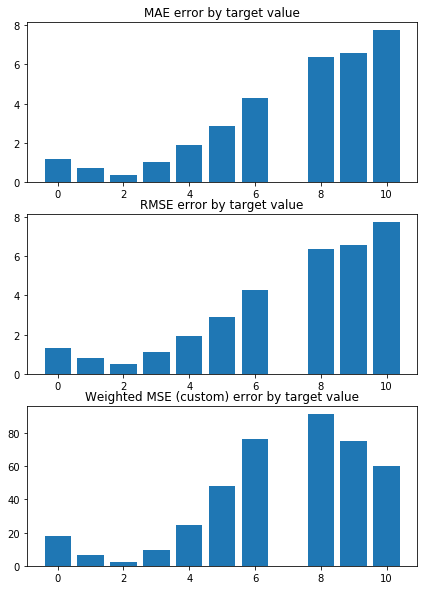

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1680983271468695 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1375791922567673 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


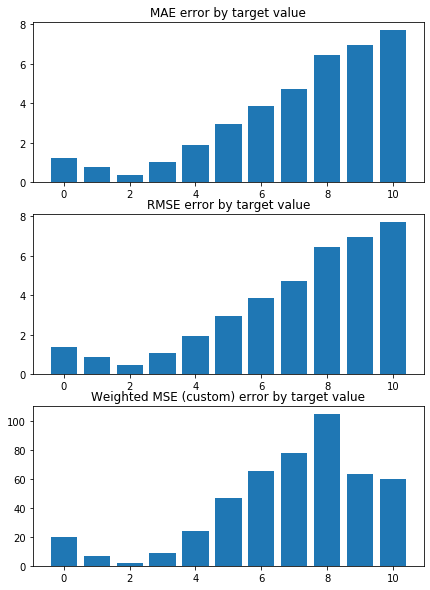

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1642452187478467 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1349892330838591 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


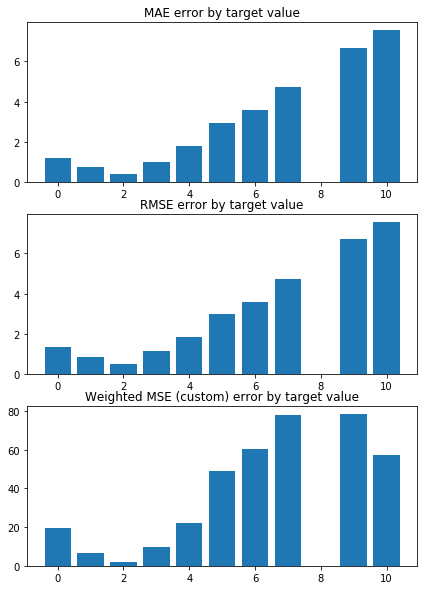

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.080753583519723 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1461680852121843 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


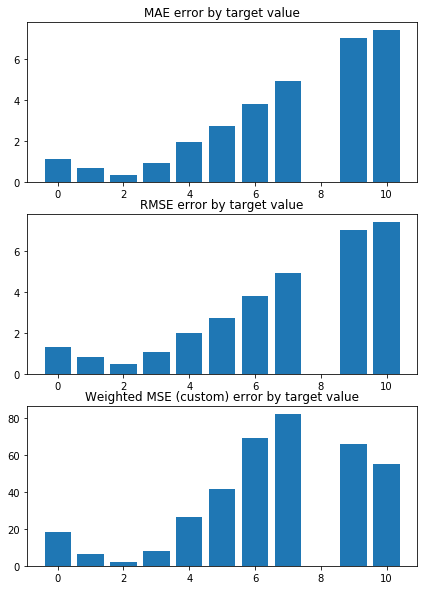

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2374428645605449 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1298436954864668 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


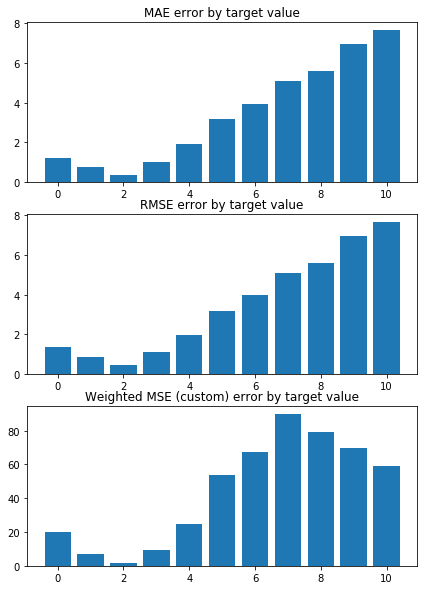

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.260491019009559 


 TRAIN PREDICTION Error
weighted_mse_train: 1.122758546354206 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


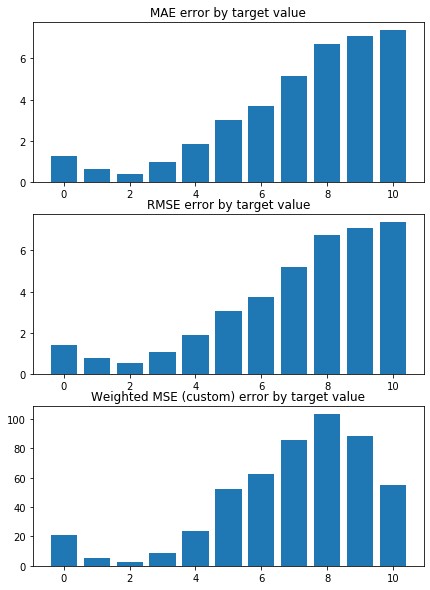

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0671003763197595 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1463285056710824 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


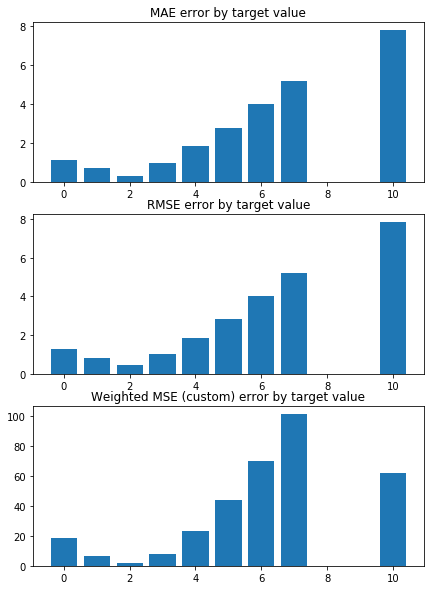

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 2.377379610146188 

Mean squared error on Test: 1.14 
 MSE mean test:  2.3800114017909277 

Root of MSE on Test: 1.07 
 1.5427285573913927 

Variance score on Test: 0.07 
 r2_test: 0.19672031404047557 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 2.38
MSE_test 2.38
MAE_train 1.06
MAE_test 1.02
r2_test 0.2
       CTCF     Chriz    Su(Hw)   H3K27ac  H3K27me3
0 -0.302623 -0.283336  0.102418  0.024554 -0.002515
1 -0.308309 -0.278150  0.098099  0.026551 -0.005817
2 -0.306289 -0.284419  0.087962  0.029370 -0.004480
3 -0.308517 -0.281938  0.108601  0.033378 -0.004233
4 -0.304394 -0.283716  0.102867  0.030490 -0.006282
5 -0.303658 -0.283230  0.112020  0.029091  0.001442
6 -0.308439 -0.279733  0.108332  0.023935 -0.001339
7 -0.305761 -0.280755  0.111002  0.027550  0.000498
8 -0.306775 -0.284477  0.105273  0.025516 -0.004796
9 -0.306345 -0.285417  0.110648  0.020314 -0.008075
wmse_mean_train, wmse_mean_test = 1.1387344970165505 1.13992480

In [114]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=3000)


model_name = 'LR+L2_alf=3000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)



wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [115]:
coefs_argsort, np.sort(coefs)

(array([[1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3]]),
 array([[-0.30262276, -0.28333584, -0.00251515,  0.02455413,  0.10241766],
        [-0.3083086 , -0.2781498 , -0.00581703,  0.02655083,  0.09809908],
        [-0.3062888 , -0.28441901, -0.00447958,  0.02937001,  0.08796249],
        [-0.30851743, -0.28193829, -0.00423292,  0.03337841,  0.1086012 ],
        [-0.30439395, -0.28371569, -0.00628186,  0.03048966,  0.10286743],
        [-0.30365804, -0.28322962,  0.00144184,  0.02909127,  0.11201999],
        [-0.30843912, -0.27973266, -0.00133919,  0.02393501,  0.10833173],
        [-0.30576125, -0.28075519,  0.00049808,  0.02755045,  0.11100233],
        [-0.30677507, -0.28447723, -0.0047962 ,  0.02551616,  0.10527288],
        [-0.30634462, -0.28541694, -0.00807485,  0.02031413,  0.11064821]

In [116]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27ac', 'H3K27me3'], dtype='object')

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS  + L2

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1402241100862236 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1334025093421876 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


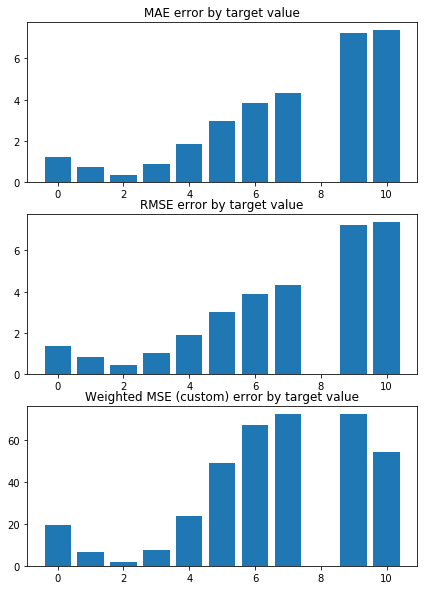

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.055911604530185 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1469427212189998 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


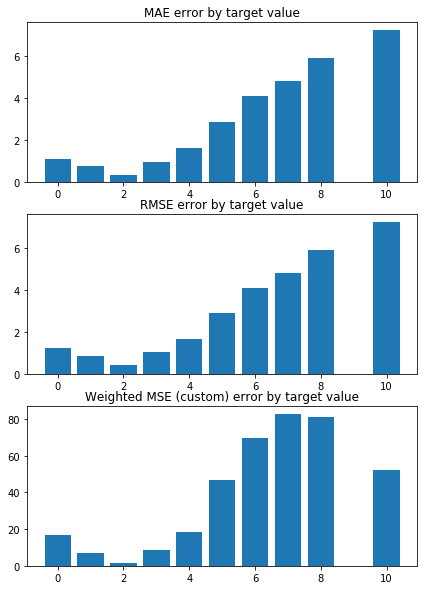

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0501120700745352 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1446082574379586 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


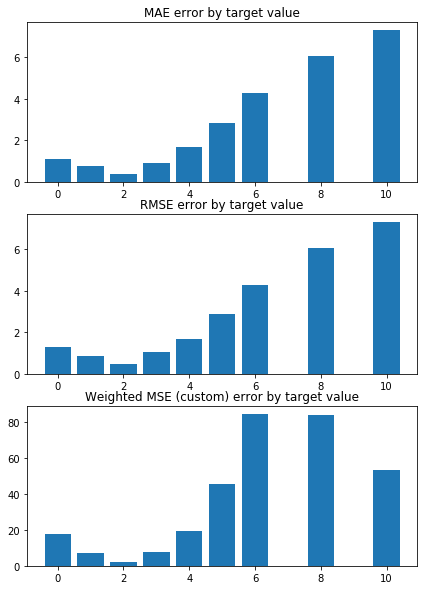

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1571648223946647 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1284068469193025 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


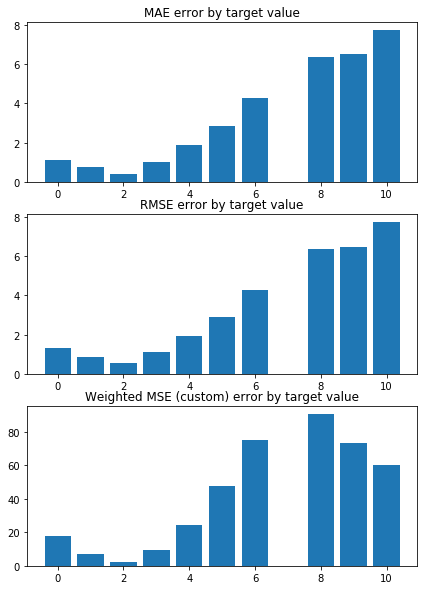

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1620640918051193 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1339439838164596 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


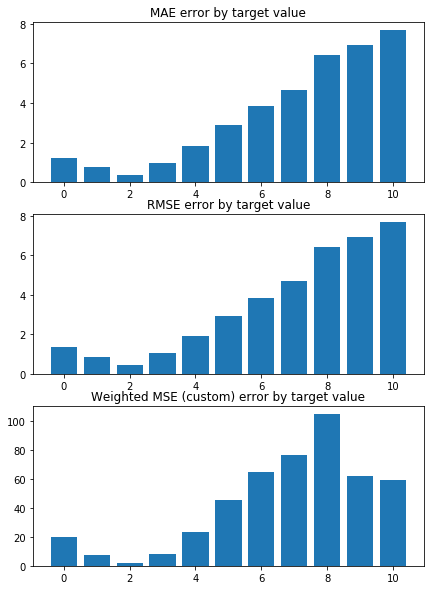

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1649864955837348 


 TRAIN PREDICTION Error
weighted_mse_train: 1.13085450074869 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


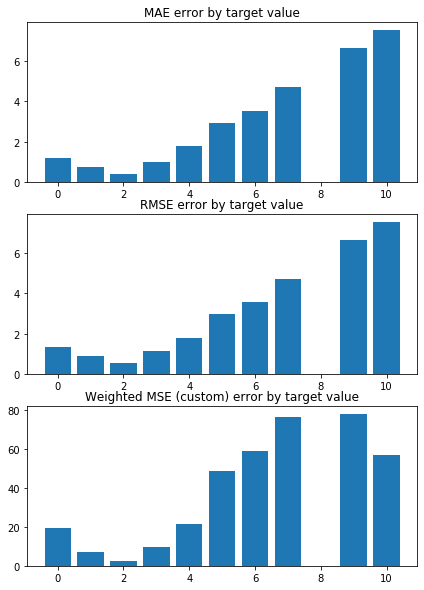

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0788541532822924 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1419407506737755 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


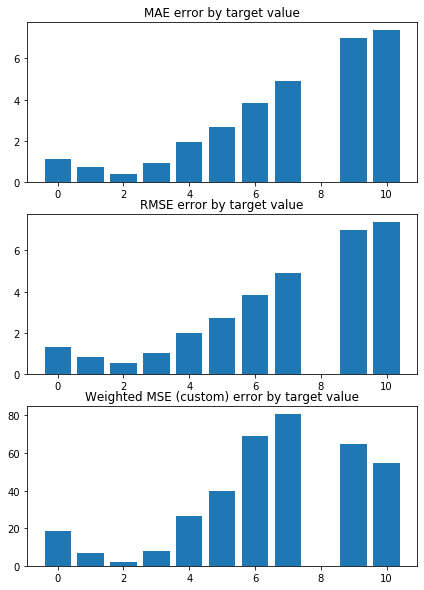

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2319095683509664 


 TRAIN PREDICTION Error
weighted_mse_train: 1.126108924052916 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


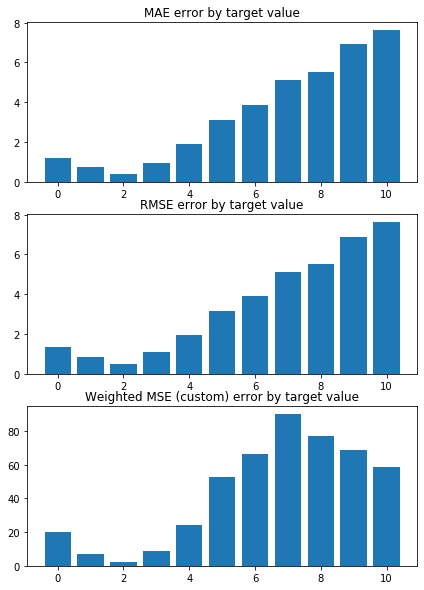

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2586819388593913 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1188259920704515 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


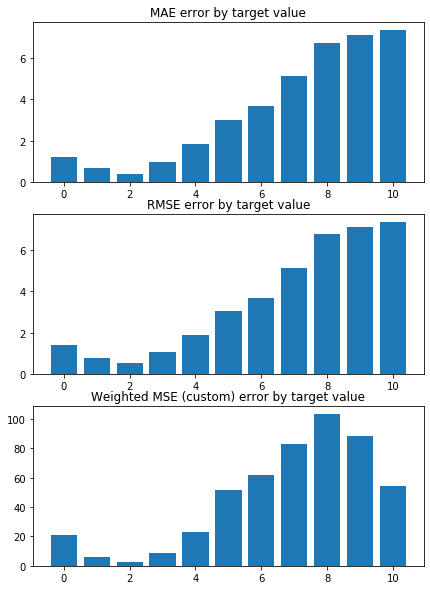

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0611934477449283 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1428828145393182 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


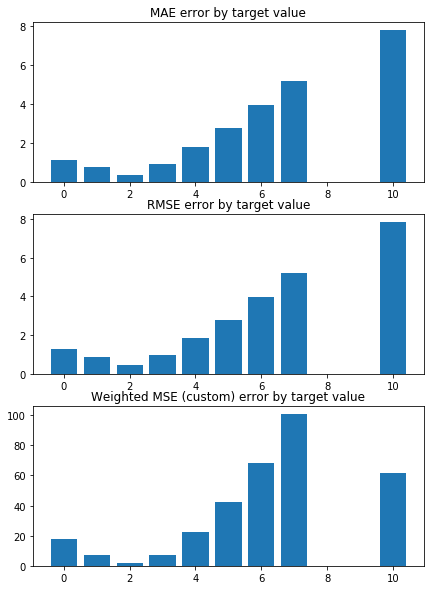

Weighted Mean squared error on Train: 1.13 
 MSE mean train: 2.360159513474842 

Mean squared error on Test: 1.14 
 MSE mean test:  2.363055266049354 

Root of MSE on Test: 1.07 
 1.5372232323411437 

Variance score on Test: 0.07 
 r2_test: 0.20252443730910835 

wMSE_train 1.13
wMSE_test 1.14
MSE_train 2.36
MSE_test 2.36
MAE_train 1.05
MAE_test 1.02
r2_test 0.2
       CTCF     Chriz    Su(Hw)  H3K27me3   H3K27ac
0 -0.334641 -0.309377  0.106318 -0.023427  0.021856
1 -0.342885 -0.302619  0.100960 -0.027198  0.024146
2 -0.338669 -0.310712  0.089969 -0.025970  0.027454
3 -0.341111 -0.306772  0.112918 -0.025516  0.031886
4 -0.336143 -0.309634  0.106578 -0.027669  0.028646
5 -0.335269 -0.308543  0.117259 -0.018856  0.027126
6 -0.341997 -0.304090  0.112951 -0.022035  0.021033
7 -0.338136 -0.305495  0.116059 -0.019611  0.025146
8 -0.338881 -0.310386  0.109159 -0.026172  0.022783
9 -0.338506 -0.311531  0.115454 -0.029710  0.017081
wmse_mean_train, wmse_mean_test = 1.1347917300820058 1.136110230

In [117]:
%%time
n_splits=10
random_state=16

X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# alpha_grid = np.arange(3000, 10000, 100)
# Create linear regression object


wmse_test = []
wmse_train = []

# for alpha in alpha_grid:
model = linear_model.Ridge(alpha=2000)

model_name = 'LR+L2_alf=2000'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_test.append(np.mean(weighted_mse_test_all))
wmse_train.append(np.mean(weighted_mse_train_all))


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [118]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."


In [119]:
wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.1347917300820058 1.136110230271204


In [120]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object')

In [121]:
su_drsc.columns[2:], coefs

(Index(['Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object'),
 array([[-0.30937673, -0.33464125,  0.10631753, -0.02342737,  0.02185626],
        [-0.30261925, -0.34288521,  0.10096013, -0.02719781,  0.02414617],
        [-0.3107123 , -0.33866894,  0.08996902, -0.0259698 ,  0.02745366],
        [-0.30677226, -0.34111054,  0.11291764, -0.02551639,  0.03188596],
        [-0.30963402, -0.33614304,  0.10657803, -0.02766928,  0.02864615],
        [-0.30854264, -0.33526928,  0.11725879, -0.01885554,  0.02712603],
        [-0.30408959, -0.34199668,  0.11295062, -0.02203518,  0.02103272],
        [-0.30549491, -0.33813567,  0.11605856, -0.01961106,  0.02514569],
        [-0.31038603, -0.33888051,  0.10915888, -0.02617191,  0.02278292],
        [-0.31153136, -0.33850624,  0.11545425, -0.02971007,  0.01708096]]))

In [122]:
coefs_argsort

array([[1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 4, 3],
       [1, 0, 2, 4, 3],
       [1, 0, 2, 4, 3],
       [1, 0, 2, 4, 3],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 4, 3],
       [1, 0, 2, 3, 4],
       [1, 0, 2, 3, 4]])

In [123]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object')

In [124]:
coefs

array([[-0.30937673, -0.33464125,  0.10631753, -0.02342737,  0.02185626],
       [-0.30261925, -0.34288521,  0.10096013, -0.02719781,  0.02414617],
       [-0.3107123 , -0.33866894,  0.08996902, -0.0259698 ,  0.02745366],
       [-0.30677226, -0.34111054,  0.11291764, -0.02551639,  0.03188596],
       [-0.30963402, -0.33614304,  0.10657803, -0.02766928,  0.02864615],
       [-0.30854264, -0.33526928,  0.11725879, -0.01885554,  0.02712603],
       [-0.30408959, -0.34199668,  0.11295062, -0.02203518,  0.02103272],
       [-0.30549491, -0.33813567,  0.11605856, -0.01961106,  0.02514569],
       [-0.31038603, -0.33888051,  0.10915888, -0.02617191,  0.02278292],
       [-0.31153136, -0.33850624,  0.11545425, -0.02971007,  0.01708096]])

In [125]:
coefs_argsort, su_drsc.columns[2:][coefs_argsort[0]], np.sort(coefs)

(array([[1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 4, 3],
        [1, 0, 2, 3, 4],
        [1, 0, 2, 3, 4]]),
 Index(['CTCF', 'Chriz', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object'),
 array([[-0.33464125, -0.30937673, -0.02342737,  0.02185626,  0.10631753],
        [-0.34288521, -0.30261925, -0.02719781,  0.02414617,  0.10096013],
        [-0.33866894, -0.3107123 , -0.0259698 ,  0.02745366,  0.08996902],
        [-0.34111054, -0.30677226, -0.02551639,  0.03188596,  0.11291764],
        [-0.33614304, -0.30963402, -0.02766928,  0.02864615,  0.10657803],
        [-0.33526928, -0.30854264, -0.01885554,  0.02712603,  0.11725879],
        [-0.34199668, -0.30408959, -0.02203518,  0.02103272,  0.11295062],
        [-0.33813567, -0.30549491, -0.01961106,  0.02514569,  0.11605856],
        [-0.33888051, -0.31038603, -0.02617191,  0.02278292,  0.10915888

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# K-fold cross Validation - RL + L1  + L2/1 

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3655185425091938 


 TRAIN PREDICTION Error
weighted_mse_train: 1.332913641736006 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


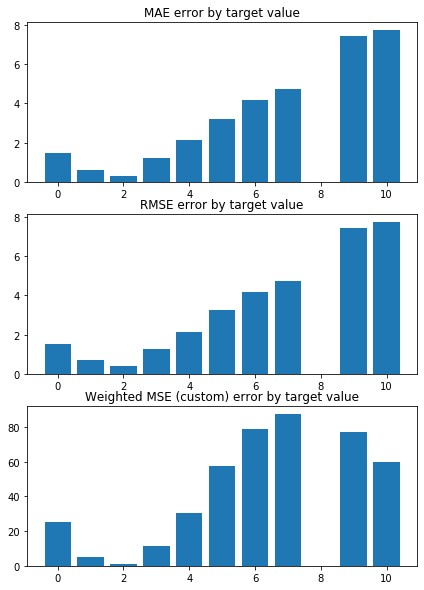

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3235735133177473 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3493510814533805 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


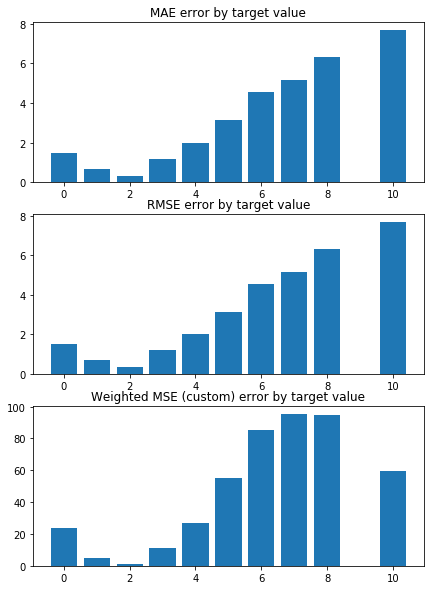

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.257687306925763 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3425425430831328 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


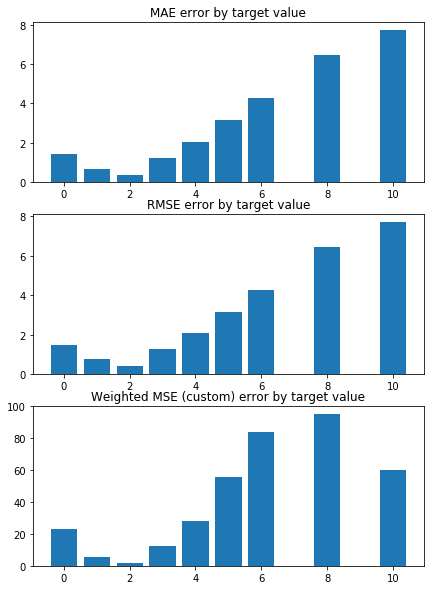

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3158545709011193 


 TRAIN PREDICTION Error
weighted_mse_train: 1.323496162221897 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


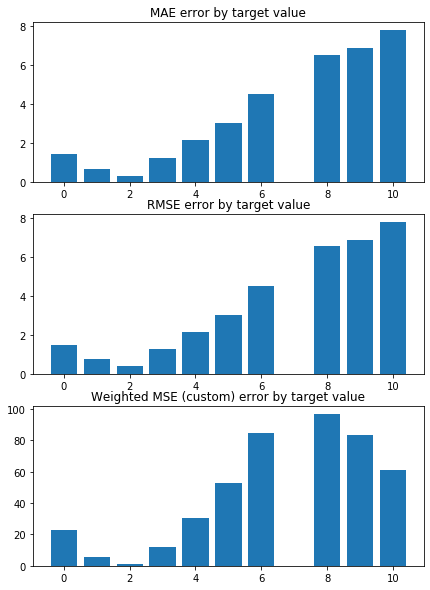

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.373049097722016 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3281558524538926 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


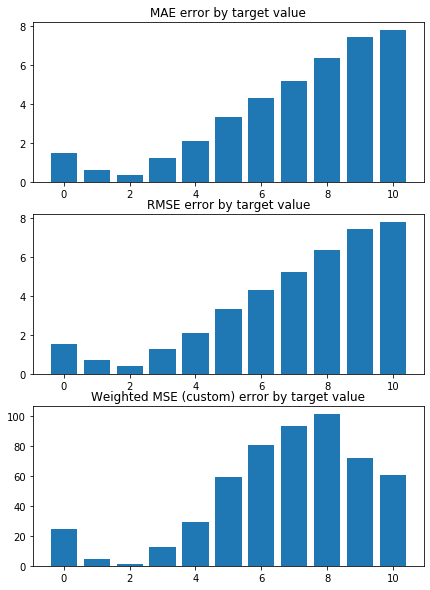

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.3024161480704104 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3313865784634356 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


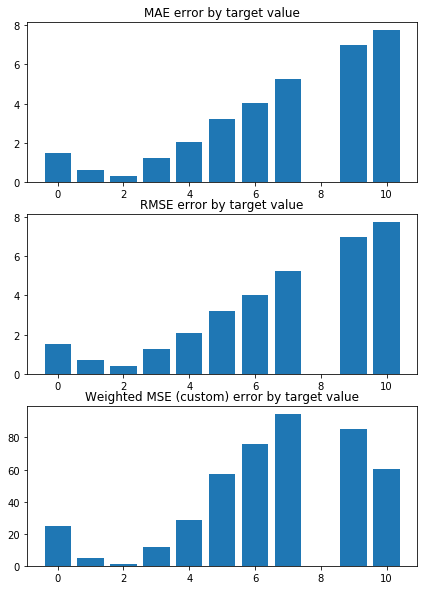

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.270149258731038 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3439093697098512 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


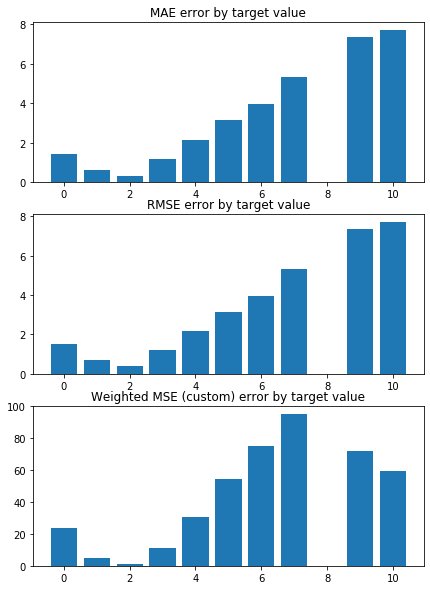

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.4246629564241042 


 TRAIN PREDICTION Error
weighted_mse_train: 1.325251905169196 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


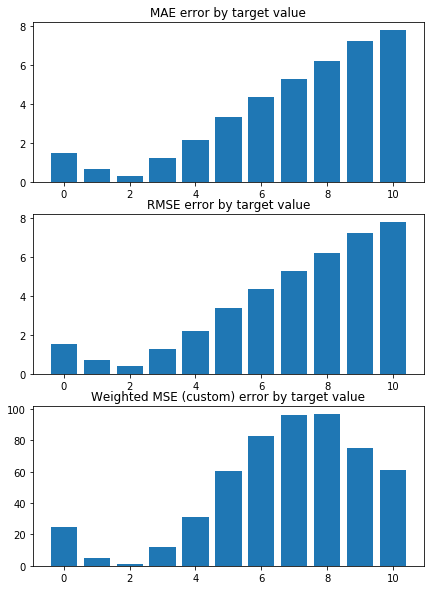

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.421444171047224 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3167772962013997 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


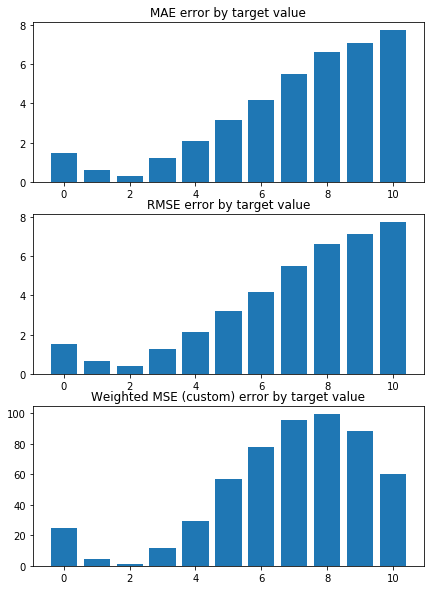

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2837346143514548 


 TRAIN PREDICTION Error
weighted_mse_train: 1.3369128561895216 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


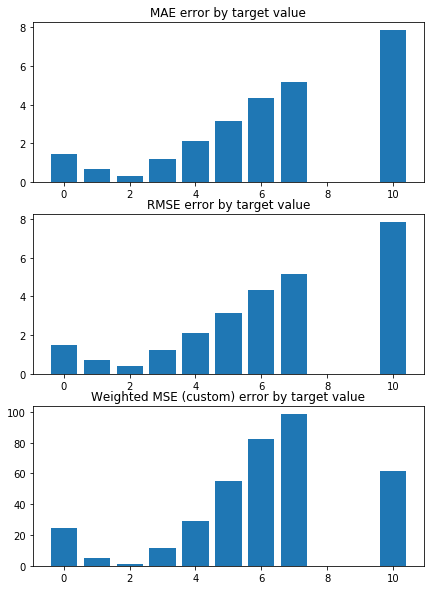

Weighted Mean squared error on Train: 1.33 
 MSE mean train: 2.6888102731558434 

Mean squared error on Test: 1.33 
 MSE mean test:  2.6900366096667447 

Root of MSE on Test: 1.15 
 1.6401331073015826 

Variance score on Test: 0.06 
 r2_test: 0.09042588943562693 

wMSE_train 1.33
wMSE_test 1.33
MSE_train 2.69
MSE_test 2.69
MAE_train 1.18
MAE_test 1.16
r2_test 0.09
       CTCF     Chriz  Su(Hw)  H3K27me3  H3K27ac
0 -0.108840 -0.092480     0.0       0.0      0.0
1 -0.111831 -0.084104     0.0       0.0      0.0
2 -0.114354 -0.090410     0.0       0.0      0.0
3 -0.122456 -0.091903     0.0       0.0      0.0
4 -0.115133 -0.092501     0.0       0.0      0.0
5 -0.114304 -0.096279     0.0       0.0      0.0
6 -0.117036 -0.088235     0.0       0.0      0.0
7 -0.116342 -0.090953     0.0       0.0      0.0
8 -0.118628 -0.092633     0.0       0.0      0.0
9 -0.114338 -0.094287     0.0       0.0      0.0
wmse_mean_train, wmse_mean_test = 1.3330697286681712 1.333809018000007


In [126]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.ElasticNet()

model_name = 'LR+L1+L2'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [127]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.333809,0.056786,1.333070,0.009656,-,test_params = testtest,2.690037,0.260949,2.688810,0.032831,"[0.09303231103330711, 0.10748110668524402, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."


In [128]:
weighted_mse_train_all, weighted_mse_test_all

(array([1.33291364, 1.34935108, 1.34254254, 1.32349616, 1.32815585,
        1.33138658, 1.34390937, 1.32525191, 1.3167773 , 1.33691286]),
 array([1.36551854, 1.32357351, 1.25768731, 1.31585457, 1.3730491 ,
        1.30241615, 1.27014926, 1.42466296, 1.42144417, 1.28373461]))

In [129]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


wmse_mean_train, wmse_mean_test = 1.3330697286681712 1.333809018000007


KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1470962949066736 


 TRAIN PREDICTION Error
weighted_mse_train: 1.136307359671942 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


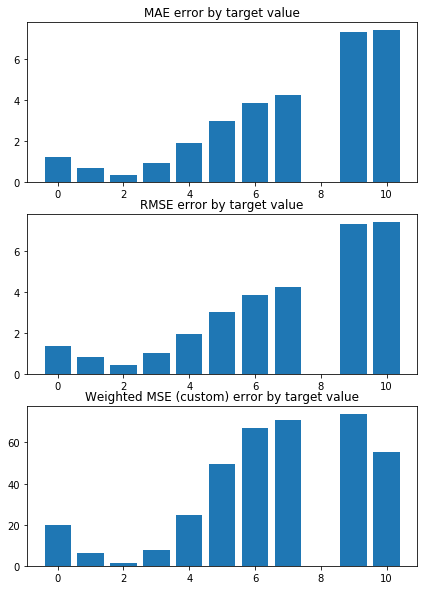

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0648436872109188 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1508543962674362 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


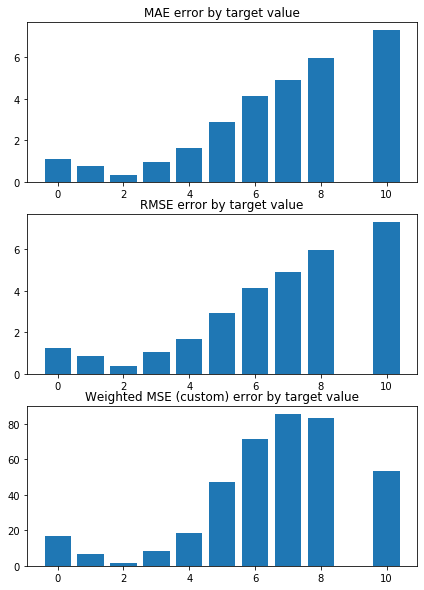

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0641527580076966 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1485208475571504 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


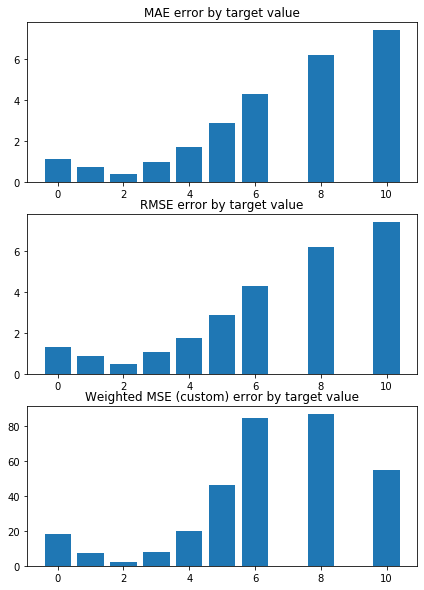

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.159240619672009 


 TRAIN PREDICTION Error
weighted_mse_train: 1.130885300128939 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


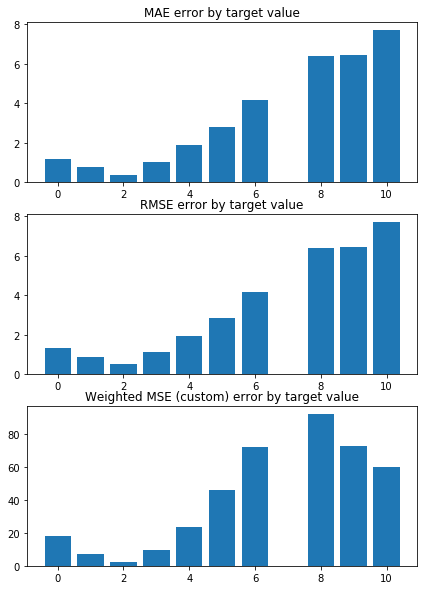

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.164739043014941 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1368286324681725 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


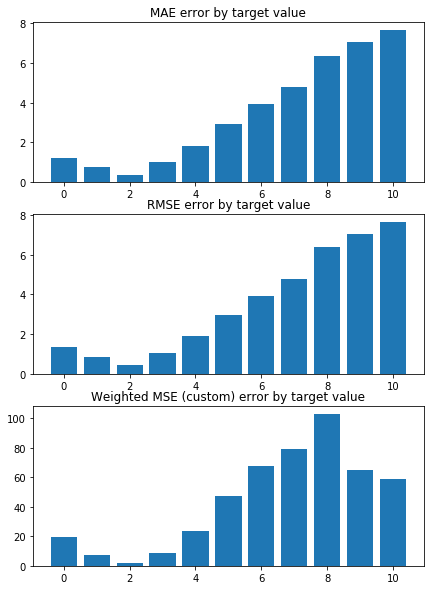

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.159666886480217 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1333903078538556 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


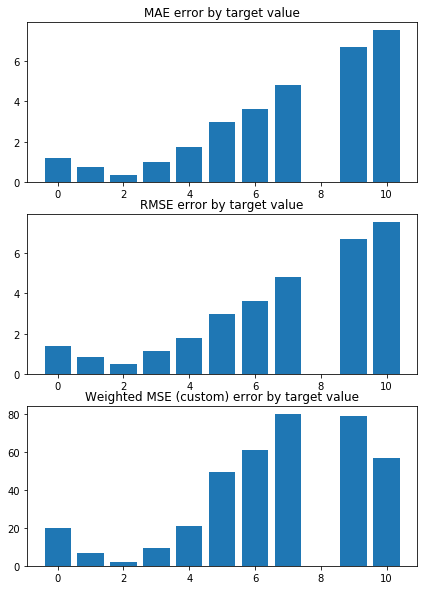

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0817789177167405 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1447006143033123 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


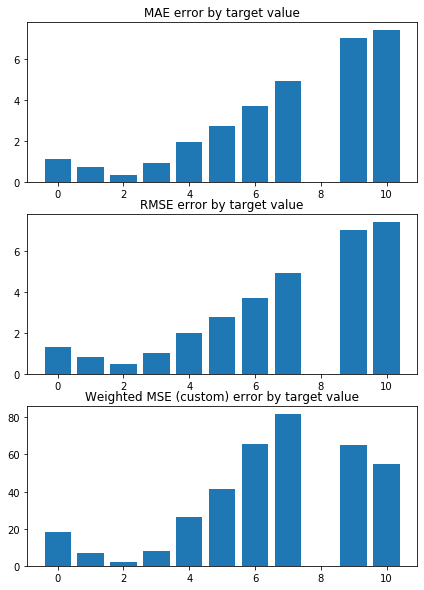

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2300451452718433 


 TRAIN PREDICTION Error
weighted_mse_train: 1.128729941795549 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


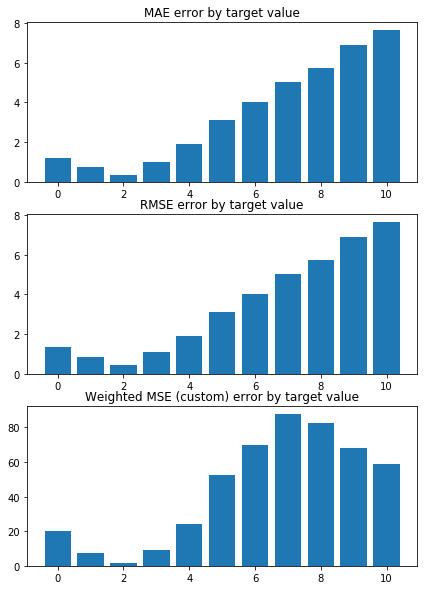

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2586116499624742 


 TRAIN PREDICTION Error
weighted_mse_train: 1.122158224619009 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


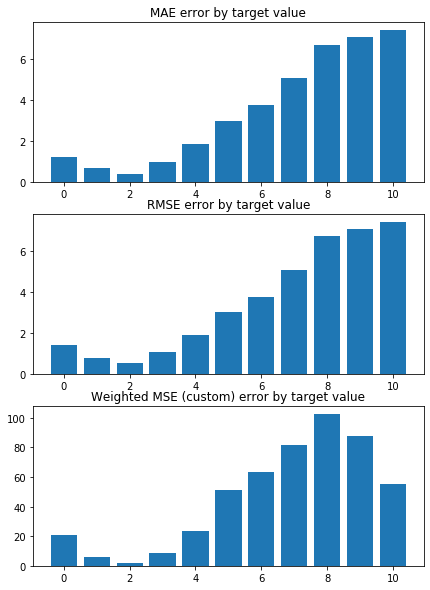

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0595419777716062 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1456377671049625 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


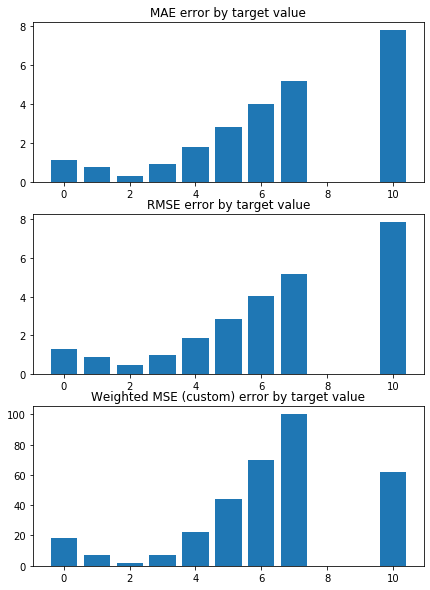

Weighted Mean squared error on Train: 1.14 
 MSE mean train: 2.3714983220588173 

Mean squared error on Test: 1.14 
 MSE mean test:  2.374322744529864 

Root of MSE on Test: 1.07 
 1.5408837543857303 

Variance score on Test: 0.07 
 r2_test: 0.1985974489020882 

wMSE_train 1.14
wMSE_test 1.14
MSE_train 2.37
MSE_test 2.37
MAE_train 1.05
MAE_test 1.02
r2_test 0.2
       CTCF     Chriz    Su(Hw)  H3K27me3  H3K27ac
0 -0.347430 -0.293856  0.043784      -0.0      0.0
1 -0.363883 -0.277790  0.039316      -0.0      0.0
2 -0.353160 -0.294313  0.023515      -0.0      0.0
3 -0.359661 -0.286352  0.054167      -0.0      0.0
4 -0.349008 -0.293236  0.045718      -0.0      0.0
5 -0.349187 -0.294257  0.057410      -0.0      0.0
6 -0.362644 -0.281151  0.052465      -0.0      0.0
7 -0.355155 -0.287193  0.057340      -0.0      0.0
8 -0.353819 -0.292168  0.048581      -0.0      0.0
9 -0.350571 -0.292906  0.056246      -0.0      0.0
wmse_mean_train, wmse_mean_test = 1.1378013391770327 1.1389716980015119


In [130]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object

alpha =  0.2 # 3000 + 0.2
l1_ratio = 0.5 # 0.000066 # 0.2 / (3000 + 0.2)

model = linear_model.ElasticNet(alpha=alpha, l1_ratio=l1_ratio, fit_intercept=True, normalize=False, precompute=False, max_iter=1000, 
                                copy_X=True, tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')


model_name = 'LR+L2_alf=.2_rat=.5'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)


wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)


In [131]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.333809,0.056786,1.333070,0.009656,-,test_params = testtest,2.690037,0.260949,2.688810,0.032831,"[0.09303231103330711, 0.10748110668524402, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.138972,0.066970,1.137801,0.008898,-,test_params = testtest,2.374323,0.286174,2.371498,0.032750,"[0.211695695257199, 0.2532780310560869, 0.2086...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."


In [132]:
print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)

wmse_mean_train, wmse_mean_test = 1.1378013391770327 1.1389716980015119


In [133]:
coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:][coefs_argsort][0])
coefs_pd.round(2)

,CTCF,Chriz,Su(Hw),H3K27me3,H3K27ac
0,-0.29,-0.35,0.04,-0.0,0.0
1,-0.28,-0.36,0.04,-0.0,0.0
2,-0.29,-0.35,0.02,-0.0,0.0
3,-0.29,-0.36,0.05,-0.0,0.0
4,-0.29,-0.35,0.05,-0.0,0.0
5,-0.29,-0.35,0.06,-0.0,0.0
6,-0.28,-0.36,0.05,-0.0,0.0
7,-0.29,-0.36,0.06,-0.0,0.0
8,-0.29,-0.35,0.05,-0.0,0.0
9,-0.29,-0.35,0.06,-0.0,0.0


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1504294394020174 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1474530001881726 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5729131802711864
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


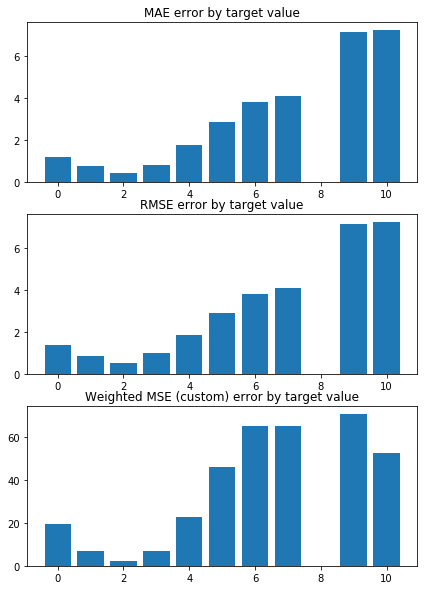

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0782543118183805 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1611155407329028 


 CONSTANT pred Error:
weighted_mse_test_const:  1.555598172469537
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


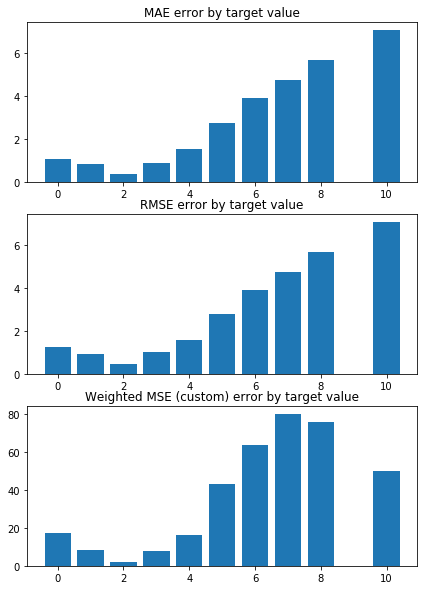

train_index= [   0    2    3 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0677171462739654 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1584859794774696 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4484520826241511
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


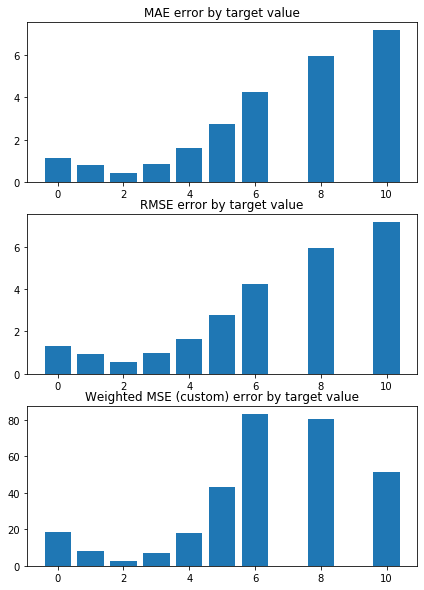

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1731761631271282 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1437958887539699 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4871218475178962
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


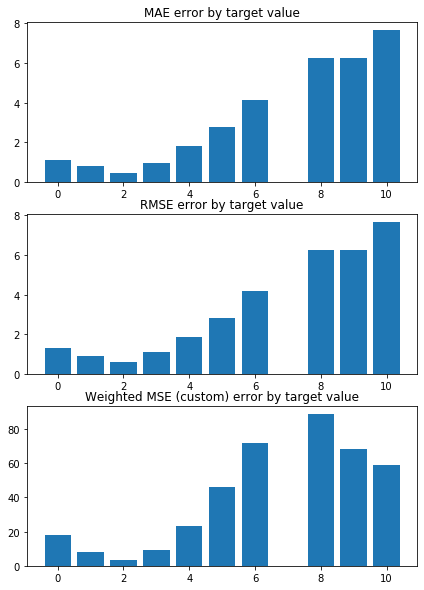

train_index= [   0    1    2 ... 5946 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.169229129661831 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1491770167028732 


 CONSTANT pred Error:
weighted_mse_test_const:  1.5691848499209409
test sizes =  595 595 595


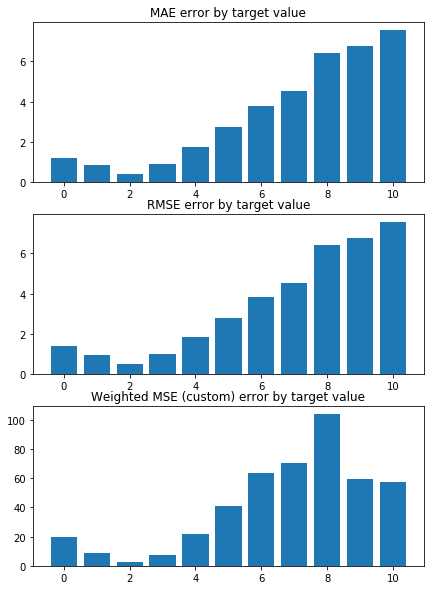

train_index= [   1    4    5 ... 5945 5947 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.1897700170464067 


 TRAIN PREDICTION Error
weighted_mse_train: 1.144002229673775 


 CONSTANT pred Error:
weighted_mse_test_const:  1.47198290491892
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


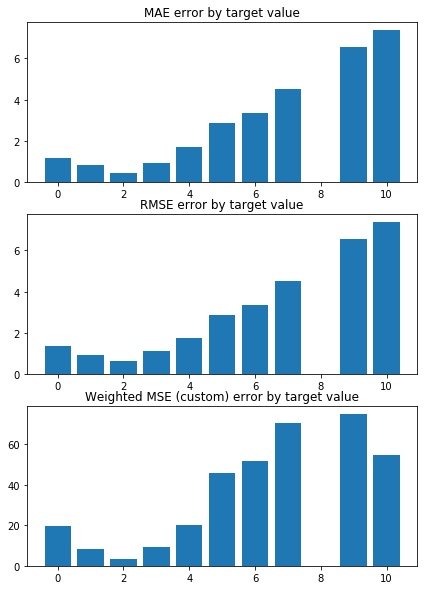

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.102058191568401 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1559393528280035 


 CONSTANT pred Error:
weighted_mse_test_const:  1.4698577154229036
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


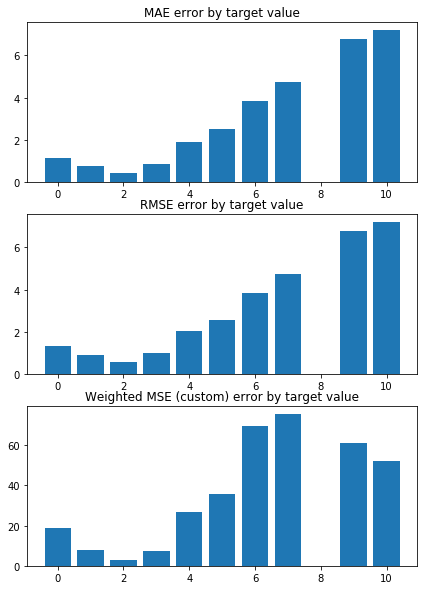

train_index= [   0    1    2 ... 5946 5947 5948]
 TEST PREDICTION Error
weighted_mse_test: 1.2364696945192495 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1409774712552483 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6258094685412205
test sizes =  595 595 595


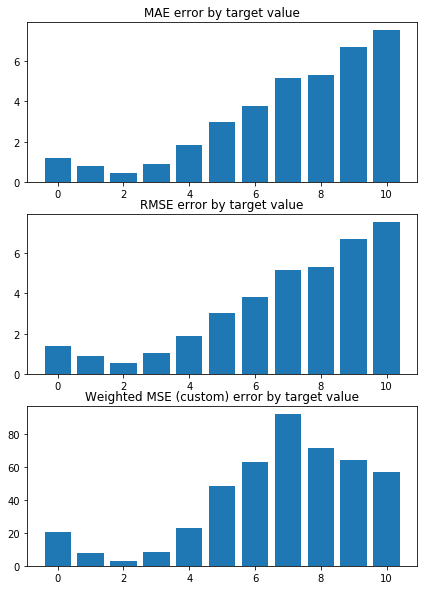

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.2778973501249657 


 TRAIN PREDICTION Error
weighted_mse_train: 1.1335948974906913 


 CONSTANT pred Error:
weighted_mse_test_const:  1.6007348104053327
test sizes =  595 595 595


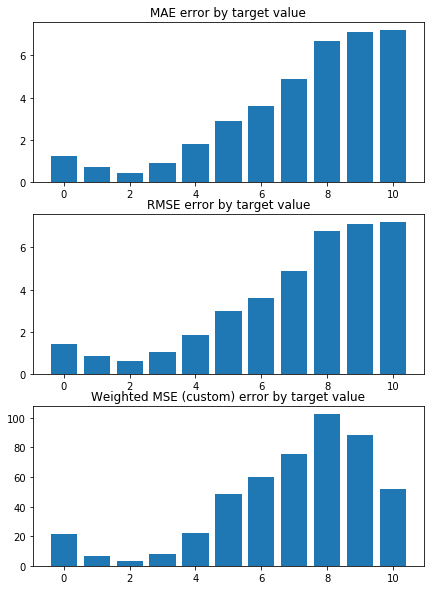

train_index= [   0    1    2 ... 5947 5948 5949]
 TEST PREDICTION Error
weighted_mse_test: 1.0695651766089531 


 TRAIN PREDICTION Error
weighted_mse_train: 1.159413956900689 


 CONSTANT pred Error:
weighted_mse_test_const:  1.496247603284074
test sizes =  595 595 595


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:34: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:36: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


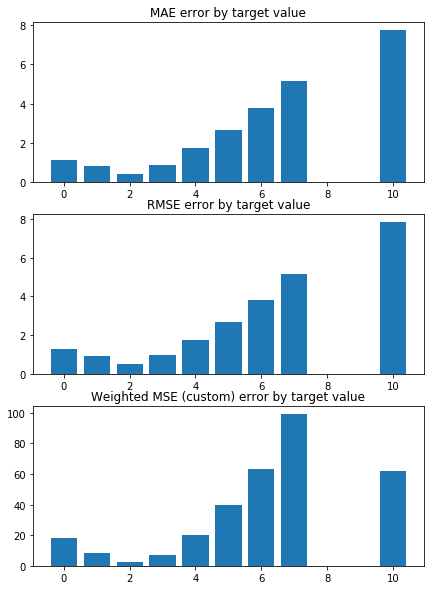

Weighted Mean squared error on Train: 1.15 
 MSE mean train: 2.336897107771123 

Mean squared error on Test: 1.15 
 MSE mean test:  2.341046326583189 

Root of MSE on Test: 1.07 
 1.5300478183975783 

Variance score on Test: 0.07 
 r2_test: 0.21002153096464132 

wMSE_train 1.15
wMSE_test 1.15
MSE_train 2.34
MSE_test 2.34
MAE_train 1.05
MAE_test 1.02
r2_test 0.21
       CTCF     Chriz  H3K27me3    Su(Hw)   H3K27ac
0 -0.450243 -0.378528 -0.120351  0.104176  0.010957
1 -0.482286 -0.351931 -0.125640  0.094882  0.014683
2 -0.454280 -0.381915 -0.125185  0.081891  0.018755
3 -0.463124 -0.366355 -0.123296  0.111936  0.025166
4 -0.449125 -0.379371 -0.125621  0.103758  0.020455
5 -0.449878 -0.373745 -0.112968  0.119382  0.018721
6 -0.473549 -0.356155 -0.118064  0.113101  0.009478
7 -0.459020 -0.364279 -0.112133  0.118205  0.015006
8 -0.454382 -0.379319 -0.125261  0.106479  0.011607
9 -0.452735 -0.382000 -0.128770  0.116150  0.004668
wmse_mean_train, wmse_mean_test = 1.1493955334003796 1.15145666

In [134]:
X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)

# Create linear regression object
model = linear_model.LinearRegression()

model_name = 'LR'
n_splits = 10
random_state = 16 
shuffle = True

lin_reg, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const, \
                results_pd = train_test_KFold(X, y, 
                                              model, model_name, results_pd,
                                              n_splits=n_splits, random_state=random_state, shuffle=shuffle)

wmse_mean_train, wmse_mean_test = np.mean(weighted_mse_train_all), np.mean(weighted_mse_test_all)

print('wmse_mean_train, wmse_mean_test =', wmse_mean_train, wmse_mean_test)



In [135]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.333809,0.056786,1.333070,0.009656,-,test_params = testtest,2.690037,0.260949,2.688810,0.032831,"[0.09303231103330711, 0.10748110668524402, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.138972,0.066970,1.137801,0.008898,-,test_params = testtest,2.374323,0.286174,2.371498,0.032750,"[0.211695695257199, 0.2532780310560869, 0.2086...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [136]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.293856,-0.347430,-0.0,0.043784,0.0
1,-0.277790,-0.363883,-0.0,0.039316,0.0
2,-0.294313,-0.353160,-0.0,0.023515,0.0
3,-0.286352,-0.359661,-0.0,0.054167,0.0
4,-0.293236,-0.349008,-0.0,0.045718,0.0
5,-0.294257,-0.349187,-0.0,0.057410,0.0
6,-0.281151,-0.362644,-0.0,0.052465,0.0
7,-0.287193,-0.355155,-0.0,0.057340,0.0
8,-0.292168,-0.353819,-0.0,0.048581,0.0
9,-0.292906,-0.350571,-0.0,0.056246,0.0


In [137]:
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0]

CTCF       -0.293856
Chriz      -0.347430
H3K27me3   -0.000000
Su(Hw)      0.043784
H3K27ac     0.000000
Name: 0, dtype: float64

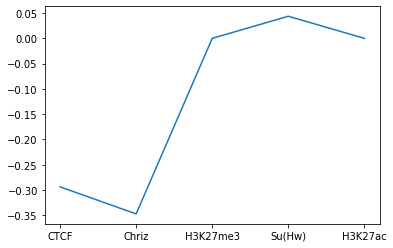

In [138]:
plt.plot(coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]].iloc[0])

# !! одинаковая приоритизация 

In [139]:
np.sort(coefs[0])

array([-0.45024319, -0.37852811, -0.12035102,  0.01095743,  0.1041758 ])

In [140]:
pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,1,0,3,2,4
1,1,0,3,2,4
2,1,0,3,2,4
3,1,0,3,2,4
4,1,0,3,2,4
5,1,0,2,3,4
6,1,0,3,2,4
7,1,0,2,3,4
8,1,0,3,2,4
9,1,0,3,2,4


In [141]:
su_drsc.columns[2:][coefs_argsort[0]]

Index(['CTCF', 'Chriz', 'H3K27me3', 'Su(Hw)', 'H3K27ac'], dtype='object')

In [142]:
coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.450243,-0.378528,-0.120351,0.104176,0.010957
1,-0.482286,-0.351931,-0.125640,0.094882,0.014683
2,-0.454280,-0.381915,-0.125185,0.081891,0.018755
3,-0.463124,-0.366355,-0.123296,0.111936,0.025166
4,-0.449125,-0.379371,-0.125621,0.103758,0.020455
5,-0.449878,-0.373745,-0.112968,0.119382,0.018721
6,-0.473549,-0.356155,-0.118064,0.113101,0.009478
7,-0.459020,-0.364279,-0.112133,0.118205,0.015006
8,-0.454382,-0.379319,-0.125261,0.106479,0.011607
9,-0.452735,-0.382000,-0.128770,0.116150,0.004668


In [143]:
coefs_df.round(2)

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.45,-0.38,-0.12,0.10,0.01
1,-0.48,-0.35,-0.13,0.09,0.01
2,-0.45,-0.38,-0.13,0.08,0.02
3,-0.46,-0.37,-0.12,0.11,0.03
4,-0.45,-0.38,-0.13,0.10,0.02
5,-0.45,-0.37,-0.11,0.12,0.02
6,-0.47,-0.36,-0.12,0.11,0.01
7,-0.46,-0.36,-0.11,0.12,0.02
8,-0.45,-0.38,-0.13,0.11,0.01
9,-0.45,-0.38,-0.13,0.12,0.00


In [144]:
# !! одинаковая приоритизация 

np.sort(coefs[0])

coefs

coefs_argsort[0]

pd.DataFrame(coefs_argsort, columns=su_drsc.columns[2:][coefs_argsort[0]])

su_drsc.columns[2:], su_drsc.columns[2:][coefs_argsort[0]]

coefs_df = pd.DataFrame(coefs, columns=su_drsc.columns[2:])[su_drsc.columns[2:][coefs_argsort[0]]]

coefs_df

coefs_df.round(2)

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.45,-0.38,-0.12,0.10,0.01
1,-0.48,-0.35,-0.13,0.09,0.01
2,-0.45,-0.38,-0.13,0.08,0.02
3,-0.46,-0.37,-0.12,0.11,0.03
4,-0.45,-0.38,-0.13,0.10,0.02
5,-0.45,-0.37,-0.11,0.12,0.02
6,-0.47,-0.36,-0.12,0.11,0.01
7,-0.46,-0.36,-0.11,0.12,0.02
8,-0.45,-0.38,-0.13,0.11,0.01
9,-0.45,-0.38,-0.13,0.12,0.00


In [145]:
coefs_df

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.450243,-0.378528,-0.120351,0.104176,0.010957
1,-0.482286,-0.351931,-0.125640,0.094882,0.014683
2,-0.454280,-0.381915,-0.125185,0.081891,0.018755
3,-0.463124,-0.366355,-0.123296,0.111936,0.025166
4,-0.449125,-0.379371,-0.125621,0.103758,0.020455
5,-0.449878,-0.373745,-0.112968,0.119382,0.018721
6,-0.473549,-0.356155,-0.118064,0.113101,0.009478
7,-0.459020,-0.364279,-0.112133,0.118205,0.015006
8,-0.454382,-0.379319,-0.125261,0.106479,0.011607
9,-0.452735,-0.382000,-0.128770,0.116150,0.004668


In [146]:
coefs_df_2 = coefs_df.round(2)
coefs_df_2

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.45,-0.38,-0.12,0.10,0.01
1,-0.48,-0.35,-0.13,0.09,0.01
2,-0.45,-0.38,-0.13,0.08,0.02
3,-0.46,-0.37,-0.12,0.11,0.03
4,-0.45,-0.38,-0.13,0.10,0.02
5,-0.45,-0.37,-0.11,0.12,0.02
6,-0.47,-0.36,-0.12,0.11,0.01
7,-0.46,-0.36,-0.11,0.12,0.02
8,-0.45,-0.38,-0.13,0.11,0.01
9,-0.45,-0.38,-0.13,0.12,0.00


In [147]:
coefs_means = pd.DataFrame ( coefs_df.mean() )
coefs_means.round(2)# .values, coefs_means.values

,0
CTCF,-0.46
Chriz,-0.37
H3K27me3,-0.12
Su(Hw),0.11
H3K27ac,0.01


In [148]:
coefs_std = pd.DataFrame (coefs_df.std())

coefs_std.round(4)

,0
CTCF,0.0111
Chriz,0.0110
H3K27me3,0.0057
Su(Hw),0.0116
H3K27ac,0.0060


In [149]:
order_df = np.argsort(np.abs(coefs_means))
priority_order = order_df.index.values

priority_order


array(['CTCF', 'Chriz', 'H3K27me3', 'Su(Hw)', 'H3K27ac'], dtype=object)

In [150]:
coefs_df_2[priority_order]

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.45,-0.38,-0.12,0.10,0.01
1,-0.48,-0.35,-0.13,0.09,0.01
2,-0.45,-0.38,-0.13,0.08,0.02
3,-0.46,-0.37,-0.12,0.11,0.03
4,-0.45,-0.38,-0.13,0.10,0.02
5,-0.45,-0.37,-0.11,0.12,0.02
6,-0.47,-0.36,-0.12,0.11,0.01
7,-0.46,-0.36,-0.11,0.12,0.02
8,-0.45,-0.38,-0.13,0.11,0.01
9,-0.45,-0.38,-0.13,0.12,0.00


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# LR RESULTS + L 

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

1 / (2 * n_samples) * ||y - Xw||^2_2 + alpha * l1_ratio * ||w||_1 + 0.5 * alpha * (1 - l1_ratio) * ||w||^2_2


$$ \frac{1}{(2  n_{samples})} ||y - Xw||^2_2
+ alpha * l1_{ratio}  ||w||_1
+ 0.5 * alpha * (1 - l1_{ratio}) ||w||^2_2 $$



$$ \frac{1}{ n\_samples} ||y - Xw||^2_2
+ \alpha ||w||_1
+ \beta ||w||^2_2 $$

$$ \frac{1}{ n\_samples} ||y - Xw||^2_2 + \alpha ||w||_1 + \beta ||w||^2_2 $$

In [151]:
def getConfIdxFrequencies(coefs_argsort, feature_names, row_lim, min_lim = 5, max_lim = 5):
    ''' 
    Get Frequencies of feature indexes in the sorted array of indexes bu the coefficient of the feature in different itterstions.
    The smallest and the biggest elements are valueable - as they give the biggest impact.
    min_lim, max_lim - limitations of the number of smallest and biggest coefficients to consider for the frequency.
    '''
    merged_coefs = np.concatenate(np.hstack([coefs_argsort[:row_lim,:min_lim], coefs_argsort[:row_lim,-max_lim:]]))

    merged_coefs = list(merged_coefs)

    featur_freq_dict =  dict((i, merged_coefs.count(i)) for i in merged_coefs)
    for key, value in  sorted(featur_freq_dict.items(), key=lambda item: (-item[1], item[0])):
        print("{}: {}".format(feature_names[key], value)) # (feature_names[key], value))
        
    return featur_freq_dict

In [152]:
feature_names = su_drsc.columns[2:]
feature_names

Index(['Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object')

In [153]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 3, max_lim = 0)

Chriz: 20
CTCF: 20
H3K27me3: 18
Su(Hw): 12
H3K27ac: 10


In [154]:
featur_freq_dict = getConfIdxFrequencies(coefs_argsort,feature_names=feature_names, row_lim=len(coefs_argsort), min_lim = 5, max_lim = 0)

Chriz: 20
CTCF: 20
Su(Hw): 20
H3K27me3: 20
H3K27ac: 20


# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONST pred

# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

# CONSTANT pred Error:

In [155]:

print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5405743402825394
weighted_mse_test_const:  1.4991984537188798


In [156]:

def train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )


        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5405743402825394
weighted_mse_test_const:  1.4991984537188798


In [157]:
#  weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

In [158]:
# weighted_mse_test_all, weighted_mse_train_all

In [159]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")
# # Explained variance score: 1 is perfect prediction
# print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error CONST std on Train : 1.15 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.15 
 wmst CONST std test 0.07 



In [160]:
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )

 CONSTANT pred Error:
weighted_mse_train_const:  1.5405743402825394
weighted_mse_test_const:  1.4991984537188798


In [161]:
def train_test_KFold_const(X, y, n_splits=5, random_state=16, shuffle=True):


    kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=shuffle)
    kf.get_n_splits(X)

    MSE_train = []
    MSE_test = []
    r2_test = []

    coefs = []
    coefs_argsort = []
    
    weighted_mse_test_all = []
    weighted_mse_train_all = []


    print(kf)  

    for train_index, test_index in kf.split(X):
        
        print('train_index=', train_index)
        
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

#         # Train the model using the training sets
#         model.fit(X_train, y_train)

#         # Make predictions using the train set
#         y_pred_train = model.predict(X_train)

#         # Make predictions using the testing set
#         y_pred = model.predict(X_test)
        

        print(" CONSTANT pred Error:" )

        const_pred = np.mean(y_train)
        const_pred_test = np.array([const_pred] * len(y_test) )
        const_pred_train = np.array([const_pred] * len(y_train) )


        # rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
        weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

        weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

        # mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

        print("weighted_mse_train_const: ", weighted_mse_train_const )

        print("weighted_mse_test_const: ", weighted_mse_test_const )


#         MSE_train.append(mean_squared_error(y_train, y_pred_train))

#         MSE_test.append(mean_squared_error(y_test, y_pred))

#         r2_test.append(r2_score(y_test, y_pred))

#         coefs.append(model.coef_)
#         coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
        
        
#         weighted_mse_test, weighted_mse_train, weighted_mse_test_const, \
#                 rmse_test, rmse_train, rmse_test_const, \
#                 mae_test,    mae_train,  mae_test_const = cout_errors_lin(X_train,  X_test,y_train, y_test, model )
            
        weighted_mse_test_all.append(weighted_mse_test_const)
        weighted_mse_train_all.append(weighted_mse_train_const)

    
    weighted_mse_test_all = np.array(weighted_mse_test_all)
    weighted_mse_train_all =  np.array(weighted_mse_train_all)



#     coefs = np.array(coefs)
#     coefs_argsort = np.array(coefs_argsort)

    # The mean squared error
    print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
          weighted_mse_train_all, "\n")

    # The mean squared error
    print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
          weighted_mse_test_all, "\n")

#     # The mean squared error
#     print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
#            np.sqrt(MSE_test), "\n")

    # Explained variance score: 1 is perfect prediction
    print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")
    
    return weighted_mse_test_all, weighted_mse_train_all, 
    
    
    
print(" CONSTANT pred Error:" )

const_pred = np.mean(y_train)
const_pred_test = np.array([const_pred] * len(y_test) )


const_pred_train = np.array([const_pred] * len(y_train) )


# rmse_test_const = rmse_cout(y_true = y_test, y_pred = const_pred_test)
weighted_mse_test_const = weighted_mse_cout(y_true = y_test, y_pred = const_pred_test)

weighted_mse_train_const = weighted_mse_cout(y_true = y_train, y_pred = const_pred_train)

# mae_test_const = mae_cout(y_true = y_test, y_pred = const_pred_test)

print("weighted_mse_train_const: ", weighted_mse_train_const )

print("weighted_mse_test_const: ", weighted_mse_test_const )





 CONSTANT pred Error:
weighted_mse_train_const:  1.5405743402825394
weighted_mse_test_const:  1.4991984537188798


In [162]:
weighted_mse_test_all, \
weighted_mse_train_all  =  train_test_KFold_const(X, 
                                                 y,
                                                 n_splits=5, 
                                                 random_state=16,
                                                 shuffle=True)


KFold(n_splits=5, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5267977315485752
weighted_mse_test_const:  1.5671122842180352
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5376470986636548
weighted_mse_test_const:  1.4643681310579366
train_index= [   1    4    5 ... 5944 5945 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5289366815751748
weighted_mse_test_const:  1.5193424102054733
train_index= [   0    1    2 ... 5946 5947 5948]
 CONSTANT pred Error:
weighted_mse_train_const:  1.532506020189629
weighted_mse_test_const:  1.5520022975693186
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5215012849816822
weighted_mse_test_const:  1.5469370823910027
Weighted Mean squared error on Train: 1.53 
 [1.52679773 1.5376471  1.52893668 1.53250602 1.52150128] 

Weighted Mean squared error on Test: 1

In [163]:
 weighted_mse_test_all, weighted_mse_train_all = train_test_KFold_const(X, y, n_splits=10, random_state=16, shuffle=True)

KFold(n_splits=10, random_state=16, shuffle=True)
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5233751150317654
weighted_mse_test_const:  1.5729131802711864
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5332283816329182
weighted_mse_test_const:  1.555598172469537
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5376290480141426
weighted_mse_test_const:  1.4484520826241511
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5286165420930318
weighted_mse_test_const:  1.4871218475178962
train_index= [   0    1    2 ... 5946 5948 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5246067463854969
weighted_mse_test_const:  1.5691848499209409
train_index= [   1    4    5 ... 5945 5947 5949]
 CONSTANT pred Error:
weighted_mse_train_const:  1.5339147139949958
weighted_mse_test_const:

In [164]:
# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      weighted_mse_train_all, "\n")

# The mean squared error
print("Weighted Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      weighted_mse_test_all, "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , weighted_mse_test_all, "\n")


Weighted Mean squared error on Train: 1.53 
 [1.52337512 1.53322838 1.53762905 1.52861654 1.52460675 1.53391471
 1.53959795 1.52207601 1.51866253 1.53323797] 

Weighted Mean squared error on Test: 1.53 
 [1.57291318 1.55559817 1.44845208 1.48712185 1.56918485 1.4719829
 1.46985772 1.62580947 1.60073481 1.4962476 ] 

Variance score on Test: 0.06 
 [1.57291318 1.55559817 1.44845208 1.48712185 1.56918485 1.4719829
 1.46985772 1.62580947 1.60073481 1.4962476 ] 



In [165]:
%%time

for train_index, test_index in kf.split(X):
    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    #         # Train the model using the training sets
    #         model.fit(X_train, y_train)

    #         # Make predictions using the train set
    #         y_pred_train = model.predict(X_train)

    #         # Make predictions using the testing set
    #         y_pred = model.predict(X_test)


    print(" CONSTANT pred Error:" )

    const_pred = np.mean(y_train)
    const_pred_test = np.array([const_pred] * len(y_test) )
    const_pred_train = np.array([const_pred] * len(y_train) )


    y_pred_train = const_pred_train
    y_pred = const_pred_test
    
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    print("Mean squared error on Train: %.2f"
          % mean_squared_error(y_train, y_pred_train))

    # The mean squared error
    print("Mean squared error on Test: %.2f"
          % mean_squared_error(y_test, y_pred))

    # The mean squared error
    print("Root of Mean squared error: %.2f"
          % np.sqrt(mean_squared_error(y_test, y_pred)))

    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.2f' % r2_score(y_test, y_pred))


    print("MAE on Train: %.2f"
          % mae_cout(y_train, y_pred_train))

    # The mean squared error
    print("MAE on Test: %.2f"
          %  mae_cout(y_test, y_pred))


train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.52
wMean squared error on Test: 1.57
Mean squared error on Train: 2.94
Mean squared error on Test: 3.09
Root of Mean squared error: 1.76
Variance score: -0.00
MAE on Train: 1.26
MAE on Test: 1.28
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.53
wMean squared error on Test: 1.56
Mean squared error on Train: 2.98
Mean squared error on Test: 2.76
Root of Mean squared error: 1.66
Variance score: -0.00
MAE on Train: 1.27
MAE on Test: 1.25
train_index= [   0    2    3 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.54
wMean squared error on Test: 1.45
Mean squared error on Train: 2.95
Mean squared error on Test: 2.98
Root of Mean squared error: 1.73
Variance score: -0.00
MAE on Train: 1.27
MAE on Test: 1.26
train_index= [   0    1    2 ... 5947 5948 5949]
 CONSTANT pred Error:
wMean squared error on Train: 1.

In [166]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 1.53 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.53 
 wmst CONST std test 0.06 



# L1 Lasso regulization

In [167]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.2)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

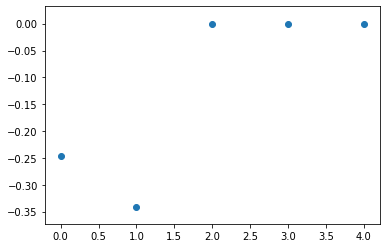

In [168]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [169]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index(['Chriz', 'CTCF'], dtype='object')

In [170]:
lin_reg_l1.coef_

array([-0.2463934 , -0.34053643,  0.        ,  0.        ,  0.        ])

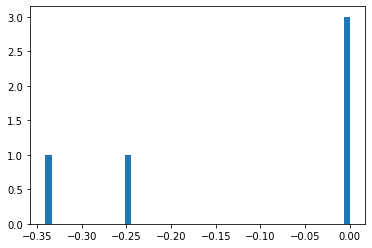

In [171]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

In [172]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape 
# Create linear regression object
lin_reg_l1 = linear_model.Lasso(alpha=0.8)

# Train the model using the training sets
lin_reg_l1.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = lin_reg_l1.predict(X_test)

Коэффициенты

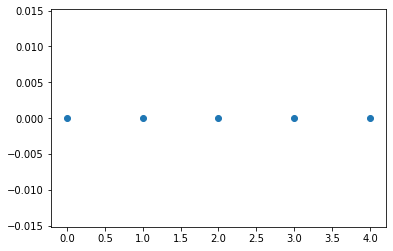

In [173]:
# plt.plot(lin_reg_l1.coef_)
plt.scatter( np.arange(len(lin_reg_l1.coef_)) , lin_reg_l1.coef_)


plt.show()

In [174]:
su_drsc.columns[2:][lin_reg_l1.coef_ < 0]

Index([], dtype='object')

In [175]:
lin_reg_l1.coef_

array([-0., -0.,  0.,  0.,  0.])

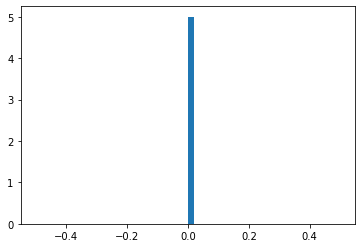

In [176]:
plt.hist(lin_reg_l1.coef_, bins=50)
plt.show()

# Gradient Boosting Regressor

In [177]:
%%time

import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score

from sklearn import ensemble

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.07
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.97
wMean squared error on Test: 0.97
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.01
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.14
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.96
wMean squared error on Test: 1.06
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.05
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.96
wMean squared error on Test: 0.96
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.13
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [178]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.95 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.05 
 wmst CONST std test 0.08 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [179]:
params = {'n_estimators': 100, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    
#     y_pred_train = const_pred_train
#     y_pred = const_pred_test

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))

    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))

    
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 1.05
wMean squared error on Test: 1.12
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 1.06
wMean squared error on Test: 1.04
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 1.05
wMean squared error on Test: 1.03
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 1.04
wMean squared error on Test: 1.12
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 1.04
wMean squared error on Test: 1.10
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 1.05
wMean squared error on Test: 1.06
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 1.05
wMean squared error on Test: 1.00
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 1.04
wMean squared error on Test: 1.17
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

,CTCF,Chriz,H3K27me3,Su(Hw),H3K27ac
0,-0.452735,-0.382,-0.12877,0.11615,0.004668
1,-0.452735,-0.382,-0.12877,0.11615,0.004668
2,-0.452735,-0.382,-0.12877,0.11615,0.004668
3,-0.452735,-0.382,-0.12877,0.11615,0.004668
4,-0.452735,-0.382,-0.12877,0.11615,0.004668
5,-0.452735,-0.382,-0.12877,0.11615,0.004668
6,-0.452735,-0.382,-0.12877,0.11615,0.004668
7,-0.452735,-0.382,-0.12877,0.11615,0.004668
8,-0.452735,-0.382,-0.12877,0.11615,0.004668
9,-0.452735,-0.382,-0.12877,0.11615,0.004668


In [180]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")

Weighted Mean squared error CONST std on Train : 1.05 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.09 
 wmst CONST std test 0.07 



In [181]:
%%time

params = {'n_estimators': 250, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}


X, y = data_scaled_clean.values, target.values  # np.log(0.01 + target)  #  data.drop(["bin_id"], axis=1), target.drop(["bin_id"], axis=1)


kf = KFold(n_splits=n_splits, random_state=random_state, shuffle=True)
kf.get_n_splits(X)

MSE_train = []
MSE_test = []
MAE_train = []
MAE_test = []
r2_test = []

coefs = []
coefs_argsort = []

weighted_mse_test_all = []
weighted_mse_train_all = []

for train_index, test_index in kf.split(X):

    print('train_index=', train_index)

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    gr_boost_300 = ensemble.GradientBoostingRegressor(**params)

    # Train the model using the training sets
    gr_boost_300.fit(X_train, y_train)

    # Make predictions using the testing set
    y_pred = gr_boost_300.predict(X_test)

    # Make predictions using the testing set
    y_pred_train = gr_boost_300.predict(X_train)

    MSE_train.append(mean_squared_error(y_train, y_pred_train))
    MSE_test.append(mean_squared_error(y_test, y_pred))

    MAE_train.append(mae_cout(y_true = y_train, y_pred = y_pred_train))
    MAE_test.append(mae_cout(y_true = y_test, y_pred = y_pred))

    r2_test.append(r2_score(y_test, y_pred))

    coefs.append(model.coef_)
    coefs_argsort.append(np.argsort(-np.abs(model.coef_)))
    
    print("wMean squared error on Train: %.2f"
          % weighted_mse_cout(y_train, y_pred_train))

    # The mean squared error
    print("wMean squared error on Test: %.2f"
          %  weighted_mse_cout(y_test, y_pred))



    weighted_mse_test_all.append(weighted_mse_cout(y_test, y_pred))
    weighted_mse_train_all.append(weighted_mse_cout(y_train, y_pred_train))
    

weighted_mse_test_all = np.array(weighted_mse_test_all)
weighted_mse_train_all =  np.array(weighted_mse_train_all)

coefs = np.array(coefs)
coefs_argsort = np.array(coefs_argsort)

# The mean squared error
print("Weighted Mean squared error on Train: %.2f" % np.mean(weighted_mse_train_all), "\n",
      MSE_train,  "\n")

# The mean squared error
print("Mean squared error on Test: %.2f" % np.mean(weighted_mse_test_all), "\n",
      MSE_test, "\n")

# The mean squared error
print("Root of Mean squared error: %.2f" % np.mean(np.sqrt(weighted_mse_test_all)), "\n",
       np.sqrt(MSE_test), "\n")

# Explained variance score: 1 is perfect prediction
print("Variance score on Test: %.2f" % np.std(weighted_mse_test_all), "\n" , r2_test, "\n")

model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
            weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
            rmse_test, rmse_train, rmse_test_const, \
            MAE_test,    MAE_train,  mae_test_const
print_metrices(model, MSE_train, MSE_test, r2_test, coefs, coefs_argsort, kf, \
                weighted_mse_test_all, weighted_mse_train_all, weighted_mse_test_const, \
                rmse_test, rmse_train, rmse_test_const, \
                mae_test,    mae_train,  mae_test_const)

coefs_pd = pd.DataFrame(coefs, columns=su_drsc.columns[2:])
coefs_pd[su_drsc.columns[2:][coefs_argsort[0]]]

# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.07
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.97
wMean squared error on Test: 0.97
train_index= [   0    2    3 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.01
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.14
train_index= [   0    1    2 ... 5946 5948 5949]
wMean squared error on Train: 0.96
wMean squared error on Test: 1.06
train_index= [   1    4    5 ... 5945 5947 5949]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.05
train_index= [   0    1    2 ... 5947 5948 5949]
wMean squared error on Train: 0.96
wMean squared error on Test: 0.96
train_index= [   0    1    2 ... 5946 5947 5948]
wMean squared error on Train: 0.95
wMean squared error on Test: 1.13
train_index= [   0    1    2 ... 5947 5948 5949]
wMean s

In [182]:
# The mean squared error
print("Weighted Mean squared error CONST std on Train : %.2f" % np.mean(weighted_mse_train_all), 
      "\n wmst CONST std train %.2f" % np.std(weighted_mse_train_all), "\n")

# The mean squared error
print("Weighted Mean squared error  CONST std on Test: %.2f" % np.mean(weighted_mse_test_all),
      "\n wmst CONST std test %.2f" % np.std(weighted_mse_test_all), "\n")


Weighted Mean squared error CONST std on Train : 0.95 
 wmst CONST std train 0.01 

Weighted Mean squared error  CONST std on Test: 1.05 
 wmst CONST std test 0.08 



# GB 250 TRAIN 0.9+0.01
# GB 250 TEST   1.07+0.06

In [183]:
res_dict = {
        'model_name': 'GB_250',
        'wMSE_test_mean': np.mean(weighted_mse_test_all), 
        'wMSE_test_std':  np.std(weighted_mse_test_all), 
        'wMSE_train_mean': np.mean(weighted_mse_train_all), 
        'wMSE_train_std': np.std(weighted_mse_train_all),
        'comments': '-', 
        'params': 'test_params = testtest',
        
        'MSE_test_mean': np.mean(MSE_test), 
        'MSE_test_std': np.std(MSE_test), 
        'MSE_train_mean': np.mean(MSE_train), 
        'MSE_train_std': np.std(MSE_train),
        'r2_test': r2_test,
        
        'n_splits': n_splits,
        'model': model,
    }

results_pd = results_pd.append(res_dict, ignore_index=True)
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.333809,0.056786,1.333070,0.009656,-,test_params = testtest,2.690037,0.260949,2.688810,0.032831,"[0.09303231103330711, 0.10748110668524402, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.138972,0.066970,1.137801,0.008898,-,test_params = testtest,2.374323,0.286174,2.371498,0.032750,"[0.211695695257199, 0.2532780310560869, 0.2086...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,1.050850,0.076965,0.954448,0.008410,-,test_params = testtest,2.181828,0.338114,1.944162,0.037145,"[0.26635053458004054, 0.34891939476346456, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


# Results

In [184]:
results_pd

,model_name,wMSE_test_mean,wMSE_test_std,wMSE_train_mean,wMSE_train_std,comments,params,MSE_test_mean,MSE_test_std,MSE_train_mean,MSE_train_std,r2_test,n_splits,model
0,LR+L1_no_outliers,1.023444,0.044103,1.021259,0.013462,-,test_params = testtest,1.449352,0.091796,1.446167,0.022822,"[0.25763547571480416, 0.24631172076980057, 0.2...",5,"LinearRegression(copy_X=True, fit_intercept=Tr..."
1,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
2,LR+L1,1.529790,0.059013,1.529494,0.006710,-,test_params = testtest,2.957657,0.250348,2.957027,0.027812,"[-0.0001539722018664147, -0.004334572980854823...",10,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr..."
3,LR+L1_alf=0.2_spt=10,1.152965,0.064475,1.152390,0.008560,-,test_params = testtest,2.405260,0.281188,2.404171,0.032167,"[0.19870162330544316, 0.23592121954913758, 0.1...",10,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr..."
4,LR+L2_alf=3000,1.139925,0.069431,1.138734,0.008773,-,test_params = testtest,2.380011,0.290230,2.377380,0.032763,"[0.2107568398073697, 0.25482829828300735, 0.21...",10,"Ridge(alpha=3000, copy_X=True, fit_intercept=T..."
5,LR+L2_alf=2000,1.136110,0.069919,1.134792,0.008659,-,test_params = testtest,2.363055,0.291724,2.360160,0.032697,"[0.2177308108476772, 0.26264426971157706, 0.22...",10,"Ridge(alpha=2000, copy_X=True, fit_intercept=T..."
6,LR+L1+L2,1.333809,0.056786,1.333070,0.009656,-,test_params = testtest,2.690037,0.260949,2.688810,0.032831,"[0.09303231103330711, 0.10748110668524402, 0.0...",10,"ElasticNet(alpha=1.0, copy_X=True, fit_interce..."
7,LR+L2_alf=.2_rat=.5,1.138972,0.066970,1.137801,0.008898,-,test_params = testtest,2.374323,0.286174,2.371498,0.032750,"[0.211695695257199, 0.2532780310560869, 0.2086...",10,"ElasticNet(alpha=0.2, copy_X=True, fit_interce..."
8,LR,1.151457,0.068548,1.149396,0.008649,-,test_params = testtest,2.341046,0.292483,2.336897,0.032506,"[0.22859482394923236, 0.2702488691646694, 0.23...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."
9,GB_250,1.050850,0.076965,0.954448,0.008410,-,test_params = testtest,2.181828,0.338114,1.944162,0.037145,"[0.26635053458004054, 0.34891939476346456, 0.2...",10,"LinearRegression(copy_X=True, fit_intercept=Tr..."


In [185]:
data.columns.shape, data.columns

((5,),
 Index(['Chriz', 'CTCF', 'Su(Hw)', 'H3K27me3', 'H3K27ac'], dtype='object'))